Santiago Muñoz Correa

Nicolás Rincón Sánchez

# Punto 1 - Red Convolucional

### Definición de librerías y parámetros

Para trabajar con la red neuronal convolucional, se utiliza el Framework Tensorflow, junto con las librerías Numpy y MatPlotLib.

In [ ]:
import tensorflow as tf

import numpy as np
import matplotlib.pyplot as plt
import math

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image

Se definieron como hiperparámetros del modelo:


*   **Tamaño de lote:** 32
*   **Número de clases:** 2 (Corresponden a los Niveles 1 y 8)
*   **Épocas de Entrenamiento:** 60
*   **Tamaño de la imagen de entrada:** (32,32,3)

De esta última, vale la pena precisar que los dos primeros valores de la tupla corresponden al tamaño de la imagen preprocesada que ingresa a la red en la primera capa (32x32) y el tercer valor corresponde a la cantidad de canales de procesamiento. Es decir, en cuántas subimágenes se descompone para realizar el proceso de convolución. En este caso, dicho valor es 3 pues las imágenes de los niveles están a color. Cada canal representa los tonos de color de la escala RGB que componen a la imagen.



In [ ]:
# Hiperparámetros
batch_size = 32
num_classes = 2
epochs = 60
input_shape = (32, 32, 3)
clases = ["Nivel 1", "Nivel 8"]

Se utiliza un subconjunto de datos del fichero "Nivel 1_Test" y "Nivel 8_Test" pertenencientes al conjunto de datos obtenidos desde el repositorio. Como cada uno de estos ficheros contiene aproximadamente 2000 imágenes (específicamente 1805 para el Nivel 1 y 1795 para el Nivel 8), se toma un porcentaje de estas.

Se decidió considerar un total de 1515 imágenes como datos de entrenamiento. Adicionalmente, se tomaron 361 y 360 imágenes para realizar la verificación del funcionamiento de la red.

In [ ]:
# Generar el conjunto de datos de entrenamiento y de prueba
train = ImageDataGenerator(rescale=1/255)
test = ImageDataGenerator(rescale=1/255)

train_dataset = train.flow_from_directory("/content/train/",
                                          target_size = (32,32),
                                          batch_size = 4,
                                          class_mode = "binary")

test_dataset = test.flow_from_directory("/content/test",
                                          target_size = (32,32),
                                          batch_size = 100,
                                          class_mode = "binary")

Found 1515 images belonging to 2 classes.
Found 721 images belonging to 2 classes.


In [ ]:
train_dataset.class_indices

{'nivel1': 0, 'nivel8': 1}

Se utiliza el patrón de capas Convolucional-Pooling. Se diseña una red de 7 capas. Se compone de dos capas Conv2D, MaxPooling, seguidas de una capa Flatten, una capa Dense de 512 neuronas y una capa Dense de 1 neurona de salida.

La elección de este diseño se debe a que, al incrementar exponencialmente en base 2 la cantidad de neuronas por capa, se garantiza que el proceso de convolución detecte cada vez detalles más pequeños dentro de las imágenes de entrenamiento y de prueba. De esta manera, al mejorar la percepción de detalles facilita la distinción más precisa de las imágenes de cada nivel.

La capa densa y la capa Flatten se colocan para servir de intermediarias entre las capas de convolución y la capa de salida. Finalmente, esta se deja con sólo una neurona para converger la información en un único valor escalar en lugar de un vector. Así pues, permite obtener sólo el resultado de procesamiento de mayor probabilidad para cada imagen que ingresa.

In [ ]:
# Definir el modelo convolucional
modelo = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), input_shape=input_shape, activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=512, activation='relu'),
    tf.keras.layers.Dense(units=1, activation='sigmoid')
])

In [ ]:
modelo.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 2, 2, 128)        0

### Generación, compilación y entrenamiento del modelo

El primer paso consiste en compilar el modelo de la red neuronal. Para este fin, se utiliza el Optimizador Keras "Adam" y se define una función de pérdida de tipo "binary_crossentropy". Esta función es apropiada para redes neuronales de clasificación binaria, como la que se está creando en este caso. Como sólo se tienen dos clases específicas (Nivel 1 y Nivel 8), la red debe ser entrenada para distinción binaria y la pérdida (o error) también debe serlo. Finalmente, la métrica predilecta de entrenamiento es "Accuracy", por lo cual lo que se busca que haga la red es que sea precisa.

In [ ]:
#Compilar el modelo
modelo.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=['accuracy']
)

El segundo paso consiste en entrenar la red neuronal empleando el conjunto de datos de Entrenamiento y la cantidad de épocas predifinidas. Adicionalmente, se toman 10 pasos por época, que corresponde a la cantidad de divisiones en las que se separa cada iteración del proceso.

In [ ]:
#Realizar el entrenamiento
historial = modelo.fit(
    train_dataset,
    epochs=epochs,
    steps_per_epoch=math.ceil(10)
)

Epoch 1/60
10/10 [==============================] - 13s 13ms/step - loss: 0.6931 - accuracy: 0.5250
Epoch 2/60
10/10 [==============================] - 0s 12ms/step - loss: 0.6361 - accuracy: 0.5250
Epoch 3/60
10/10 [==============================] - 0s 13ms/step - loss: 0.6002 - accuracy: 0.6250
Epoch 4/60
10/10 [==============================] - 0s 13ms/step - loss: 0.5431 - accuracy: 0.7000
Epoch 5/60
10/10 [==============================] - 0s 11ms/step - loss: 0.5513 - accuracy: 0.6750
Epoch 6/60
10/10 [==============================] - 0s 8ms/step - loss: 0.4190 - accuracy: 0.8500
Epoch 7/60
10/10 [==============================] - 0s 8ms/step - loss: 0.4207 - accuracy: 0.7750
Epoch 8/60
10/10 [==============================] - 0s 8ms/step - loss: 0.6062 - accuracy: 0.6750
Epoch 9/60
10/10 [==============================] - 0s 8ms/step - loss: 0.4597 - accuracy: 0.8000
Epoch 10/60
10/10 [==============================] - 0s 8ms/step - loss: 0.3918 - accuracy: 0.8250
Epoch 11/60
1

Se grafica la función de pérdida. En esta se puede apreciar que, a medida que progresan las épocas, se tiene una tendencia a que la magnitud de pérdida (o probabilidad de error) se reduzca. Cerca del final del entrenamiento, existen algunas épocas en las cuales el error es casi nulo y, al mismo tiempo, la precisión es cercana al 100%. En la iteración 60, se llega a una pérdida de 0.0682 y una precisión de 0.9750.

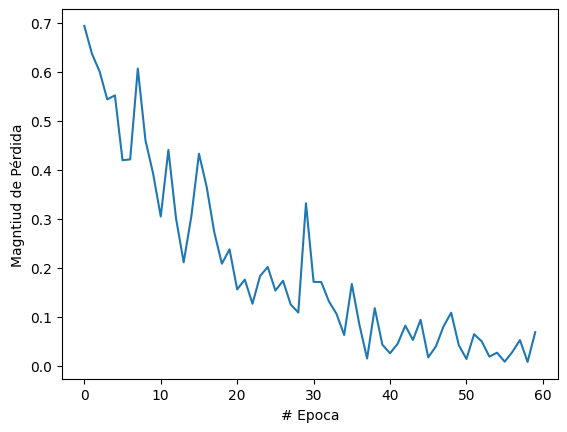

In [ ]:
plt.xlabel("# Epoca")
plt.ylabel("Magntiud de Pérdida")
plt.plot(historial.history["loss"])

### Verificación de las predicciones de la red neuronal

Para verificar el funcionamiento de la red, se toma el conjunto de datos de prueba. Convenientemente, este fue manualmente clasificado entre Nivel 1 y Nivel 8. De esta manera, se ejecuta para todas las fotos del conjunto de prueba (las cuales nunca han sido observadas por la red antes de este paso).

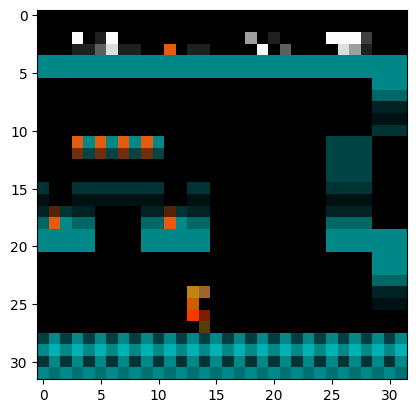

1/1 [==============================] - 0s 201ms/step
Image_1560_lvl_1_Stage_2.png es una fotografía del NIVEL 1


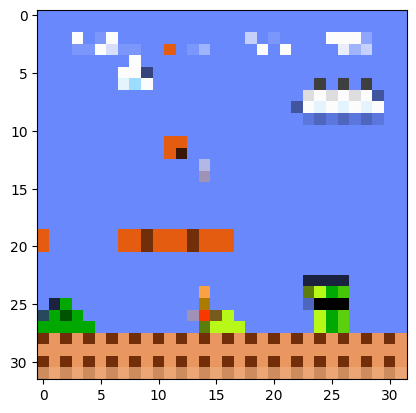

1/1 [==============================] - 0s 20ms/step
Image_1580_lvl_1_Stage_1.png es una fotografía del NIVEL 1


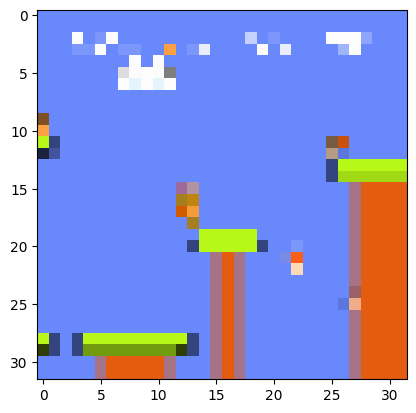

1/1 [==============================] - 0s 17ms/step
Image_1700_lvl_1_Stage_3.png es una fotografía del NIVEL 1


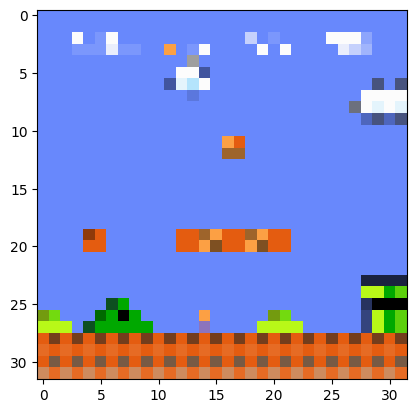

1/1 [==============================] - 0s 21ms/step
Image_1160_lvl_1_Stage_1.png es una fotografía del NIVEL 1


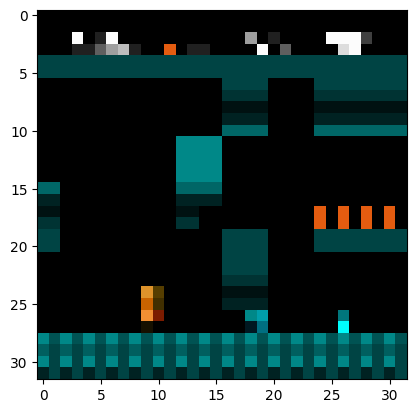

1/1 [==============================] - 0s 20ms/step
Image_2040_lvl_1_Stage_2.png es una fotografía del NIVEL 1


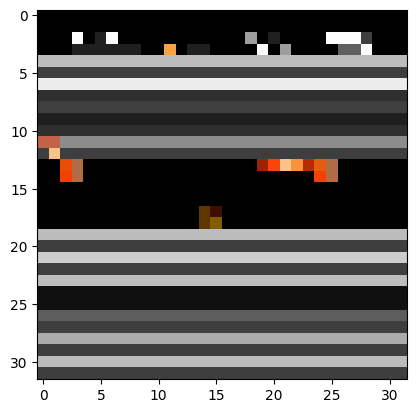

1/1 [==============================] - 0s 21ms/step
Image_1820_lvl_1_Stage_4.png es una fotografía del NIVEL 1


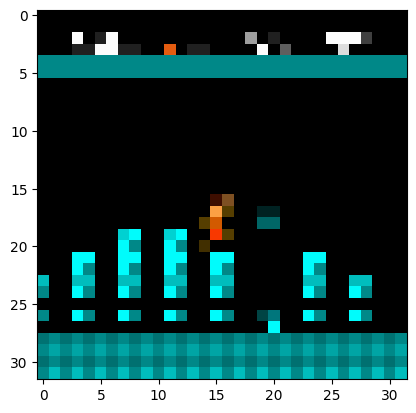

1/1 [==============================] - 0s 18ms/step
Image_980_lvl_1_Stage_2.png es una fotografía del NIVEL 1


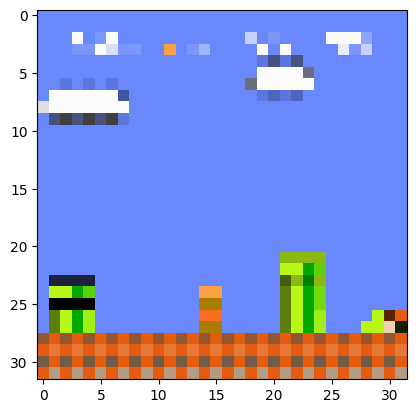

1/1 [==============================] - 0s 18ms/step
Image_1980_lvl_1_Stage_1.png es una fotografía del NIVEL 1


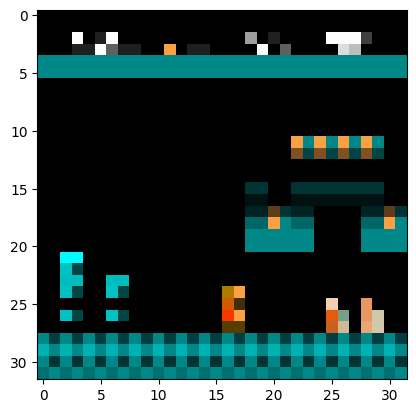

1/1 [==============================] - 0s 18ms/step
Image_1200_lvl_1_Stage_2.png es una fotografía del NIVEL 1


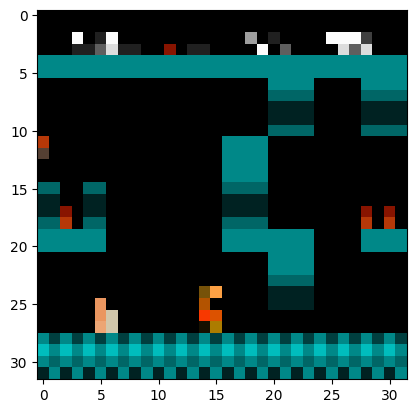

1/1 [==============================] - 0s 18ms/step
Image_1900_lvl_1_Stage_2.png es una fotografía del NIVEL 1


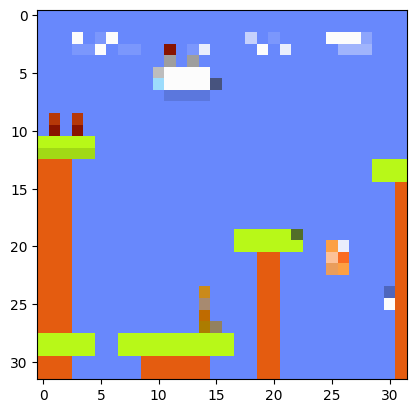

1/1 [==============================] - 0s 19ms/step
Image_1620_lvl_1_Stage_3.png es una fotografía del NIVEL 1


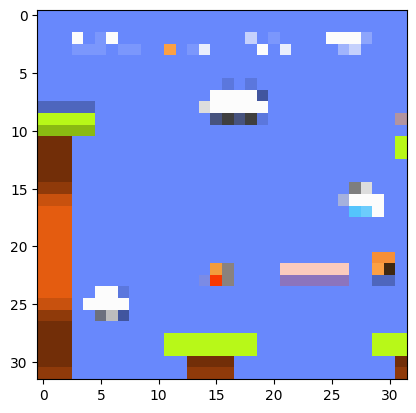

1/1 [==============================] - 0s 26ms/step
Image_1060_lvl_1_Stage_3.png es una fotografía del NIVEL 1


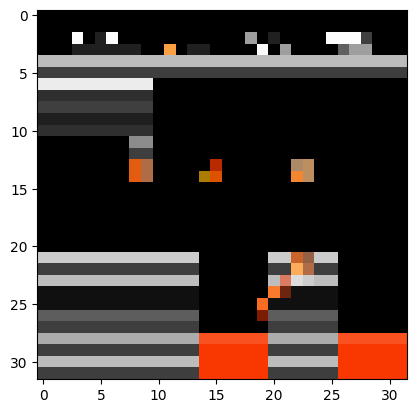

1/1 [==============================] - 0s 20ms/step
Image_1120_lvl_1_Stage_4.png es una fotografía del NIVEL 1


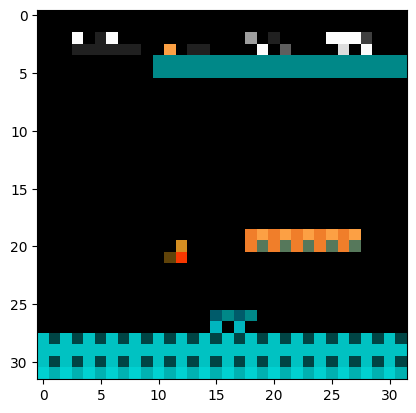

1/1 [==============================] - 0s 18ms/step
Image_480_lvl_1_Stage_2.png es una fotografía del NIVEL 1


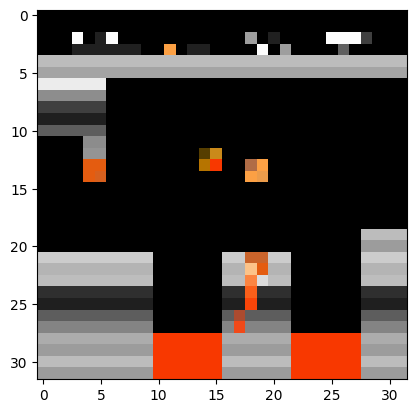

1/1 [==============================] - 0s 22ms/step
Image_1520_lvl_1_Stage_4.png es una fotografía del NIVEL 1


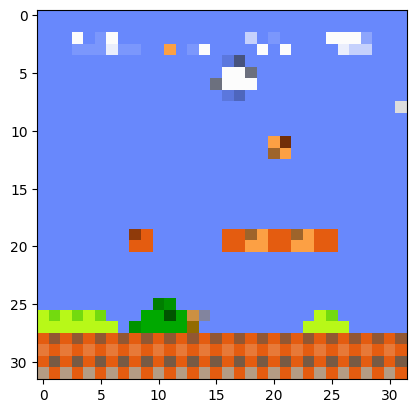

1/1 [==============================] - 0s 20ms/step
Image_1120_lvl_1_Stage_1.png es una fotografía del NIVEL 1


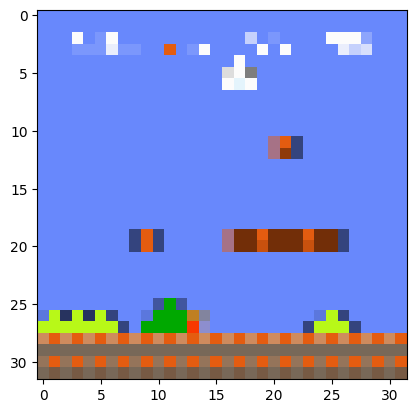

1/1 [==============================] - 0s 20ms/step
Image_1100_lvl_1_Stage_1.png es una fotografía del NIVEL 1


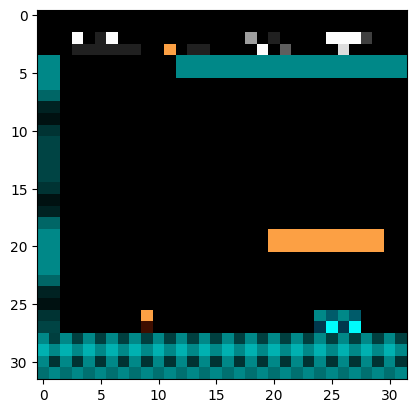

1/1 [==============================] - 0s 20ms/step
Image_380_lvl_1_Stage_2.png es una fotografía del NIVEL 1


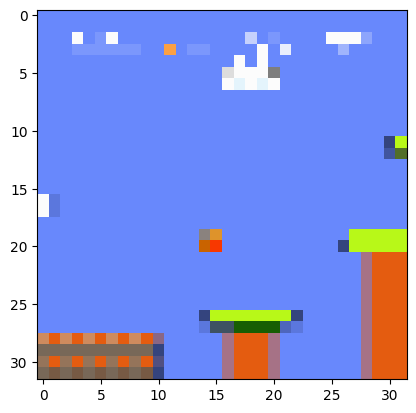

1/1 [==============================] - 0s 19ms/step
Image_260_lvl_1_Stage_3.png es una fotografía del NIVEL 1


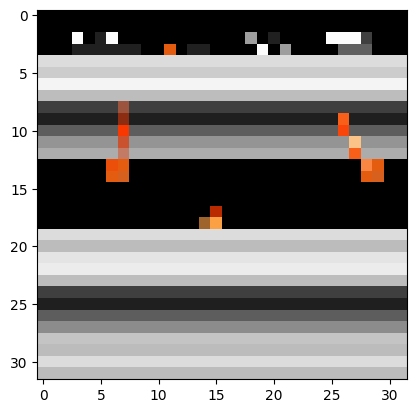

1/1 [==============================] - 0s 20ms/step
Image_1800_lvl_1_Stage_4.png es una fotografía del NIVEL 1


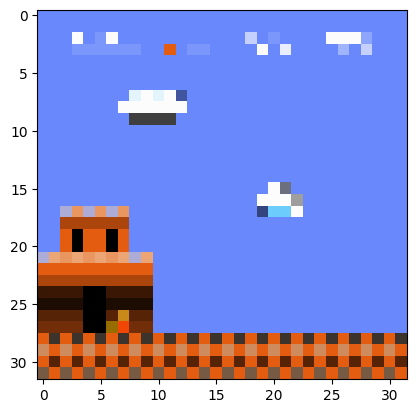

1/1 [==============================] - 0s 20ms/step
Image_120_lvl_1_Stage_3.png es una fotografía del NIVEL 1


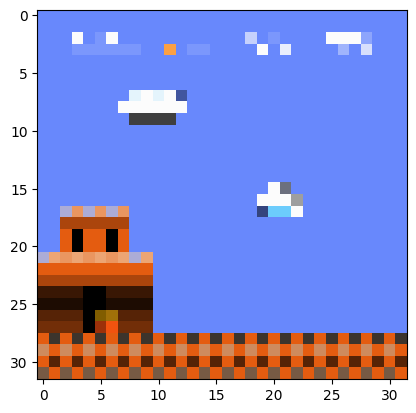

1/1 [==============================] - 0s 18ms/step
Image_100_lvl_1_Stage_3.png es una fotografía del NIVEL 1


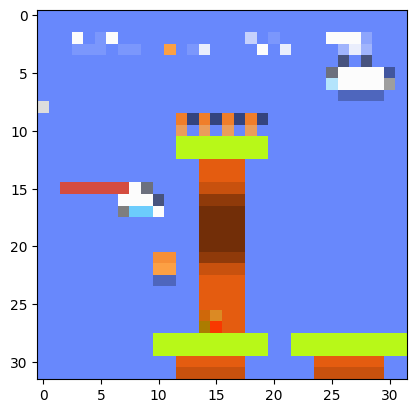

1/1 [==============================] - 0s 20ms/step
Image_1260_lvl_1_Stage_3.png es una fotografía del NIVEL 1


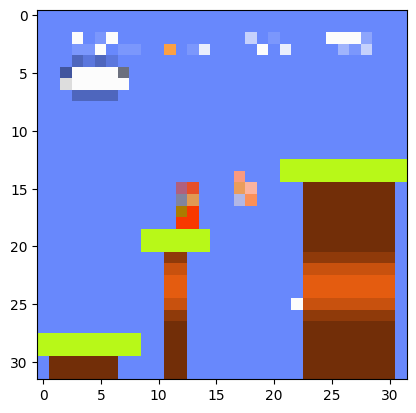

1/1 [==============================] - 0s 19ms/step
Image_1980_lvl_1_Stage_3.png es una fotografía del NIVEL 1


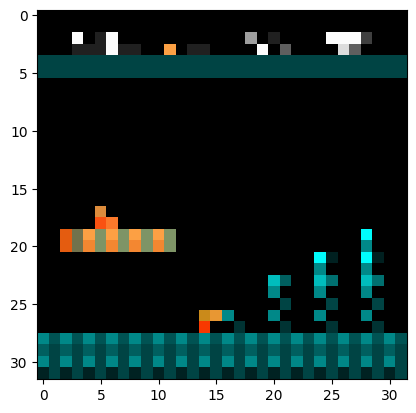

1/1 [==============================] - 0s 19ms/step
Image_720_lvl_1_Stage_2.png es una fotografía del NIVEL 1


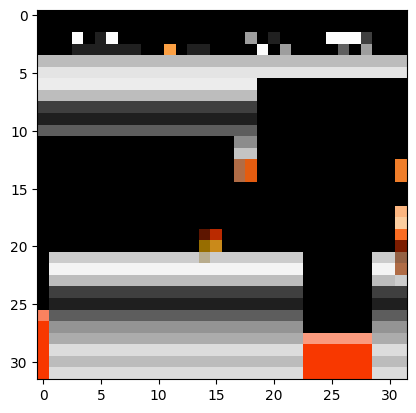

1/1 [==============================] - 0s 19ms/step
Image_720_lvl_1_Stage_4.png es una fotografía del NIVEL 1


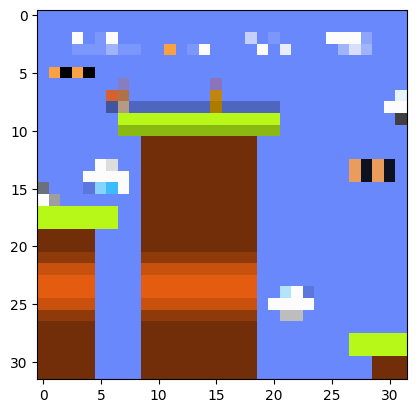

1/1 [==============================] - 0s 18ms/step
Image_980_lvl_1_Stage_3.png es una fotografía del NIVEL 1


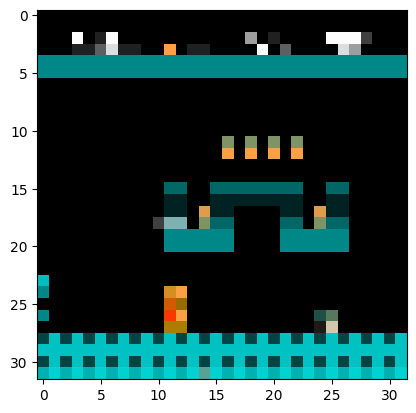

1/1 [==============================] - 0s 17ms/step
Image_1400_lvl_1_Stage_2.png es una fotografía del NIVEL 1


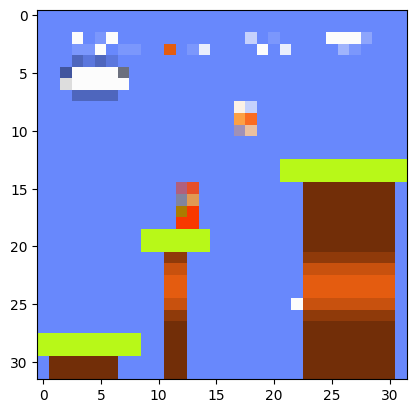

1/1 [==============================] - 0s 19ms/step
Image_1900_lvl_1_Stage_3.png es una fotografía del NIVEL 1


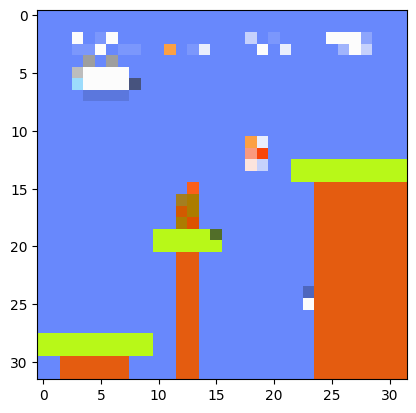

1/1 [==============================] - 0s 20ms/step
Image_1780_lvl_1_Stage_3.png es una fotografía del NIVEL 1


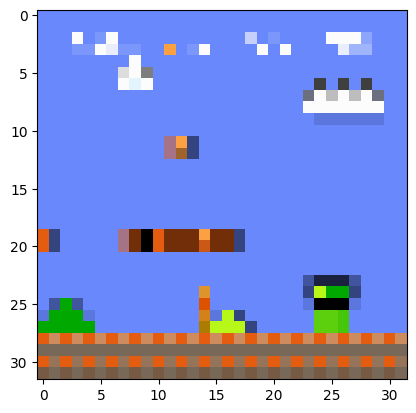

1/1 [==============================] - 0s 23ms/step
Image_1540_lvl_1_Stage_1.png es una fotografía del NIVEL 1


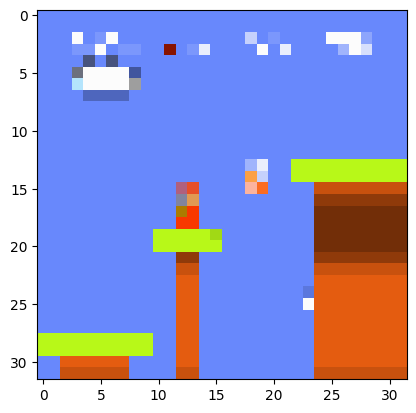

1/1 [==============================] - 0s 28ms/step
Image_1760_lvl_1_Stage_3.png es una fotografía del NIVEL 1


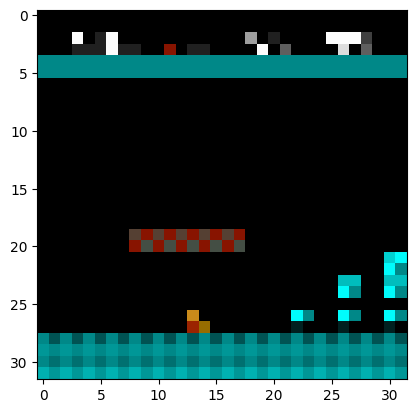

1/1 [==============================] - 0s 28ms/step
Image_560_lvl_1_Stage_2.png es una fotografía del NIVEL 1


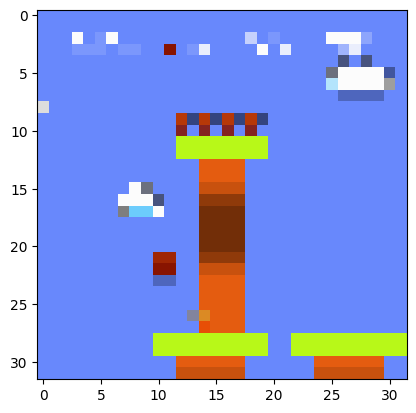

1/1 [==============================] - 0s 27ms/step
Image_1280_lvl_1_Stage_3.png es una fotografía del NIVEL 1


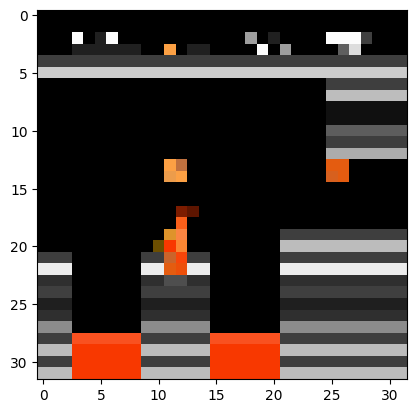

1/1 [==============================] - 0s 26ms/step
Image_1220_lvl_1_Stage_4.png es una fotografía del NIVEL 1


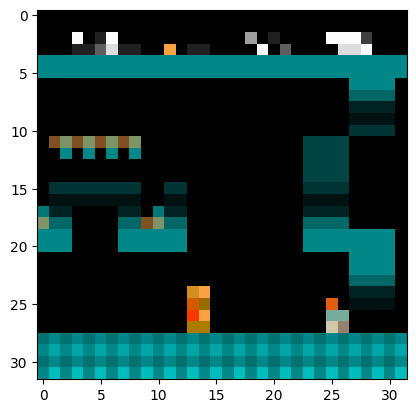

1/1 [==============================] - 0s 26ms/step
Image_1740_lvl_1_Stage_2.png es una fotografía del NIVEL 1


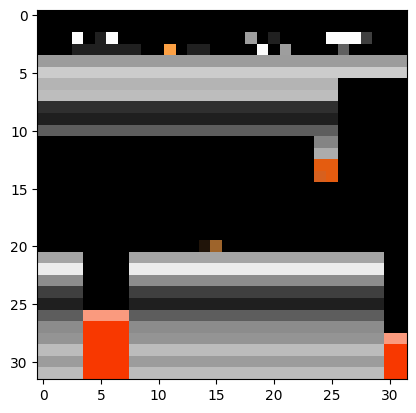

1/1 [==============================] - 0s 26ms/step
Image_640_lvl_1_Stage_4.png es una fotografía del NIVEL 1


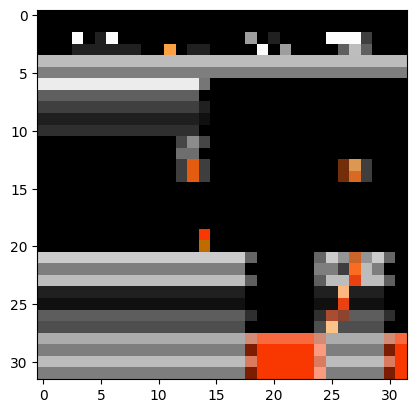

1/1 [==============================] - 0s 28ms/step
Image_960_lvl_1_Stage_4.png es una fotografía del NIVEL 1


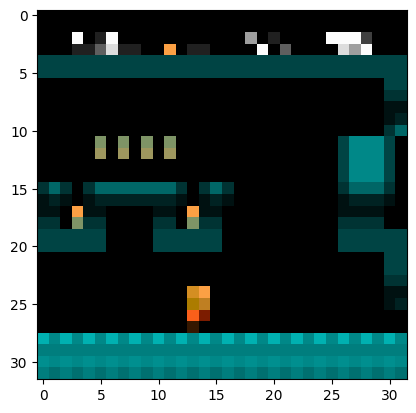

1/1 [==============================] - 0s 37ms/step
Image_1540_lvl_1_Stage_2.png es una fotografía del NIVEL 1


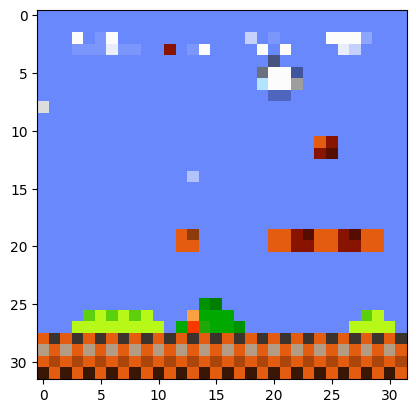

1/1 [==============================] - 0s 18ms/step
Image_1040_lvl_1_Stage_1.png es una fotografía del NIVEL 1


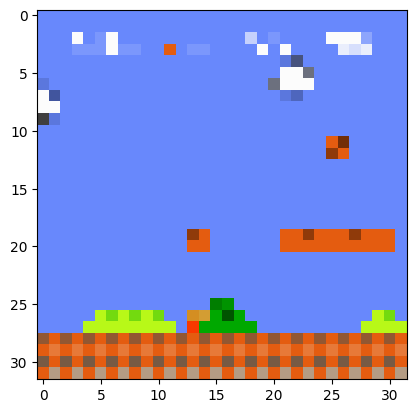

1/1 [==============================] - 0s 17ms/step
Image_940_lvl_1_Stage_1.png es una fotografía del NIVEL 1


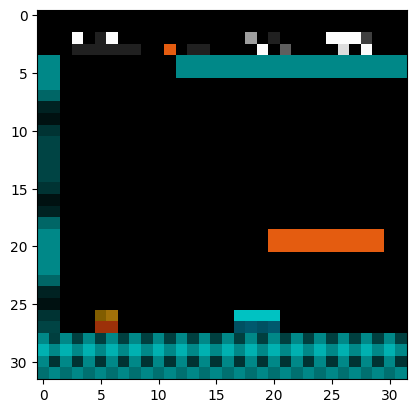

1/1 [==============================] - 0s 21ms/step
Image_180_lvl_1_Stage_2.png es una fotografía del NIVEL 1


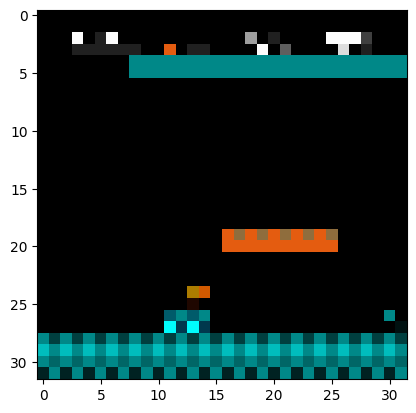

1/1 [==============================] - 0s 18ms/step
Image_500_lvl_1_Stage_2.png es una fotografía del NIVEL 1


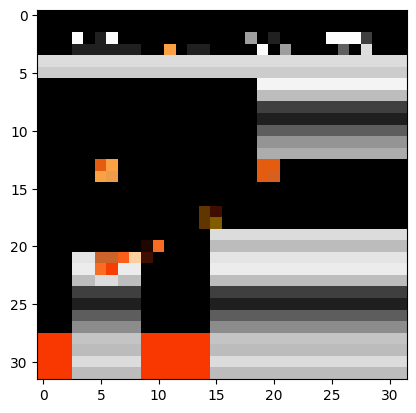

1/1 [==============================] - 0s 18ms/step
Image_1580_lvl_1_Stage_4.png es una fotografía del NIVEL 1


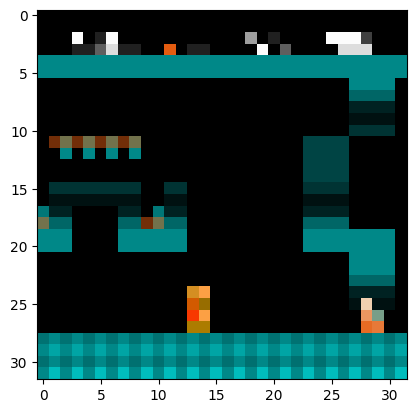

1/1 [==============================] - 0s 20ms/step
Image_1700_lvl_1_Stage_2.png es una fotografía del NIVEL 1


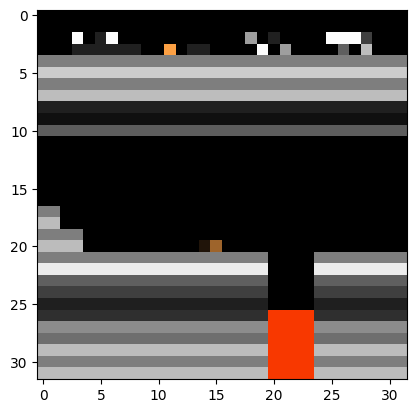

1/1 [==============================] - 0s 17ms/step
Image_1340_lvl_1_Stage_4.png es una fotografía del NIVEL 1


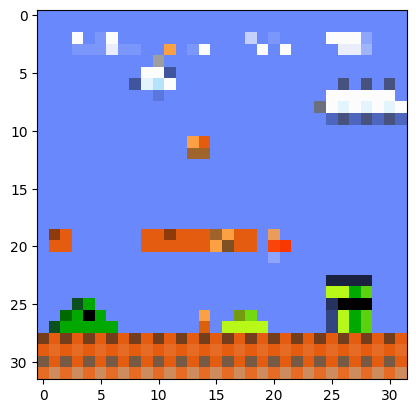

1/1 [==============================] - 0s 20ms/step
Image_1360_lvl_1_Stage_1.png es una fotografía del NIVEL 1


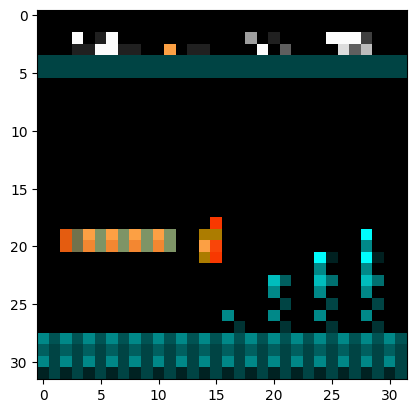

1/1 [==============================] - 0s 18ms/step
Image_860_lvl_1_Stage_2.png es una fotografía del NIVEL 1


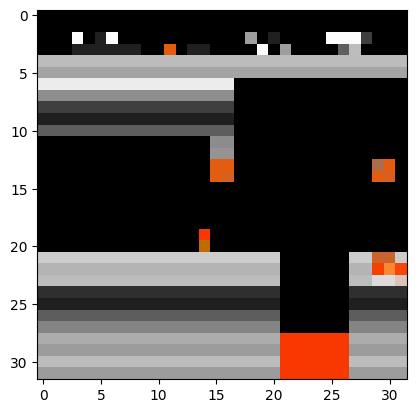

1/1 [==============================] - 0s 19ms/step
Image_840_lvl_1_Stage_4.png es una fotografía del NIVEL 1


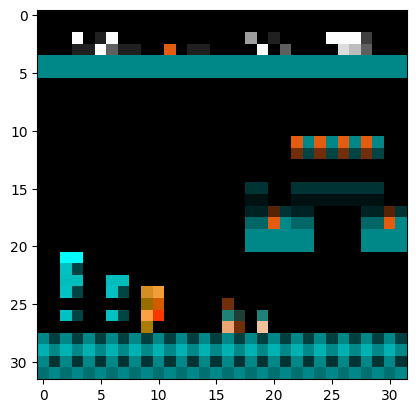

1/1 [==============================] - 0s 18ms/step
Image_1320_lvl_1_Stage_2.png es una fotografía del NIVEL 1


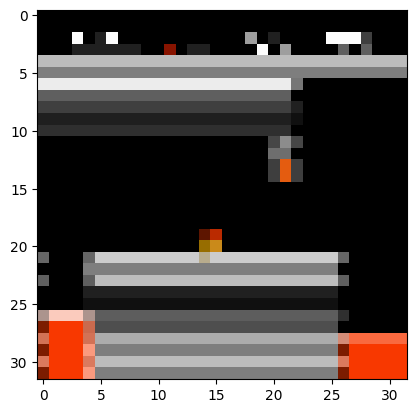

1/1 [==============================] - 0s 18ms/step
Image_660_lvl_1_Stage_4.png es una fotografía del NIVEL 1


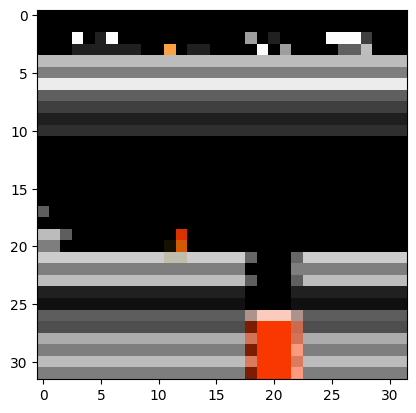

1/1 [==============================] - 0s 21ms/step
Image_500_lvl_1_Stage_4.png es una fotografía del NIVEL 1


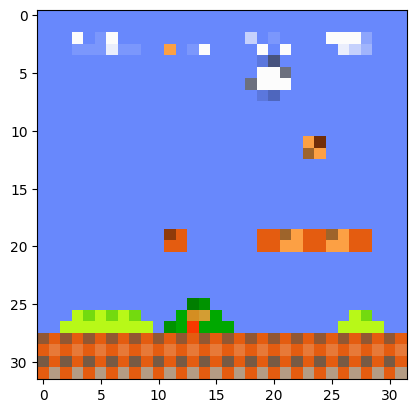

1/1 [==============================] - 0s 19ms/step
Image_1060_lvl_1_Stage_1.png es una fotografía del NIVEL 1


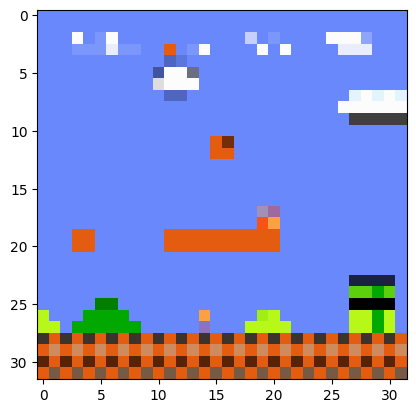

1/1 [==============================] - 0s 26ms/step
Image_1340_lvl_1_Stage_1.png es una fotografía del NIVEL 1


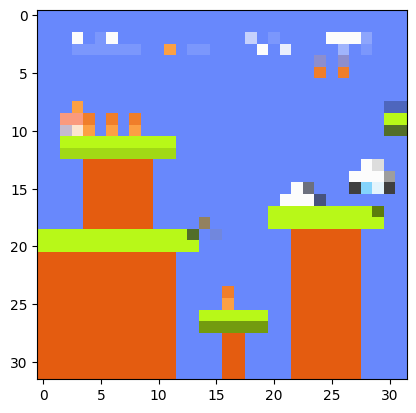

1/1 [==============================] - 0s 20ms/step
Image_400_lvl_1_Stage_3.png es una fotografía del NIVEL 1


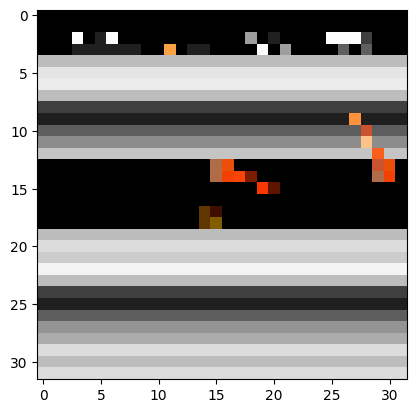

1/1 [==============================] - 0s 18ms/step
Image_1900_lvl_1_Stage_4.png es una fotografía del NIVEL 1


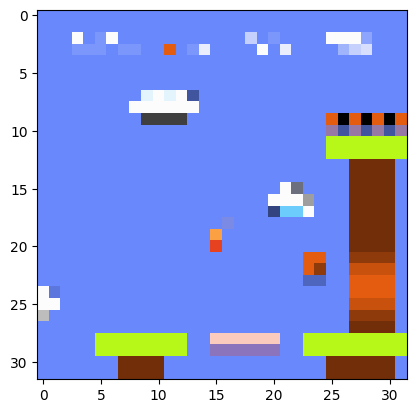

1/1 [==============================] - 0s 17ms/step
Image_1100_lvl_1_Stage_3.png es una fotografía del NIVEL 1


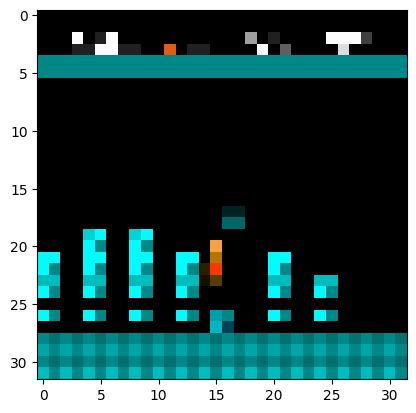

1/1 [==============================] - 0s 19ms/step
Image_1000_lvl_1_Stage_2.png es una fotografía del NIVEL 1


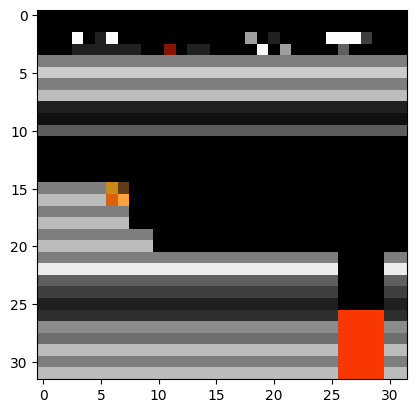

1/1 [==============================] - 0s 18ms/step
Image_1260_lvl_1_Stage_4.png es una fotografía del NIVEL 1


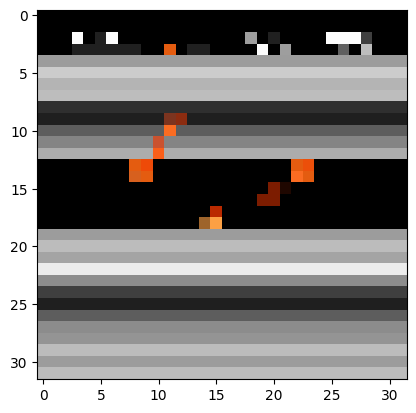

1/1 [==============================] - 0s 17ms/step
Image_1940_lvl_1_Stage_4.png es una fotografía del NIVEL 1


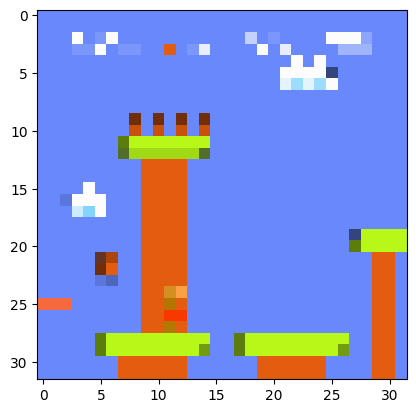

1/1 [==============================] - 0s 20ms/step
Image_1520_lvl_1_Stage_3.png es una fotografía del NIVEL 1


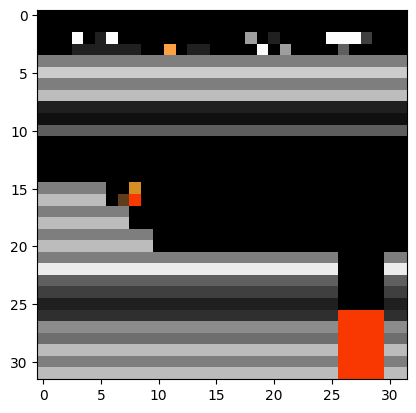

1/1 [==============================] - 0s 19ms/step
Image_1280_lvl_1_Stage_4.png es una fotografía del NIVEL 1


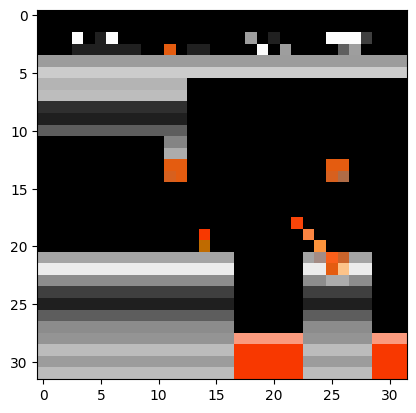

1/1 [==============================] - 0s 19ms/step
Image_1080_lvl_1_Stage_4.png es una fotografía del NIVEL 1


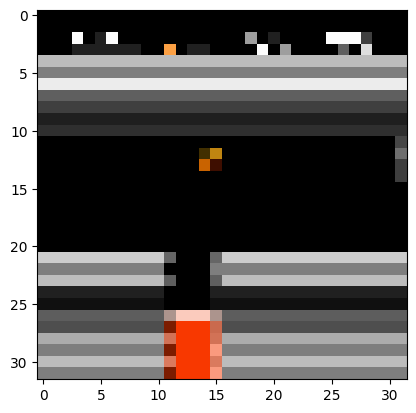

1/1 [==============================] - 0s 18ms/step
Image_1380_lvl_1_Stage_4.png es una fotografía del NIVEL 1


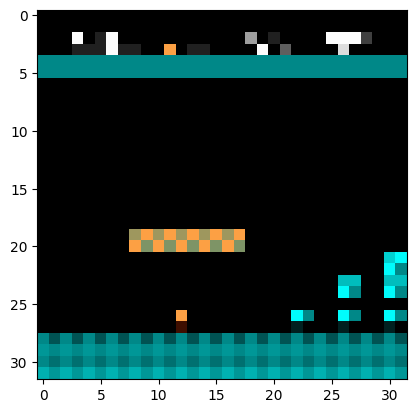

1/1 [==============================] - 0s 18ms/step
Image_580_lvl_1_Stage_2.png es una fotografía del NIVEL 1


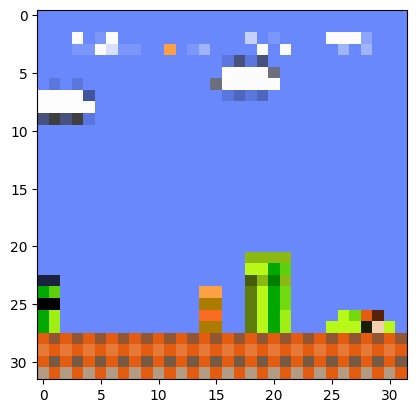

1/1 [==============================] - 0s 31ms/step
Image_2120_lvl_1_Stage_1.png es una fotografía del NIVEL 1


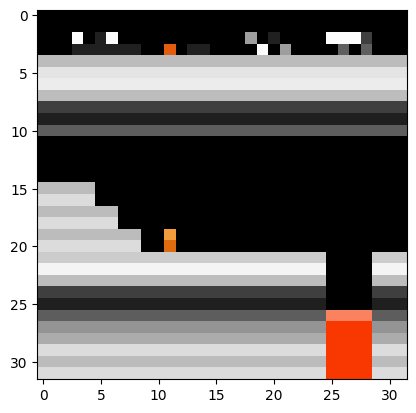

1/1 [==============================] - 0s 18ms/step
Image_1300_lvl_1_Stage_4.png es una fotografía del NIVEL 1


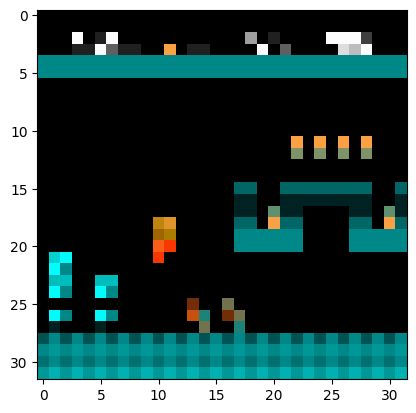

1/1 [==============================] - 0s 20ms/step
Image_1340_lvl_1_Stage_2.png es una fotografía del NIVEL 1


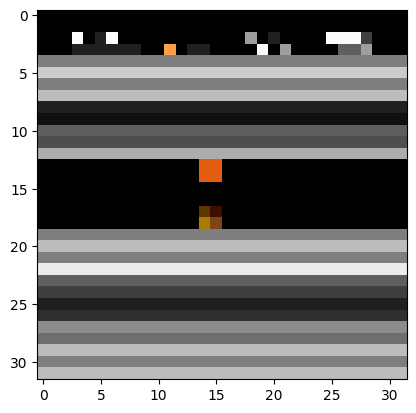

1/1 [==============================] - 0s 19ms/step
Image_1760_lvl_1_Stage_4.png es una fotografía del NIVEL 1


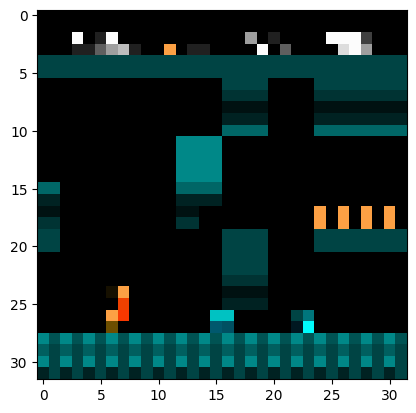

1/1 [==============================] - 0s 19ms/step
Image_2080_lvl_1_Stage_2.png es una fotografía del NIVEL 1


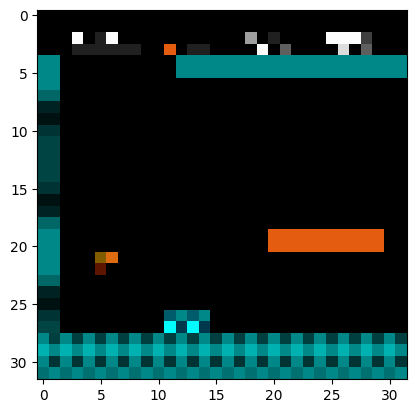

1/1 [==============================] - 0s 19ms/step
Image_260_lvl_1_Stage_2.png es una fotografía del NIVEL 1


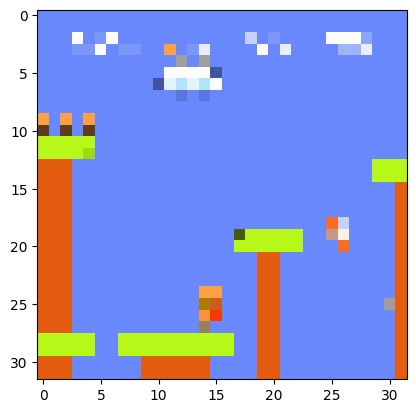

1/1 [==============================] - 0s 21ms/step
Image_1600_lvl_1_Stage_3.png es una fotografía del NIVEL 1


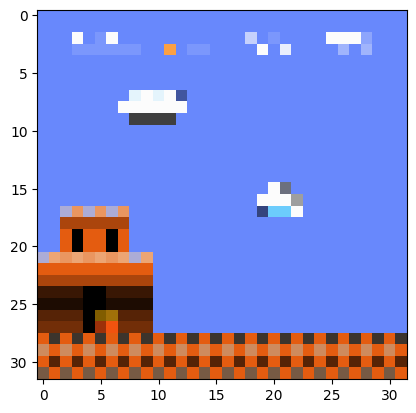

1/1 [==============================] - 0s 19ms/step
Image_60_lvl_1_Stage_3.png es una fotografía del NIVEL 1


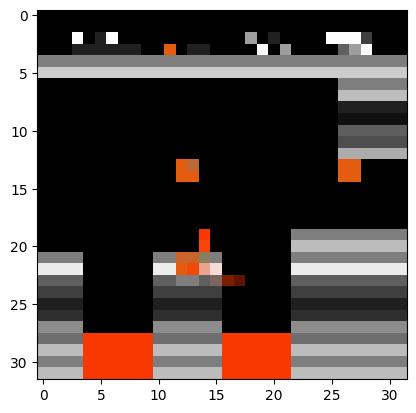

1/1 [==============================] - 0s 20ms/step
Image_1180_lvl_1_Stage_4.png es una fotografía del NIVEL 1


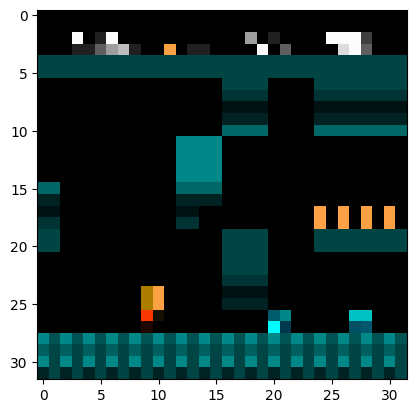

1/1 [==============================] - 0s 18ms/step
Image_2020_lvl_1_Stage_2.png es una fotografía del NIVEL 1


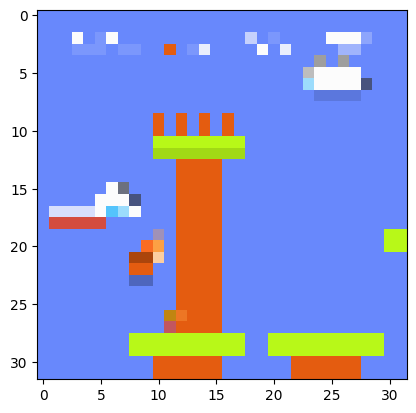

1/1 [==============================] - 0s 26ms/step
Image_1420_lvl_1_Stage_3.png es una fotografía del NIVEL 1


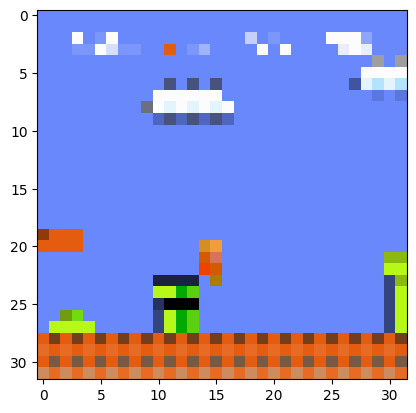

1/1 [==============================] - 0s 21ms/step
Image_1800_lvl_1_Stage_1.png es una fotografía del NIVEL 1


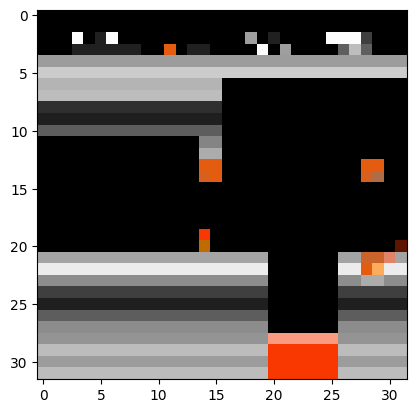

1/1 [==============================] - 0s 18ms/step
Image_860_lvl_1_Stage_4.png es una fotografía del NIVEL 1


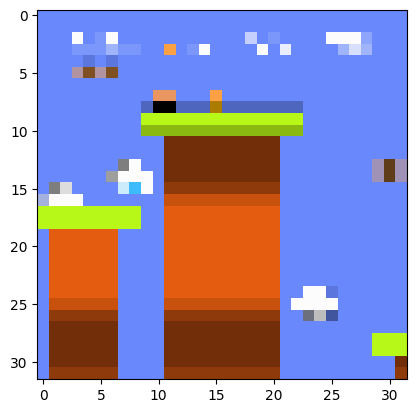

1/1 [==============================] - 0s 23ms/step
Image_960_lvl_1_Stage_3.png es una fotografía del NIVEL 1


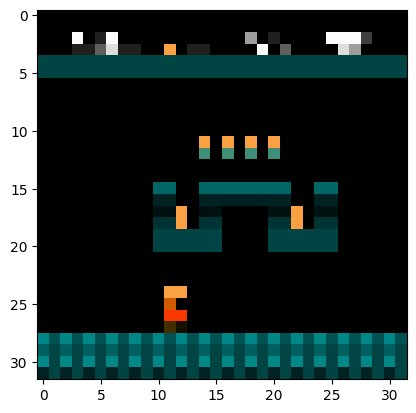

1/1 [==============================] - 0s 19ms/step
Image_1440_lvl_1_Stage_2.png es una fotografía del NIVEL 1


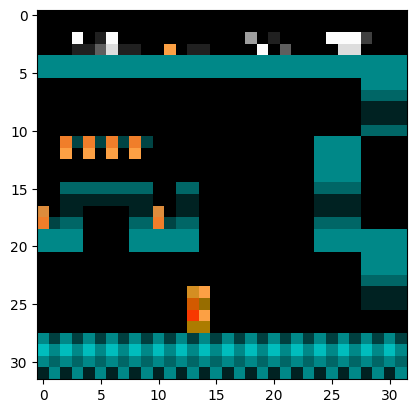

1/1 [==============================] - 0s 28ms/step
Image_1600_lvl_1_Stage_2.png es una fotografía del NIVEL 1


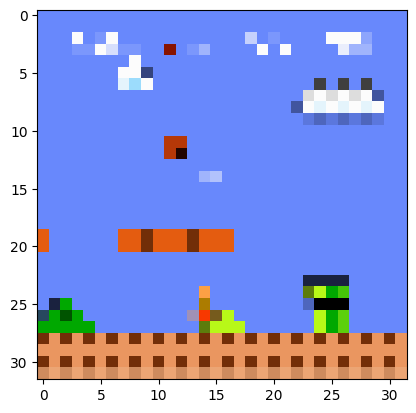

1/1 [==============================] - 0s 27ms/step
Image_1620_lvl_1_Stage_1.png es una fotografía del NIVEL 1


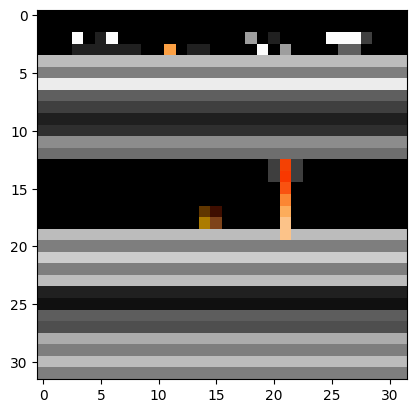

1/1 [==============================] - 0s 31ms/step
Image_1720_lvl_1_Stage_4.png es una fotografía del NIVEL 1


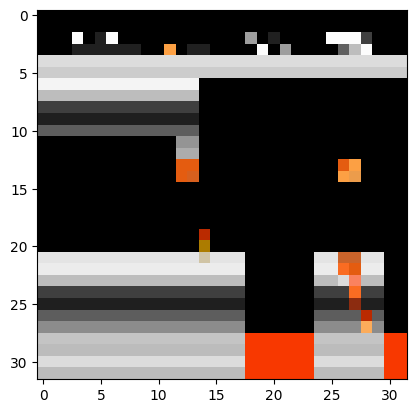

1/1 [==============================] - 0s 30ms/step
Image_980_lvl_1_Stage_4.png es una fotografía del NIVEL 1


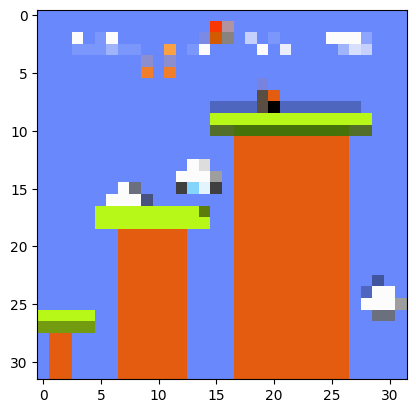

1/1 [==============================] - 0s 26ms/step
Image_920_lvl_1_Stage_3.png es una fotografía del NIVEL 1


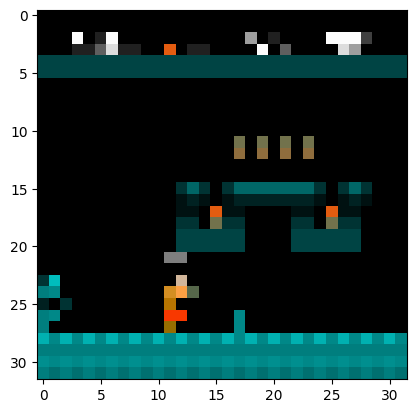

1/1 [==============================] - 0s 27ms/step
Image_1380_lvl_1_Stage_2.png es una fotografía del NIVEL 1


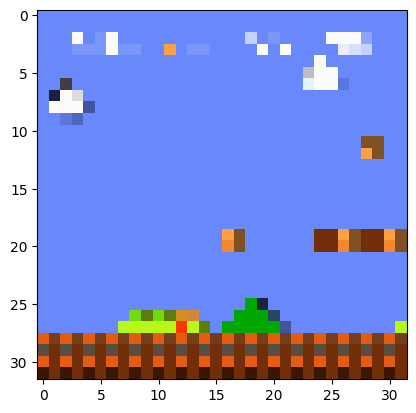

1/1 [==============================] - 0s 42ms/step
Image_920_lvl_1_Stage_1.png es una fotografía del NIVEL 1


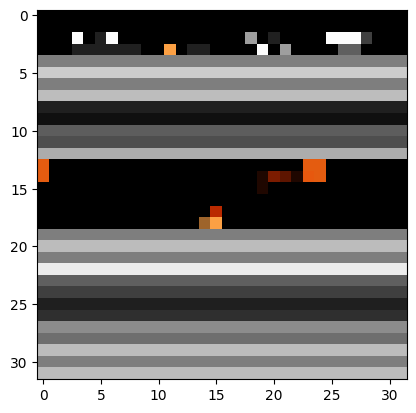

1/1 [==============================] - 0s 35ms/step
Image_1680_lvl_1_Stage_4.png es una fotografía del NIVEL 1


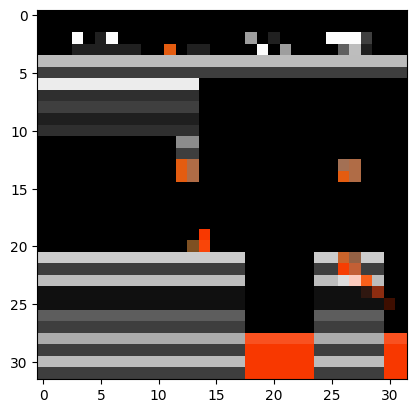

1/1 [==============================] - 0s 36ms/step
Image_1000_lvl_1_Stage_4.png es una fotografía del NIVEL 1


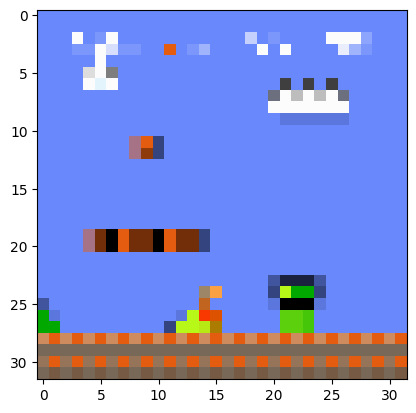

1/1 [==============================] - 0s 26ms/step
Image_1660_lvl_1_Stage_1.png es una fotografía del NIVEL 1


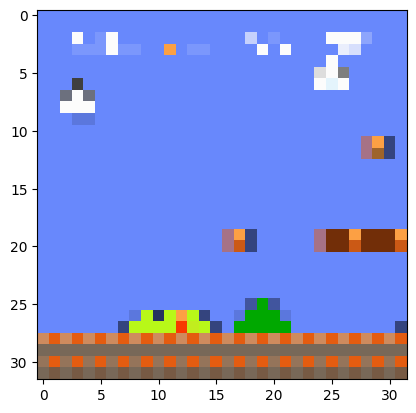

1/1 [==============================] - 0s 17ms/step
Image_880_lvl_1_Stage_1.png es una fotografía del NIVEL 1


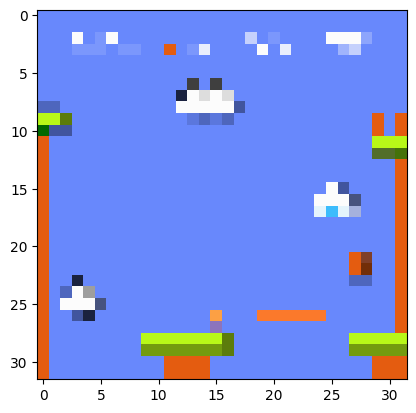

1/1 [==============================] - 0s 19ms/step
Image_1080_lvl_1_Stage_3.png es una fotografía del NIVEL 1


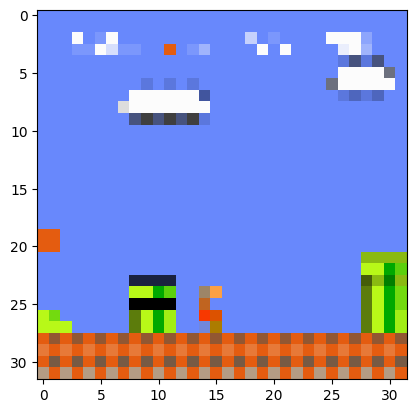

1/1 [==============================] - 0s 18ms/step
Image_1820_lvl_1_Stage_1.png es una fotografía del NIVEL 1


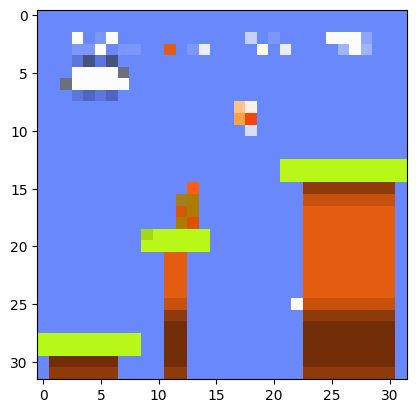

1/1 [==============================] - 0s 19ms/step
Image_1820_lvl_1_Stage_3.png es una fotografía del NIVEL 1


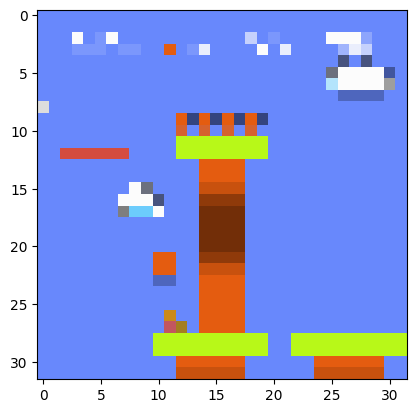

1/1 [==============================] - 0s 17ms/step
Image_1320_lvl_1_Stage_3.png es una fotografía del NIVEL 1


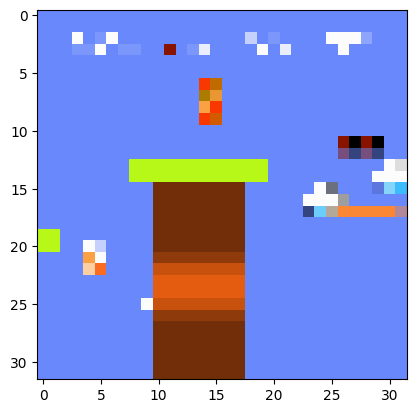

1/1 [==============================] - 0s 17ms/step
Image_2100_lvl_1_Stage_3.png es una fotografía del NIVEL 1


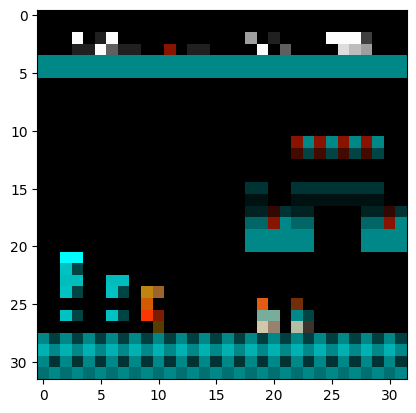

1/1 [==============================] - 0s 20ms/step
Image_1280_lvl_1_Stage_2.png es una fotografía del NIVEL 1


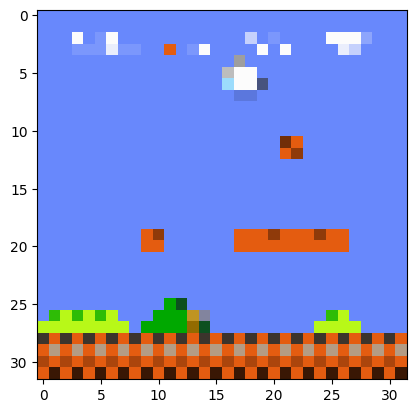

1/1 [==============================] - 0s 17ms/step
Image_1080_lvl_1_Stage_1.png es una fotografía del NIVEL 1


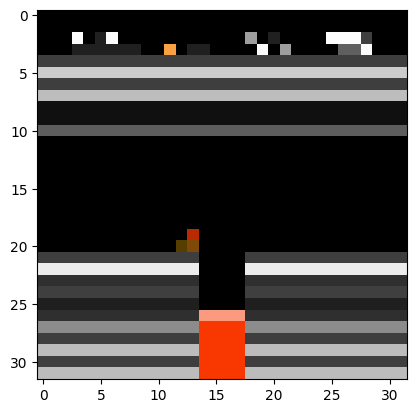

1/1 [==============================] - 0s 17ms/step
Image_580_lvl_1_Stage_4.png es una fotografía del NIVEL 1


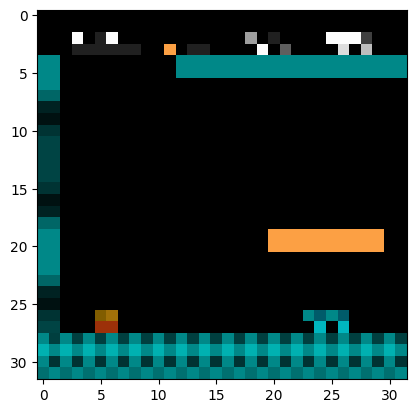

1/1 [==============================] - 0s 18ms/step
Image_100_lvl_1_Stage_2.png es una fotografía del NIVEL 1


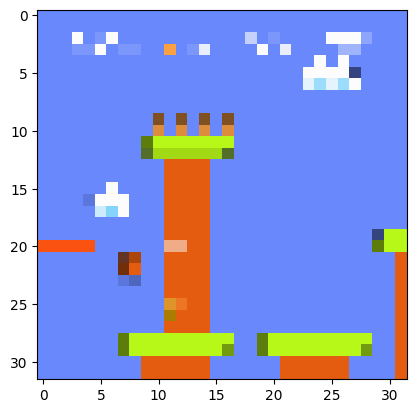

1/1 [==============================] - 0s 17ms/step
Image_1460_lvl_1_Stage_3.png es una fotografía del NIVEL 1


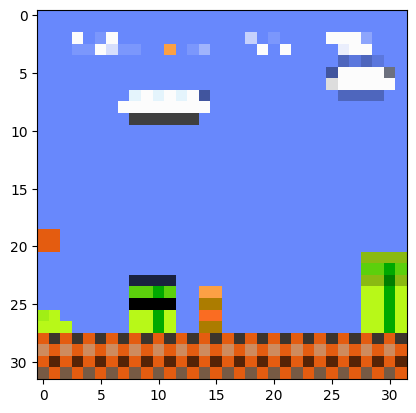

1/1 [==============================] - 0s 20ms/step
Image_1840_lvl_1_Stage_1.png es una fotografía del NIVEL 1


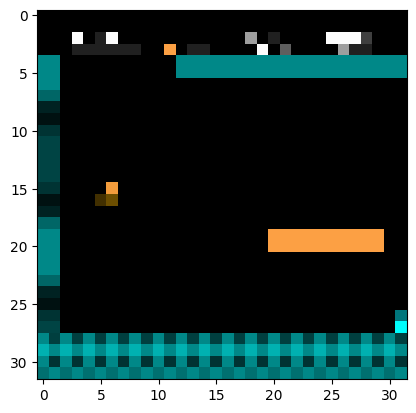

1/1 [==============================] - 0s 19ms/step
Image_300_lvl_1_Stage_2.png es una fotografía del NIVEL 1


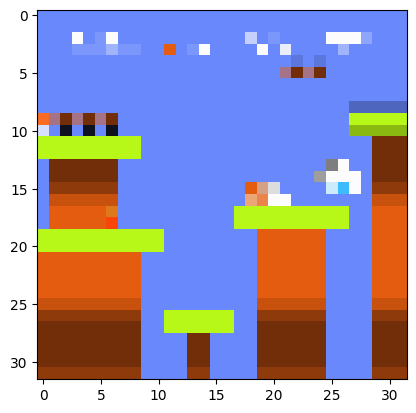

1/1 [==============================] - 0s 18ms/step
Image_620_lvl_1_Stage_3.png es una fotografía del NIVEL 1


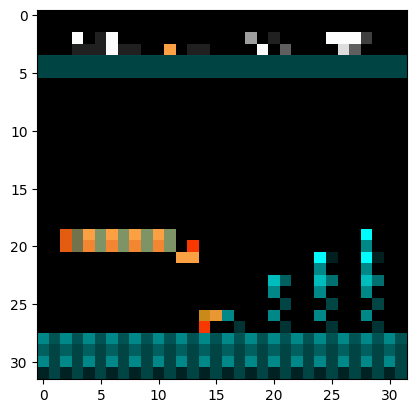

1/1 [==============================] - 0s 18ms/step
Image_780_lvl_1_Stage_2.png es una fotografía del NIVEL 1


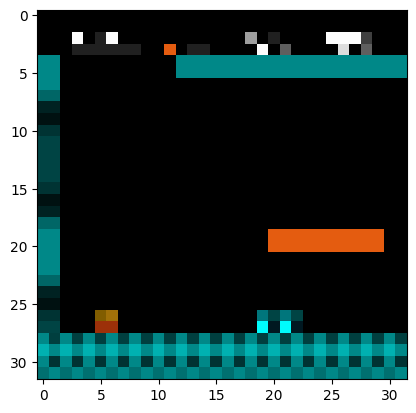

1/1 [==============================] - 0s 18ms/step
Image_160_lvl_1_Stage_2.png es una fotografía del NIVEL 1


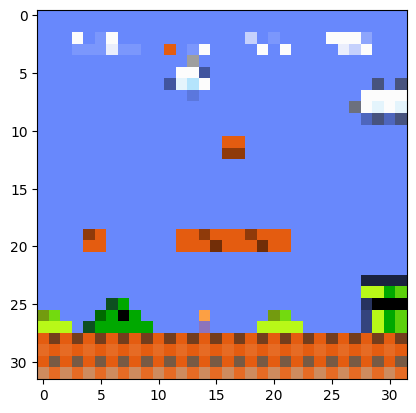

1/1 [==============================] - 0s 17ms/step
Image_1180_lvl_1_Stage_1.png es una fotografía del NIVEL 1


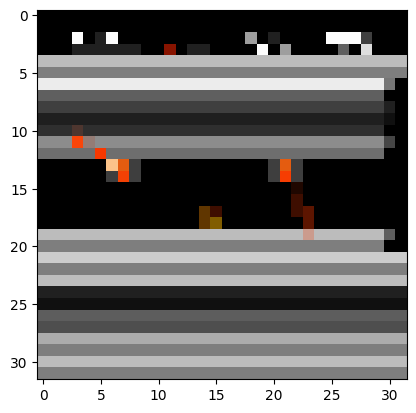

1/1 [==============================] - 0s 18ms/step
Image_1980_lvl_1_Stage_4.png es una fotografía del NIVEL 1


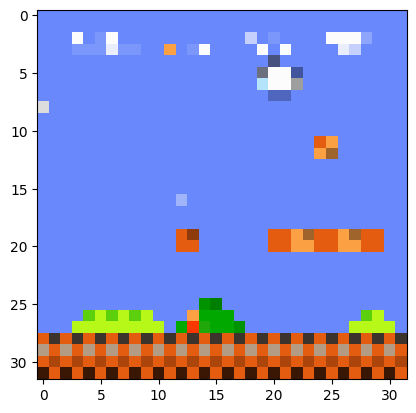

1/1 [==============================] - 0s 18ms/step
Image_1020_lvl_1_Stage_1.png es una fotografía del NIVEL 1


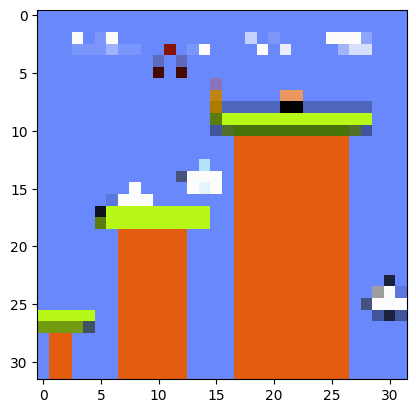

1/1 [==============================] - 0s 18ms/step
Image_900_lvl_1_Stage_3.png es una fotografía del NIVEL 1


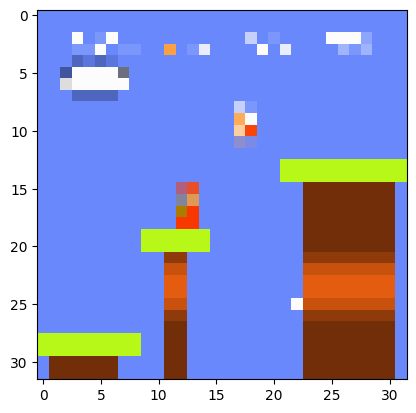

1/1 [==============================] - 0s 21ms/step
Image_1920_lvl_1_Stage_3.png es una fotografía del NIVEL 1


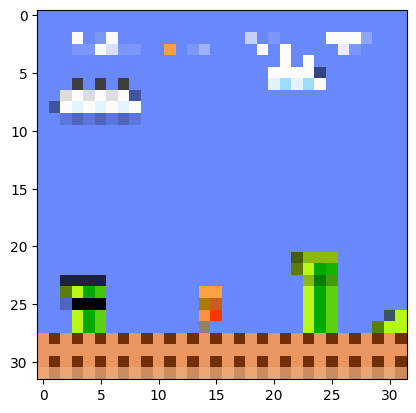

1/1 [==============================] - 0s 17ms/step
Image_1940_lvl_1_Stage_1.png es una fotografía del NIVEL 1


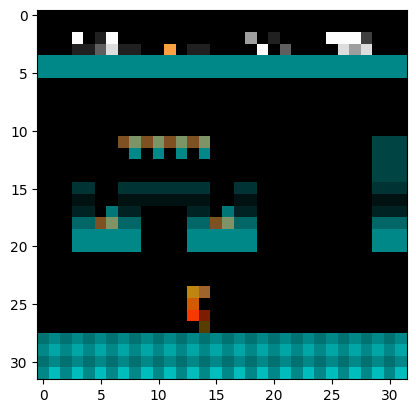

1/1 [==============================] - 0s 21ms/step
Image_1500_lvl_1_Stage_2.png es una fotografía del NIVEL 1


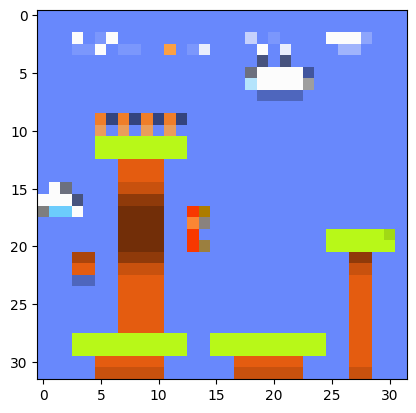

1/1 [==============================] - 0s 19ms/step
Image_1540_lvl_1_Stage_3.png es una fotografía del NIVEL 1


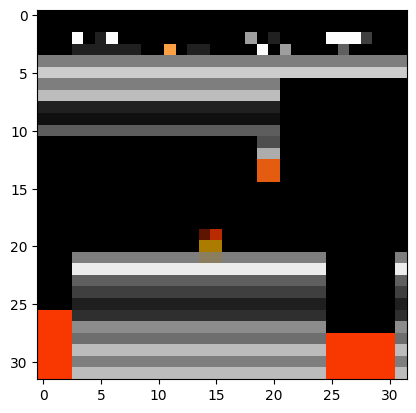

1/1 [==============================] - 0s 19ms/step
Image_680_lvl_1_Stage_4.png es una fotografía del NIVEL 1


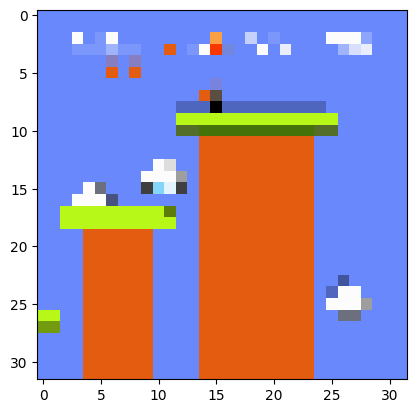

1/1 [==============================] - 0s 22ms/step
Image_940_lvl_1_Stage_3.png es una fotografía del NIVEL 1


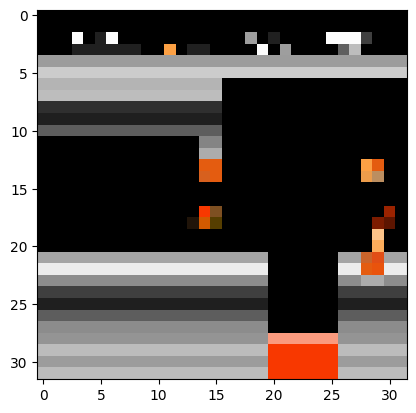

1/1 [==============================] - 0s 17ms/step
Image_880_lvl_1_Stage_4.png es una fotografía del NIVEL 1


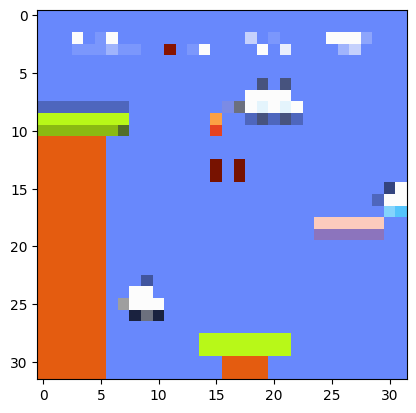

1/1 [==============================] - 0s 19ms/step
Image_1040_lvl_1_Stage_3.png es una fotografía del NIVEL 1


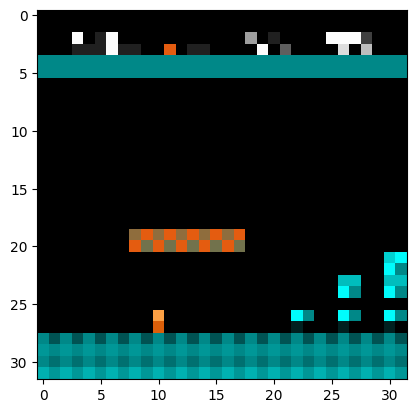

1/1 [==============================] - 0s 20ms/step
Image_600_lvl_1_Stage_2.png es una fotografía del NIVEL 1


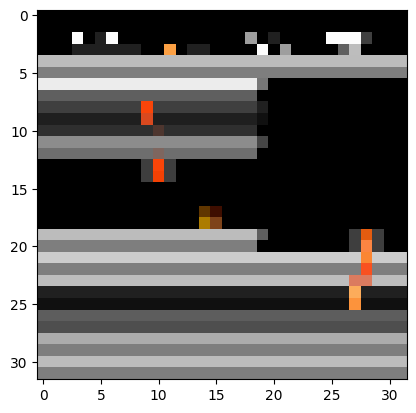

1/1 [==============================] - 0s 20ms/step
Image_2060_lvl_1_Stage_4.png es una fotografía del NIVEL 1


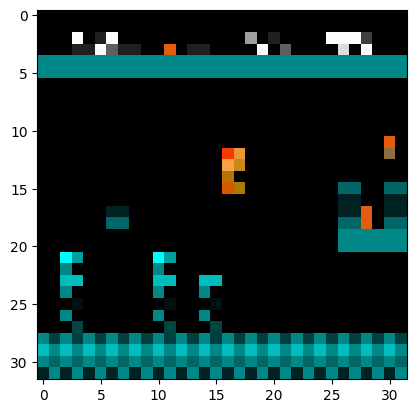

1/1 [==============================] - 0s 20ms/step
Image_1140_lvl_1_Stage_2.png es una fotografía del NIVEL 1


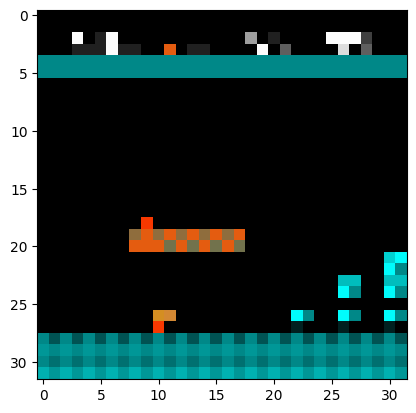

1/1 [==============================] - 0s 22ms/step
Image_660_lvl_1_Stage_2.png es una fotografía del NIVEL 1


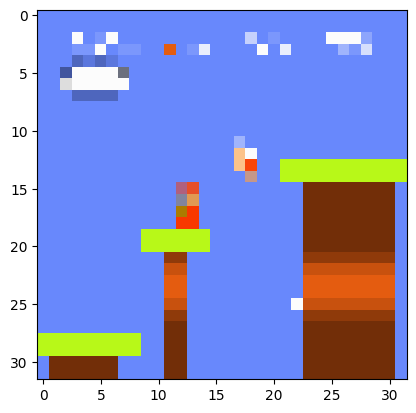

1/1 [==============================] - 0s 21ms/step
Image_1960_lvl_1_Stage_3.png es una fotografía del NIVEL 1


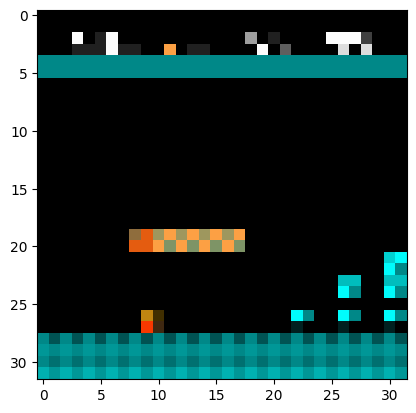

1/1 [==============================] - 0s 19ms/step
Image_640_lvl_1_Stage_2.png es una fotografía del NIVEL 1


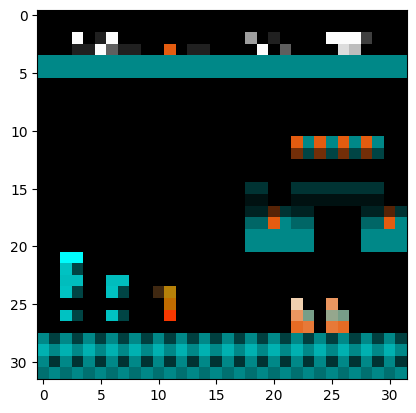

1/1 [==============================] - 0s 19ms/step
Image_1240_lvl_1_Stage_2.png es una fotografía del NIVEL 1


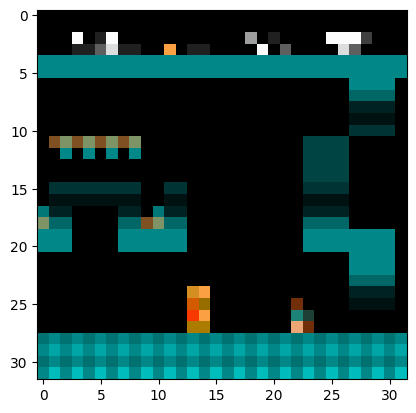

1/1 [==============================] - 0s 23ms/step
Image_1780_lvl_1_Stage_2.png es una fotografía del NIVEL 1


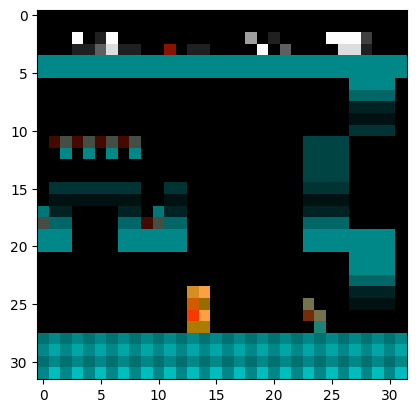

1/1 [==============================] - 0s 19ms/step
Image_1760_lvl_1_Stage_2.png es una fotografía del NIVEL 1


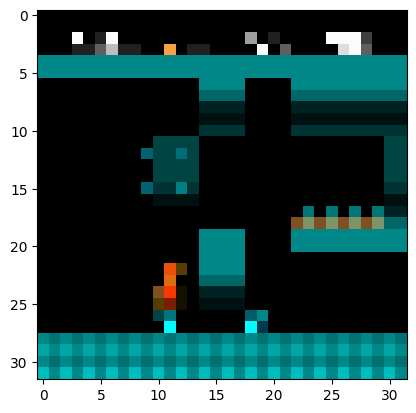

1/1 [==============================] - 0s 23ms/step
Image_2120_lvl_1_Stage_2.png es una fotografía del NIVEL 1


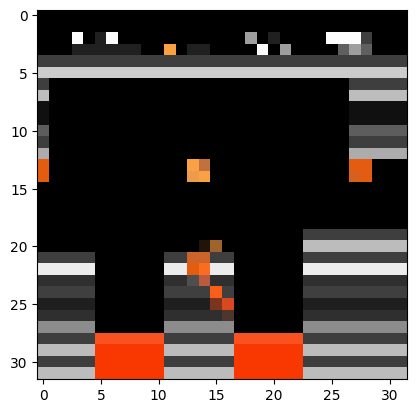

1/1 [==============================] - 0s 26ms/step
Image_1160_lvl_1_Stage_4.png es una fotografía del NIVEL 1


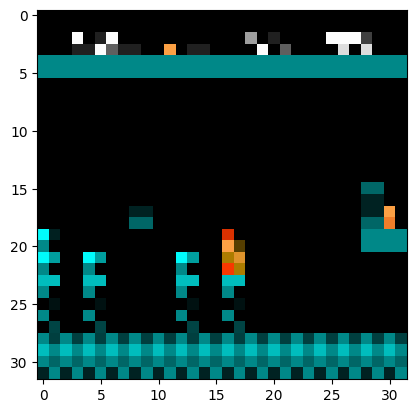

1/1 [==============================] - 0s 30ms/step
Image_1100_lvl_1_Stage_2.png es una fotografía del NIVEL 1


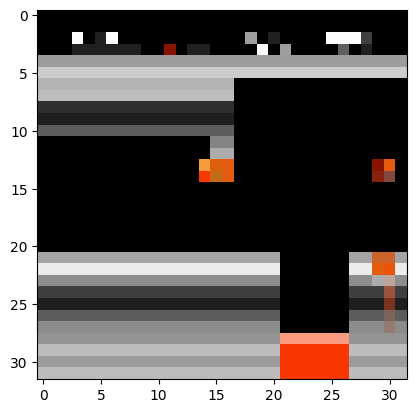

1/1 [==============================] - 0s 28ms/step
Image_800_lvl_1_Stage_4.png es una fotografía del NIVEL 1


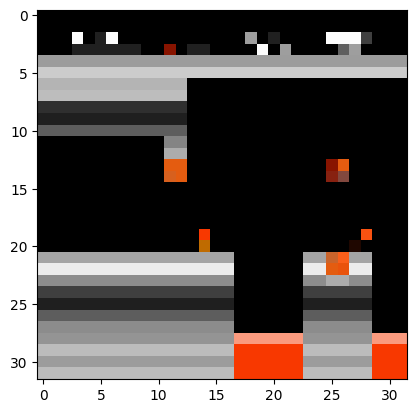

1/1 [==============================] - 0s 26ms/step
Image_1040_lvl_1_Stage_4.png es una fotografía del NIVEL 1


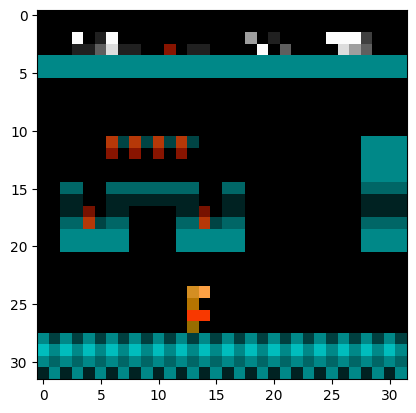

1/1 [==============================] - 0s 27ms/step
Image_1520_lvl_1_Stage_2.png es una fotografía del NIVEL 1


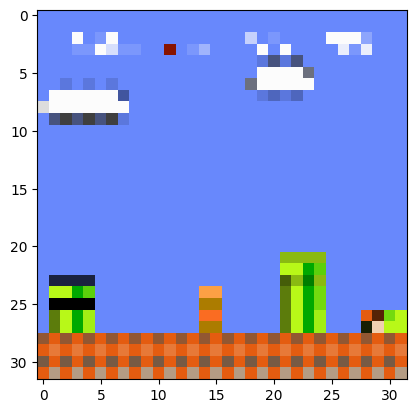

1/1 [==============================] - 0s 27ms/step
Image_2000_lvl_1_Stage_1.png es una fotografía del NIVEL 1


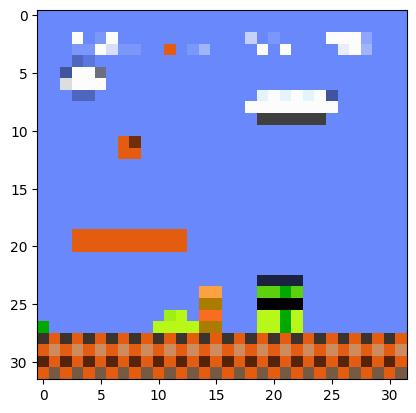

1/1 [==============================] - 0s 31ms/step
Image_1720_lvl_1_Stage_1.png es una fotografía del NIVEL 1


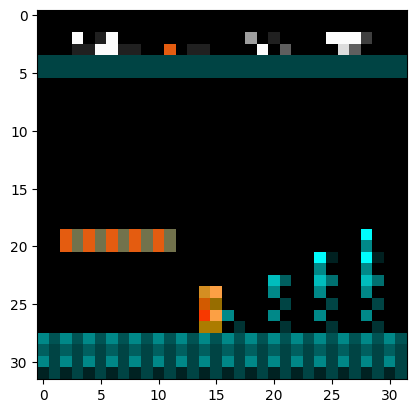

1/1 [==============================] - 0s 26ms/step
Image_840_lvl_1_Stage_2.png es una fotografía del NIVEL 1


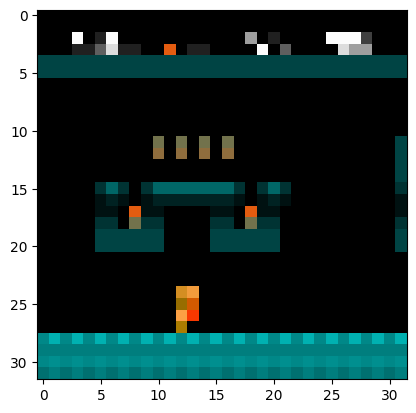

1/1 [==============================] - 0s 59ms/step
Image_1480_lvl_1_Stage_2.png es una fotografía del NIVEL 1


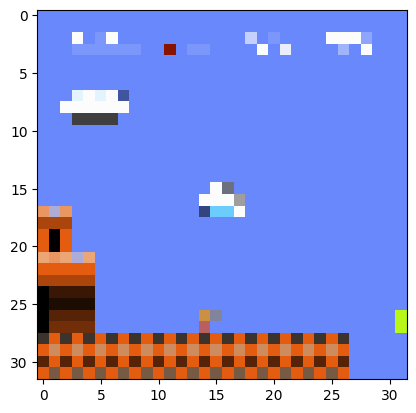

1/1 [==============================] - 0s 29ms/step
Image_180_lvl_1_Stage_3.png es una fotografía del NIVEL 1


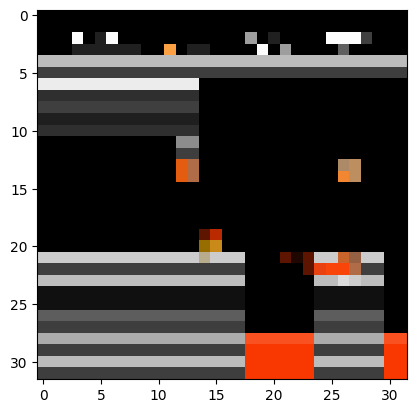

1/1 [==============================] - 0s 27ms/step
Image_1480_lvl_1_Stage_4.png es una fotografía del NIVEL 1


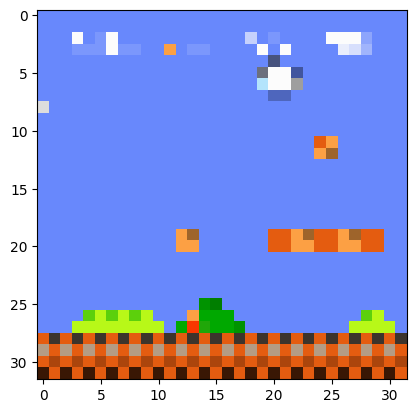

1/1 [==============================] - 0s 19ms/step
Image_960_lvl_1_Stage_1.png es una fotografía del NIVEL 1


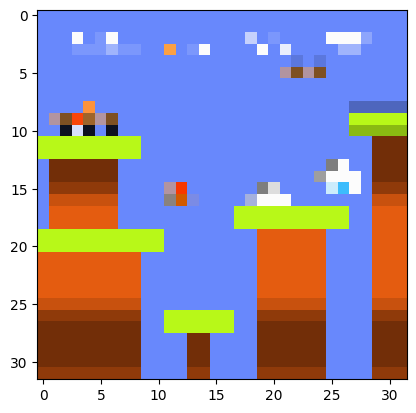

1/1 [==============================] - 0s 19ms/step
Image_440_lvl_1_Stage_3.png es una fotografía del NIVEL 1


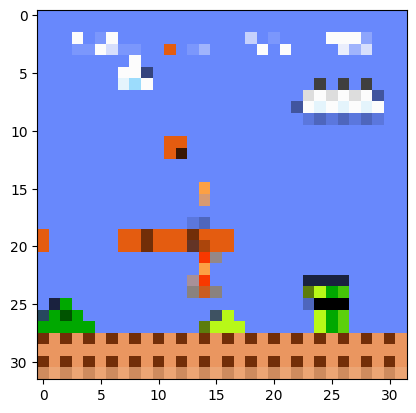

1/1 [==============================] - 0s 20ms/step
Image_1560_lvl_1_Stage_1.png es una fotografía del NIVEL 1


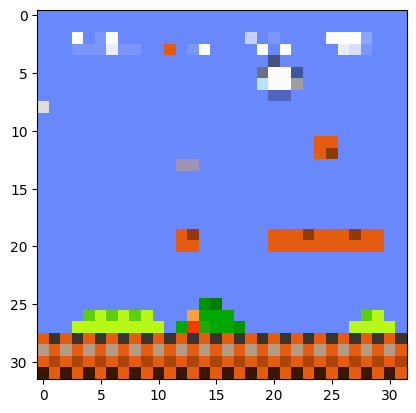

1/1 [==============================] - 0s 22ms/step
Image_1000_lvl_1_Stage_1.png es una fotografía del NIVEL 1


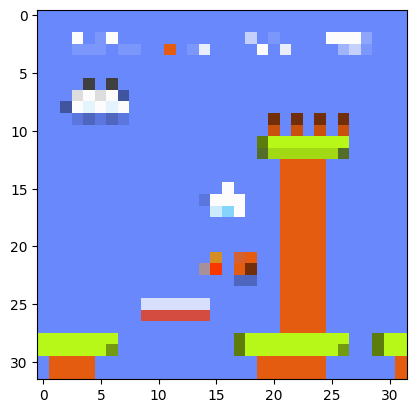

1/1 [==============================] - 0s 21ms/step
Image_1200_lvl_1_Stage_3.png es una fotografía del NIVEL 1


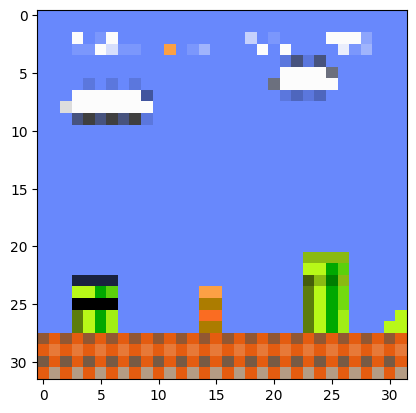

1/1 [==============================] - 0s 18ms/step
Image_1920_lvl_1_Stage_1.png es una fotografía del NIVEL 1


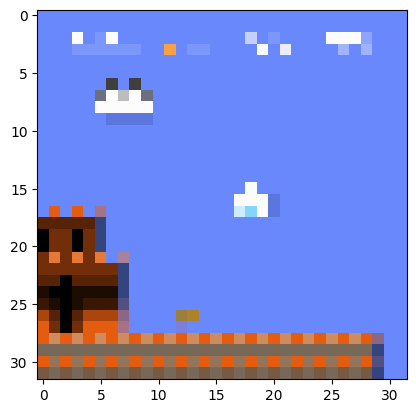

1/1 [==============================] - 0s 25ms/step
Image_160_lvl_1_Stage_3.png es una fotografía del NIVEL 1


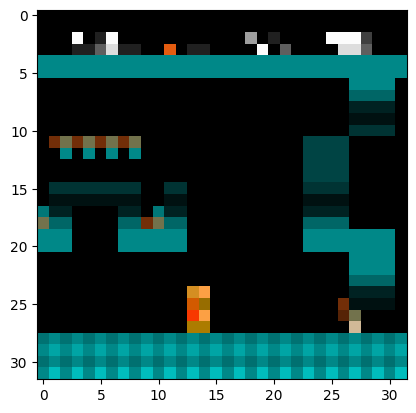

1/1 [==============================] - 0s 24ms/step
Image_1720_lvl_1_Stage_2.png es una fotografía del NIVEL 1


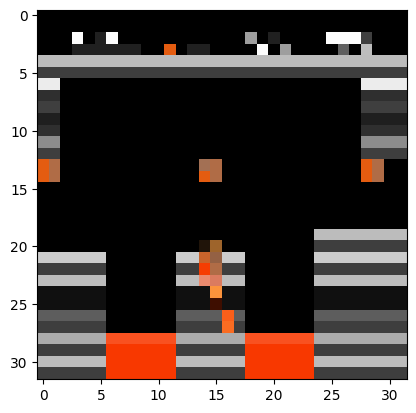

1/1 [==============================] - 0s 17ms/step
Image_1540_lvl_1_Stage_4.png es una fotografía del NIVEL 1


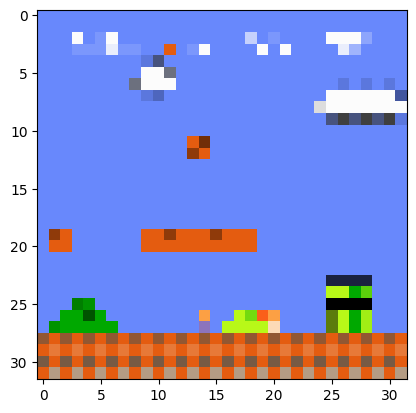

1/1 [==============================] - 0s 18ms/step
Image_1420_lvl_1_Stage_1.png es una fotografía del NIVEL 1


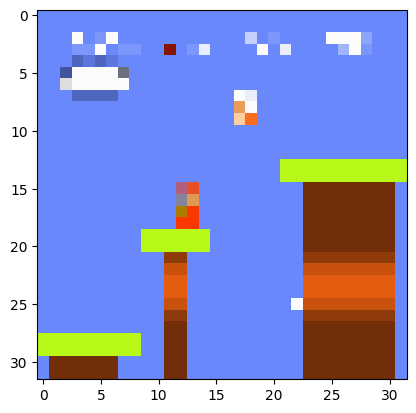

1/1 [==============================] - 0s 20ms/step
Image_1860_lvl_1_Stage_3.png es una fotografía del NIVEL 1


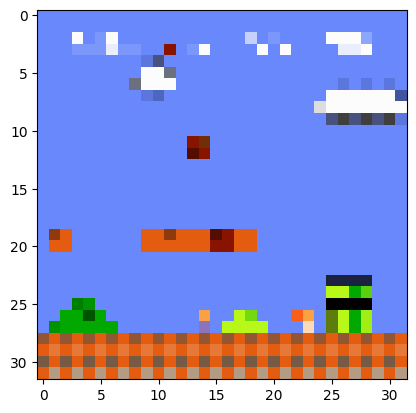

1/1 [==============================] - 0s 22ms/step
Image_1380_lvl_1_Stage_1.png es una fotografía del NIVEL 1


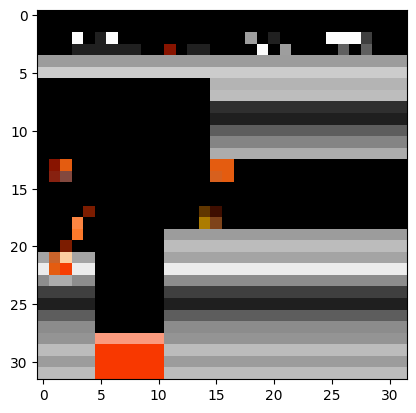

1/1 [==============================] - 0s 24ms/step
Image_1600_lvl_1_Stage_4.png es una fotografía del NIVEL 1


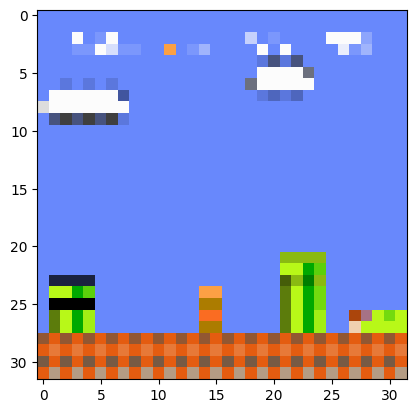

1/1 [==============================] - 0s 21ms/step
Image_2020_lvl_1_Stage_1.png es una fotografía del NIVEL 1


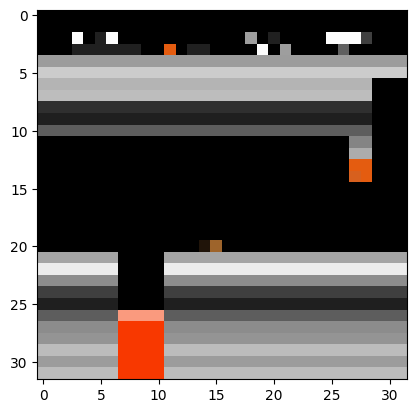

1/1 [==============================] - 0s 19ms/step
Image_620_lvl_1_Stage_4.png es una fotografía del NIVEL 1


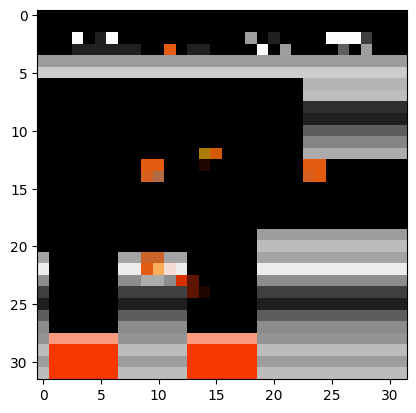

1/1 [==============================] - 0s 30ms/step
Image_1560_lvl_1_Stage_4.png es una fotografía del NIVEL 1


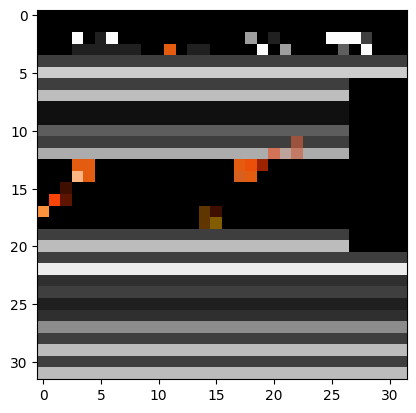

1/1 [==============================] - 0s 21ms/step
Image_2020_lvl_1_Stage_4.png es una fotografía del NIVEL 1


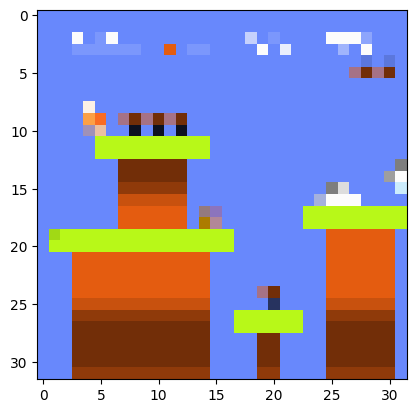

1/1 [==============================] - 0s 19ms/step
Image_380_lvl_1_Stage_3.png es una fotografía del NIVEL 1


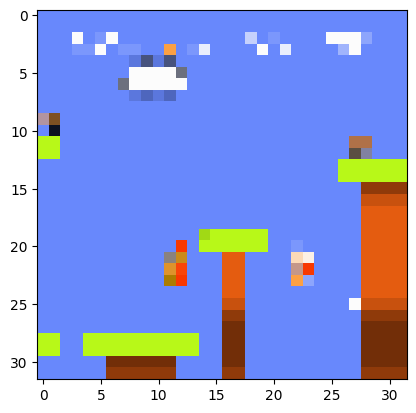

1/1 [==============================] - 0s 19ms/step
Image_1680_lvl_1_Stage_3.png es una fotografía del NIVEL 1


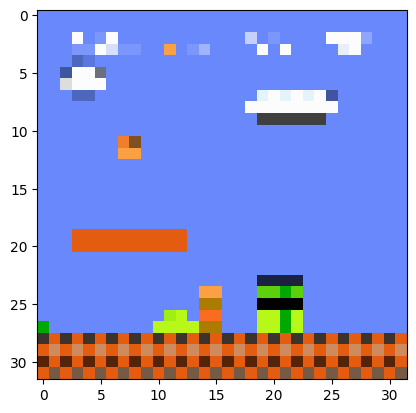

1/1 [==============================] - 0s 26ms/step
Image_1700_lvl_1_Stage_1.png es una fotografía del NIVEL 1


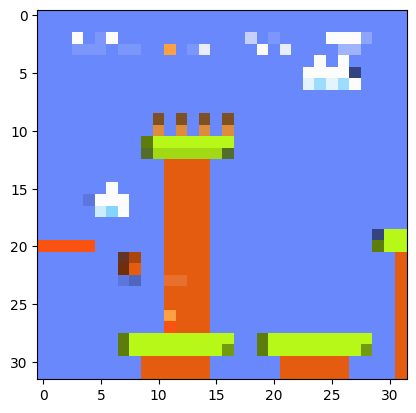

1/1 [==============================] - 0s 18ms/step
Image_1440_lvl_1_Stage_3.png es una fotografía del NIVEL 1


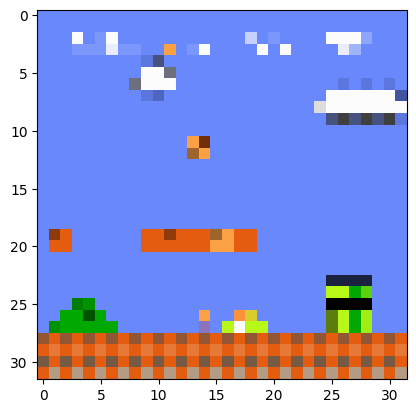

1/1 [==============================] - 0s 21ms/step
Image_1440_lvl_1_Stage_1.png es una fotografía del NIVEL 1


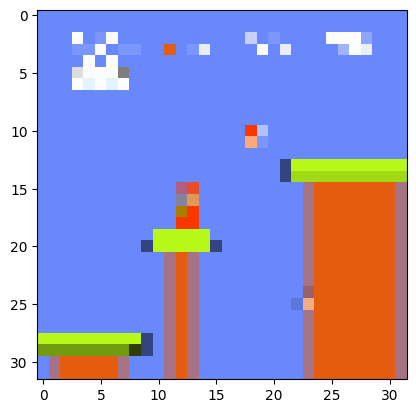

1/1 [==============================] - 0s 20ms/step
Image_1800_lvl_1_Stage_3.png es una fotografía del NIVEL 1


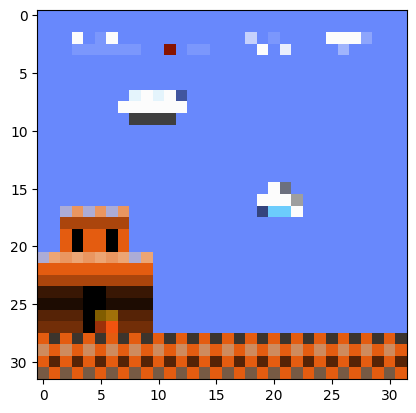

1/1 [==============================] - 0s 26ms/step
Image_80_lvl_1_Stage_3.png es una fotografía del NIVEL 1


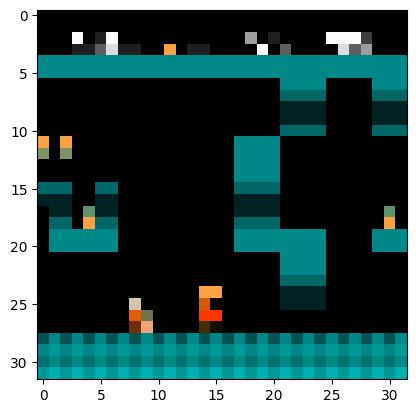

1/1 [==============================] - 0s 22ms/step
Image_1880_lvl_1_Stage_2.png es una fotografía del NIVEL 1


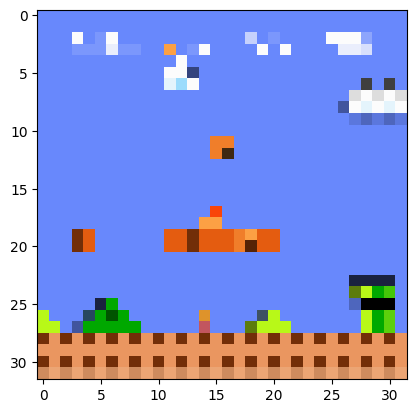

1/1 [==============================] - 0s 18ms/step
Image_1300_lvl_1_Stage_1.png es una fotografía del NIVEL 1


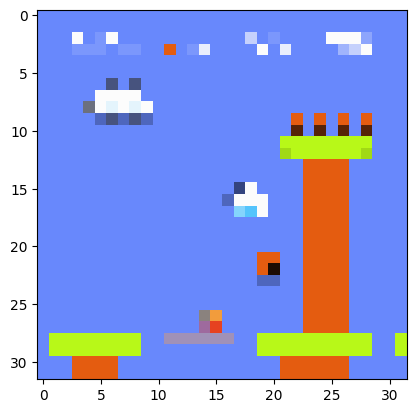

1/1 [==============================] - 0s 21ms/step
Image_1180_lvl_1_Stage_3.png es una fotografía del NIVEL 1


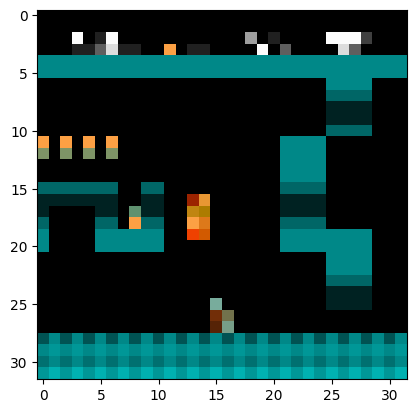

1/1 [==============================] - 0s 24ms/step
Image_1840_lvl_1_Stage_2.png es una fotografía del NIVEL 1


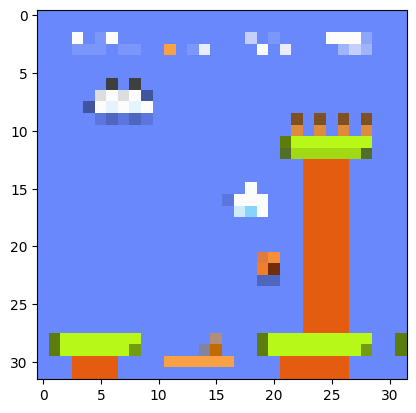

1/1 [==============================] - 0s 45ms/step
Image_1160_lvl_1_Stage_3.png es una fotografía del NIVEL 1


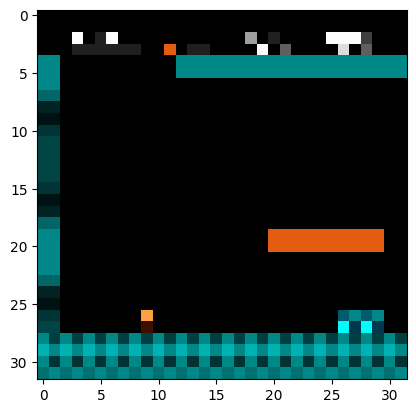

1/1 [==============================] - 0s 24ms/step
Image_360_lvl_1_Stage_2.png es una fotografía del NIVEL 1


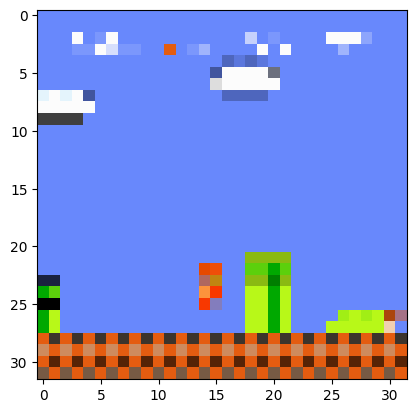

1/1 [==============================] - 0s 23ms/step
Image_2140_lvl_1_Stage_1.png es una fotografía del NIVEL 1


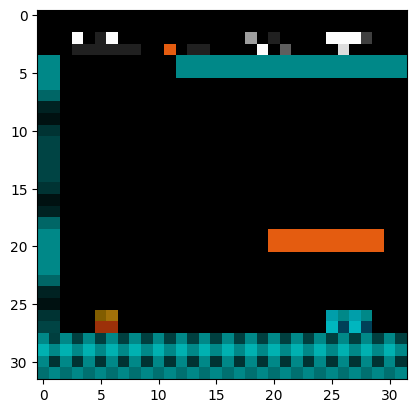

1/1 [==============================] - 0s 20ms/step
Image_80_lvl_1_Stage_2.png es una fotografía del NIVEL 1


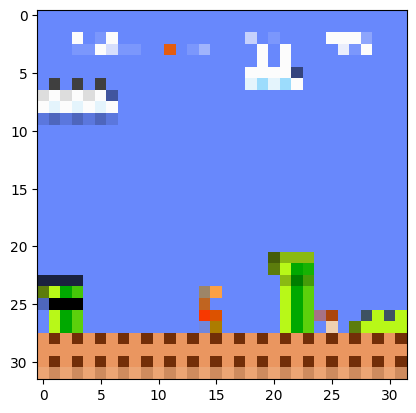

1/1 [==============================] - 0s 32ms/step
Image_2040_lvl_1_Stage_1.png es una fotografía del NIVEL 1


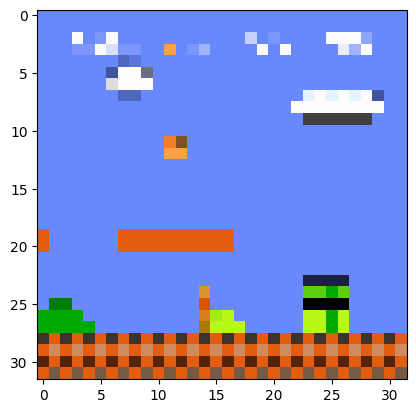

1/1 [==============================] - 0s 24ms/step
Image_1640_lvl_1_Stage_1.png es una fotografía del NIVEL 1


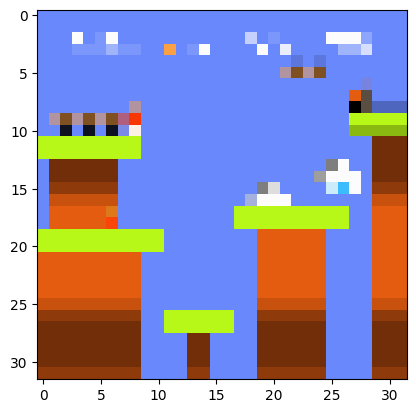

1/1 [==============================] - 0s 25ms/step
Image_500_lvl_1_Stage_3.png es una fotografía del NIVEL 1


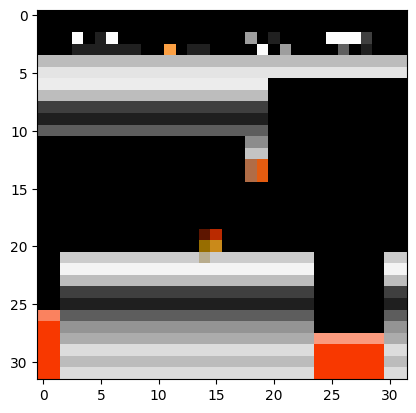

1/1 [==============================] - 0s 22ms/step
Image_1440_lvl_1_Stage_4.png es una fotografía del NIVEL 1


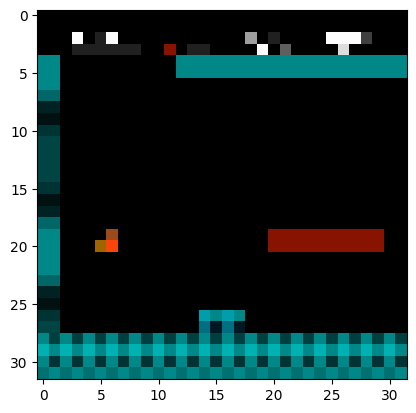

1/1 [==============================] - 0s 21ms/step
Image_220_lvl_1_Stage_2.png es una fotografía del NIVEL 1


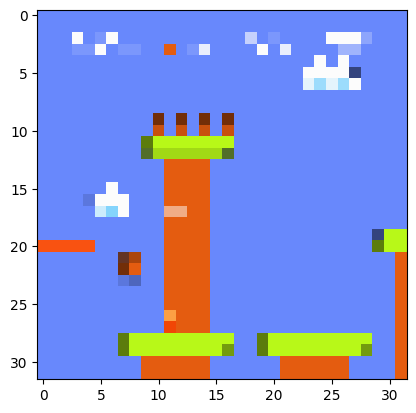

1/1 [==============================] - 0s 19ms/step
Image_1480_lvl_1_Stage_3.png es una fotografía del NIVEL 1


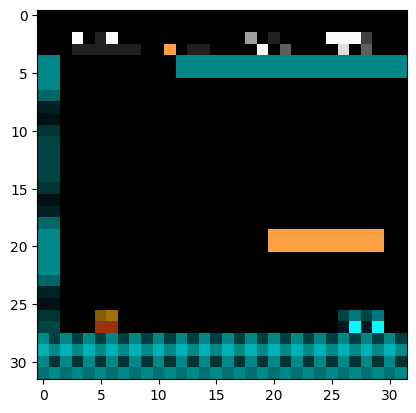

1/1 [==============================] - 0s 29ms/step
Image_60_lvl_1_Stage_2.png es una fotografía del NIVEL 1


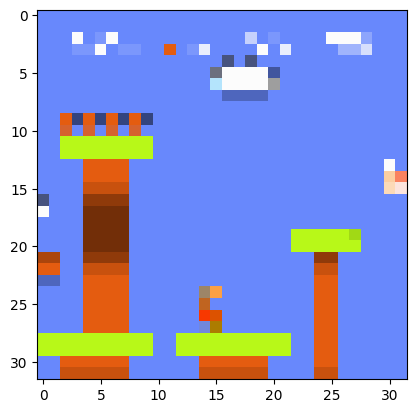

1/1 [==============================] - 0s 30ms/step
Image_1560_lvl_1_Stage_3.png es una fotografía del NIVEL 1


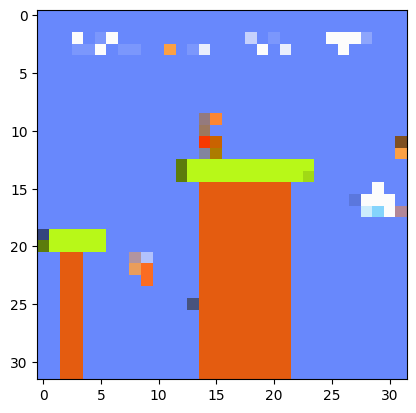

1/1 [==============================] - 0s 33ms/step
Image_2080_lvl_1_Stage_3.png es una fotografía del NIVEL 1


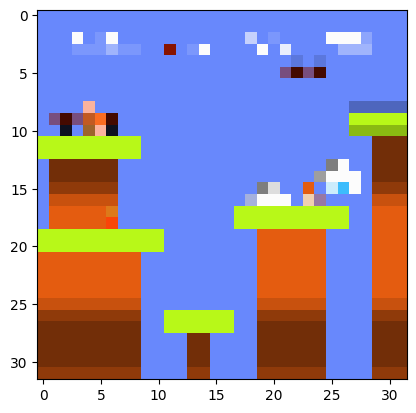

1/1 [==============================] - 0s 26ms/step
Image_560_lvl_1_Stage_3.png es una fotografía del NIVEL 1


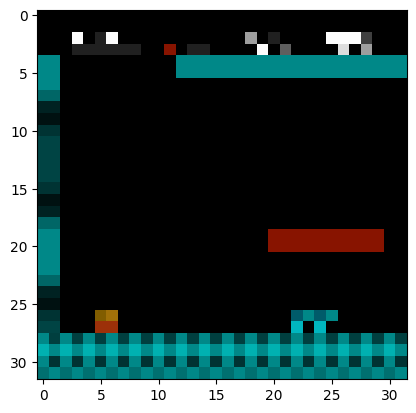

1/1 [==============================] - 0s 26ms/step
Image_120_lvl_1_Stage_2.png es una fotografía del NIVEL 1


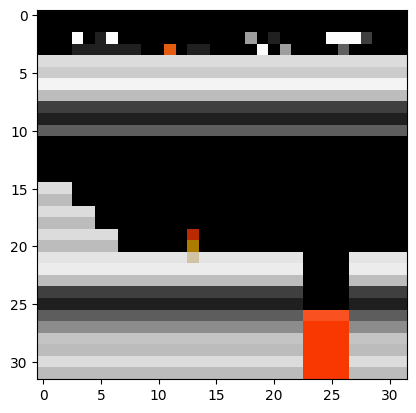

1/1 [==============================] - 0s 27ms/step
Image_1320_lvl_1_Stage_4.png es una fotografía del NIVEL 1


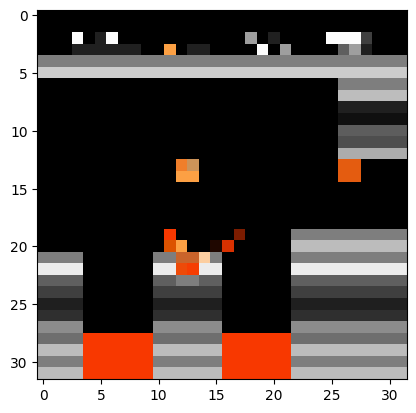

1/1 [==============================] - 0s 27ms/step
Image_1200_lvl_1_Stage_4.png es una fotografía del NIVEL 1


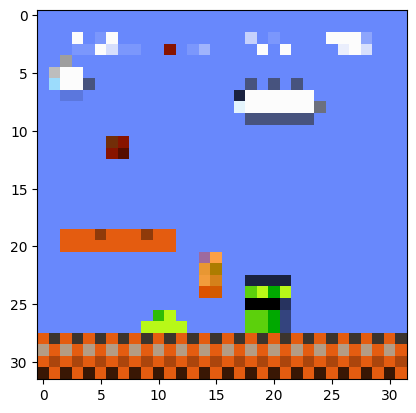

1/1 [==============================] - 0s 26ms/step
Image_1760_lvl_1_Stage_1.png es una fotografía del NIVEL 1


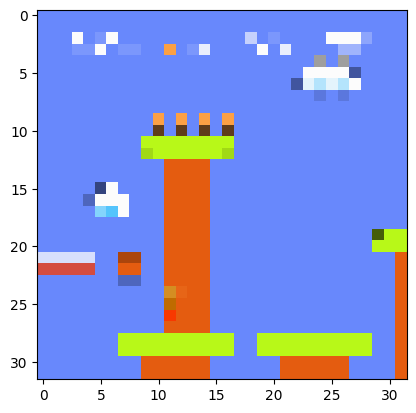

1/1 [==============================] - 0s 26ms/step
Image_1500_lvl_1_Stage_3.png es una fotografía del NIVEL 1


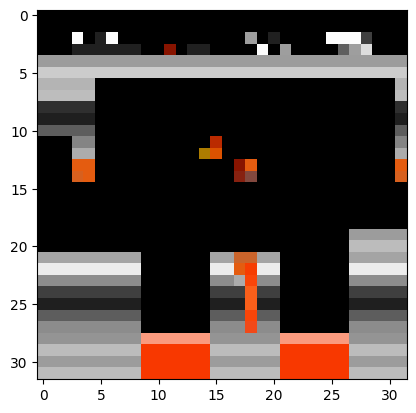

1/1 [==============================] - 0s 30ms/step
Image_1140_lvl_1_Stage_4.png es una fotografía del NIVEL 1


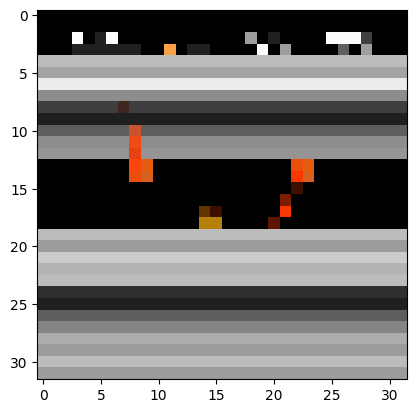

1/1 [==============================] - 0s 29ms/step
Image_1960_lvl_1_Stage_4.png es una fotografía del NIVEL 1


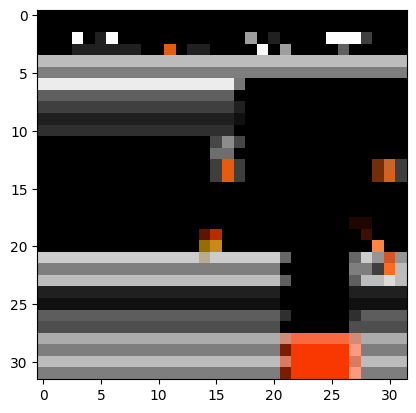

1/1 [==============================] - 0s 38ms/step
Image_1460_lvl_1_Stage_4.png es una fotografía del NIVEL 1


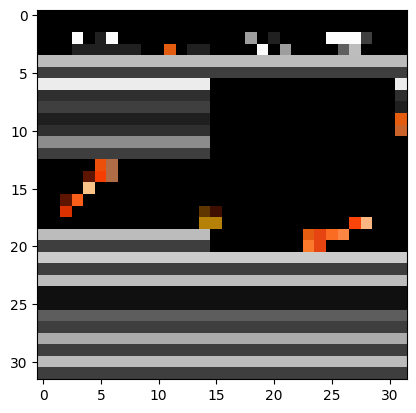

1/1 [==============================] - 0s 22ms/step
Image_2120_lvl_1_Stage_4.png es una fotografía del NIVEL 1


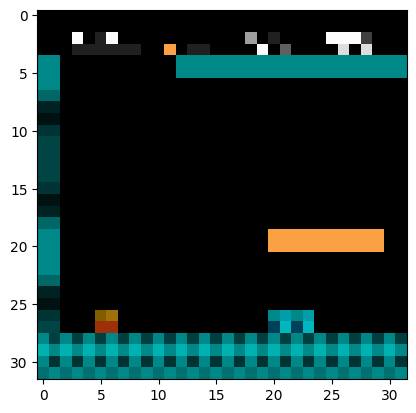

1/1 [==============================] - 0s 24ms/step
Image_140_lvl_1_Stage_2.png es una fotografía del NIVEL 1


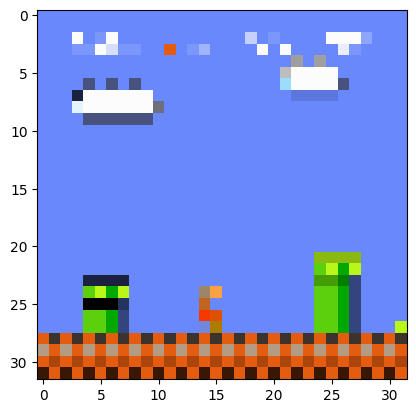

1/1 [==============================] - 0s 23ms/step
Image_1900_lvl_1_Stage_1.png es una fotografía del NIVEL 1


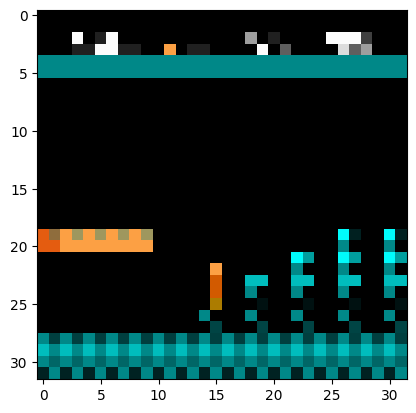

1/1 [==============================] - 0s 25ms/step
Image_880_lvl_1_Stage_2.png es una fotografía del NIVEL 1


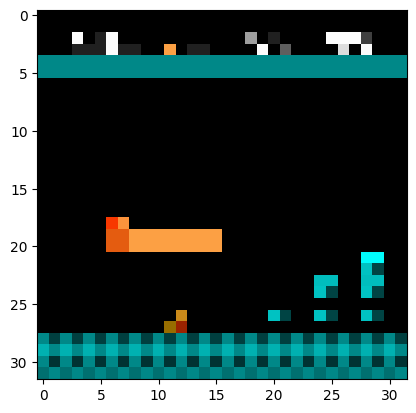

1/1 [==============================] - 0s 27ms/step
Image_680_lvl_1_Stage_2.png es una fotografía del NIVEL 1


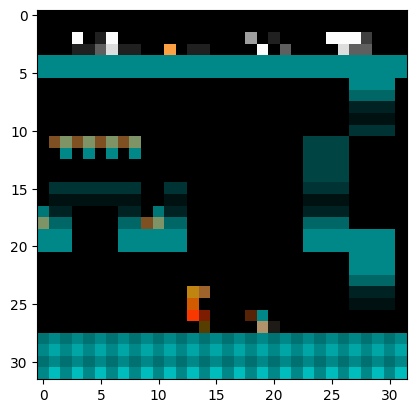

1/1 [==============================] - 0s 27ms/step
Image_1820_lvl_1_Stage_2.png es una fotografía del NIVEL 1


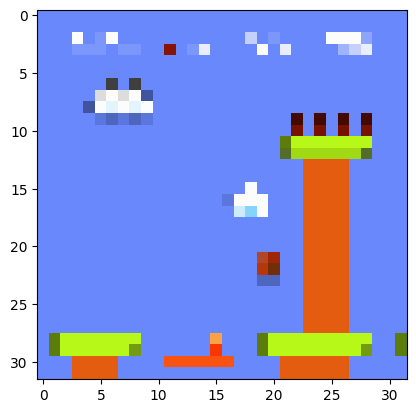

1/1 [==============================] - 0s 22ms/step
Image_1140_lvl_1_Stage_3.png es una fotografía del NIVEL 1


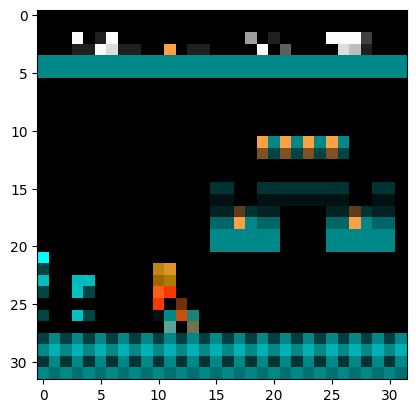

1/1 [==============================] - 0s 39ms/step
Image_1360_lvl_1_Stage_2.png es una fotografía del NIVEL 1


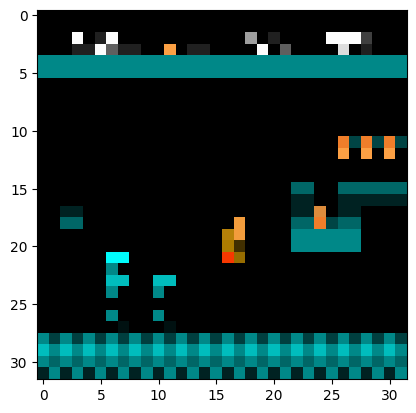

1/1 [==============================] - 0s 22ms/step
Image_1160_lvl_1_Stage_2.png es una fotografía del NIVEL 1


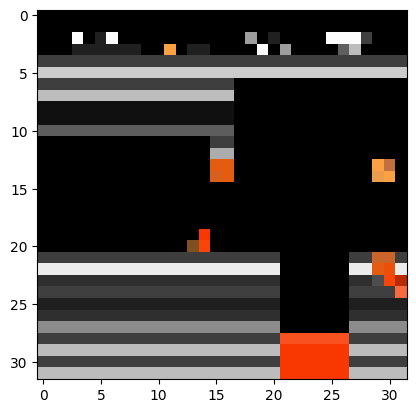

1/1 [==============================] - 0s 26ms/step
Image_820_lvl_1_Stage_4.png es una fotografía del NIVEL 1


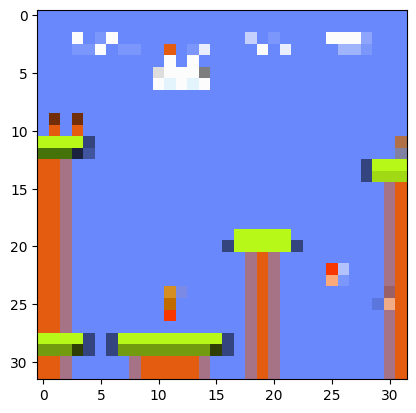

1/1 [==============================] - 0s 24ms/step
Image_1660_lvl_1_Stage_3.png es una fotografía del NIVEL 1


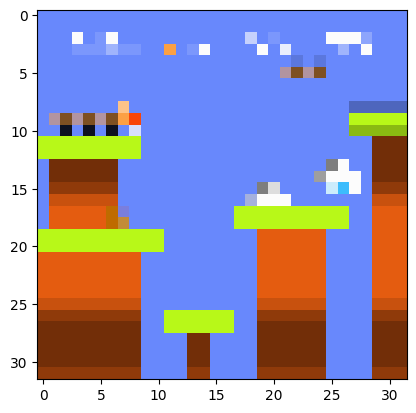

1/1 [==============================] - 0s 24ms/step
Image_780_lvl_1_Stage_3.png es una fotografía del NIVEL 1


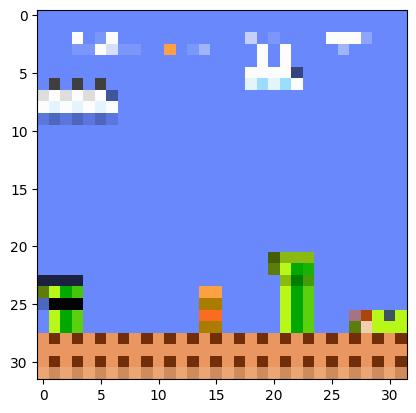

1/1 [==============================] - 0s 23ms/step
Image_2080_lvl_1_Stage_1.png es una fotografía del NIVEL 1


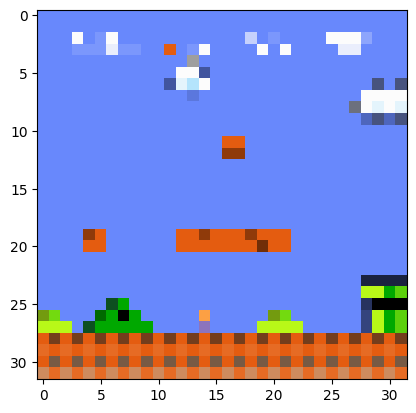

1/1 [==============================] - 0s 24ms/step
Image_1240_lvl_1_Stage_1.png es una fotografía del NIVEL 1


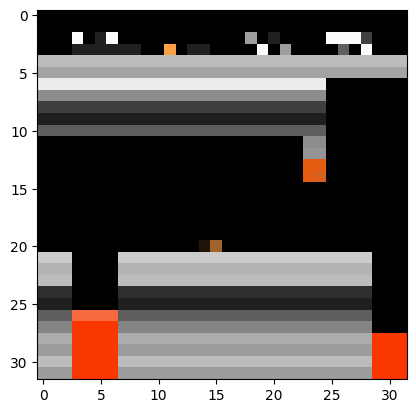

1/1 [==============================] - 0s 24ms/step
Image_1420_lvl_1_Stage_4.png es una fotografía del NIVEL 1


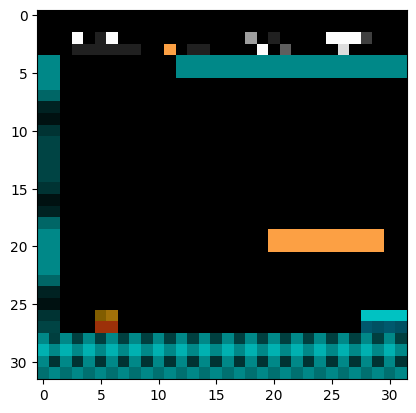

1/1 [==============================] - 0s 21ms/step
Image_40_lvl_1_Stage_2.png es una fotografía del NIVEL 1


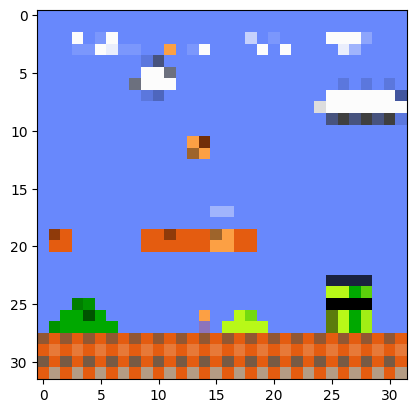

1/1 [==============================] - 0s 29ms/step
Image_1500_lvl_1_Stage_1.png es una fotografía del NIVEL 1


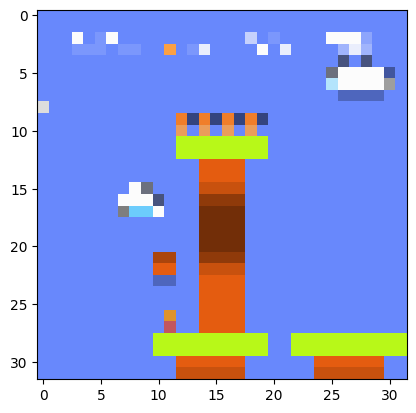

1/1 [==============================] - 0s 22ms/step
Image_1360_lvl_1_Stage_3.png es una fotografía del NIVEL 1


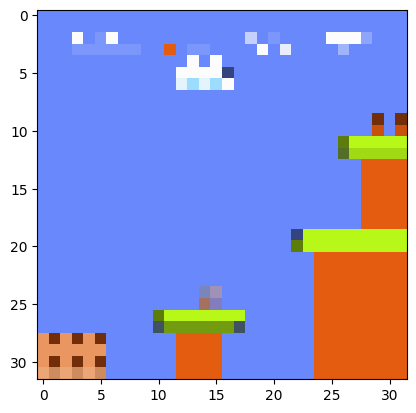

1/1 [==============================] - 0s 25ms/step
Image_280_lvl_1_Stage_3.png es una fotografía del NIVEL 1


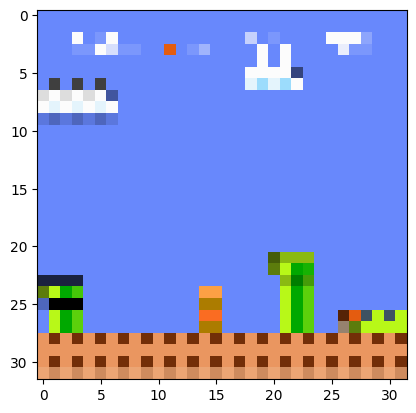

1/1 [==============================] - 0s 24ms/step
Image_2060_lvl_1_Stage_1.png es una fotografía del NIVEL 1


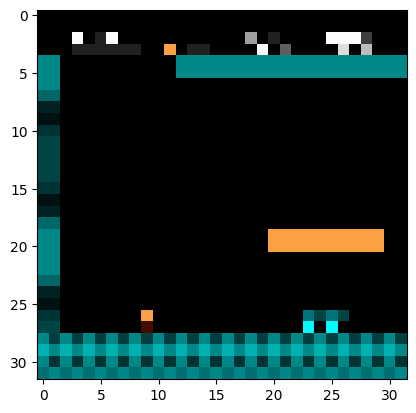

1/1 [==============================] - 0s 27ms/step
Image_400_lvl_1_Stage_2.png es una fotografía del NIVEL 1


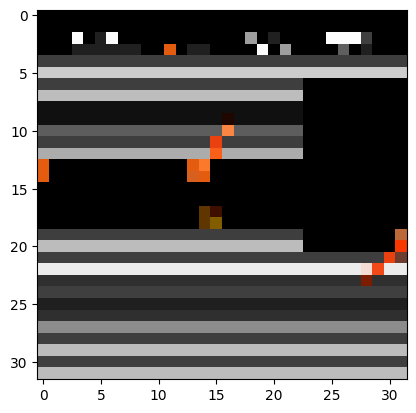

1/1 [==============================] - 0s 20ms/step
Image_2040_lvl_1_Stage_4.png es una fotografía del NIVEL 1


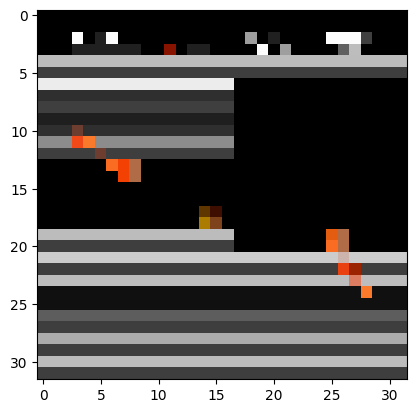

1/1 [==============================] - 0s 23ms/step
Image_2080_lvl_1_Stage_4.png es una fotografía del NIVEL 1


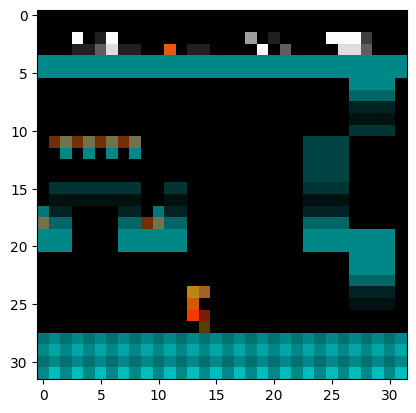

1/1 [==============================] - 0s 28ms/step
Image_1620_lvl_1_Stage_2.png es una fotografía del NIVEL 1


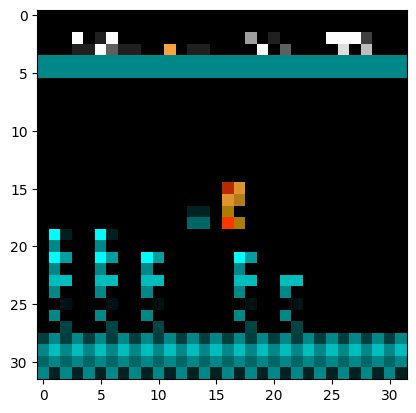

1/1 [==============================] - 0s 29ms/step
Image_1060_lvl_1_Stage_2.png es una fotografía del NIVEL 1


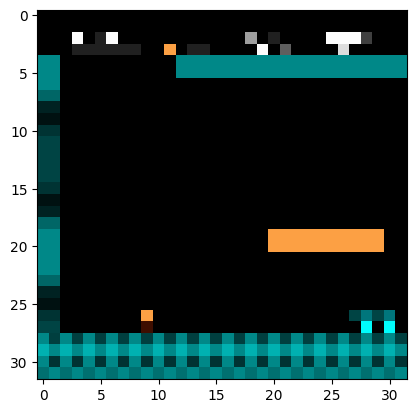

1/1 [==============================] - 0s 27ms/step
Image_340_lvl_1_Stage_2.png es una fotografía del NIVEL 1


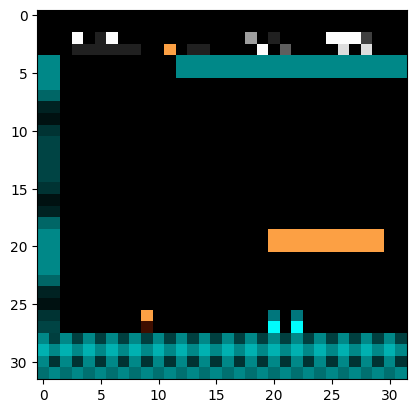

1/1 [==============================] - 0s 25ms/step
Image_440_lvl_1_Stage_2.png es una fotografía del NIVEL 1


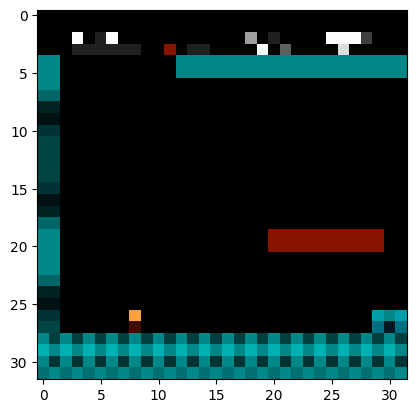

1/1 [==============================] - 0s 29ms/step
Image_320_lvl_1_Stage_2.png es una fotografía del NIVEL 1


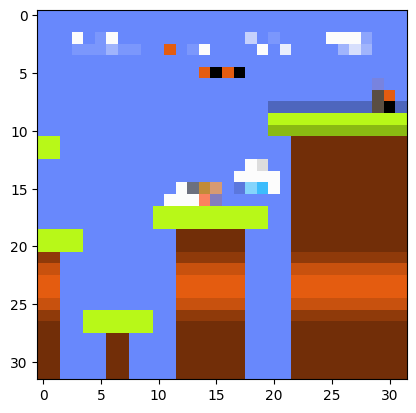

1/1 [==============================] - 0s 23ms/step
Image_860_lvl_1_Stage_3.png es una fotografía del NIVEL 1


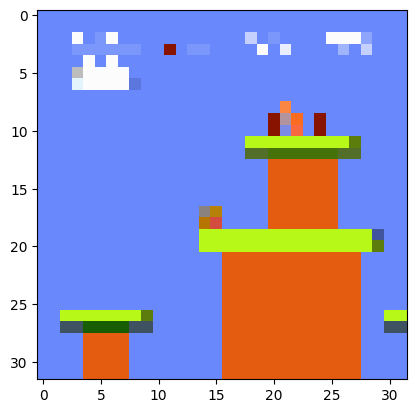

1/1 [==============================] - 0s 28ms/step
Image_320_lvl_1_Stage_3.png es una fotografía del NIVEL 1


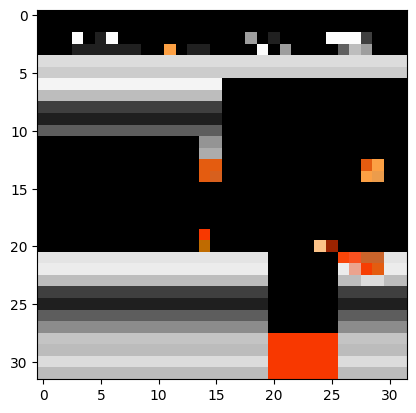

1/1 [==============================] - 0s 24ms/step
Image_920_lvl_1_Stage_4.png es una fotografía del NIVEL 1


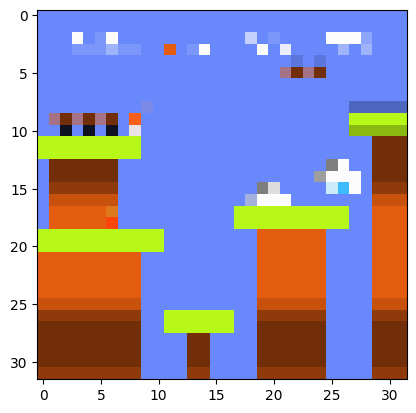

1/1 [==============================] - 0s 28ms/step
Image_760_lvl_1_Stage_3.png es una fotografía del NIVEL 1


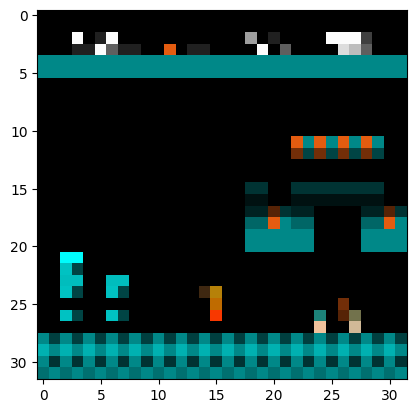

1/1 [==============================] - 0s 21ms/step
Image_1220_lvl_1_Stage_2.png es una fotografía del NIVEL 1


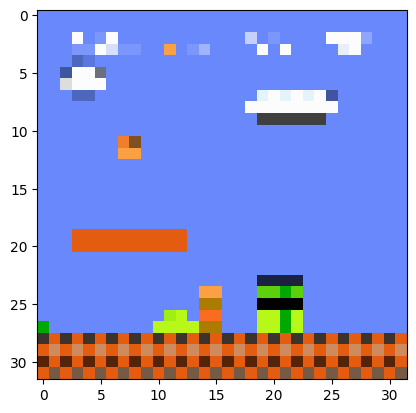

1/1 [==============================] - 0s 31ms/step
Image_1680_lvl_1_Stage_1.png es una fotografía del NIVEL 1


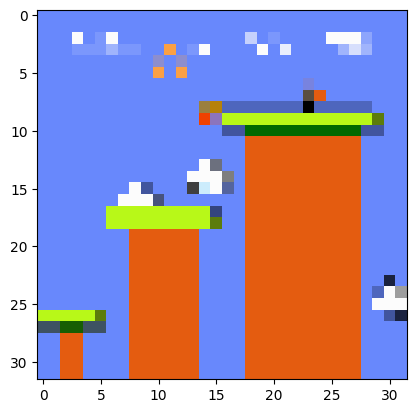

1/1 [==============================] - 0s 37ms/step
Image_880_lvl_1_Stage_3.png es una fotografía del NIVEL 1


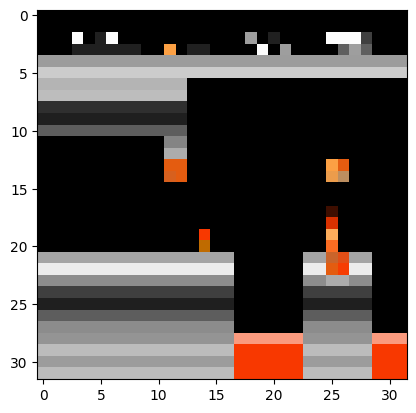

1/1 [==============================] - 0s 27ms/step
Image_1060_lvl_1_Stage_4.png es una fotografía del NIVEL 1


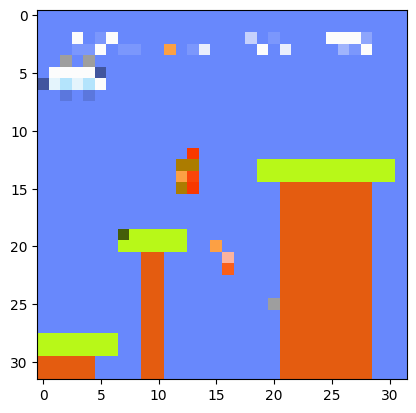

1/1 [==============================] - 0s 29ms/step
Image_2040_lvl_1_Stage_3.png es una fotografía del NIVEL 1


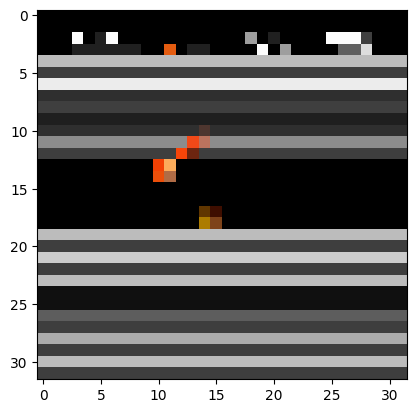

1/1 [==============================] - 0s 30ms/step
Image_1780_lvl_1_Stage_4.png es una fotografía del NIVEL 1


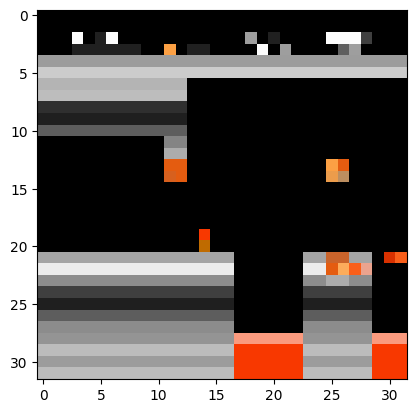

1/1 [==============================] - 0s 60ms/step
Image_1020_lvl_1_Stage_4.png es una fotografía del NIVEL 1


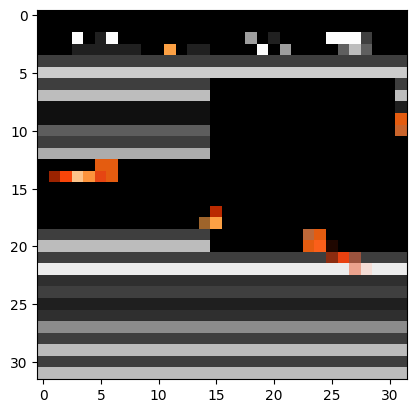

1/1 [==============================] - 0s 41ms/step
Image_2100_lvl_1_Stage_4.png es una fotografía del NIVEL 1


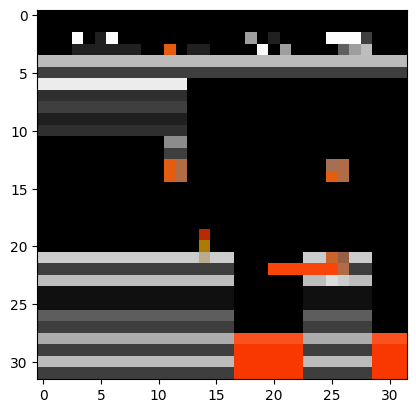

1/1 [==============================] - 0s 26ms/step
Image_1100_lvl_1_Stage_4.png es una fotografía del NIVEL 1


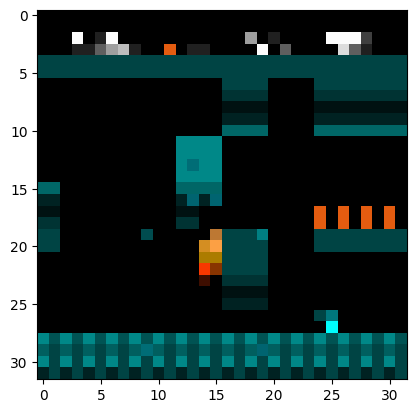

1/1 [==============================] - 0s 41ms/step
Image_1960_lvl_1_Stage_2.png es una fotografía del NIVEL 1


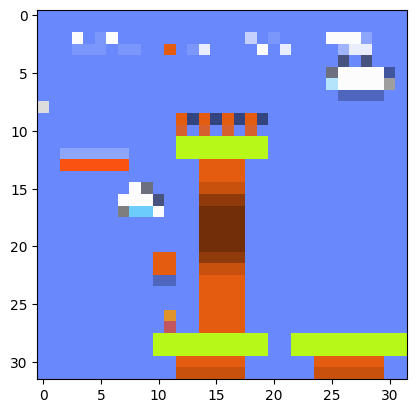

1/1 [==============================] - 0s 28ms/step
Image_1340_lvl_1_Stage_3.png es una fotografía del NIVEL 1


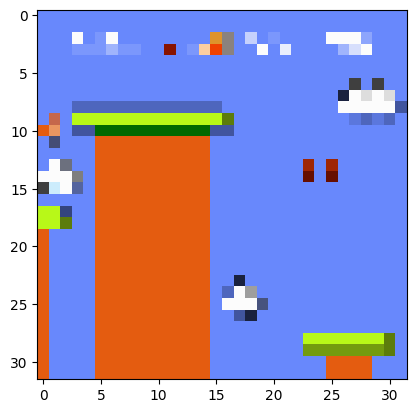

1/1 [==============================] - 0s 32ms/step
Image_1000_lvl_1_Stage_3.png es una fotografía del NIVEL 1


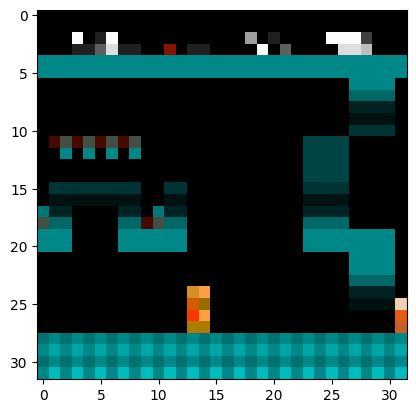

1/1 [==============================] - 0s 26ms/step
Image_1660_lvl_1_Stage_2.png es una fotografía del NIVEL 1


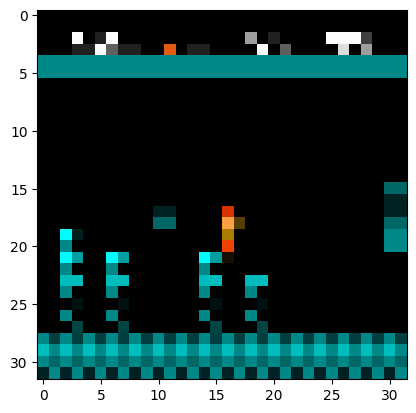

1/1 [==============================] - 0s 26ms/step
Image_1080_lvl_1_Stage_2.png es una fotografía del NIVEL 1


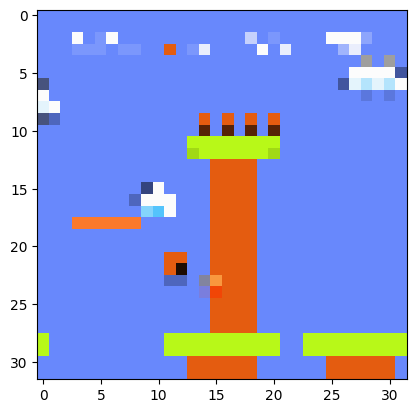

1/1 [==============================] - 0s 34ms/step
Image_1240_lvl_1_Stage_3.png es una fotografía del NIVEL 1


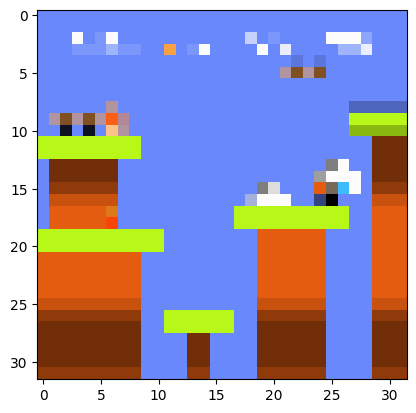

1/1 [==============================] - 0s 21ms/step
Image_540_lvl_1_Stage_3.png es una fotografía del NIVEL 1


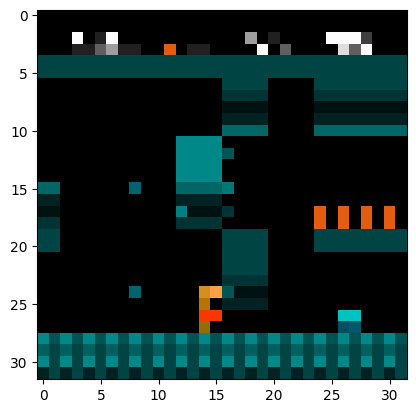

1/1 [==============================] - 0s 24ms/step
Image_1940_lvl_1_Stage_2.png es una fotografía del NIVEL 1


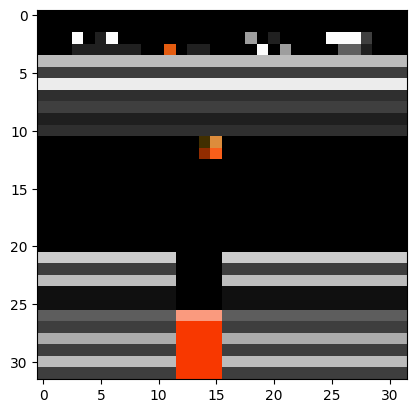

1/1 [==============================] - 0s 24ms/step
Image_600_lvl_1_Stage_4.png es una fotografía del NIVEL 1


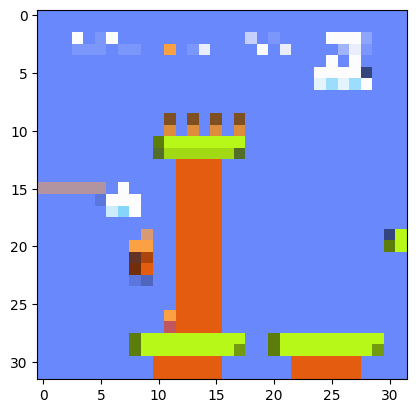

1/1 [==============================] - 0s 26ms/step
Image_1400_lvl_1_Stage_3.png es una fotografía del NIVEL 1


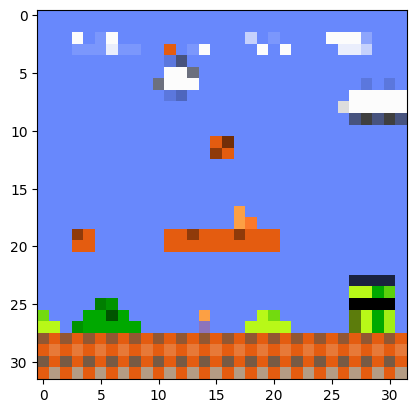

1/1 [==============================] - 0s 24ms/step
Image_1320_lvl_1_Stage_1.png es una fotografía del NIVEL 1


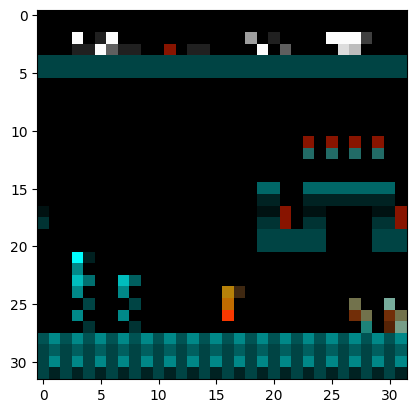

1/1 [==============================] - 0s 24ms/step
Image_1180_lvl_1_Stage_2.png es una fotografía del NIVEL 1


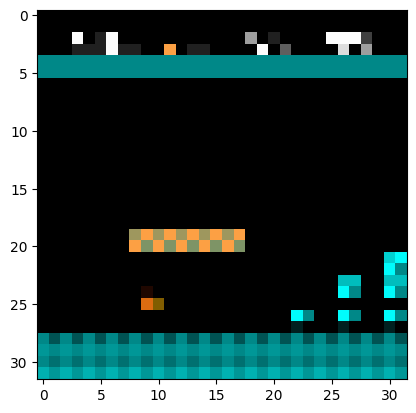

1/1 [==============================] - 0s 27ms/step
Image_620_lvl_1_Stage_2.png es una fotografía del NIVEL 1


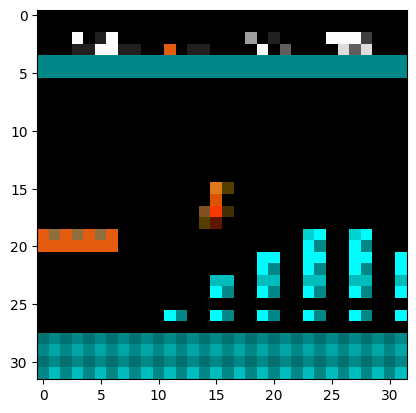

1/1 [==============================] - 0s 25ms/step
Image_900_lvl_1_Stage_2.png es una fotografía del NIVEL 1


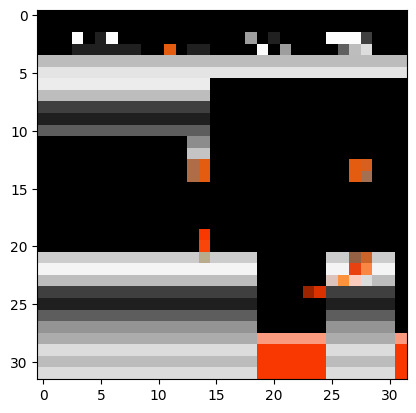

1/1 [==============================] - 0s 20ms/step
Image_940_lvl_1_Stage_4.png es una fotografía del NIVEL 1


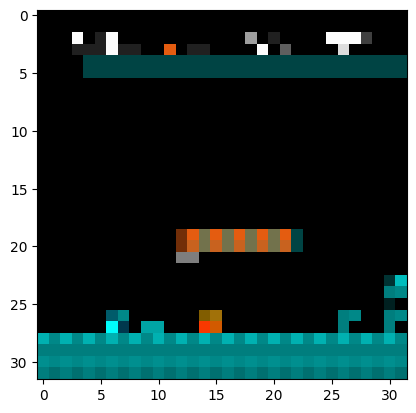

1/1 [==============================] - 0s 29ms/step
Image_520_lvl_1_Stage_2.png es una fotografía del NIVEL 1


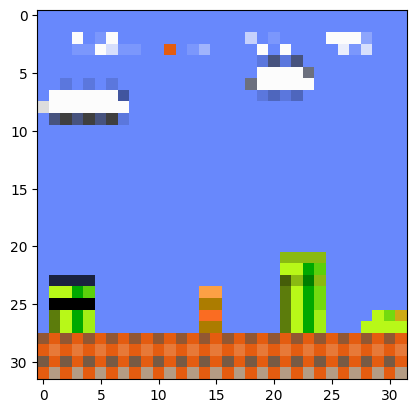

1/1 [==============================] - 0s 24ms/step
Image_1960_lvl_1_Stage_1.png es una fotografía del NIVEL 1


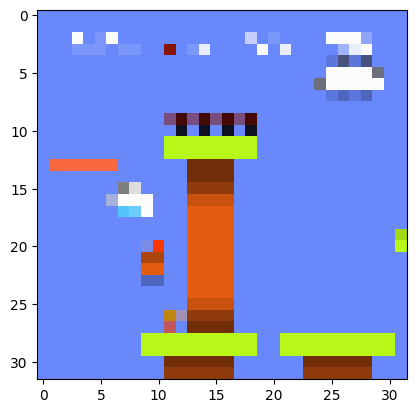

1/1 [==============================] - 0s 31ms/step
Image_1380_lvl_1_Stage_3.png es una fotografía del NIVEL 1


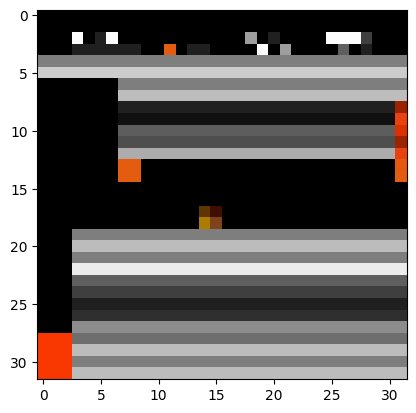

1/1 [==============================] - 0s 25ms/step
Image_1640_lvl_1_Stage_4.png es una fotografía del NIVEL 1


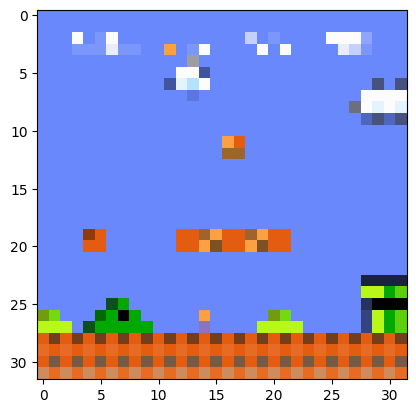

1/1 [==============================] - 0s 33ms/step
Image_1200_lvl_1_Stage_1.png es una fotografía del NIVEL 1


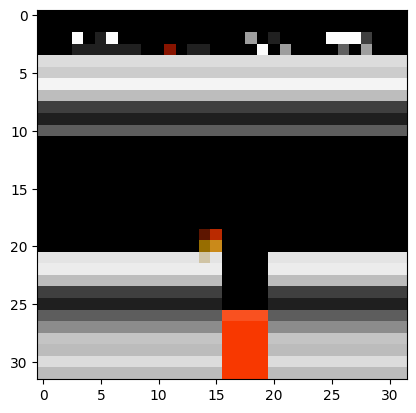

1/1 [==============================] - 0s 24ms/step
Image_1360_lvl_1_Stage_4.png es una fotografía del NIVEL 1


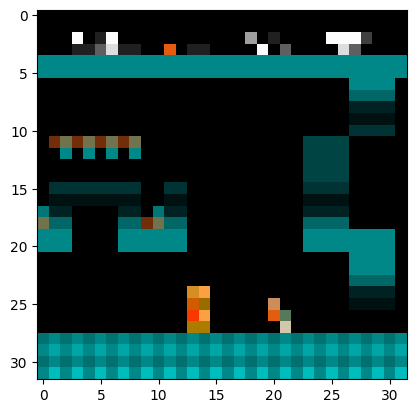

1/1 [==============================] - 0s 26ms/step
Image_1800_lvl_1_Stage_2.png es una fotografía del NIVEL 1


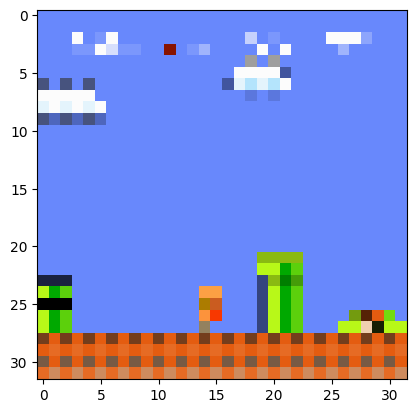

1/1 [==============================] - 0s 29ms/step
Image_2100_lvl_1_Stage_1.png es una fotografía del NIVEL 1


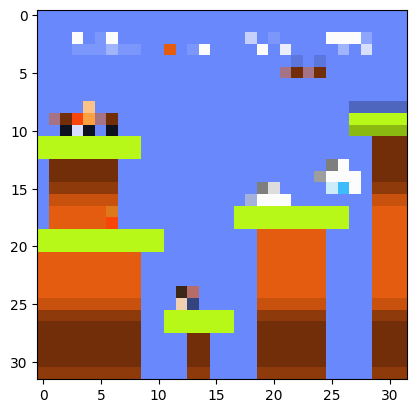

1/1 [==============================] - 0s 31ms/step
Image_700_lvl_1_Stage_3.png es una fotografía del NIVEL 1


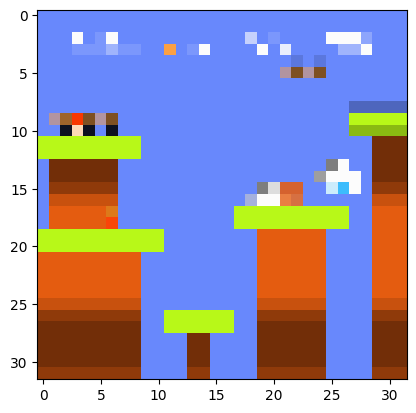

1/1 [==============================] - 0s 26ms/step
Image_580_lvl_1_Stage_3.png es una fotografía del NIVEL 1


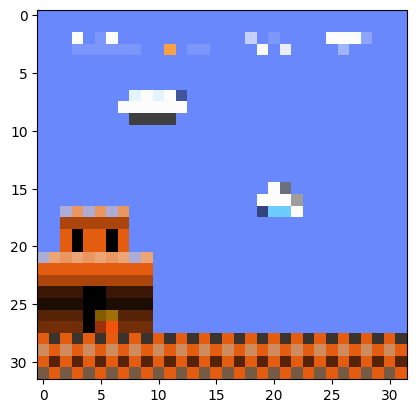

1/1 [==============================] - 0s 28ms/step
Image_20_lvl_1_Stage_3.png es una fotografía del NIVEL 1


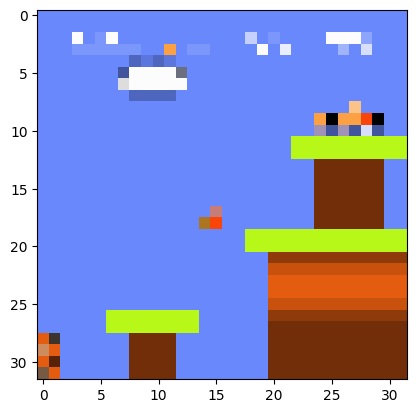

1/1 [==============================] - 0s 28ms/step
Image_300_lvl_1_Stage_3.png es una fotografía del NIVEL 1


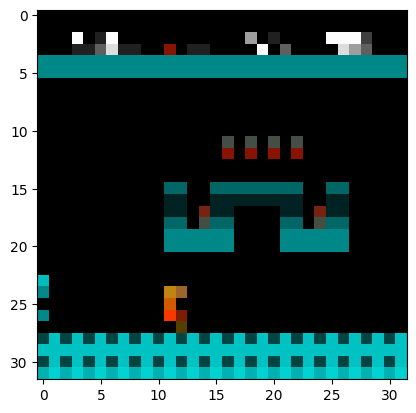

1/1 [==============================] - 0s 25ms/step
Image_1420_lvl_1_Stage_2.png es una fotografía del NIVEL 1


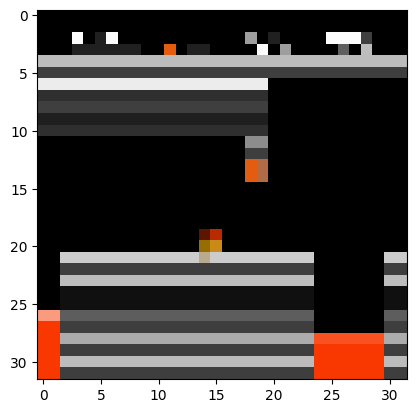

1/1 [==============================] - 0s 28ms/step
Image_700_lvl_1_Stage_4.png es una fotografía del NIVEL 1


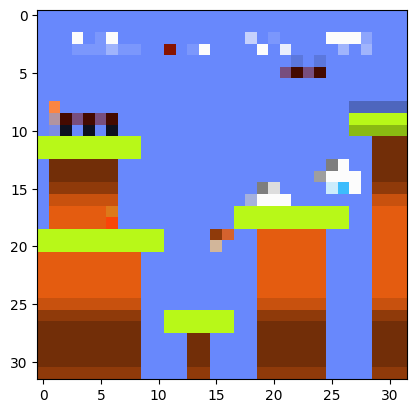

1/1 [==============================] - 0s 27ms/step
Image_660_lvl_1_Stage_3.png es una fotografía del NIVEL 1


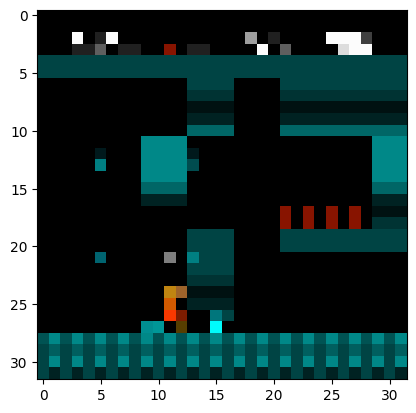

1/1 [==============================] - 0s 28ms/step
Image_2140_lvl_1_Stage_2.png es una fotografía del NIVEL 1


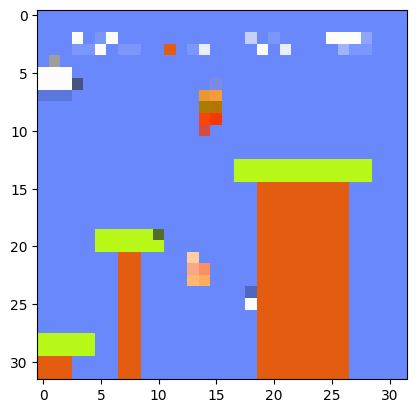

1/1 [==============================] - 0s 30ms/step
Image_2060_lvl_1_Stage_3.png es una fotografía del NIVEL 1


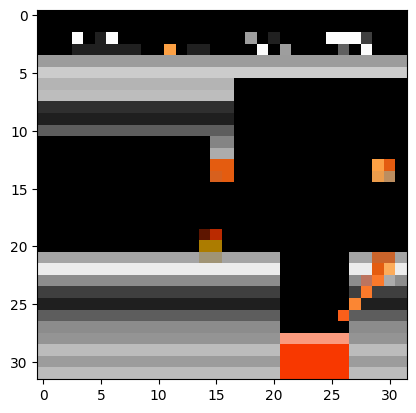

1/1 [==============================] - 0s 27ms/step
Image_780_lvl_1_Stage_4.png es una fotografía del NIVEL 1


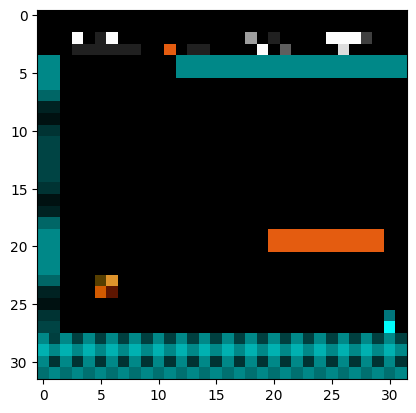

1/1 [==============================] - 0s 30ms/step
Image_20_lvl_1_Stage_2.png es una fotografía del NIVEL 1


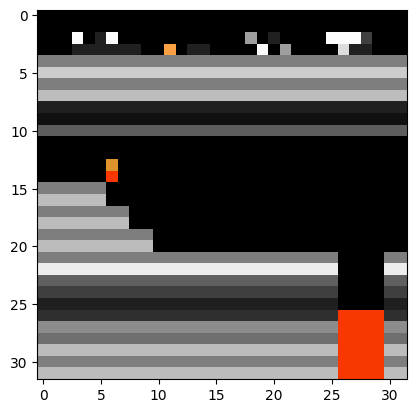

1/1 [==============================] - 0s 32ms/step
Image_1240_lvl_1_Stage_4.png es una fotografía del NIVEL 1


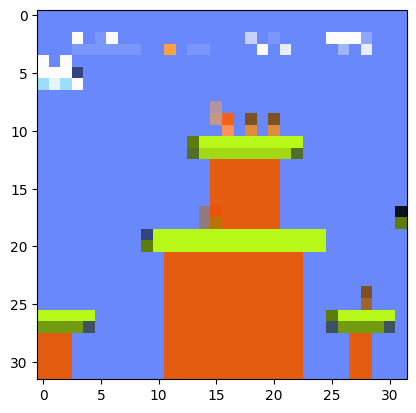

1/1 [==============================] - 0s 32ms/step
Image_340_lvl_1_Stage_3.png es una fotografía del NIVEL 1


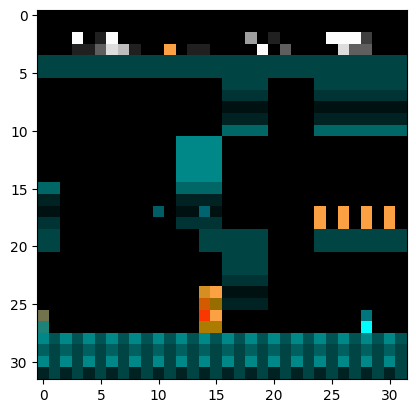

1/1 [==============================] - 0s 27ms/step
Image_1920_lvl_1_Stage_2.png es una fotografía del NIVEL 1


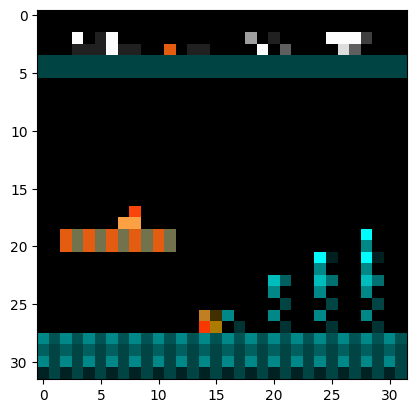

1/1 [==============================] - 0s 28ms/step
Image_740_lvl_1_Stage_2.png es una fotografía del NIVEL 1


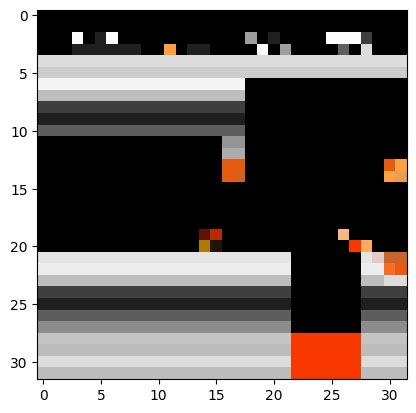

1/1 [==============================] - 0s 36ms/step
Image_740_lvl_1_Stage_4.png es una fotografía del NIVEL 1


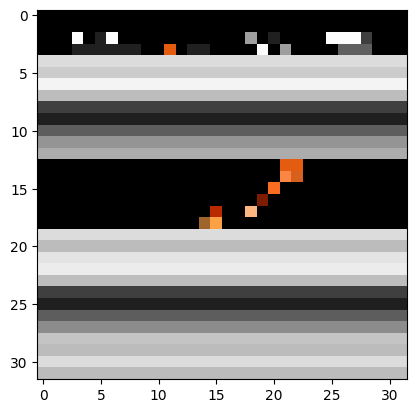

1/1 [==============================] - 0s 25ms/step
Image_1700_lvl_1_Stage_4.png es una fotografía del NIVEL 1


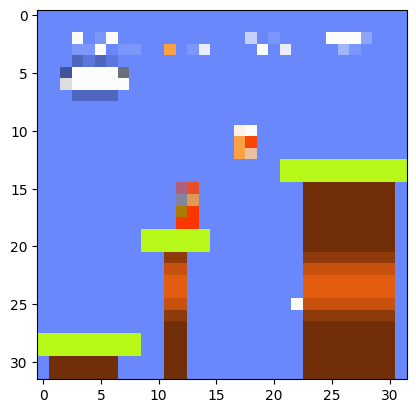

1/1 [==============================] - 0s 25ms/step
Image_1940_lvl_1_Stage_3.png es una fotografía del NIVEL 1


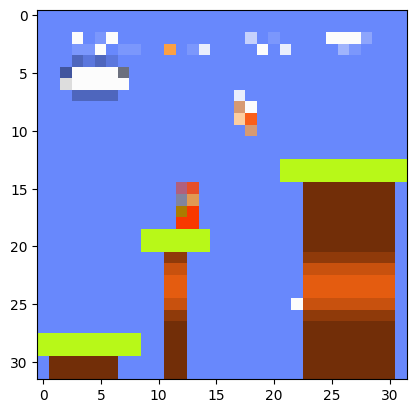

1/1 [==============================] - 0s 24ms/step
Image_1880_lvl_1_Stage_3.png es una fotografía del NIVEL 1


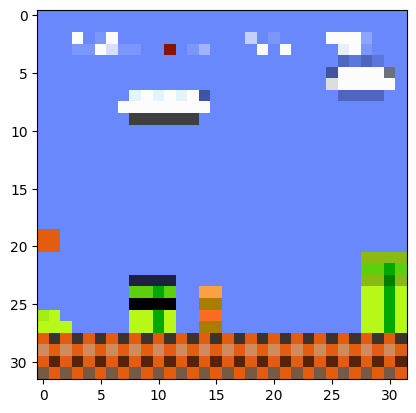

1/1 [==============================] - 0s 33ms/step
Image_1860_lvl_1_Stage_1.png es una fotografía del NIVEL 1


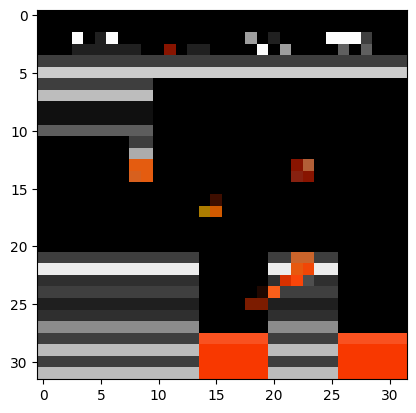

1/1 [==============================] - 0s 25ms/step
Image_1500_lvl_1_Stage_4.png es una fotografía del NIVEL 1


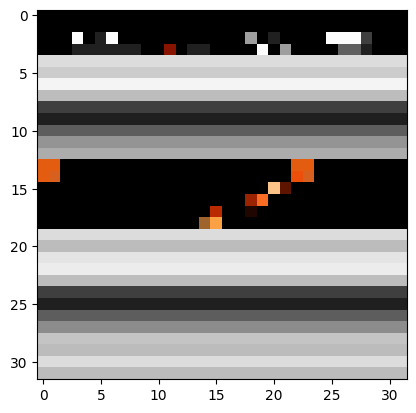

1/1 [==============================] - 0s 31ms/step
Image_1840_lvl_1_Stage_4.png es una fotografía del NIVEL 1


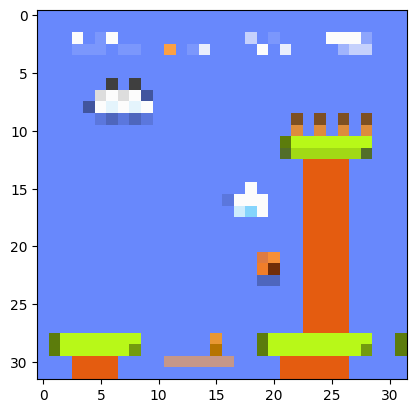

1/1 [==============================] - 0s 25ms/step
Image_1120_lvl_1_Stage_3.png es una fotografía del NIVEL 1


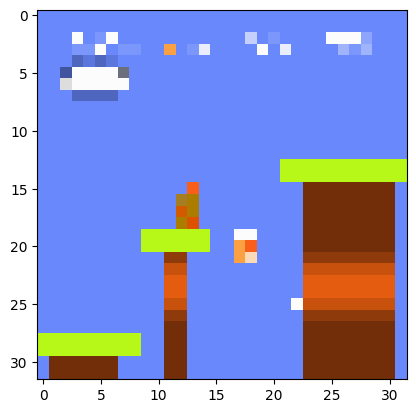

1/1 [==============================] - 0s 26ms/step
Image_2020_lvl_1_Stage_3.png es una fotografía del NIVEL 1


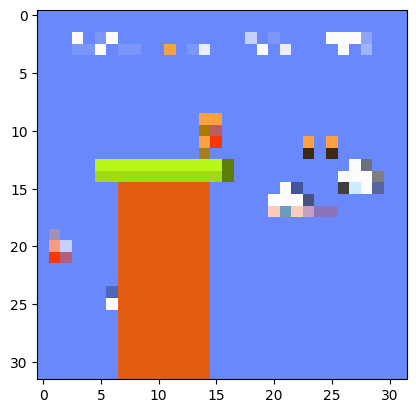

1/1 [==============================] - 0s 25ms/step
Image_2120_lvl_1_Stage_3.png es una fotografía del NIVEL 1


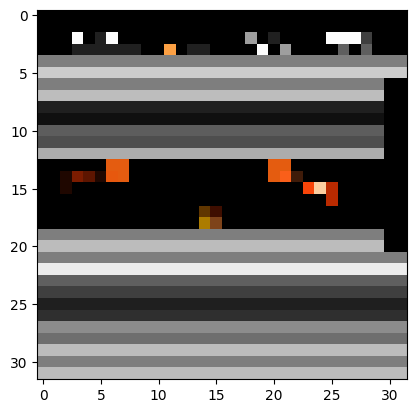

1/1 [==============================] - 0s 26ms/step
Image_2000_lvl_1_Stage_4.png es una fotografía del NIVEL 1


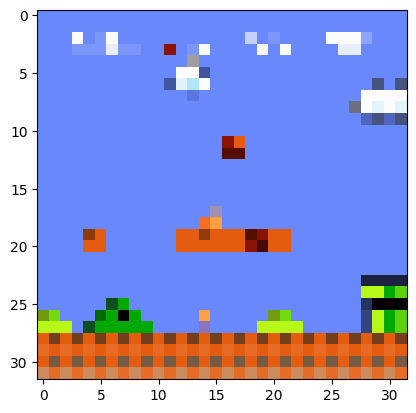

1/1 [==============================] - 0s 29ms/step
Image_1280_lvl_1_Stage_1.png es una fotografía del NIVEL 1


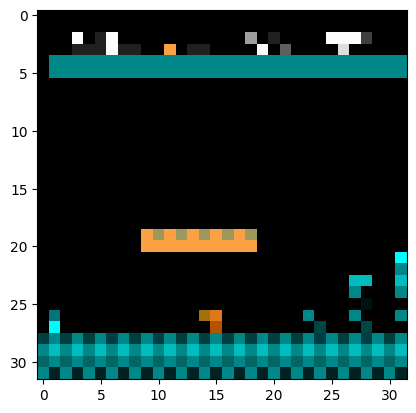

1/1 [==============================] - 0s 32ms/step
Image_540_lvl_1_Stage_2.png es una fotografía del NIVEL 1


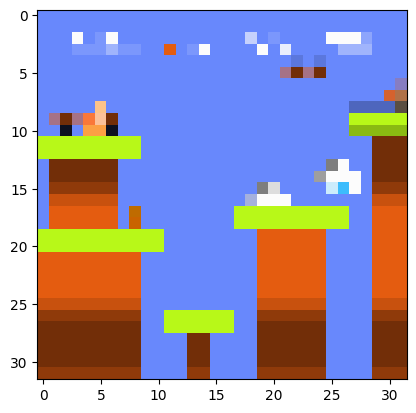

1/1 [==============================] - 0s 37ms/step
Image_460_lvl_1_Stage_3.png es una fotografía del NIVEL 1


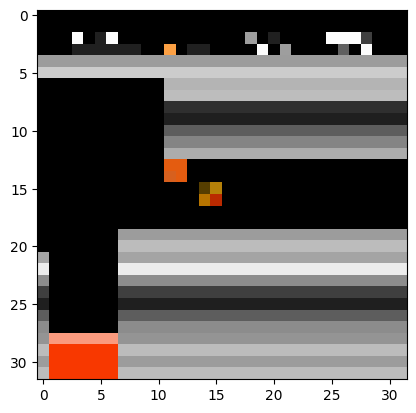

1/1 [==============================] - 0s 32ms/step
Image_1620_lvl_1_Stage_4.png es una fotografía del NIVEL 1


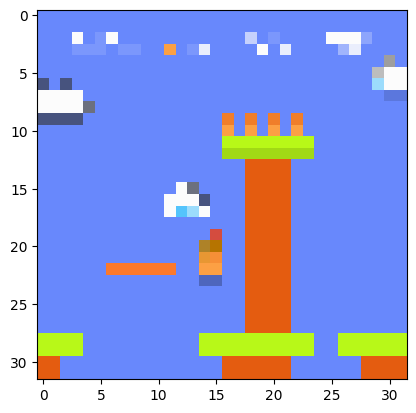

1/1 [==============================] - 0s 32ms/step
Image_1220_lvl_1_Stage_3.png es una fotografía del NIVEL 1


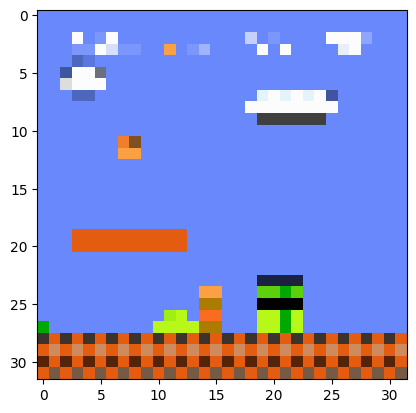

1/1 [==============================] - 0s 28ms/step
Image_1740_lvl_1_Stage_1.png es una fotografía del NIVEL 1


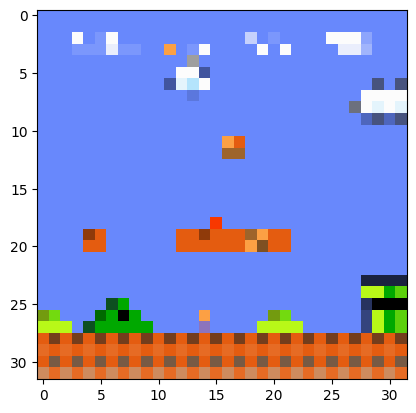

1/1 [==============================] - 0s 28ms/step
Image_1260_lvl_1_Stage_1.png es una fotografía del NIVEL 1


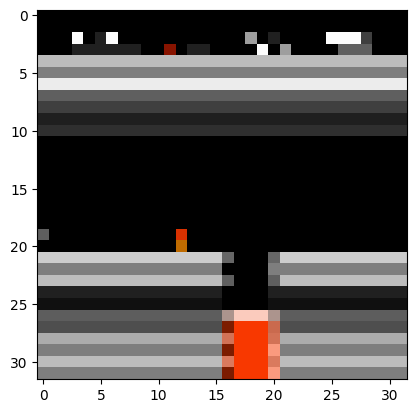

1/1 [==============================] - 0s 28ms/step
Image_560_lvl_1_Stage_4.png es una fotografía del NIVEL 1


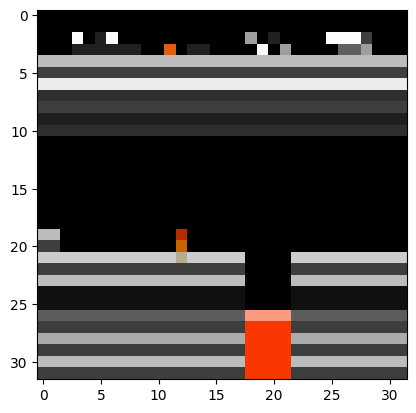

1/1 [==============================] - 0s 35ms/step
Image_520_lvl_1_Stage_4.png es una fotografía del NIVEL 1


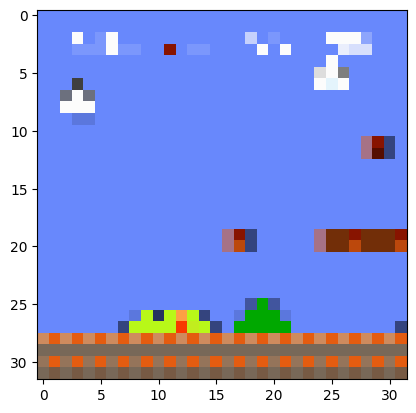

1/1 [==============================] - 0s 32ms/step
Image_900_lvl_1_Stage_1.png es una fotografía del NIVEL 1


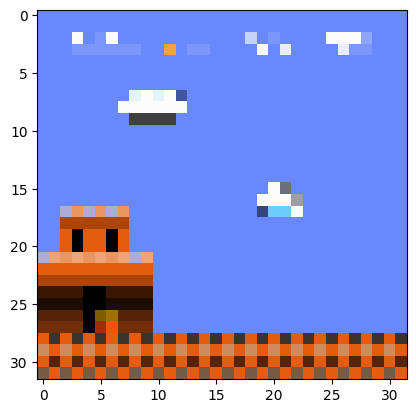

1/1 [==============================] - 0s 31ms/step
Image_0_lvl_1_Stage_3.png es una fotografía del NIVEL 1


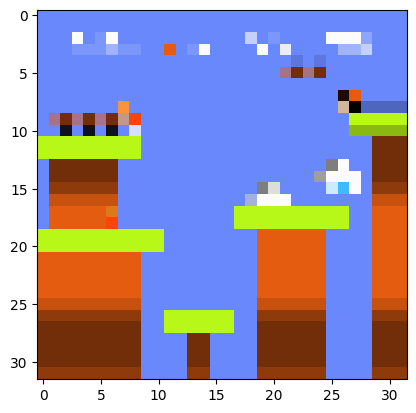

1/1 [==============================] - 0s 33ms/step
Image_520_lvl_1_Stage_3.png es una fotografía del NIVEL 1


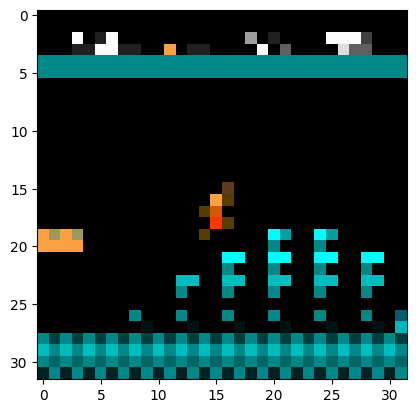

1/1 [==============================] - 0s 29ms/step
Image_920_lvl_1_Stage_2.png es una fotografía del NIVEL 1


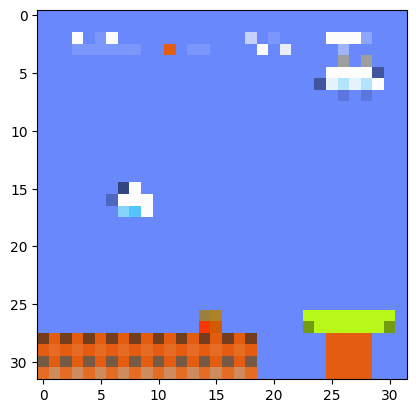

1/1 [==============================] - 0s 26ms/step
Image_220_lvl_1_Stage_3.png es una fotografía del NIVEL 1


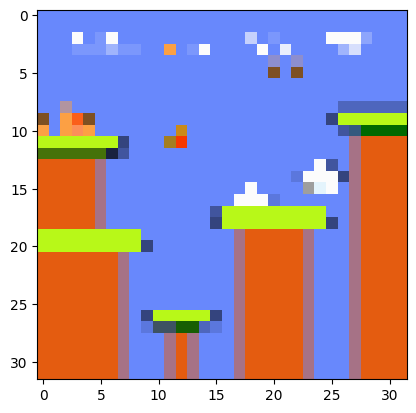

1/1 [==============================] - 0s 26ms/step
Image_820_lvl_1_Stage_3.png es una fotografía del NIVEL 1


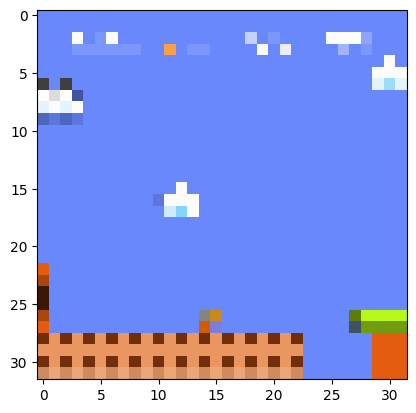

1/1 [==============================] - 0s 28ms/step
Image_200_lvl_1_Stage_3.png es una fotografía del NIVEL 1


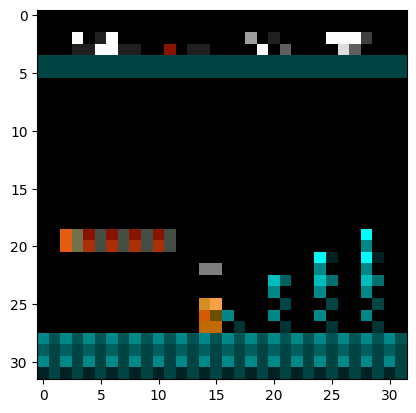

1/1 [==============================] - 0s 33ms/step
Image_800_lvl_1_Stage_2.png es una fotografía del NIVEL 1


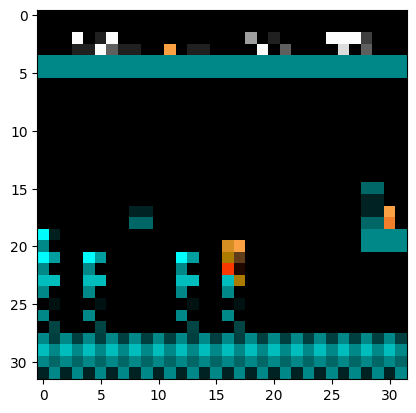

1/1 [==============================] - 0s 34ms/step
Image_1120_lvl_1_Stage_2.png es una fotografía del NIVEL 1


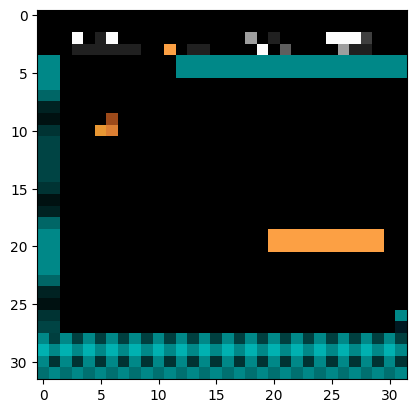

1/1 [==============================] - 0s 32ms/step
Image_0_lvl_1_Stage_2.png es una fotografía del NIVEL 1


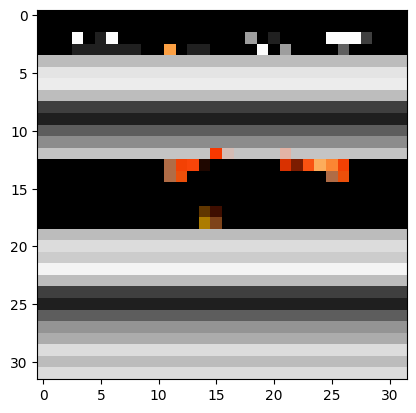

1/1 [==============================] - 0s 26ms/step
Image_1920_lvl_1_Stage_4.png es una fotografía del NIVEL 1


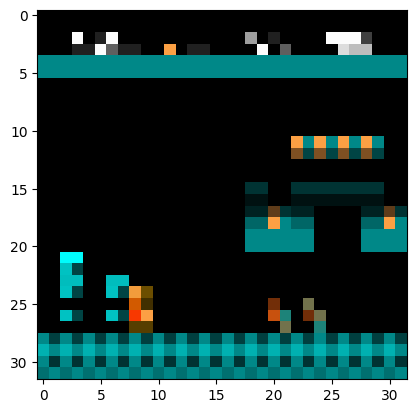

1/1 [==============================] - 0s 26ms/step
Image_1260_lvl_1_Stage_2.png es una fotografía del NIVEL 1


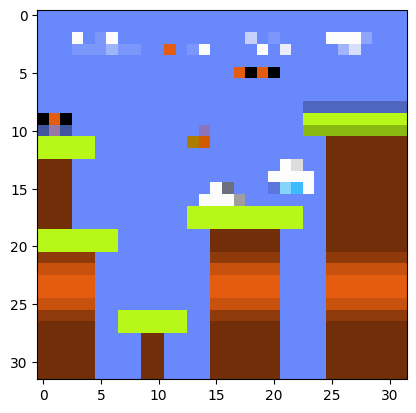

1/1 [==============================] - 0s 27ms/step
Image_840_lvl_1_Stage_3.png es una fotografía del NIVEL 1


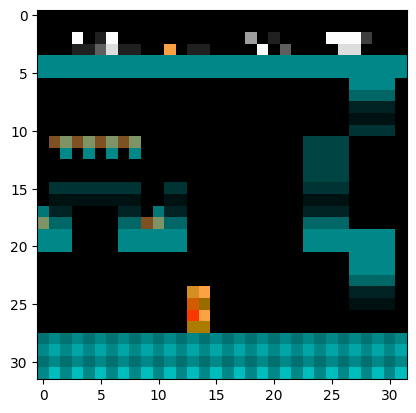

1/1 [==============================] - 0s 26ms/step
Image_1640_lvl_1_Stage_2.png es una fotografía del NIVEL 1


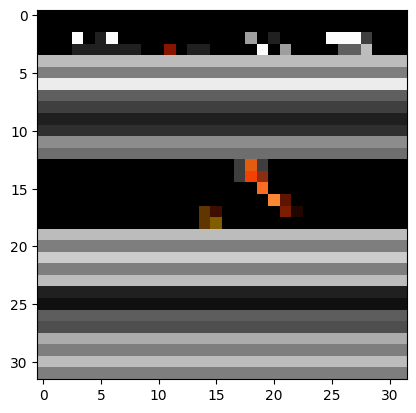

1/1 [==============================] - 0s 36ms/step
Image_1740_lvl_1_Stage_4.png es una fotografía del NIVEL 1


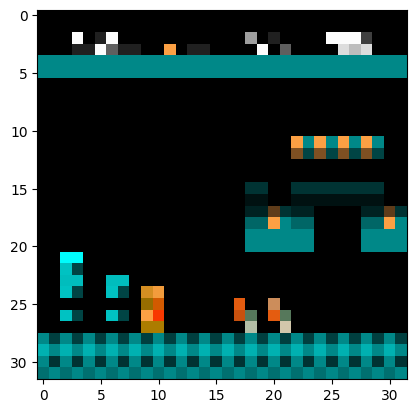

1/1 [==============================] - 0s 25ms/step
Image_1300_lvl_1_Stage_2.png es una fotografía del NIVEL 1


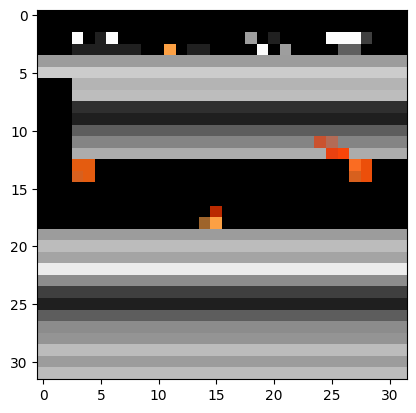

1/1 [==============================] - 0s 33ms/step
Image_1660_lvl_1_Stage_4.png es una fotografía del NIVEL 1


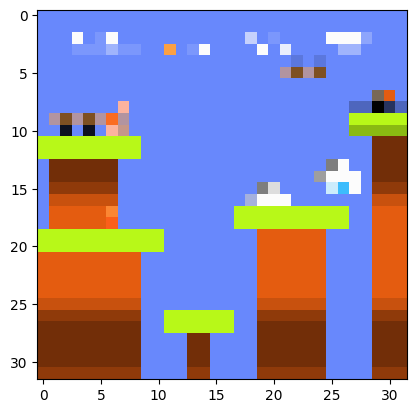

1/1 [==============================] - 0s 25ms/step
Image_480_lvl_1_Stage_3.png es una fotografía del NIVEL 1


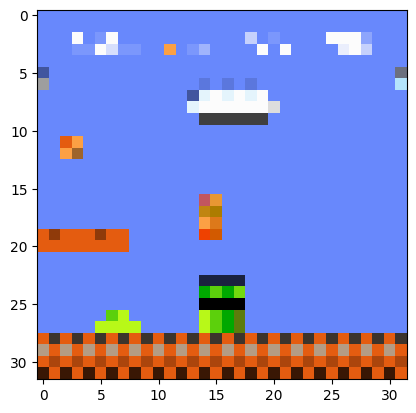

1/1 [==============================] - 0s 29ms/step
Image_1780_lvl_1_Stage_1.png es una fotografía del NIVEL 1


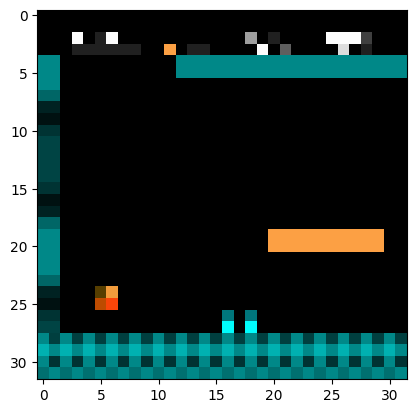

1/1 [==============================] - 0s 26ms/step
Image_200_lvl_1_Stage_2.png es una fotografía del NIVEL 1


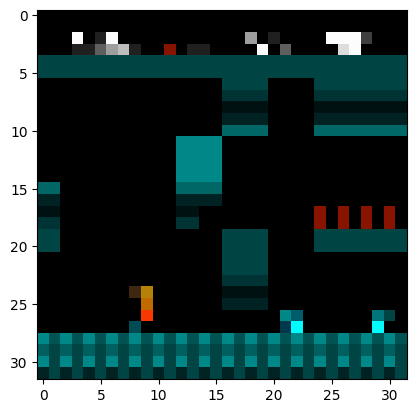

1/1 [==============================] - 0s 33ms/step
Image_2000_lvl_1_Stage_2.png es una fotografía del NIVEL 1


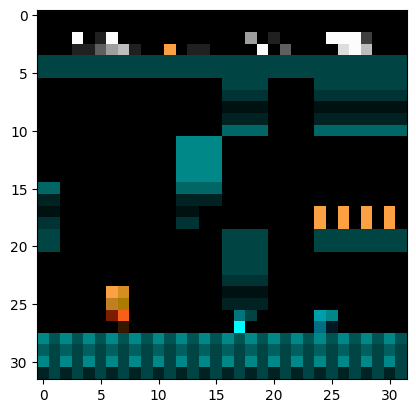

1/1 [==============================] - 0s 23ms/step
Image_2060_lvl_1_Stage_2.png es una fotografía del NIVEL 1


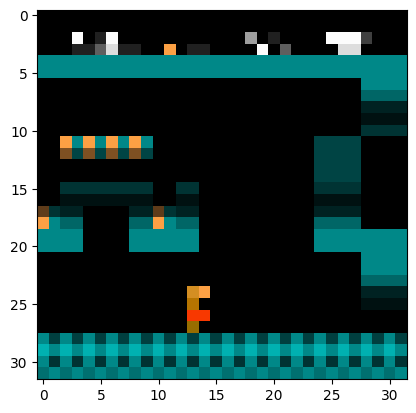

1/1 [==============================] - 0s 26ms/step
Image_1580_lvl_1_Stage_2.png es una fotografía del NIVEL 1


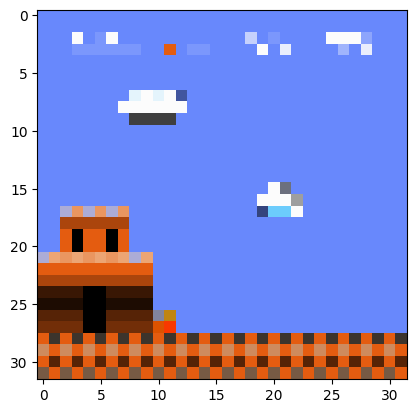

1/1 [==============================] - 0s 26ms/step
Image_140_lvl_1_Stage_3.png es una fotografía del NIVEL 1


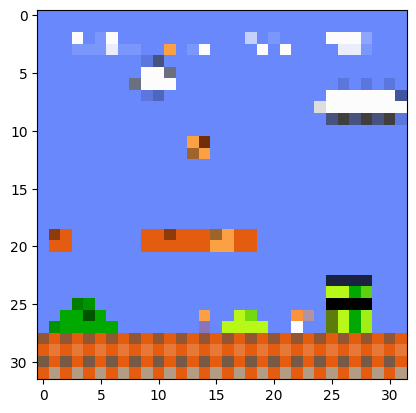

1/1 [==============================] - 0s 26ms/step
Image_1400_lvl_1_Stage_1.png es una fotografía del NIVEL 1


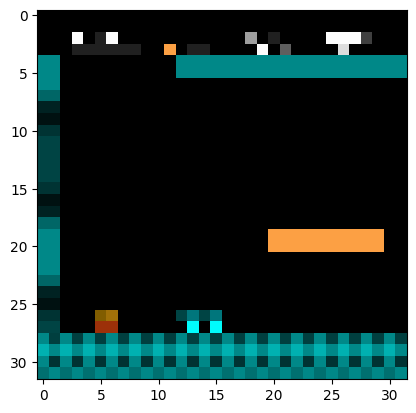

1/1 [==============================] - 0s 25ms/step
Image_240_lvl_1_Stage_2.png es una fotografía del NIVEL 1


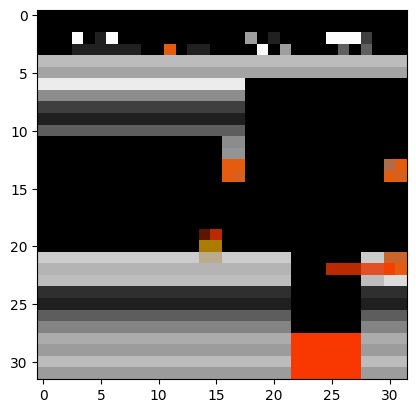

1/1 [==============================] - 0s 27ms/step
Image_760_lvl_1_Stage_4.png es una fotografía del NIVEL 1


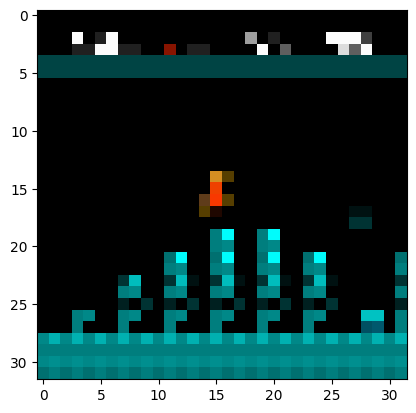

1/1 [==============================] - 0s 25ms/step
Image_940_lvl_1_Stage_2.png es una fotografía del NIVEL 1


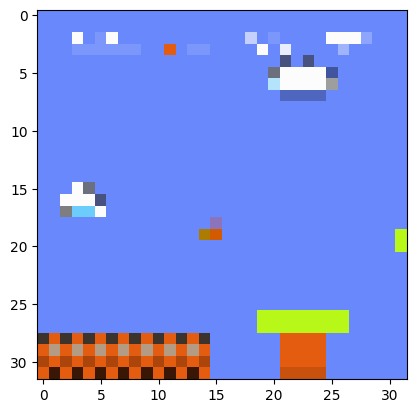

1/1 [==============================] - 0s 27ms/step
Image_240_lvl_1_Stage_3.png es una fotografía del NIVEL 1


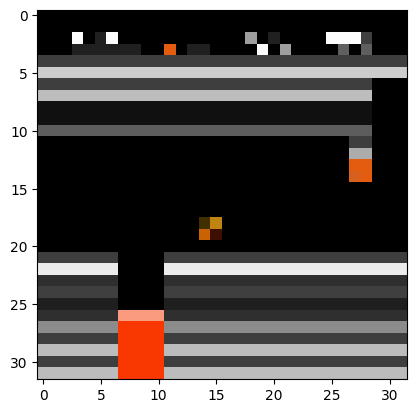

1/1 [==============================] - 0s 25ms/step
Image_1400_lvl_1_Stage_4.png es una fotografía del NIVEL 1


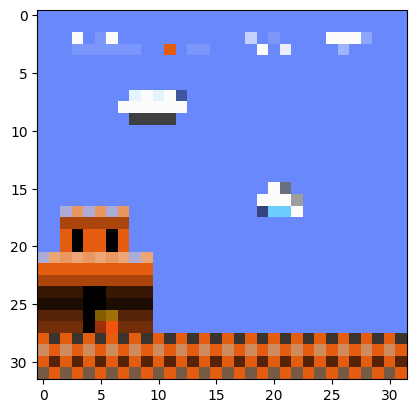

1/1 [==============================] - 0s 25ms/step
Image_40_lvl_1_Stage_3.png es una fotografía del NIVEL 1


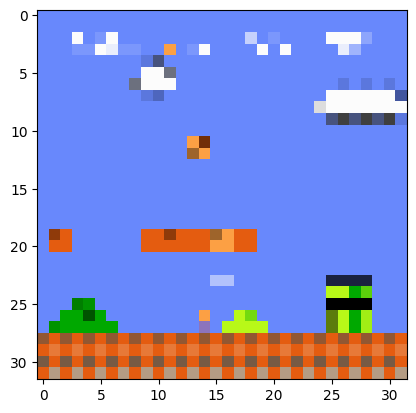

1/1 [==============================] - 0s 31ms/step
Image_1460_lvl_1_Stage_1.png es una fotografía del NIVEL 1


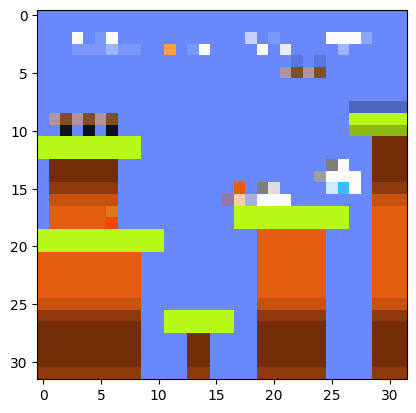

1/1 [==============================] - 0s 28ms/step
Image_640_lvl_1_Stage_3.png es una fotografía del NIVEL 1


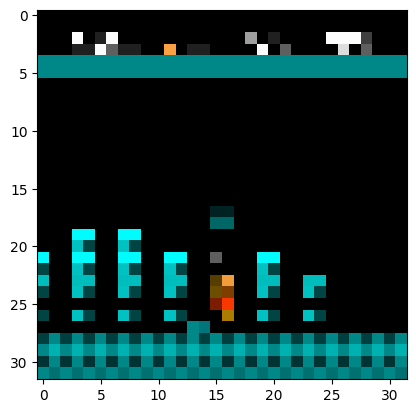

1/1 [==============================] - 0s 26ms/step
Image_1020_lvl_1_Stage_2.png es una fotografía del NIVEL 1


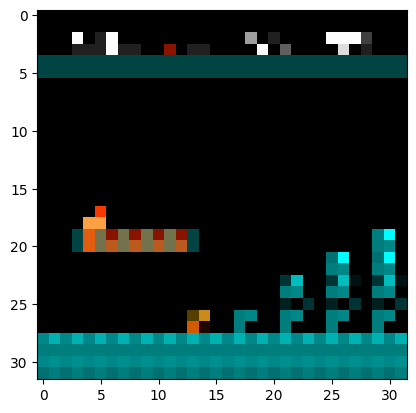

1/1 [==============================] - 0s 26ms/step
Image_700_lvl_1_Stage_2.png es una fotografía del NIVEL 1


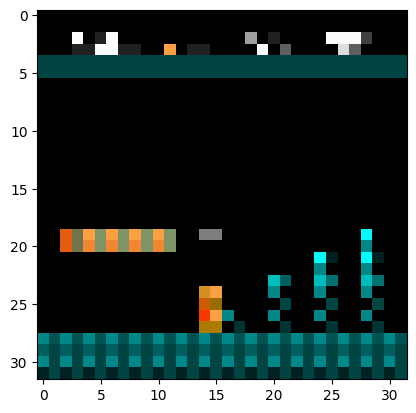

1/1 [==============================] - 0s 26ms/step
Image_820_lvl_1_Stage_2.png es una fotografía del NIVEL 1


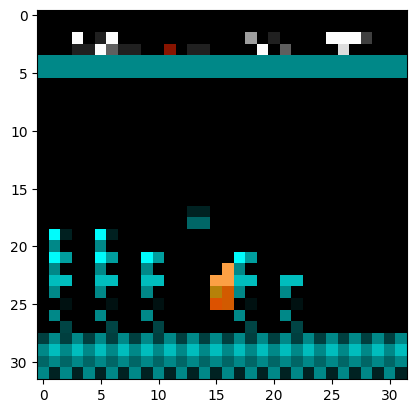

1/1 [==============================] - 0s 25ms/step
Image_1040_lvl_1_Stage_2.png es una fotografía del NIVEL 1


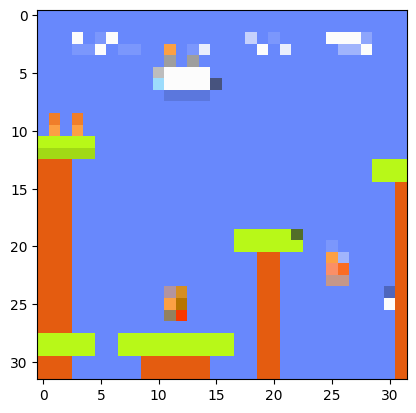

1/1 [==============================] - 0s 26ms/step
Image_1640_lvl_1_Stage_3.png es una fotografía del NIVEL 1


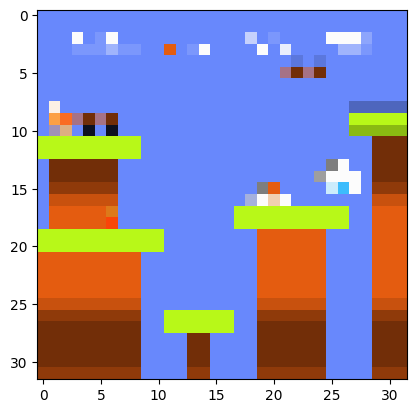

1/1 [==============================] - 0s 31ms/step
Image_600_lvl_1_Stage_3.png es una fotografía del NIVEL 1


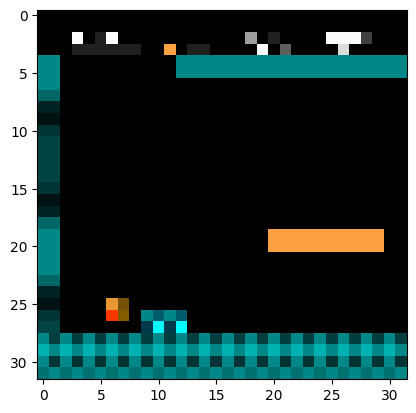

1/1 [==============================] - 0s 42ms/step
Image_280_lvl_1_Stage_2.png es una fotografía del NIVEL 1


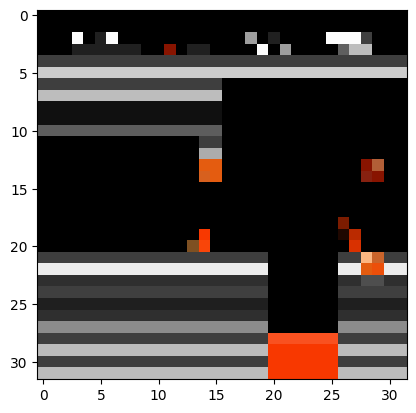

1/1 [==============================] - 0s 30ms/step
Image_900_lvl_1_Stage_4.png es una fotografía del NIVEL 1


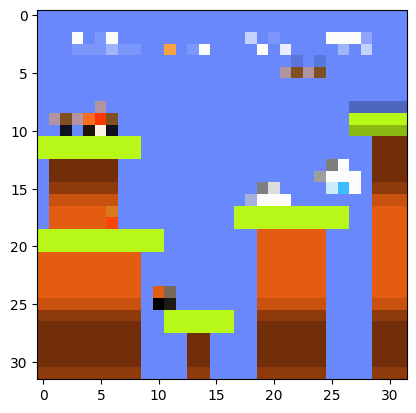

1/1 [==============================] - 0s 30ms/step
Image_720_lvl_1_Stage_3.png es una fotografía del NIVEL 1


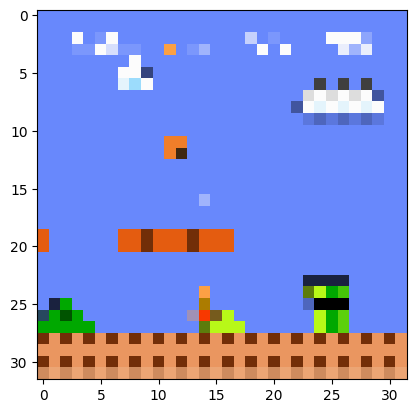

1/1 [==============================] - 0s 33ms/step
Image_1600_lvl_1_Stage_1.png es una fotografía del NIVEL 1


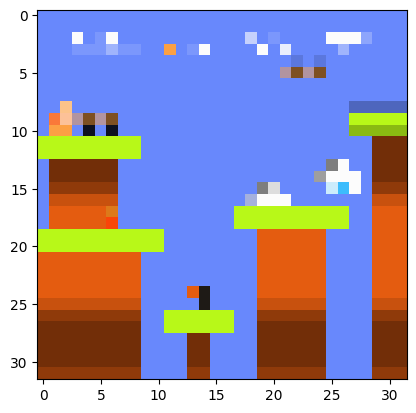

1/1 [==============================] - 0s 28ms/step
Image_680_lvl_1_Stage_3.png es una fotografía del NIVEL 1


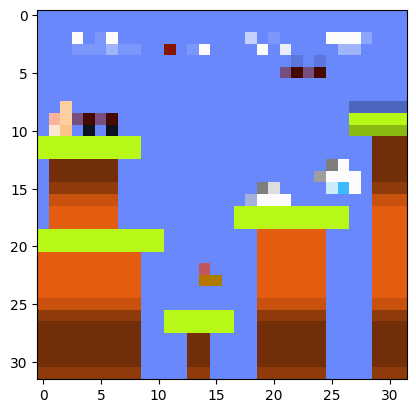

1/1 [==============================] - 0s 27ms/step
Image_420_lvl_1_Stage_3.png es una fotografía del NIVEL 1


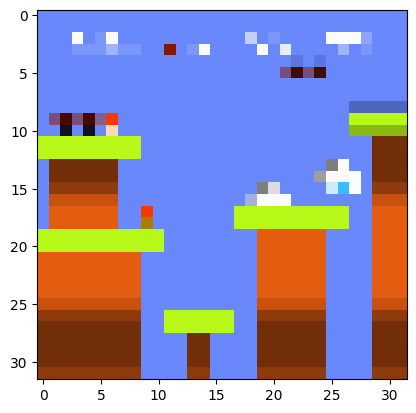

1/1 [==============================] - 0s 25ms/step
Image_800_lvl_1_Stage_3.png es una fotografía del NIVEL 1


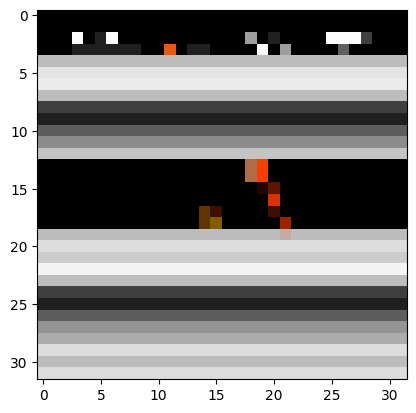

1/1 [==============================] - 0s 25ms/step
Image_1880_lvl_1_Stage_4.png es una fotografía del NIVEL 1


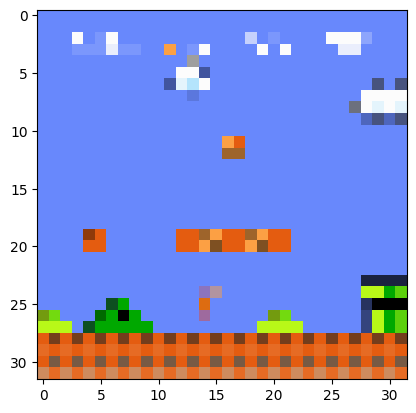

1/1 [==============================] - 0s 25ms/step
Image_1220_lvl_1_Stage_1.png es una fotografía del NIVEL 1


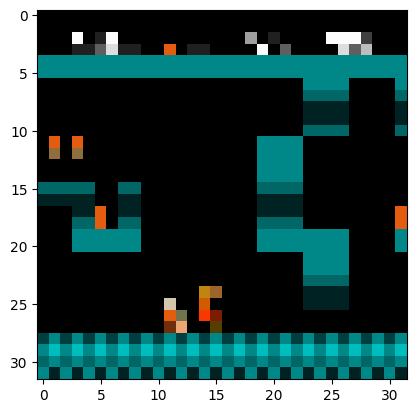

1/1 [==============================] - 0s 23ms/step
Image_1860_lvl_1_Stage_2.png es una fotografía del NIVEL 1


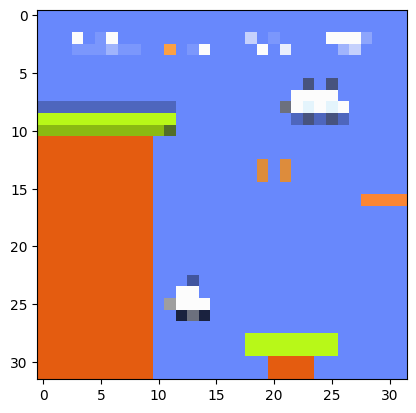

1/1 [==============================] - 0s 28ms/step
Image_1020_lvl_1_Stage_3.png es una fotografía del NIVEL 1


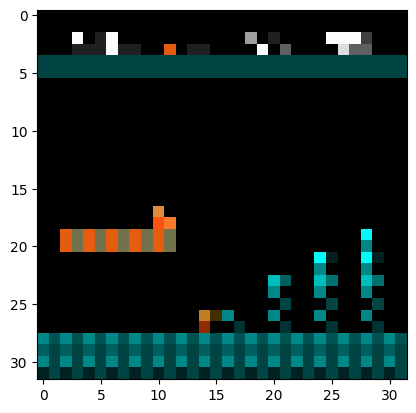

1/1 [==============================] - 0s 28ms/step
Image_760_lvl_1_Stage_2.png es una fotografía del NIVEL 1


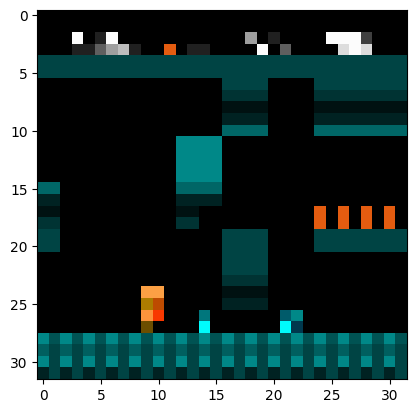

1/1 [==============================] - 0s 36ms/step
Image_2100_lvl_1_Stage_2.png es una fotografía del NIVEL 1


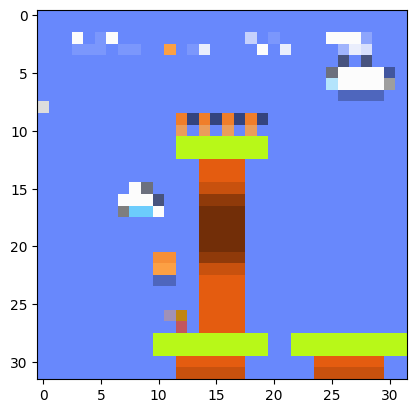

1/1 [==============================] - 0s 39ms/step
Image_1300_lvl_1_Stage_3.png es una fotografía del NIVEL 1


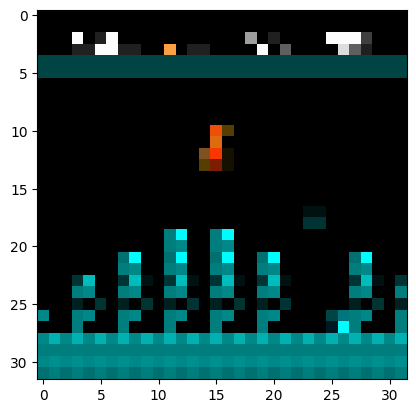

1/1 [==============================] - 0s 28ms/step
Image_960_lvl_1_Stage_2.png es una fotografía del NIVEL 1


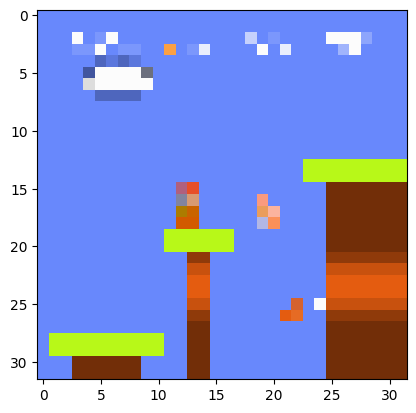

1/1 [==============================] - 0s 27ms/step
Image_1740_lvl_1_Stage_3.png es una fotografía del NIVEL 1


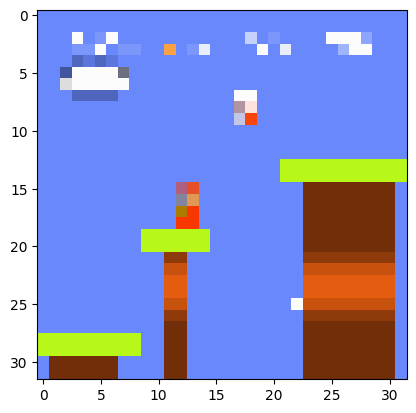

1/1 [==============================] - 0s 27ms/step
Image_1840_lvl_1_Stage_3.png es una fotografía del NIVEL 1


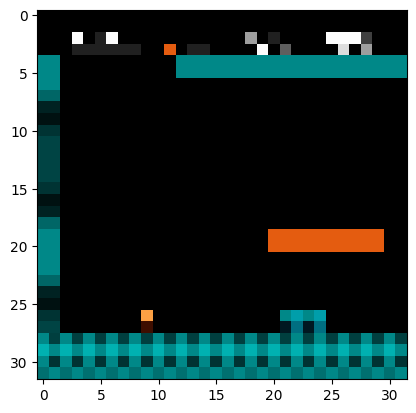

1/1 [==============================] - 0s 33ms/step
Image_420_lvl_1_Stage_2.png es una fotografía del NIVEL 1


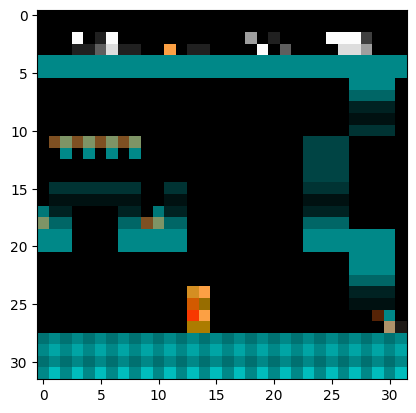

1/1 [==============================] - 0s 34ms/step
Image_1680_lvl_1_Stage_2.png es una fotografía del NIVEL 1


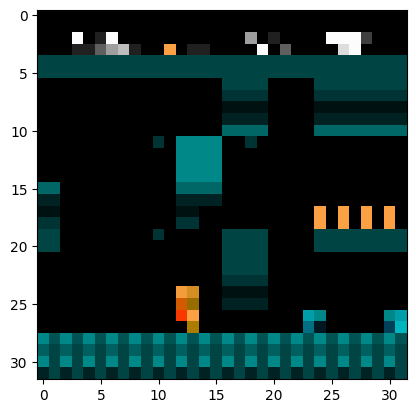

1/1 [==============================] - 0s 26ms/step
Image_1980_lvl_1_Stage_2.png es una fotografía del NIVEL 1


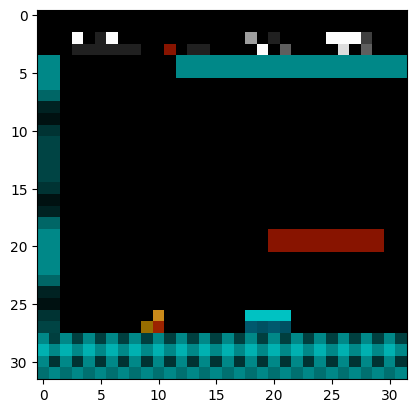

1/1 [==============================] - 0s 32ms/step
Image_460_lvl_1_Stage_2.png es una fotografía del NIVEL 1


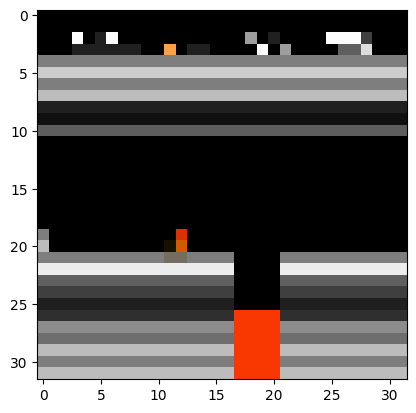

1/1 [==============================] - 0s 26ms/step
Image_540_lvl_1_Stage_4.png es una fotografía del NIVEL 1


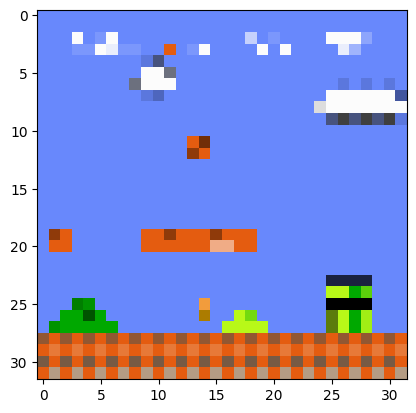

1/1 [==============================] - 0s 26ms/step
Image_1480_lvl_1_Stage_1.png es una fotografía del NIVEL 1


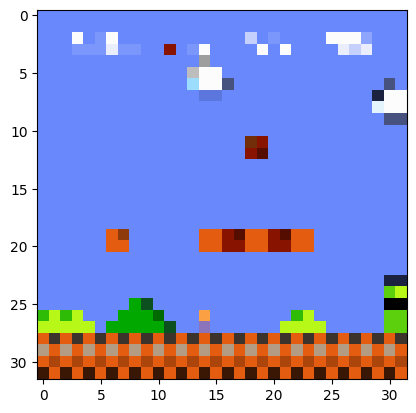

1/1 [==============================] - 0s 26ms/step
Image_1140_lvl_1_Stage_1.png es una fotografía del NIVEL 1


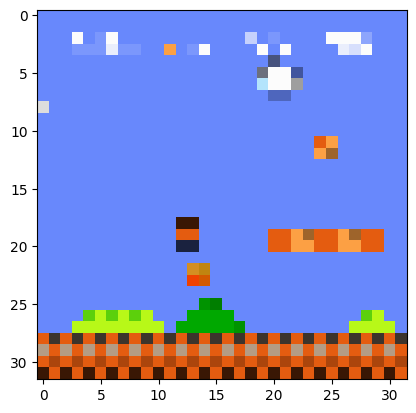

1/1 [==============================] - 0s 26ms/step
Image_980_lvl_1_Stage_1.png es una fotografía del NIVEL 1


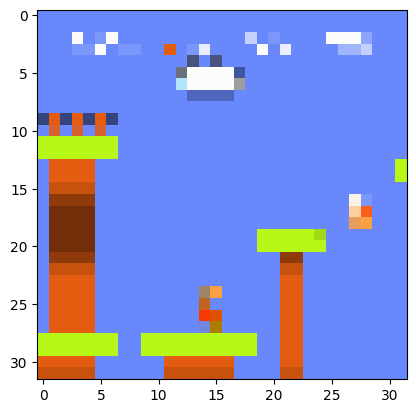

1/1 [==============================] - 0s 48ms/step
Image_1580_lvl_1_Stage_3.png es una fotografía del NIVEL 1


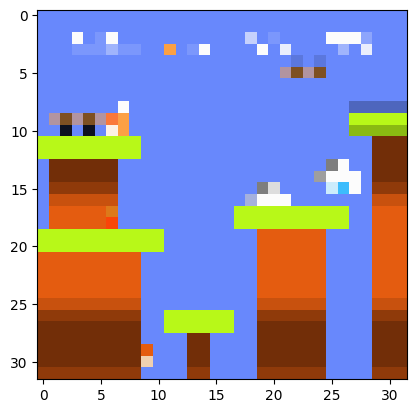

1/1 [==============================] - 0s 32ms/step
Image_740_lvl_1_Stage_3.png es una fotografía del NIVEL 1


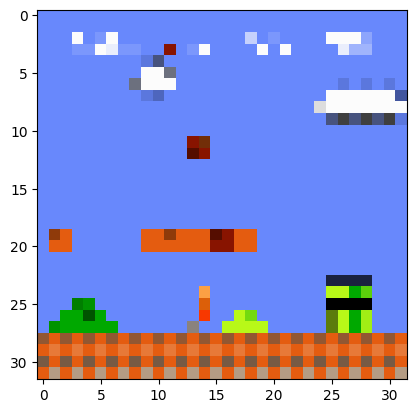

1/1 [==============================] - 0s 27ms/step
Image_1520_lvl_1_Stage_1.png es una fotografía del NIVEL 1


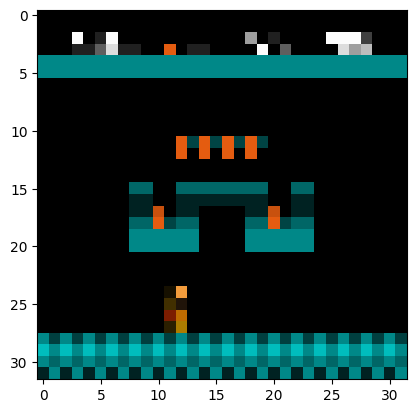

1/1 [==============================] - 0s 23ms/step
Image_1460_lvl_1_Stage_2.png es una fotografía del NIVEL 1


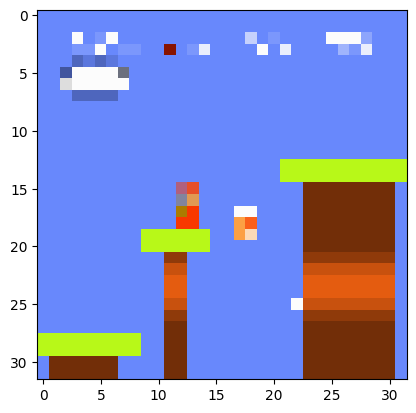

1/1 [==============================] - 0s 36ms/step
Image_2000_lvl_1_Stage_3.png es una fotografía del NIVEL 1


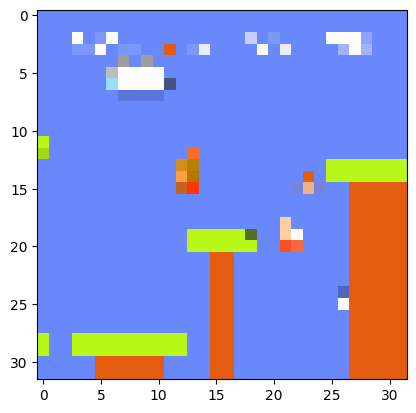

1/1 [==============================] - 0s 25ms/step
Image_1720_lvl_1_Stage_3.png es una fotografía del NIVEL 1


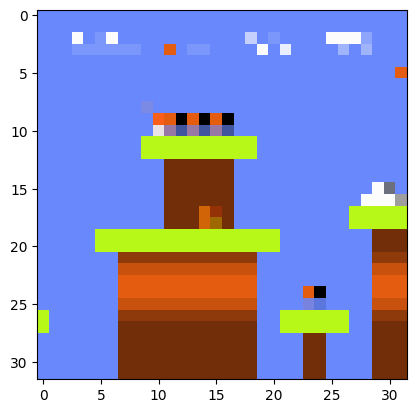

1/1 [==============================] - 0s 35ms/step
Image_360_lvl_1_Stage_3.png es una fotografía del NIVEL 1


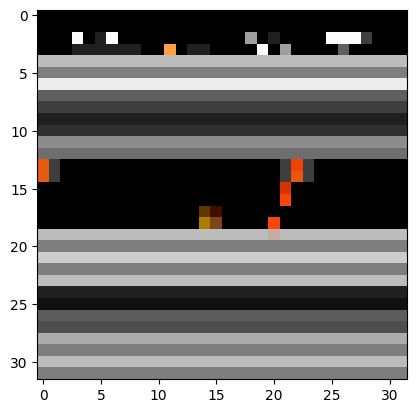

1/1 [==============================] - 0s 26ms/step
Image_1860_lvl_1_Stage_4.png es una fotografía del NIVEL 1


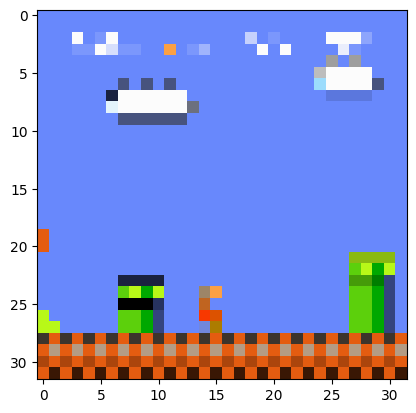

1/1 [==============================] - 0s 30ms/step
Image_1880_lvl_1_Stage_1.png es una fotografía del NIVEL 1


In [ ]:
# Corroborar las predicciones de la red
import os

nivel1_dir = "/content/test/nivel1"

resultados_nivel1 = []
for i in os.listdir(nivel1_dir):
  img = image.load_img(nivel1_dir + "//" + i, target_size=(32,32))
  plt.imshow(img)
  plt.show()

  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  images = np.vstack([x])
  valor_predicho = modelo.predict(images)

  if valor_predicho == 0:
    print(i + " es una fotografía del NIVEL 1")
    resultados_nivel1.append(1)
  else:
    print(i + " es una fotografía del NIVEL 8")
    resultados_nivel1.append(8)

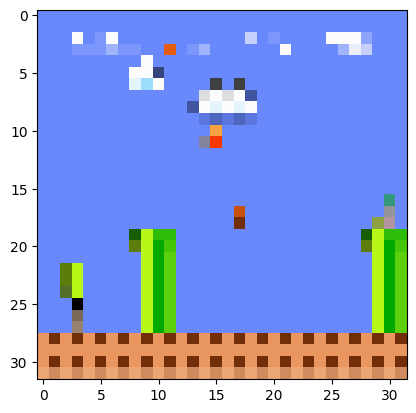

1/1 [==============================] - 0s 28ms/step
Image_1320_lvl_8_Stage_1.png es una fotografía del NIVEL 8


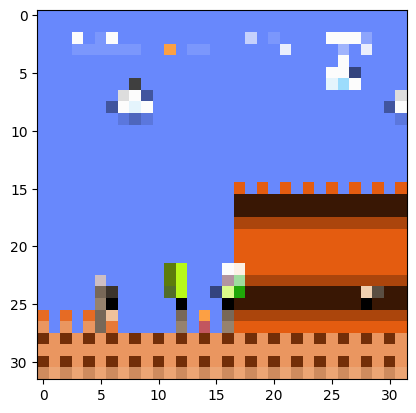

1/1 [==============================] - 0s 20ms/step
Image_1200_lvl_8_Stage_3.png es una fotografía del NIVEL 8


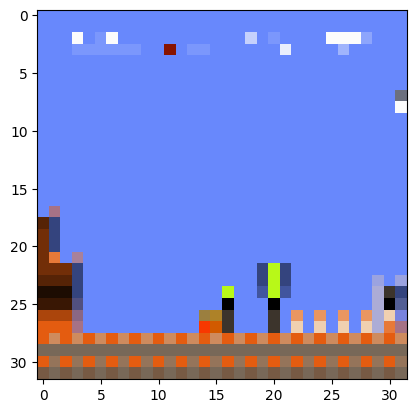

1/1 [==============================] - 0s 20ms/step
Image_1300_lvl_8_Stage_3.png es una fotografía del NIVEL 8


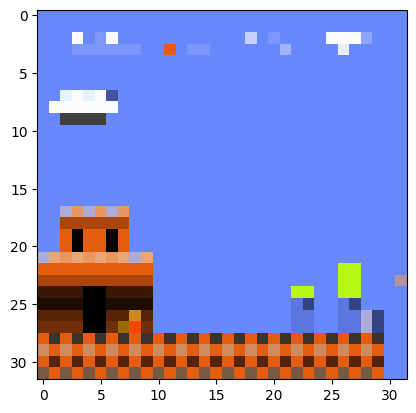

1/1 [==============================] - 0s 21ms/step
Image_1580_lvl_8_Stage_2.png es una fotografía del NIVEL 8


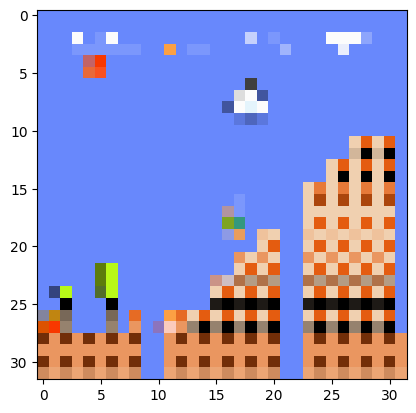

1/1 [==============================] - 0s 27ms/step
Image_640_lvl_8_Stage_2.png es una fotografía del NIVEL 8


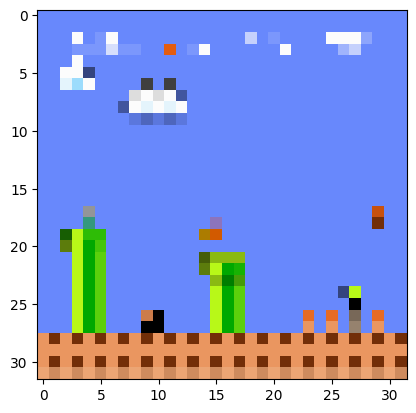

1/1 [==============================] - 0s 17ms/step
Image_1100_lvl_8_Stage_1.png es una fotografía del NIVEL 8


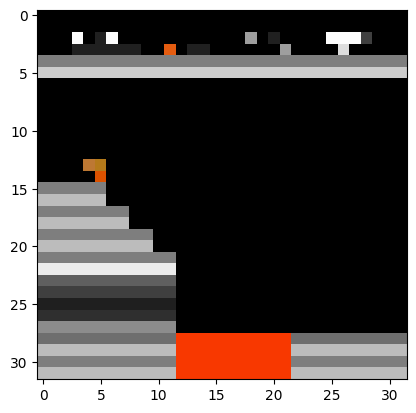

1/1 [==============================] - 0s 19ms/step
Image_1780_lvl_8_Stage_4.png es una fotografía del NIVEL 8


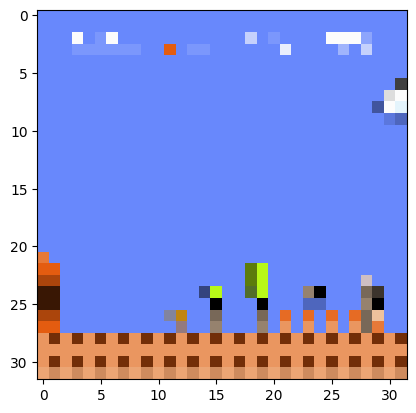

1/1 [==============================] - 0s 18ms/step
Image_620_lvl_8_Stage_3.png es una fotografía del NIVEL 8


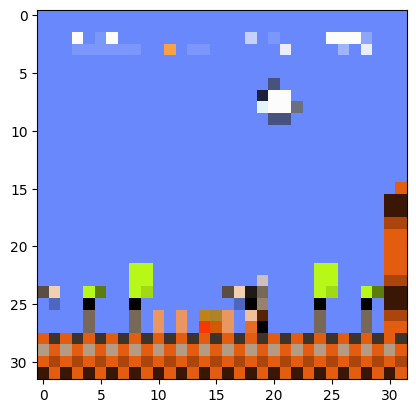

1/1 [==============================] - 0s 19ms/step
Image_840_lvl_8_Stage_3.png es una fotografía del NIVEL 8


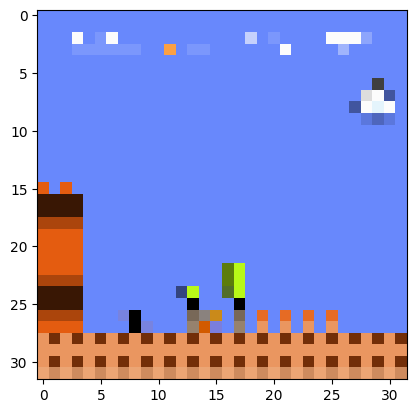

1/1 [==============================] - 0s 18ms/step
Image_240_lvl_8_Stage_1.png es una fotografía del NIVEL 8


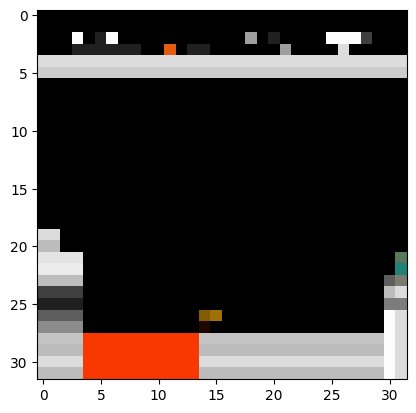

1/1 [==============================] - 0s 17ms/step
Image_1040_lvl_8_Stage_4.png es una fotografía del NIVEL 8


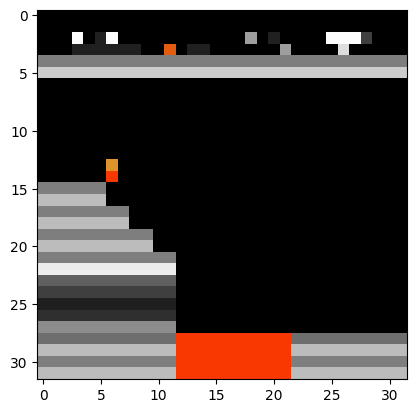

1/1 [==============================] - 0s 17ms/step
Image_1480_lvl_8_Stage_4.png es una fotografía del NIVEL 8


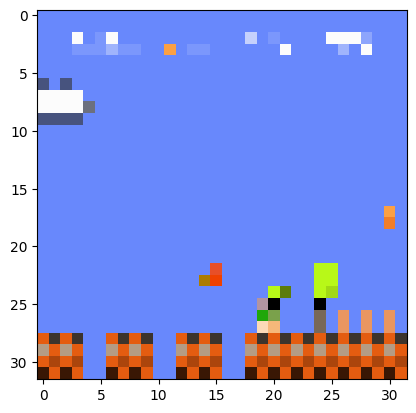

1/1 [==============================] - 0s 20ms/step
Image_780_lvl_8_Stage_1.png es una fotografía del NIVEL 8


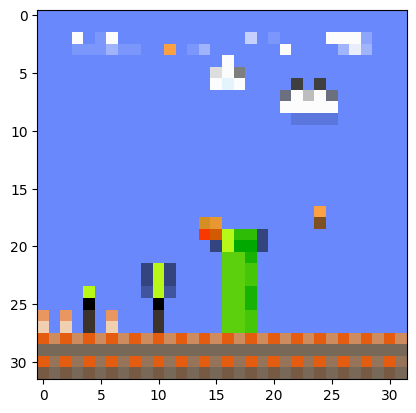

1/1 [==============================] - 0s 20ms/step
Image_1260_lvl_8_Stage_1.png es una fotografía del NIVEL 8


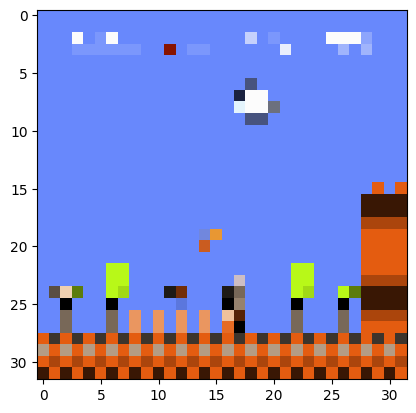

1/1 [==============================] - 0s 17ms/step
Image_1020_lvl_8_Stage_3.png es una fotografía del NIVEL 8


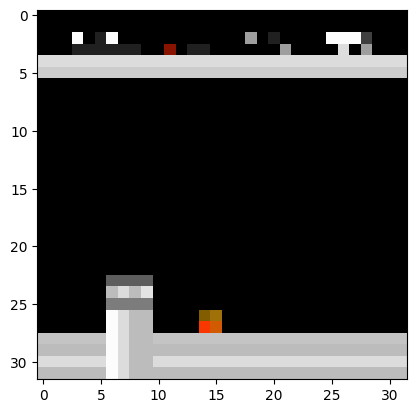

1/1 [==============================] - 0s 18ms/step
Image_1140_lvl_8_Stage_4.png es una fotografía del NIVEL 8


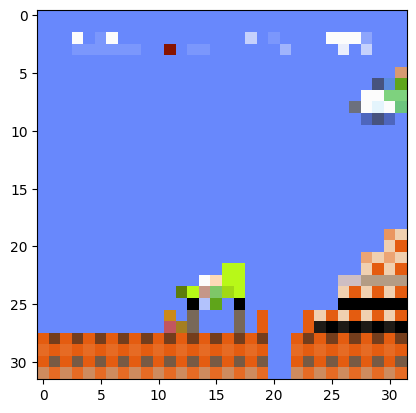

1/1 [==============================] - 0s 21ms/step
Image_1680_lvl_8_Stage_2.png es una fotografía del NIVEL 8


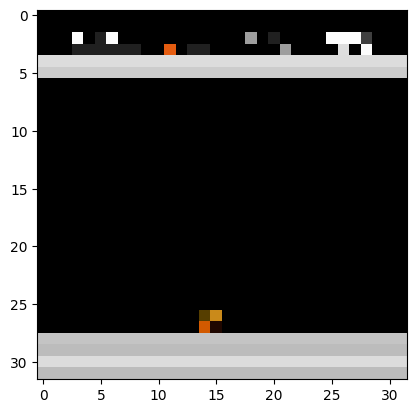

1/1 [==============================] - 0s 17ms/step
Image_1200_lvl_8_Stage_4.png es una fotografía del NIVEL 8


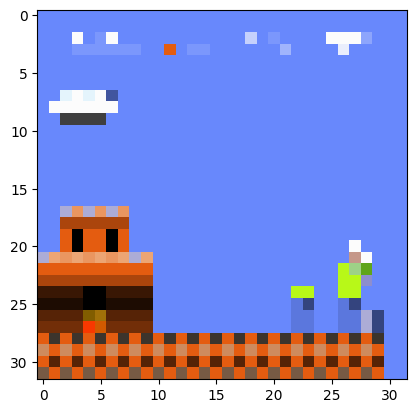

1/1 [==============================] - 0s 18ms/step
Image_800_lvl_8_Stage_2.png es una fotografía del NIVEL 8


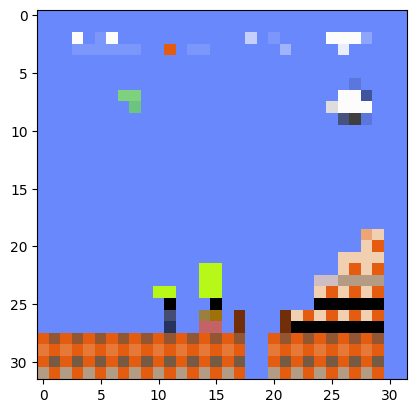

1/1 [==============================] - 0s 18ms/step
Image_1360_lvl_8_Stage_2.png es una fotografía del NIVEL 8


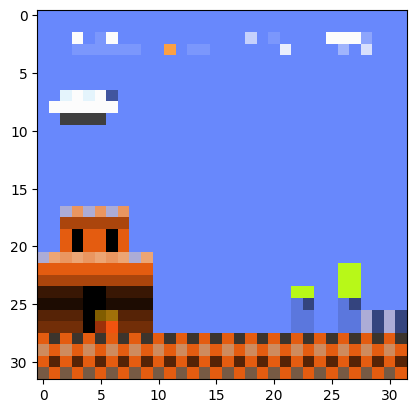

1/1 [==============================] - 0s 17ms/step
Image_100_lvl_8_Stage_3.png es una fotografía del NIVEL 8


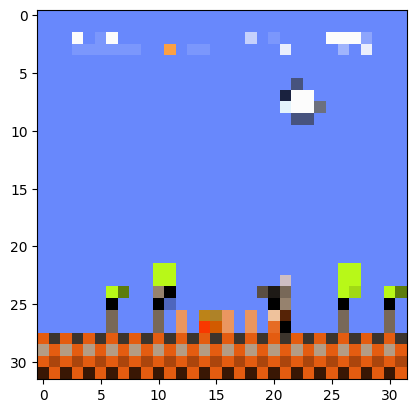

1/1 [==============================] - 0s 20ms/step
Image_1000_lvl_8_Stage_3.png es una fotografía del NIVEL 8


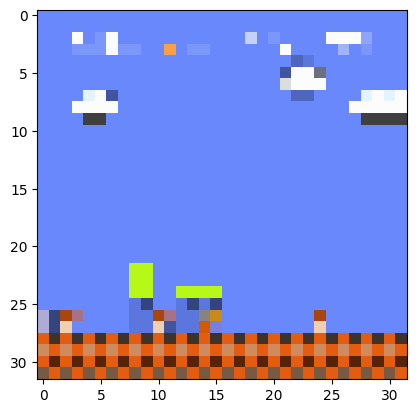

1/1 [==============================] - 0s 20ms/step
Image_400_lvl_8_Stage_1.png es una fotografía del NIVEL 8


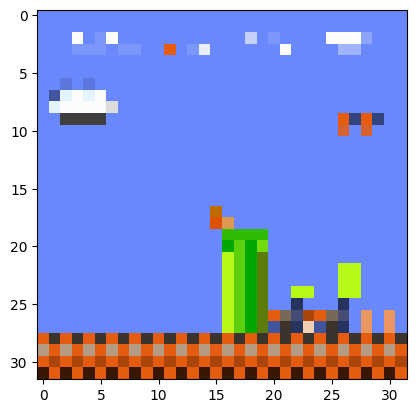

1/1 [==============================] - 0s 20ms/step
Image_1420_lvl_8_Stage_1.png es una fotografía del NIVEL 8


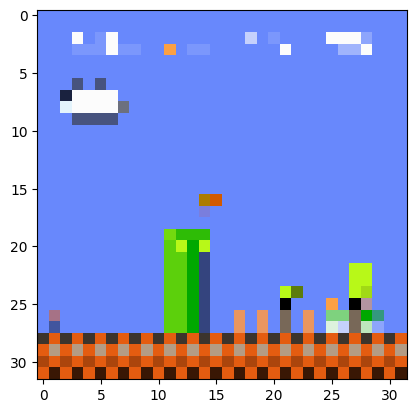

1/1 [==============================] - 0s 19ms/step
Image_580_lvl_8_Stage_1.png es una fotografía del NIVEL 8


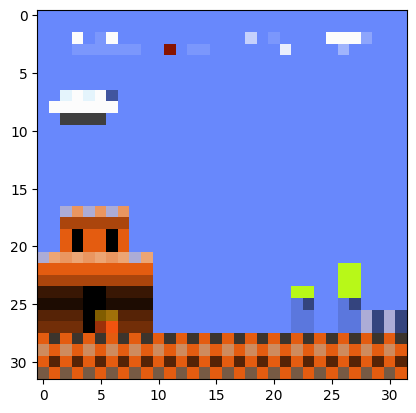

1/1 [==============================] - 0s 19ms/step
Image_80_lvl_8_Stage_3.png es una fotografía del NIVEL 8


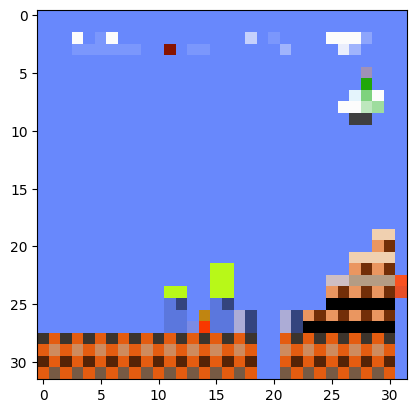

1/1 [==============================] - 0s 19ms/step
Image_420_lvl_8_Stage_2.png es una fotografía del NIVEL 8


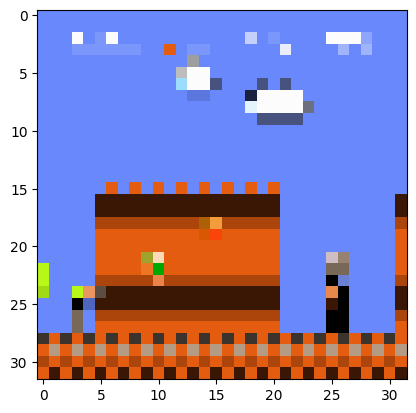

1/1 [==============================] - 0s 17ms/step
Image_1480_lvl_8_Stage_3.png es una fotografía del NIVEL 8


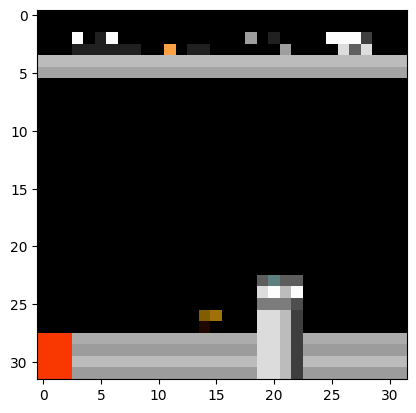

1/1 [==============================] - 0s 21ms/step
Image_540_lvl_8_Stage_4.png es una fotografía del NIVEL 8


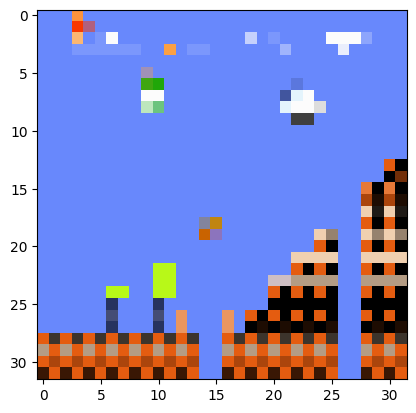

1/1 [==============================] - 0s 18ms/step
Image_1400_lvl_8_Stage_2.png es una fotografía del NIVEL 8


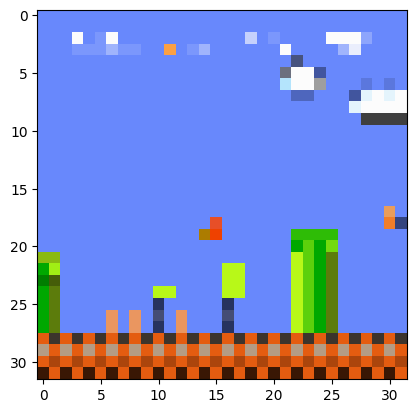

1/1 [==============================] - 0s 23ms/step
Image_1220_lvl_8_Stage_1.png es una fotografía del NIVEL 8


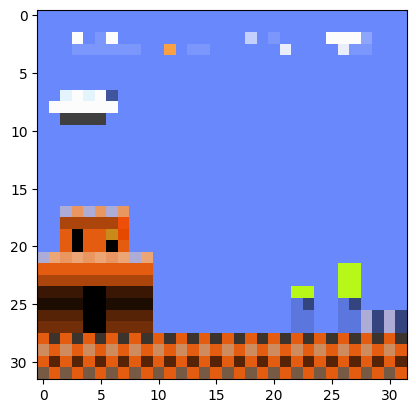

1/1 [==============================] - 0s 21ms/step
Image_860_lvl_8_Stage_3.png es una fotografía del NIVEL 8


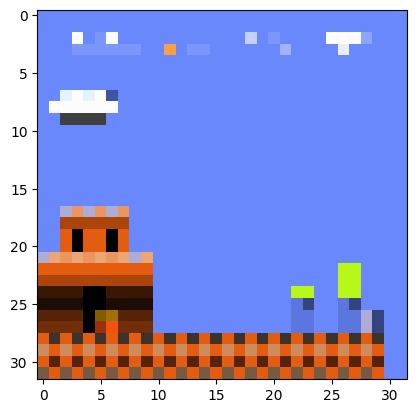

1/1 [==============================] - 0s 24ms/step
Image_20_lvl_8_Stage_2.png es una fotografía del NIVEL 8


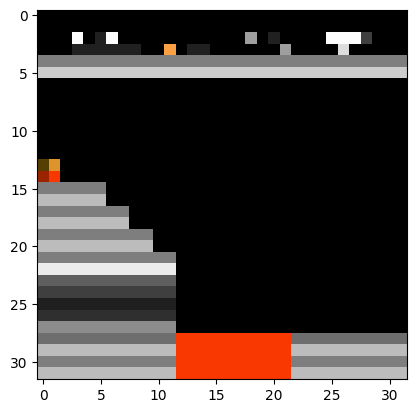

1/1 [==============================] - 0s 20ms/step
Image_240_lvl_8_Stage_4.png es una fotografía del NIVEL 8


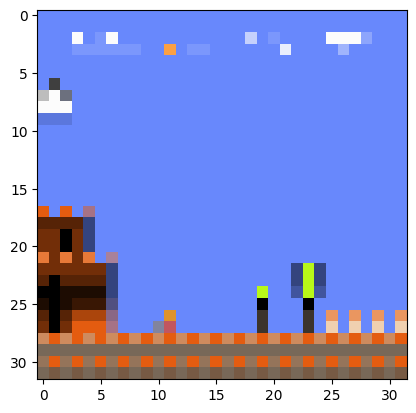

1/1 [==============================] - 0s 20ms/step
Image_580_lvl_8_Stage_3.png es una fotografía del NIVEL 8


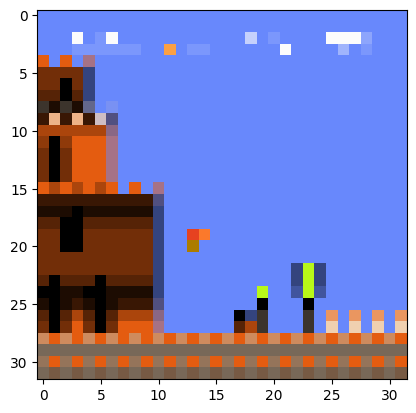

1/1 [==============================] - 0s 21ms/step
Image_200_lvl_8_Stage_1.png es una fotografía del NIVEL 8


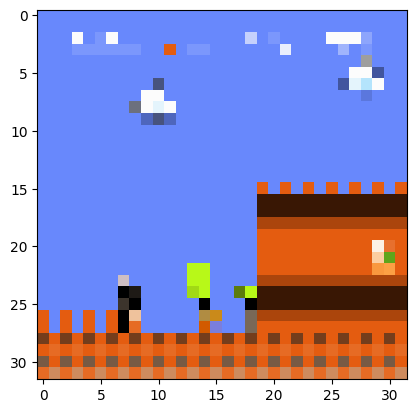

1/1 [==============================] - 0s 20ms/step
Image_1060_lvl_8_Stage_3.png es una fotografía del NIVEL 8


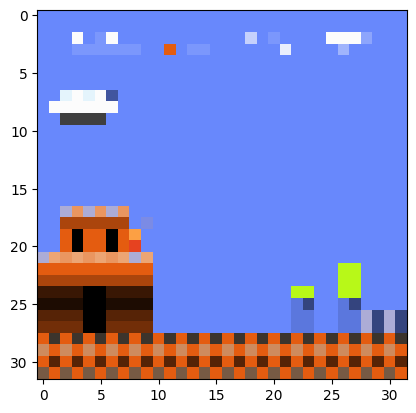

1/1 [==============================] - 0s 19ms/step
Image_1240_lvl_8_Stage_3.png es una fotografía del NIVEL 8


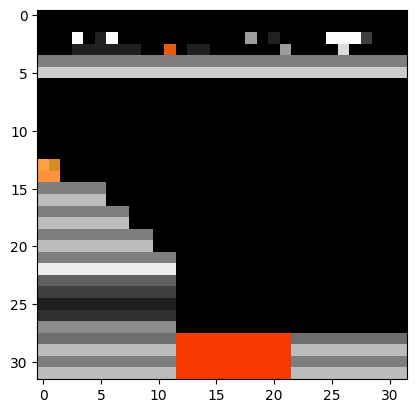

1/1 [==============================] - 0s 19ms/step
Image_220_lvl_8_Stage_4.png es una fotografía del NIVEL 8


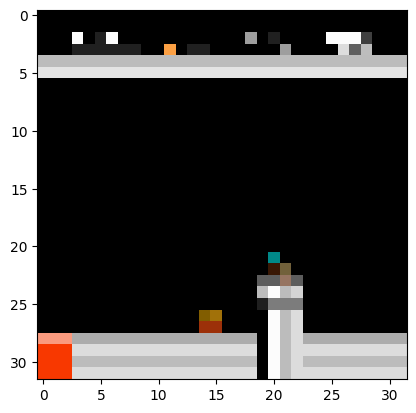

1/1 [==============================] - 0s 18ms/step
Image_500_lvl_8_Stage_4.png es una fotografía del NIVEL 8


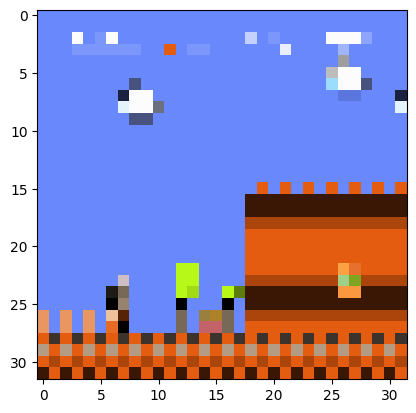

1/1 [==============================] - 0s 25ms/step
Image_1080_lvl_8_Stage_3.png es una fotografía del NIVEL 8


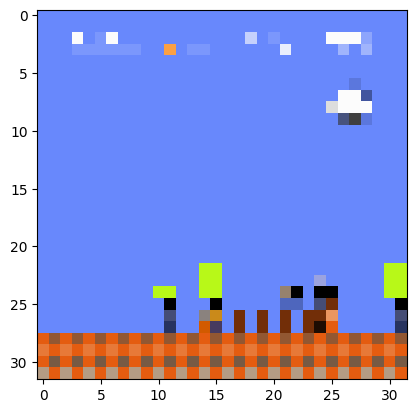

1/1 [==============================] - 0s 18ms/step
Image_260_lvl_8_Stage_3.png es una fotografía del NIVEL 8


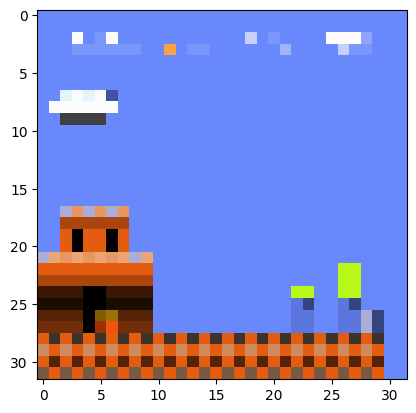

1/1 [==============================] - 0s 18ms/step
Image_720_lvl_8_Stage_2.png es una fotografía del NIVEL 8


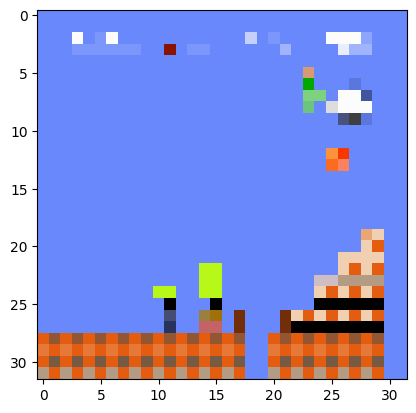

1/1 [==============================] - 0s 20ms/step
Image_1180_lvl_8_Stage_2.png es una fotografía del NIVEL 8


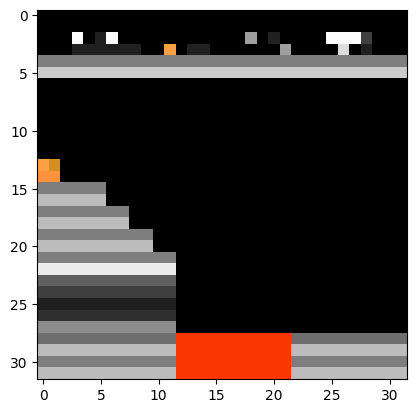

1/1 [==============================] - 0s 28ms/step
Image_200_lvl_8_Stage_4.png es una fotografía del NIVEL 8


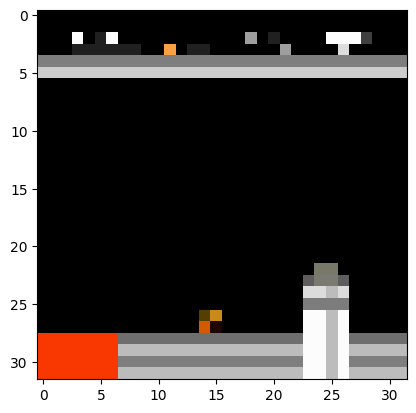

1/1 [==============================] - 0s 27ms/step
Image_1060_lvl_8_Stage_4.png es una fotografía del NIVEL 8


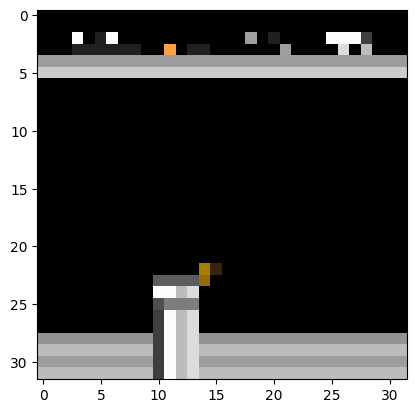

1/1 [==============================] - 0s 28ms/step
Image_1120_lvl_8_Stage_4.png es una fotografía del NIVEL 8


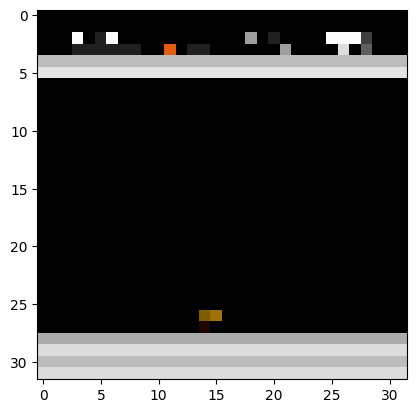

1/1 [==============================] - 0s 26ms/step
Image_1180_lvl_8_Stage_4.png es una fotografía del NIVEL 8


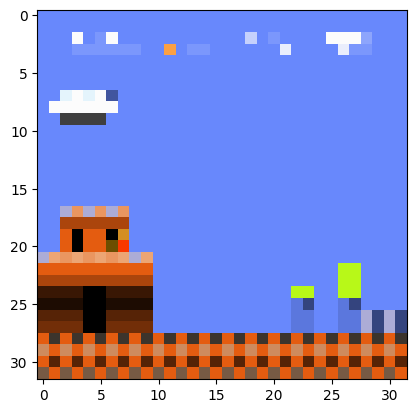

1/1 [==============================] - 0s 27ms/step
Image_500_lvl_8_Stage_3.png es una fotografía del NIVEL 8


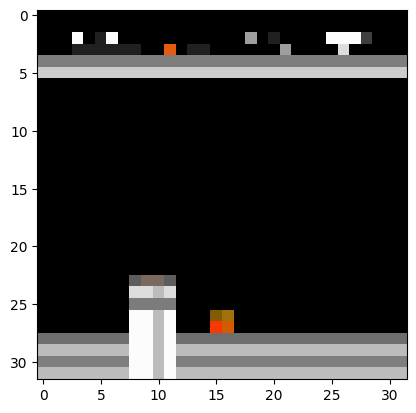

1/1 [==============================] - 0s 27ms/step
Image_620_lvl_8_Stage_4.png es una fotografía del NIVEL 8


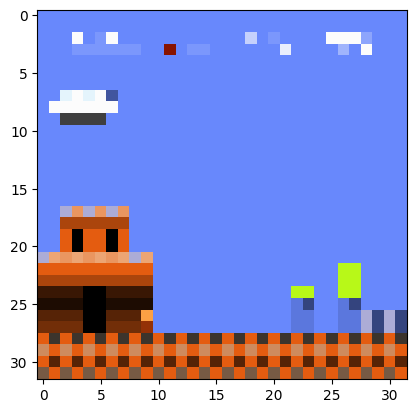

1/1 [==============================] - 0s 26ms/step
Image_180_lvl_8_Stage_3.png es una fotografía del NIVEL 8


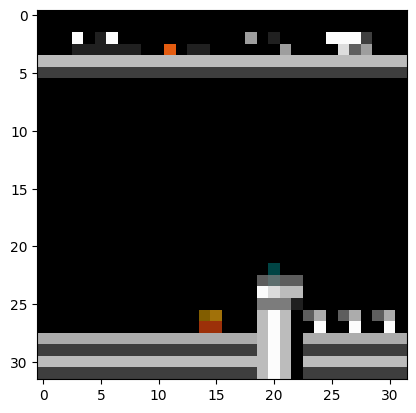

1/1 [==============================] - 0s 28ms/step
Image_1340_lvl_8_Stage_4.png es una fotografía del NIVEL 8


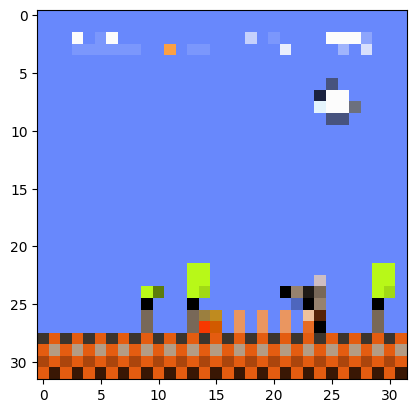

1/1 [==============================] - 0s 18ms/step
Image_960_lvl_8_Stage_3.png es una fotografía del NIVEL 8


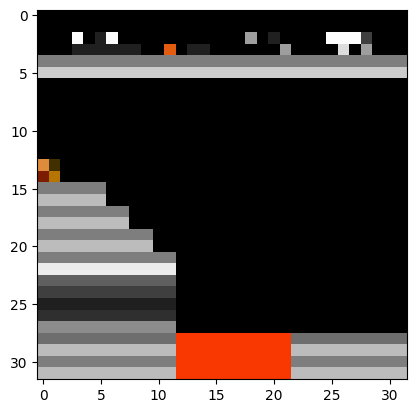

1/1 [==============================] - 0s 20ms/step
Image_940_lvl_8_Stage_4.png es una fotografía del NIVEL 8


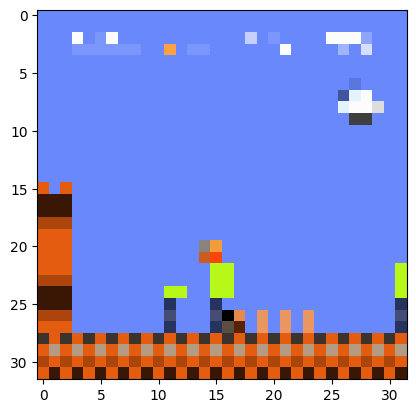

1/1 [==============================] - 0s 17ms/step
Image_1600_lvl_8_Stage_1.png es una fotografía del NIVEL 8


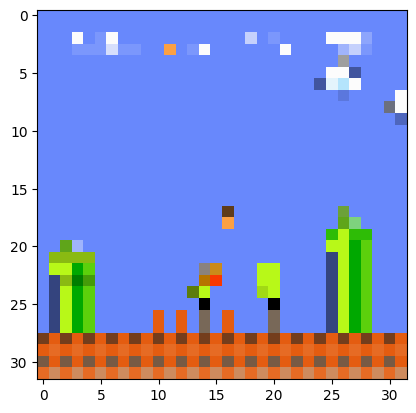

1/1 [==============================] - 0s 20ms/step
Image_1200_lvl_8_Stage_1.png es una fotografía del NIVEL 8


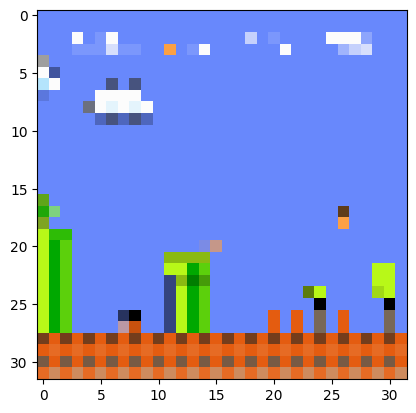

1/1 [==============================] - 0s 18ms/step
Image_1120_lvl_8_Stage_1.png es una fotografía del NIVEL 8


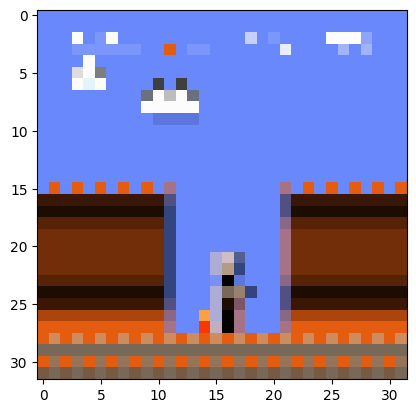

1/1 [==============================] - 0s 18ms/step
Image_1580_lvl_8_Stage_3.png es una fotografía del NIVEL 8


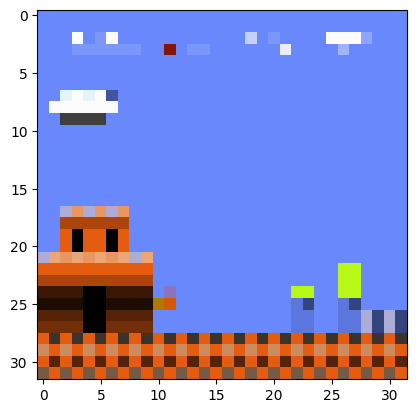

1/1 [==============================] - 0s 22ms/step
Image_880_lvl_8_Stage_3.png es una fotografía del NIVEL 8


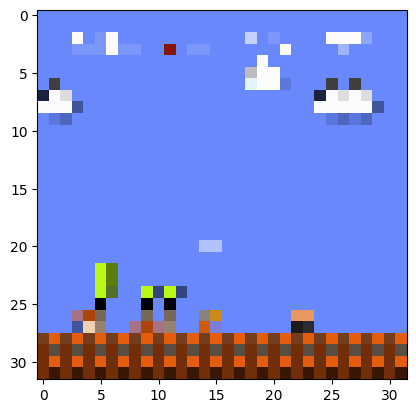

1/1 [==============================] - 0s 17ms/step
Image_1720_lvl_8_Stage_1.png es una fotografía del NIVEL 8


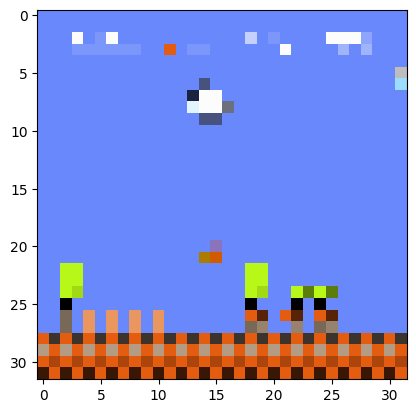

1/1 [==============================] - 0s 20ms/step
Image_1660_lvl_8_Stage_1.png es una fotografía del NIVEL 8


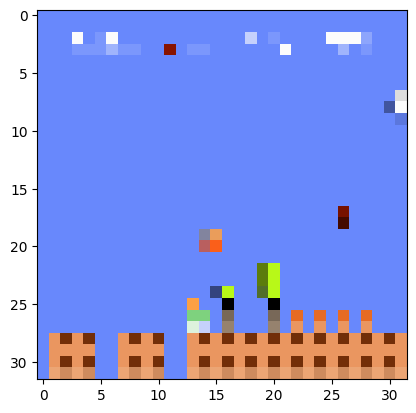

1/1 [==============================] - 0s 18ms/step
Image_800_lvl_8_Stage_1.png es una fotografía del NIVEL 8


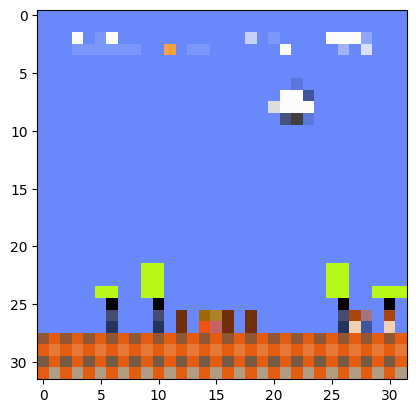

1/1 [==============================] - 0s 18ms/step
Image_300_lvl_8_Stage_1.png es una fotografía del NIVEL 8


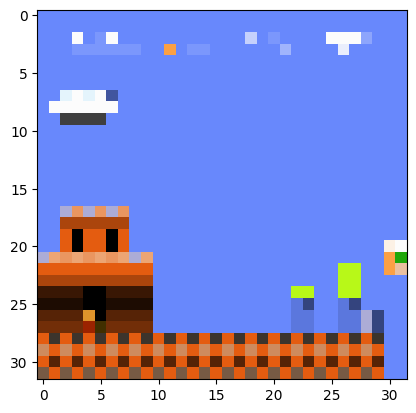

1/1 [==============================] - 0s 20ms/step
Image_760_lvl_8_Stage_2.png es una fotografía del NIVEL 8


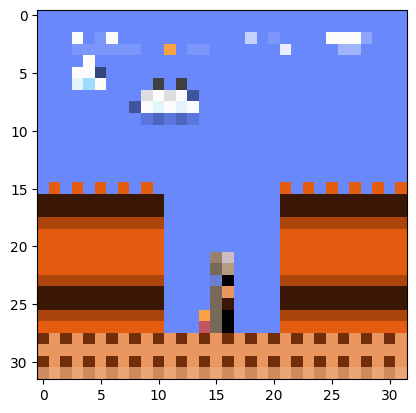

1/1 [==============================] - 0s 19ms/step
Image_1660_lvl_8_Stage_3.png es una fotografía del NIVEL 8


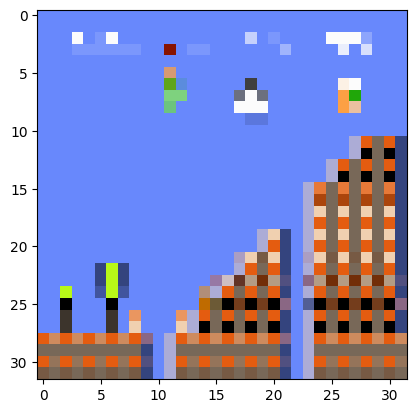

1/1 [==============================] - 0s 19ms/step
Image_1420_lvl_8_Stage_2.png es una fotografía del NIVEL 8


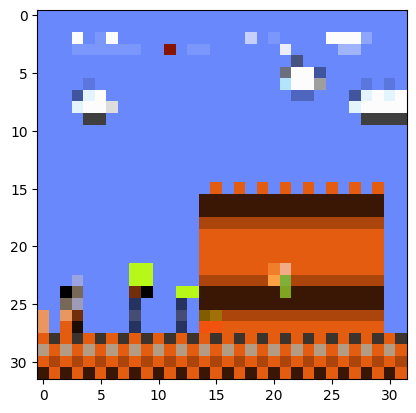

1/1 [==============================] - 0s 19ms/step
Image_420_lvl_8_Stage_3.png es una fotografía del NIVEL 8


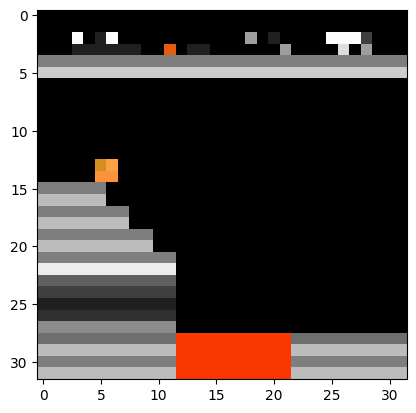

1/1 [==============================] - 0s 18ms/step
Image_120_lvl_8_Stage_4.png es una fotografía del NIVEL 8


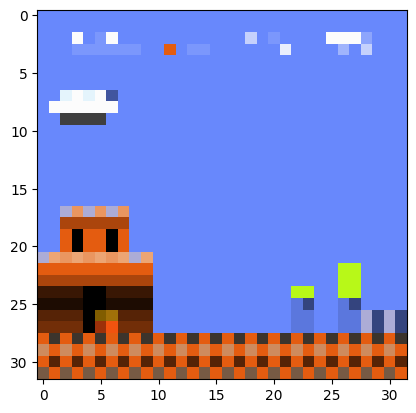

1/1 [==============================] - 0s 18ms/step
Image_120_lvl_8_Stage_3.png es una fotografía del NIVEL 8


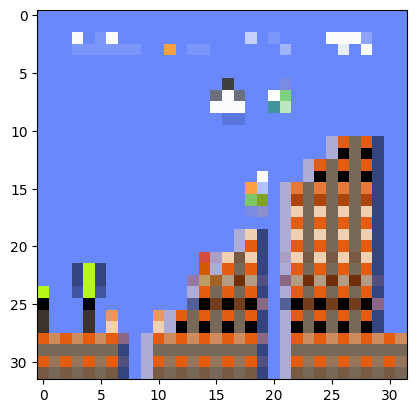

1/1 [==============================] - 0s 24ms/step
Image_1500_lvl_8_Stage_2.png es una fotografía del NIVEL 8


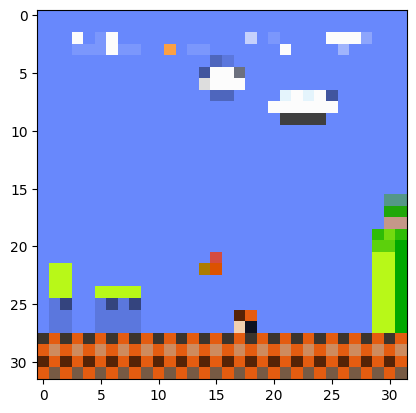

1/1 [==============================] - 0s 27ms/step
Image_1740_lvl_8_Stage_1.png es una fotografía del NIVEL 8


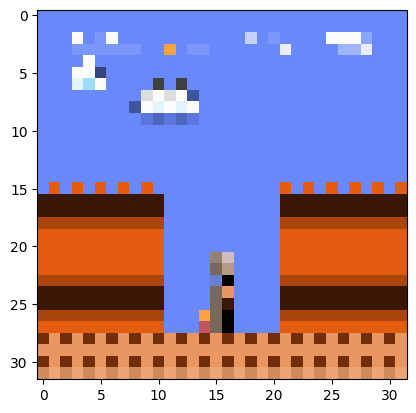

1/1 [==============================] - 0s 18ms/step
Image_1760_lvl_8_Stage_3.png es una fotografía del NIVEL 8


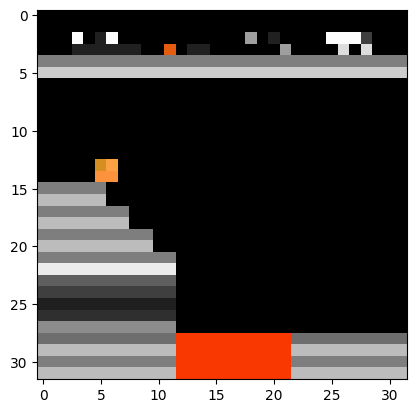

1/1 [==============================] - 0s 19ms/step
Image_140_lvl_8_Stage_4.png es una fotografía del NIVEL 8


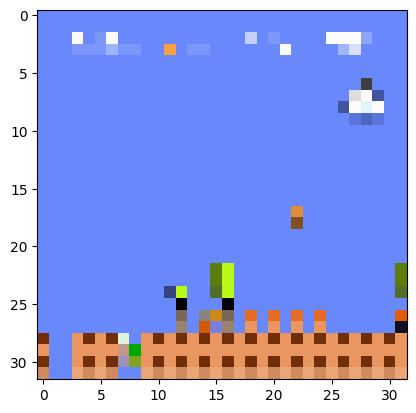

1/1 [==============================] - 0s 18ms/step
Image_820_lvl_8_Stage_1.png es una fotografía del NIVEL 8


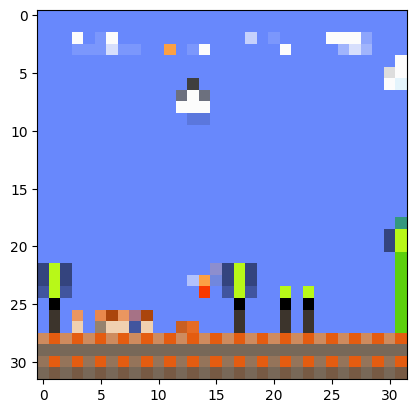

1/1 [==============================] - 0s 21ms/step
Image_960_lvl_8_Stage_1.png es una fotografía del NIVEL 8


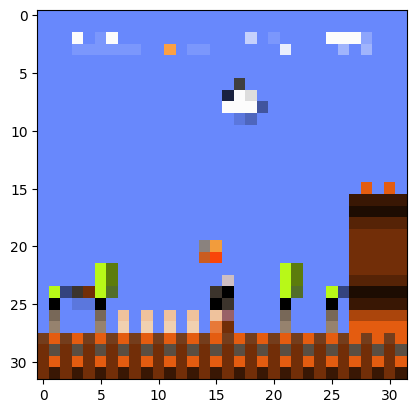

1/1 [==============================] - 0s 19ms/step
Image_1380_lvl_8_Stage_3.png es una fotografía del NIVEL 8


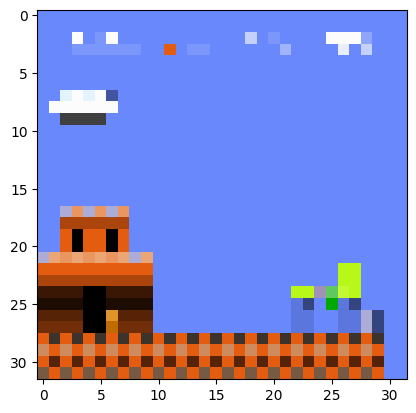

1/1 [==============================] - 0s 18ms/step
Image_120_lvl_8_Stage_2.png es una fotografía del NIVEL 8


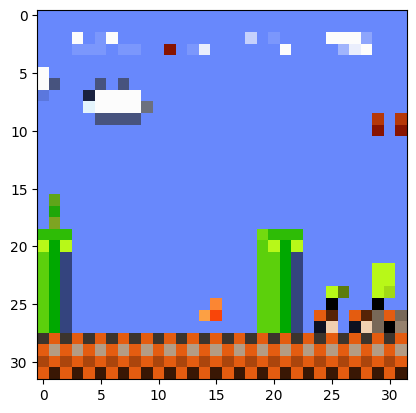

1/1 [==============================] - 0s 20ms/step
Image_1380_lvl_8_Stage_1.png es una fotografía del NIVEL 1


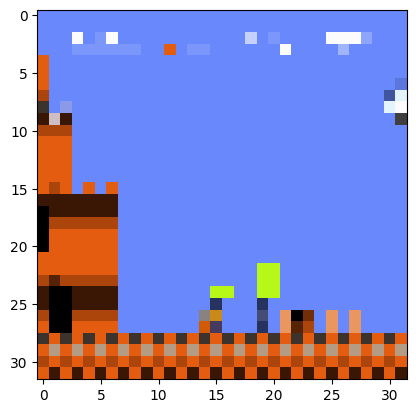

1/1 [==============================] - 0s 22ms/step
Image_1580_lvl_8_Stage_1.png es una fotografía del NIVEL 8


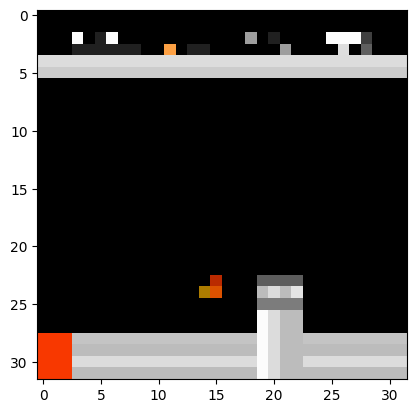

1/1 [==============================] - 0s 20ms/step
Image_1080_lvl_8_Stage_4.png es una fotografía del NIVEL 8


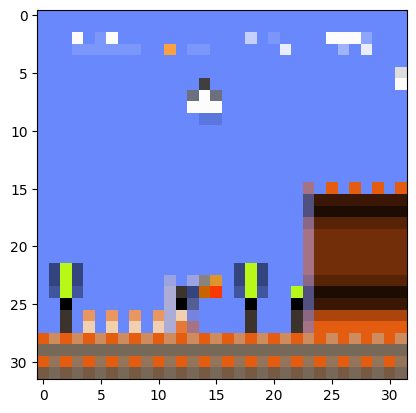

1/1 [==============================] - 0s 18ms/step
Image_360_lvl_8_Stage_3.png es una fotografía del NIVEL 8


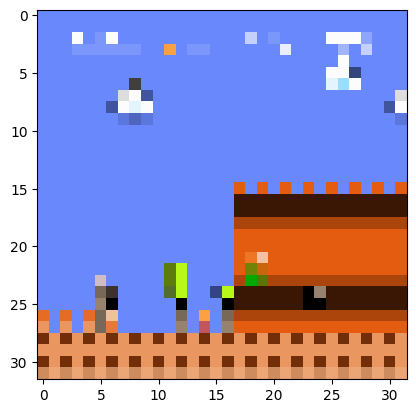

1/1 [==============================] - 0s 20ms/step
Image_1180_lvl_8_Stage_3.png es una fotografía del NIVEL 8


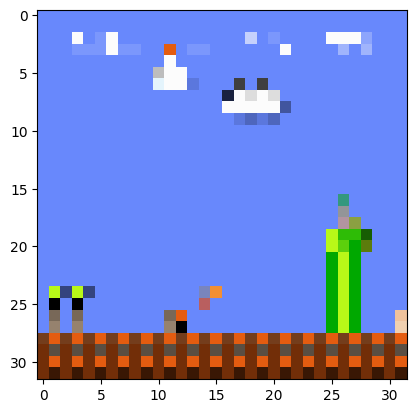

1/1 [==============================] - 0s 20ms/step
Image_1760_lvl_8_Stage_1.png es una fotografía del NIVEL 8


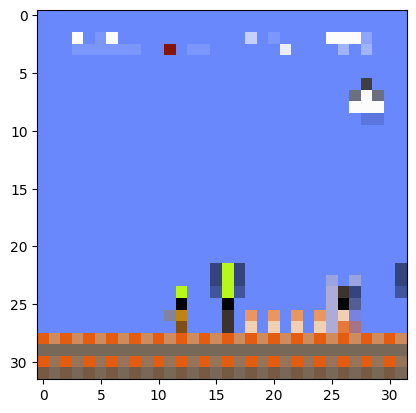

1/1 [==============================] - 0s 18ms/step
Image_760_lvl_8_Stage_3.png es una fotografía del NIVEL 8


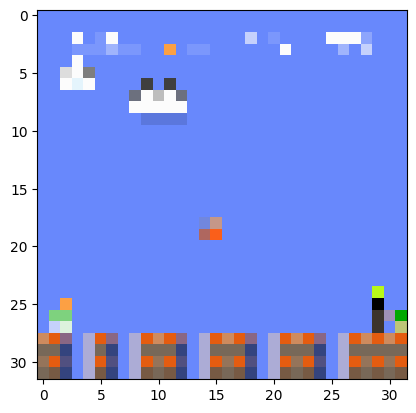

1/1 [==============================] - 0s 19ms/step
Image_740_lvl_8_Stage_1.png es una fotografía del NIVEL 8


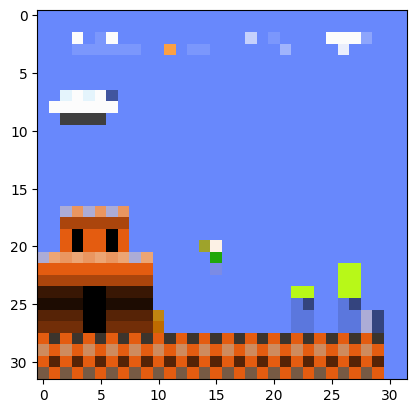

1/1 [==============================] - 0s 19ms/step
Image_960_lvl_8_Stage_2.png es una fotografía del NIVEL 8


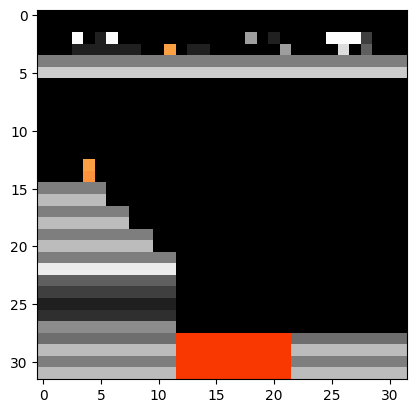

1/1 [==============================] - 0s 18ms/step
Image_1500_lvl_8_Stage_4.png es una fotografía del NIVEL 8


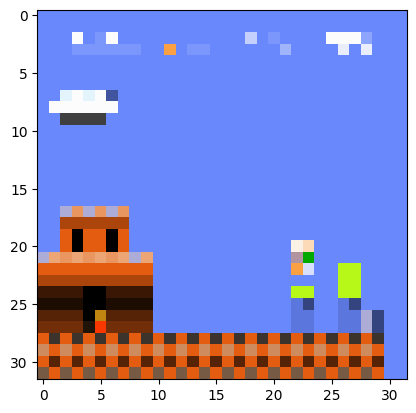

1/1 [==============================] - 0s 26ms/step
Image_860_lvl_8_Stage_2.png es una fotografía del NIVEL 8


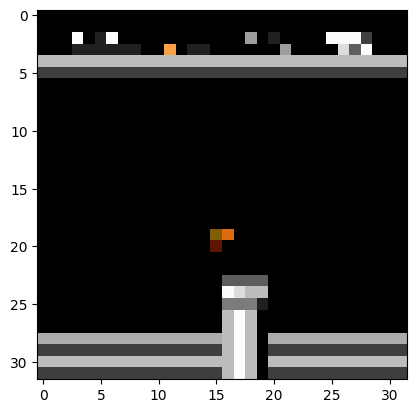

1/1 [==============================] - 0s 23ms/step
Image_580_lvl_8_Stage_4.png es una fotografía del NIVEL 8


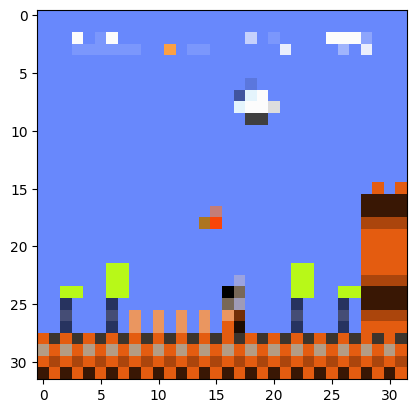

1/1 [==============================] - 0s 20ms/step
Image_340_lvl_8_Stage_3.png es una fotografía del NIVEL 8


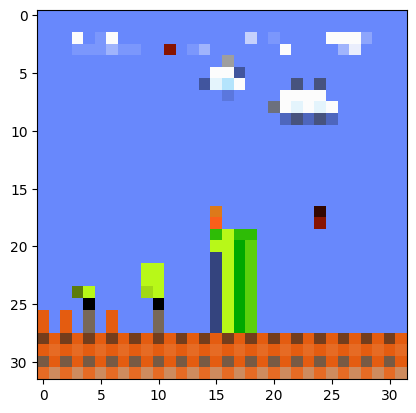

1/1 [==============================] - 0s 20ms/step
Image_1280_lvl_8_Stage_1.png es una fotografía del NIVEL 8


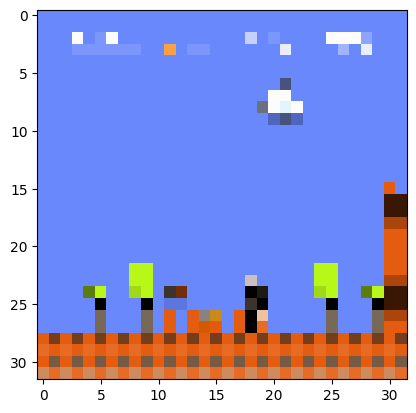

1/1 [==============================] - 0s 26ms/step
Image_1360_lvl_8_Stage_3.png es una fotografía del NIVEL 8


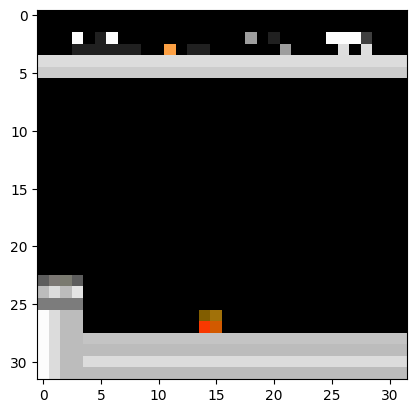

1/1 [==============================] - 0s 20ms/step
Image_1160_lvl_8_Stage_4.png es una fotografía del NIVEL 8


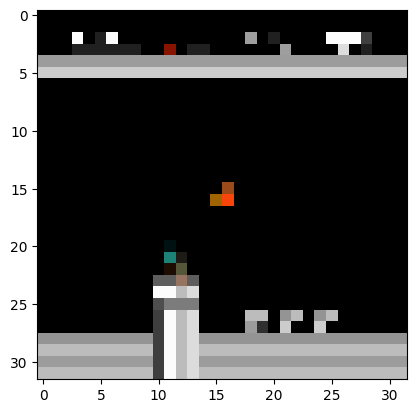

1/1 [==============================] - 0s 33ms/step
Image_800_lvl_8_Stage_4.png es una fotografía del NIVEL 8


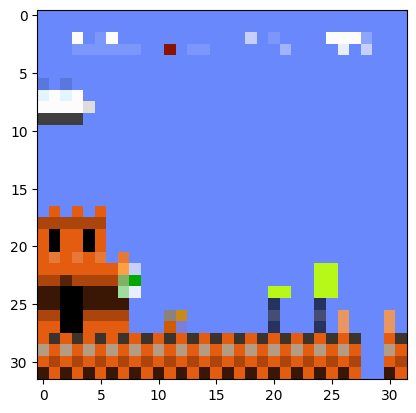

1/1 [==============================] - 0s 28ms/step
Image_320_lvl_8_Stage_2.png es una fotografía del NIVEL 8


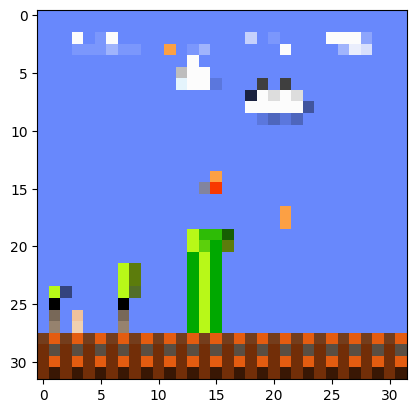

1/1 [==============================] - 0s 28ms/step
Image_1300_lvl_8_Stage_1.png es una fotografía del NIVEL 8


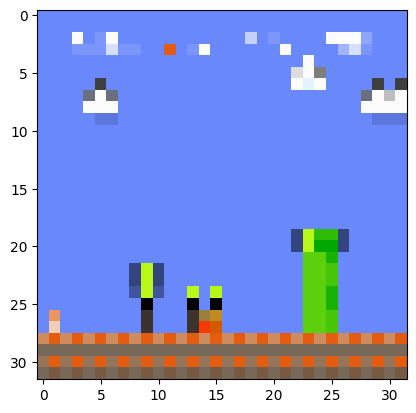

1/1 [==============================] - 0s 46ms/step
Image_1000_lvl_8_Stage_1.png es una fotografía del NIVEL 8


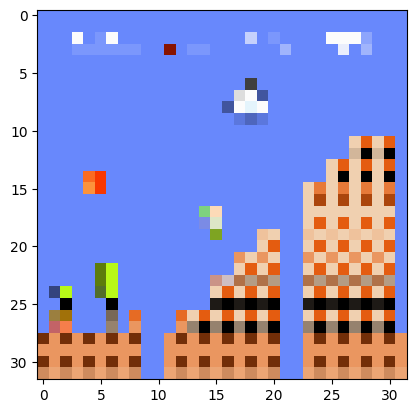

1/1 [==============================] - 0s 34ms/step
Image_660_lvl_8_Stage_2.png es una fotografía del NIVEL 8


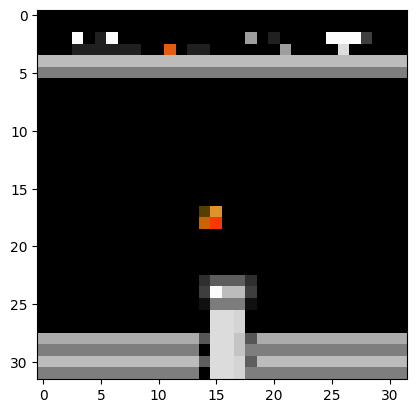

1/1 [==============================] - 0s 28ms/step
Image_1100_lvl_8_Stage_4.png es una fotografía del NIVEL 8


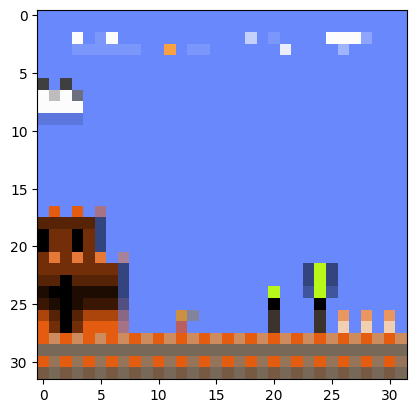

1/1 [==============================] - 0s 27ms/step
Image_900_lvl_8_Stage_3.png es una fotografía del NIVEL 8


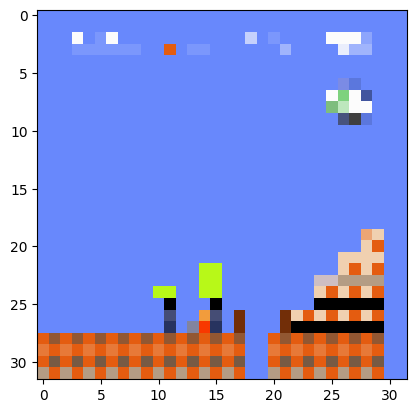

1/1 [==============================] - 0s 31ms/step
Image_460_lvl_8_Stage_2.png es una fotografía del NIVEL 8


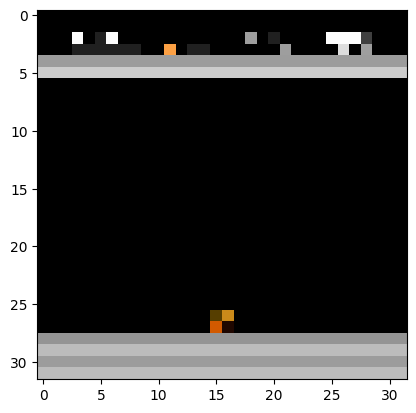

1/1 [==============================] - 0s 29ms/step
Image_720_lvl_8_Stage_4.png es una fotografía del NIVEL 8


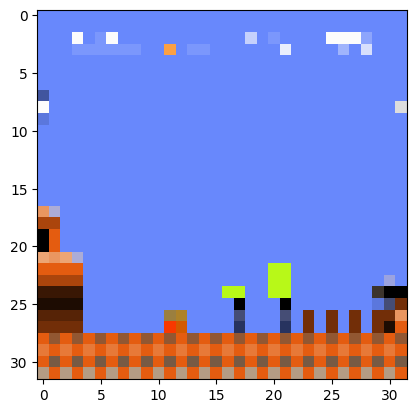

1/1 [==============================] - 0s 18ms/step
Image_600_lvl_8_Stage_3.png es una fotografía del NIVEL 8


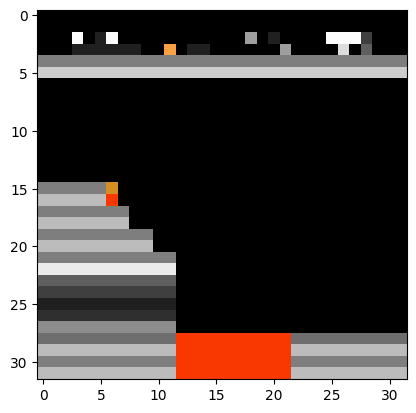

1/1 [==============================] - 0s 18ms/step
Image_880_lvl_8_Stage_4.png es una fotografía del NIVEL 8


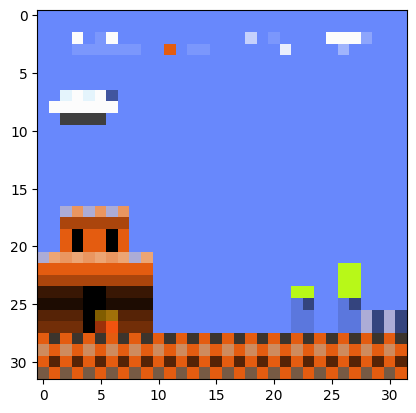

1/1 [==============================] - 0s 19ms/step
Image_40_lvl_8_Stage_3.png es una fotografía del NIVEL 8


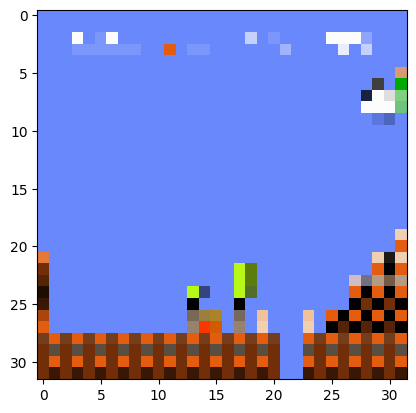

1/1 [==============================] - 0s 17ms/step
Image_1040_lvl_8_Stage_2.png es una fotografía del NIVEL 8


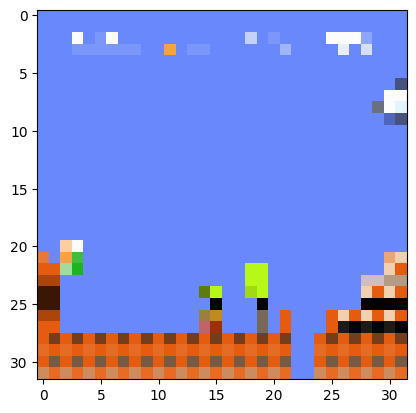

1/1 [==============================] - 0s 20ms/step
Image_1020_lvl_8_Stage_2.png es una fotografía del NIVEL 8


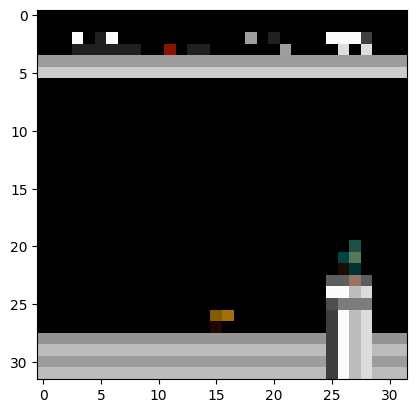

1/1 [==============================] - 0s 20ms/step
Image_760_lvl_8_Stage_4.png es una fotografía del NIVEL 8


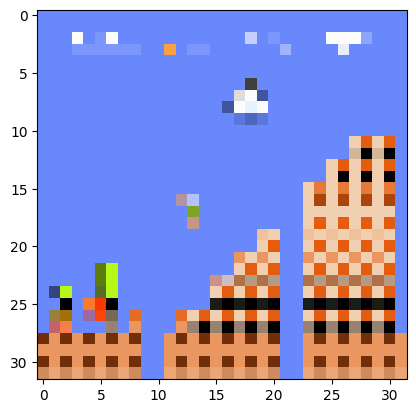

1/1 [==============================] - 0s 19ms/step
Image_680_lvl_8_Stage_2.png es una fotografía del NIVEL 8


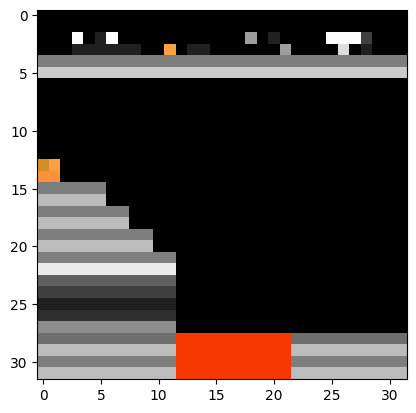

1/1 [==============================] - 0s 19ms/step
Image_1640_lvl_8_Stage_4.png es una fotografía del NIVEL 8


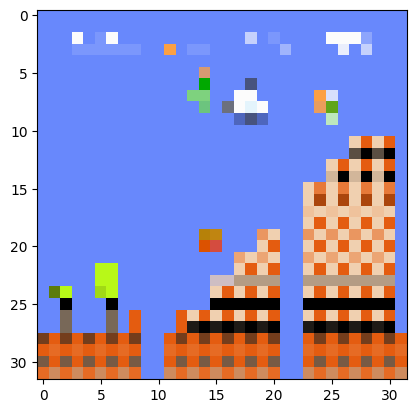

1/1 [==============================] - 0s 19ms/step
Image_1440_lvl_8_Stage_2.png es una fotografía del NIVEL 8


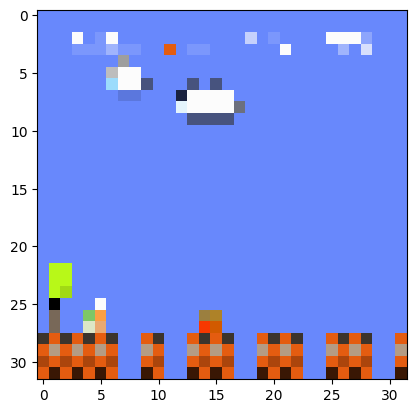

1/1 [==============================] - 0s 20ms/step
Image_720_lvl_8_Stage_1.png es una fotografía del NIVEL 8


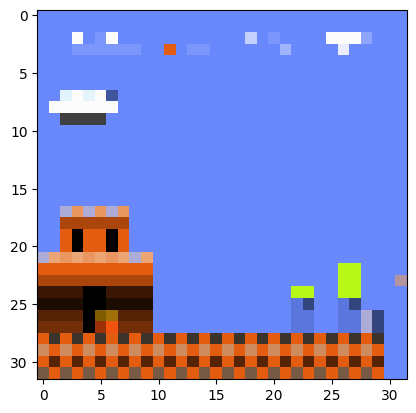

1/1 [==============================] - 0s 21ms/step
Image_740_lvl_8_Stage_2.png es una fotografía del NIVEL 8


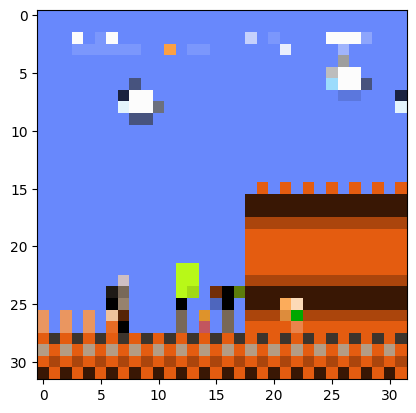

1/1 [==============================] - 0s 18ms/step
Image_1140_lvl_8_Stage_3.png es una fotografía del NIVEL 8


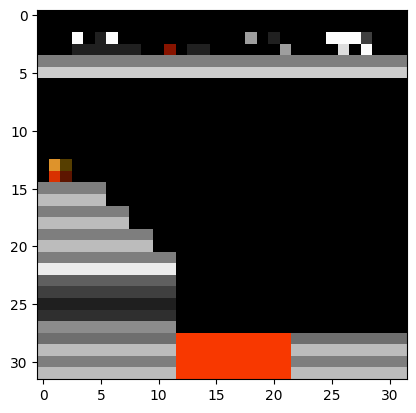

1/1 [==============================] - 0s 20ms/step
Image_180_lvl_8_Stage_4.png es una fotografía del NIVEL 8


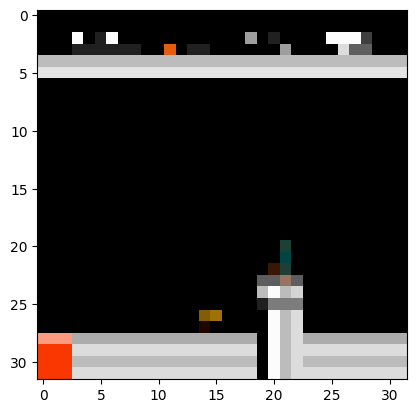

1/1 [==============================] - 0s 19ms/step
Image_460_lvl_8_Stage_4.png es una fotografía del NIVEL 8


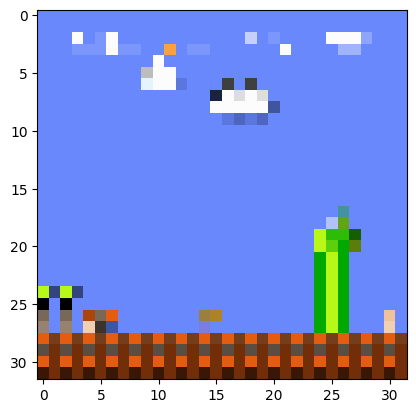

1/1 [==============================] - 0s 17ms/step
Image_480_lvl_8_Stage_1.png es una fotografía del NIVEL 8


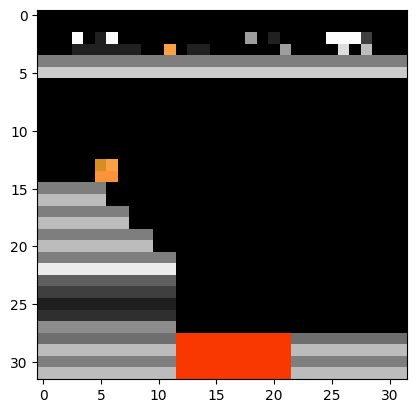

1/1 [==============================] - 0s 19ms/step
Image_100_lvl_8_Stage_4.png es una fotografía del NIVEL 8


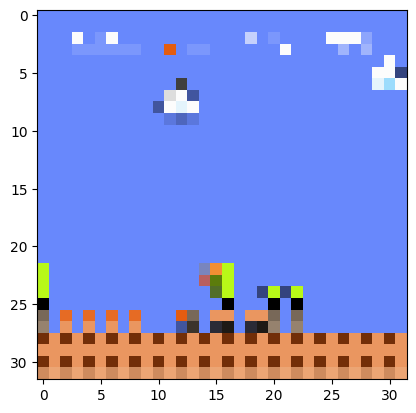

1/1 [==============================] - 0s 18ms/step
Image_360_lvl_8_Stage_1.png es una fotografía del NIVEL 8


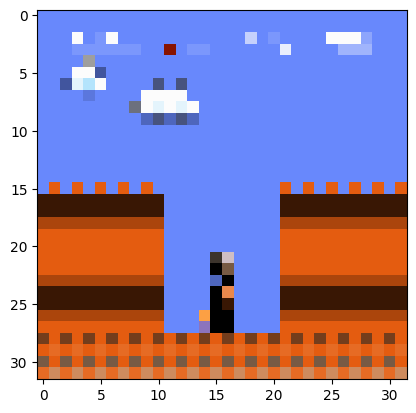

1/1 [==============================] - 0s 21ms/step
Image_1780_lvl_8_Stage_3.png es una fotografía del NIVEL 8


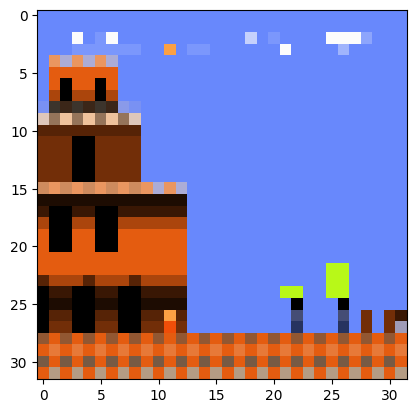

1/1 [==============================] - 0s 18ms/step
Image_1540_lvl_8_Stage_1.png es una fotografía del NIVEL 8


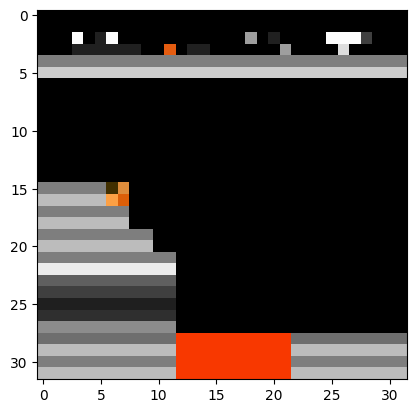

1/1 [==============================] - 0s 18ms/step
Image_860_lvl_8_Stage_4.png es una fotografía del NIVEL 8


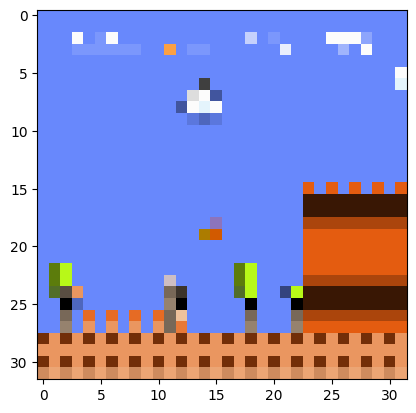

1/1 [==============================] - 0s 27ms/step
Image_1040_lvl_8_Stage_3.png es una fotografía del NIVEL 8


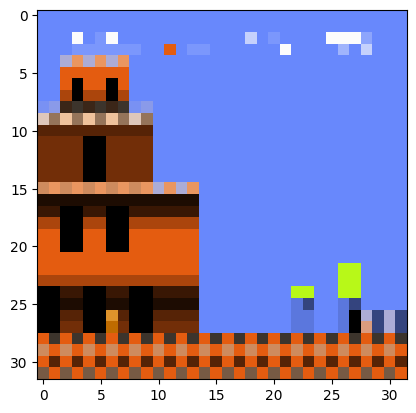

1/1 [==============================] - 0s 27ms/step
Image_120_lvl_8_Stage_1.png es una fotografía del NIVEL 8


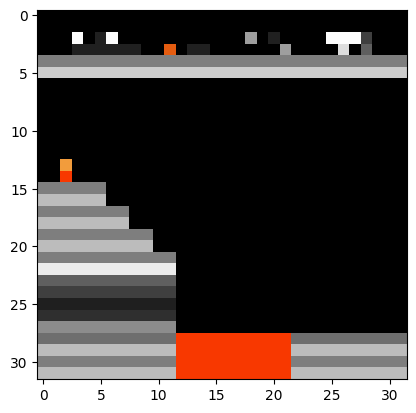

1/1 [==============================] - 0s 17ms/step
Image_360_lvl_8_Stage_4.png es una fotografía del NIVEL 8


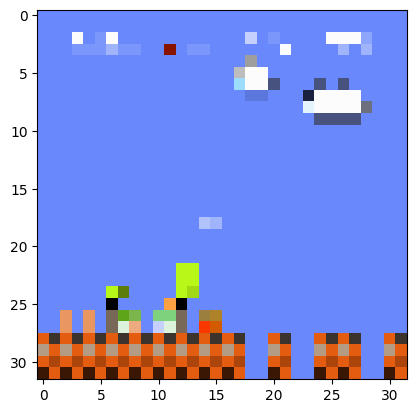

1/1 [==============================] - 0s 19ms/step
Image_660_lvl_8_Stage_1.png es una fotografía del NIVEL 8


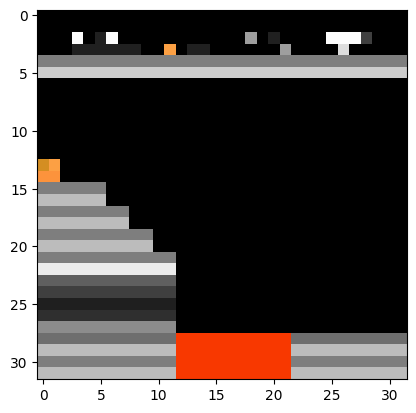

1/1 [==============================] - 0s 19ms/step
Image_1680_lvl_8_Stage_4.png es una fotografía del NIVEL 8


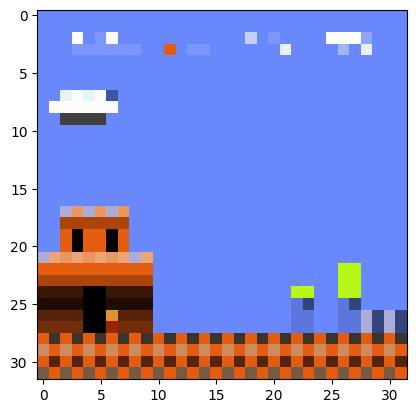

1/1 [==============================] - 0s 20ms/step
Image_140_lvl_8_Stage_3.png es una fotografía del NIVEL 8


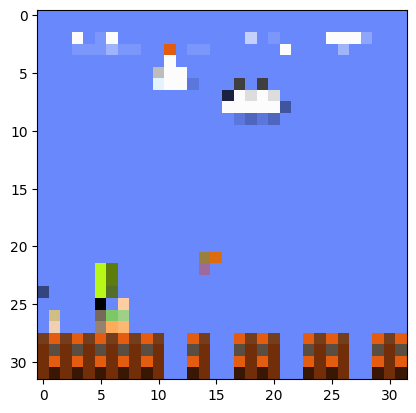

1/1 [==============================] - 0s 21ms/step
Image_700_lvl_8_Stage_1.png es una fotografía del NIVEL 8


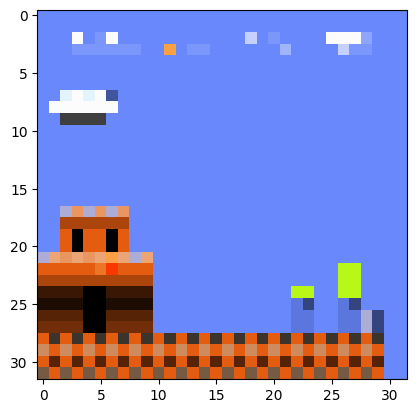

1/1 [==============================] - 0s 21ms/step
Image_1560_lvl_8_Stage_2.png es una fotografía del NIVEL 8


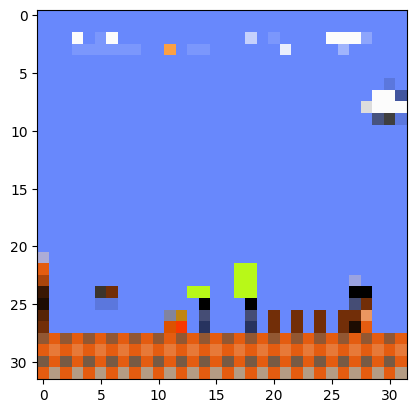

1/1 [==============================] - 0s 20ms/step
Image_740_lvl_8_Stage_3.png es una fotografía del NIVEL 8


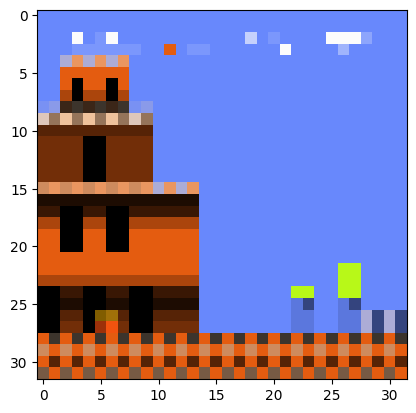

1/1 [==============================] - 0s 18ms/step
Image_40_lvl_8_Stage_1.png es una fotografía del NIVEL 8


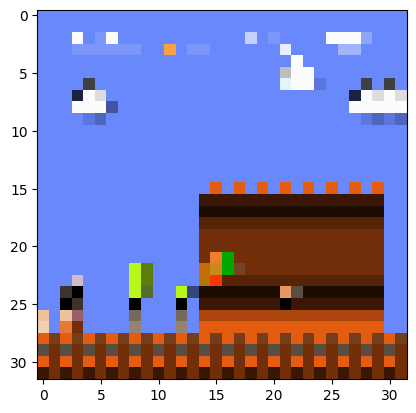

1/1 [==============================] - 0s 20ms/step
Image_480_lvl_8_Stage_3.png es una fotografía del NIVEL 8


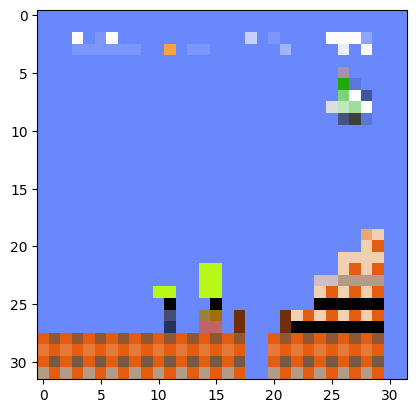

1/1 [==============================] - 0s 22ms/step
Image_1100_lvl_8_Stage_2.png es una fotografía del NIVEL 8


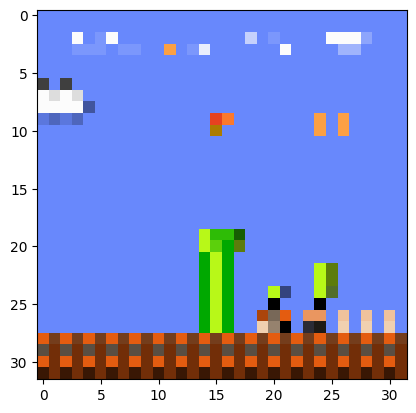

1/1 [==============================] - 0s 18ms/step
Image_1440_lvl_8_Stage_1.png es una fotografía del NIVEL 8


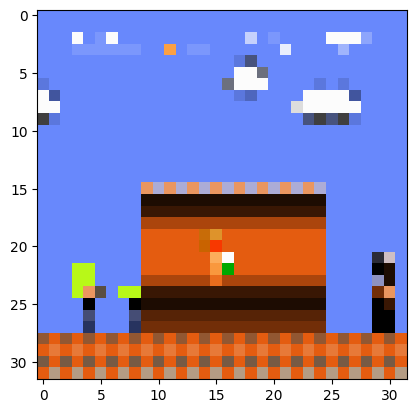

1/1 [==============================] - 0s 19ms/step
Image_1460_lvl_8_Stage_3.png es una fotografía del NIVEL 8


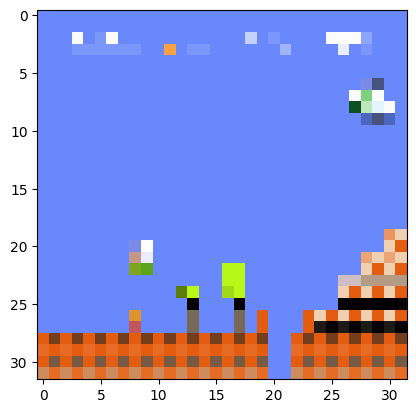

1/1 [==============================] - 0s 22ms/step
Image_1760_lvl_8_Stage_2.png es una fotografía del NIVEL 8


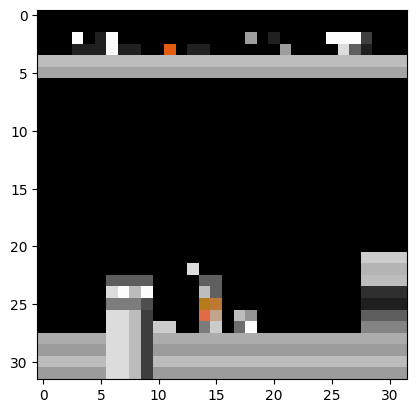

1/1 [==============================] - 0s 22ms/step
Image_1420_lvl_8_Stage_4.png es una fotografía del NIVEL 8


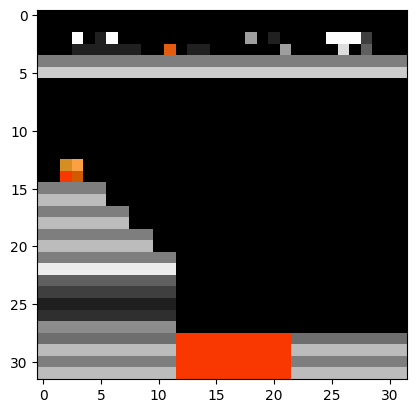

1/1 [==============================] - 0s 18ms/step
Image_1700_lvl_8_Stage_4.png es una fotografía del NIVEL 8


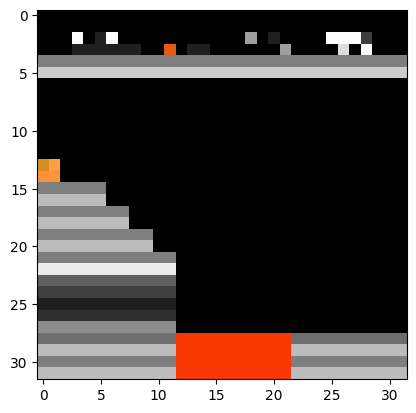

1/1 [==============================] - 0s 21ms/step
Image_1620_lvl_8_Stage_4.png es una fotografía del NIVEL 8


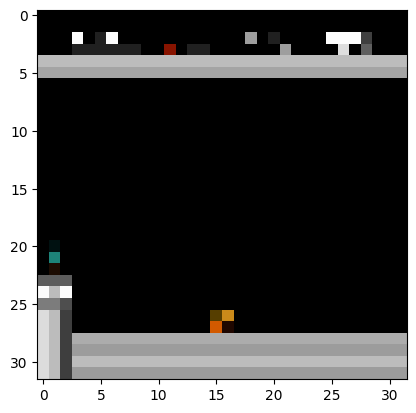

1/1 [==============================] - 0s 21ms/step
Image_660_lvl_8_Stage_4.png es una fotografía del NIVEL 8


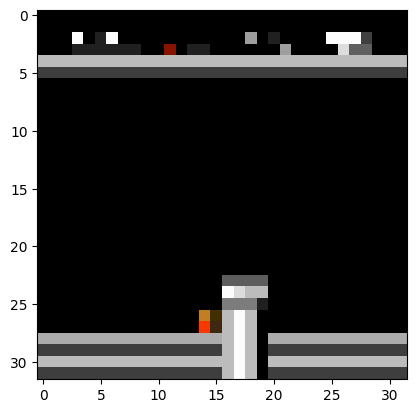

1/1 [==============================] - 0s 20ms/step
Image_560_lvl_8_Stage_4.png es una fotografía del NIVEL 8


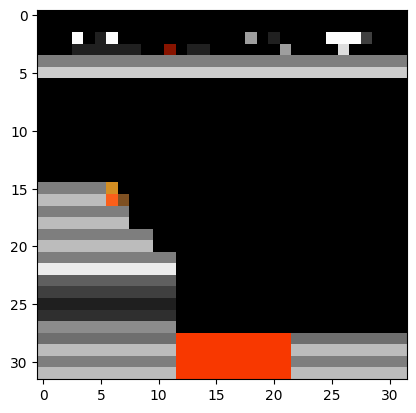

1/1 [==============================] - 0s 26ms/step
Image_900_lvl_8_Stage_4.png es una fotografía del NIVEL 8


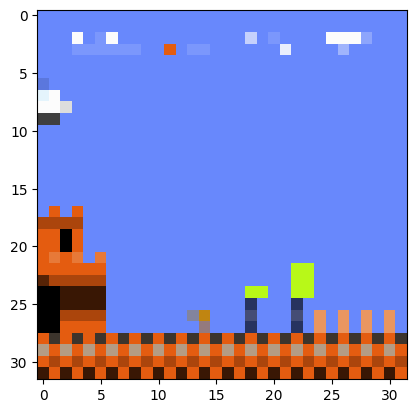

1/1 [==============================] - 0s 40ms/step
Image_220_lvl_8_Stage_3.png es una fotografía del NIVEL 8


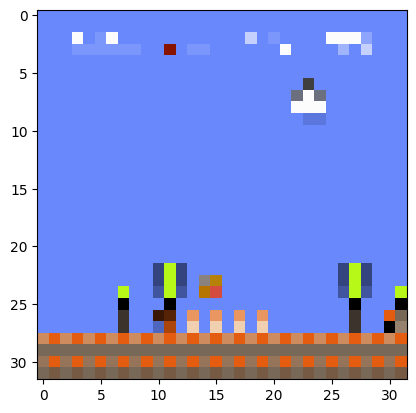

1/1 [==============================] - 0s 31ms/step
Image_1620_lvl_8_Stage_1.png es una fotografía del NIVEL 8


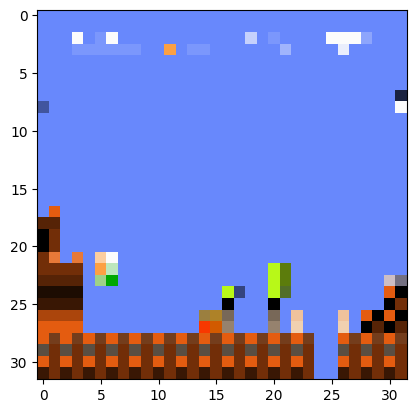

1/1 [==============================] - 0s 44ms/step
Image_1000_lvl_8_Stage_2.png es una fotografía del NIVEL 8


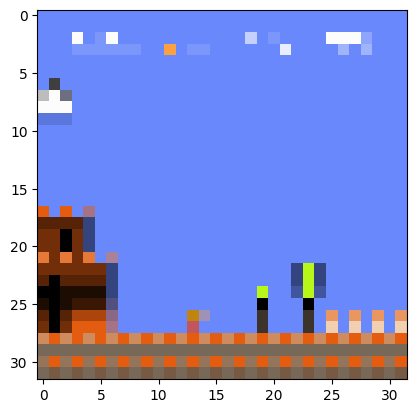

1/1 [==============================] - 0s 29ms/step
Image_1280_lvl_8_Stage_3.png es una fotografía del NIVEL 8


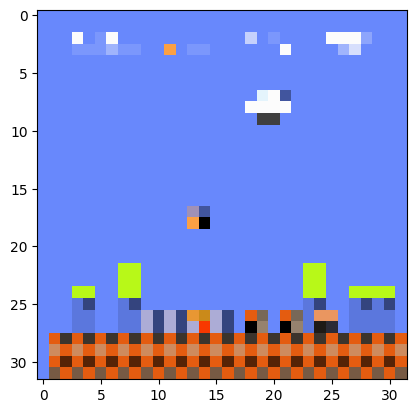

1/1 [==============================] - 0s 28ms/step
Image_880_lvl_8_Stage_1.png es una fotografía del NIVEL 8


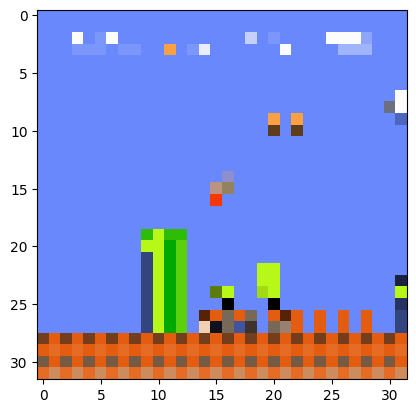

1/1 [==============================] - 0s 30ms/step
Image_1460_lvl_8_Stage_1.png es una fotografía del NIVEL 8


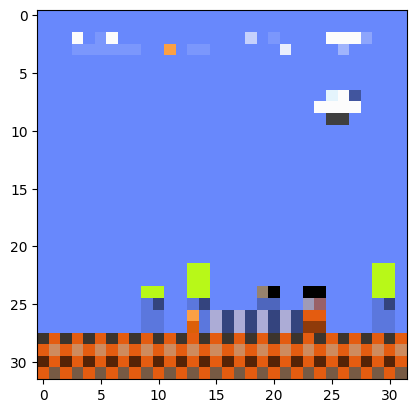

1/1 [==============================] - 0s 22ms/step
Image_780_lvl_8_Stage_3.png es una fotografía del NIVEL 8


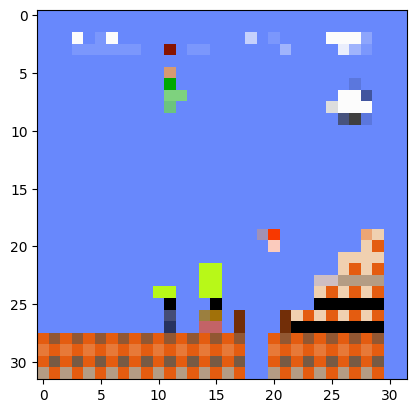

1/1 [==============================] - 0s 21ms/step
Image_1320_lvl_8_Stage_2.png es una fotografía del NIVEL 8


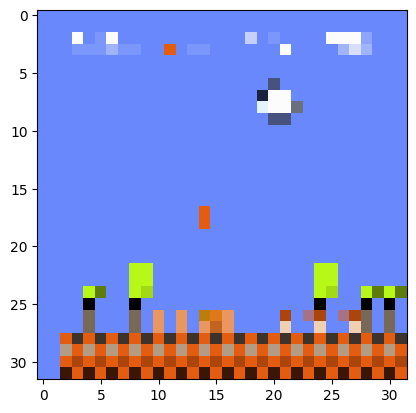

1/1 [==============================] - 0s 23ms/step
Image_860_lvl_8_Stage_1.png es una fotografía del NIVEL 8


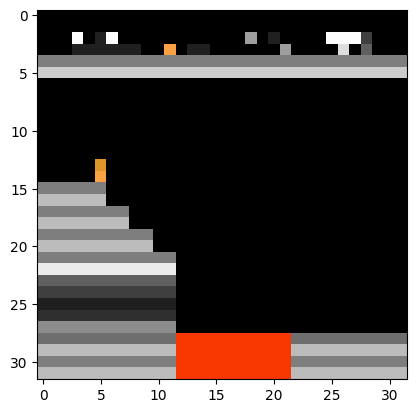

1/1 [==============================] - 0s 21ms/step
Image_160_lvl_8_Stage_4.png es una fotografía del NIVEL 8


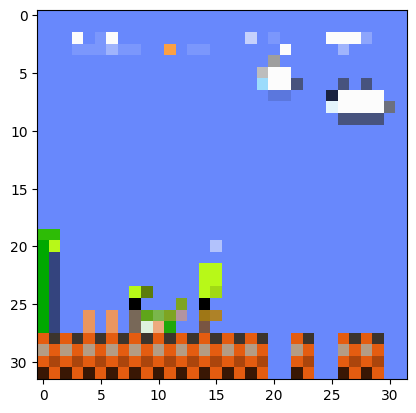

1/1 [==============================] - 0s 27ms/step
Image_640_lvl_8_Stage_1.png es una fotografía del NIVEL 8


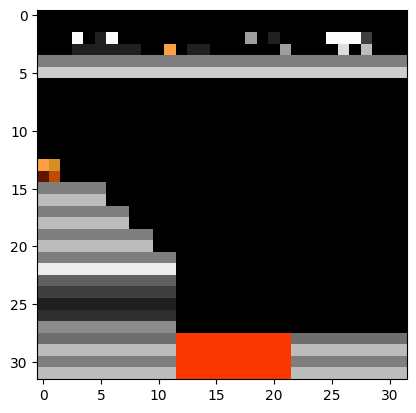

1/1 [==============================] - 0s 30ms/step
Image_300_lvl_8_Stage_4.png es una fotografía del NIVEL 8


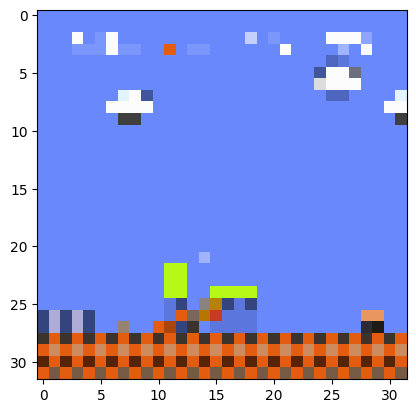

1/1 [==============================] - 0s 19ms/step
Image_380_lvl_8_Stage_1.png es una fotografía del NIVEL 8


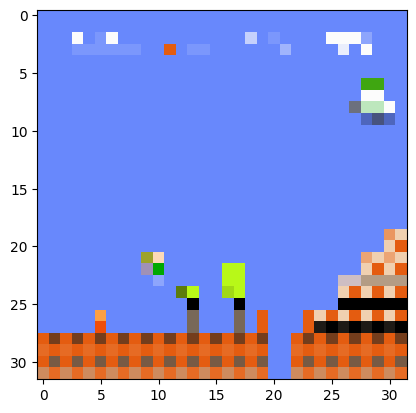

1/1 [==============================] - 0s 24ms/step
Image_1740_lvl_8_Stage_2.png es una fotografía del NIVEL 8


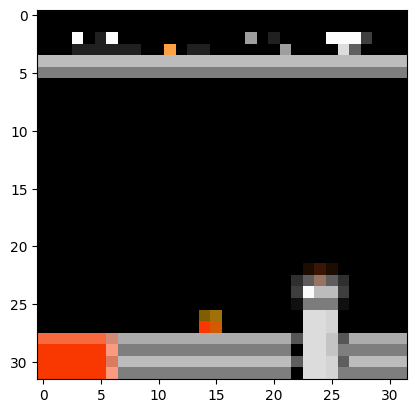

1/1 [==============================] - 0s 29ms/step
Image_440_lvl_8_Stage_4.png es una fotografía del NIVEL 8


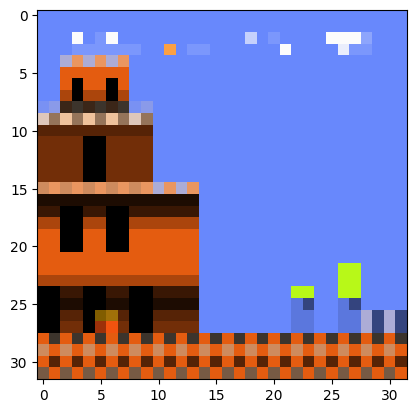

1/1 [==============================] - 0s 23ms/step
Image_0_lvl_8_Stage_1.png es una fotografía del NIVEL 8


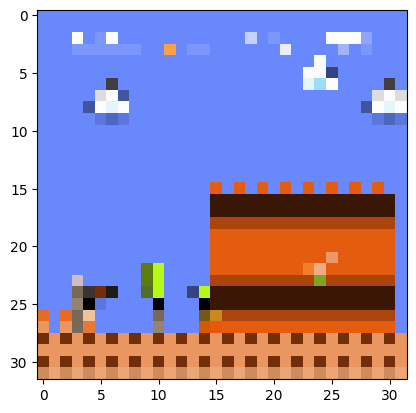

1/1 [==============================] - 0s 21ms/step
Image_400_lvl_8_Stage_3.png es una fotografía del NIVEL 8


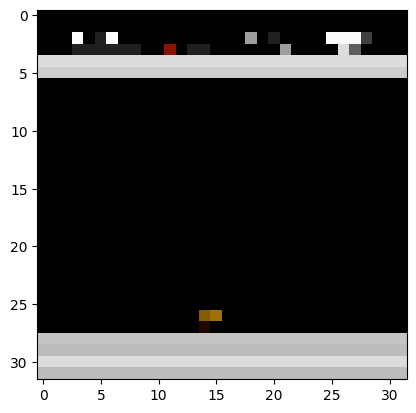

1/1 [==============================] - 0s 26ms/step
Image_1240_lvl_8_Stage_4.png es una fotografía del NIVEL 8


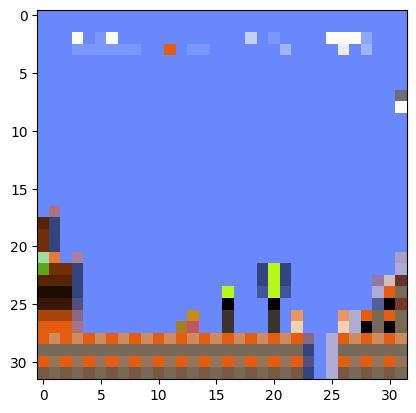

1/1 [==============================] - 0s 26ms/step
Image_360_lvl_8_Stage_2.png es una fotografía del NIVEL 8


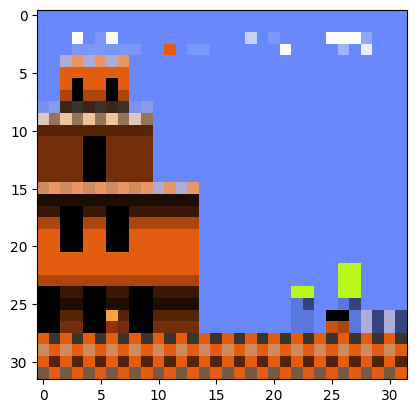

1/1 [==============================] - 0s 27ms/step
Image_140_lvl_8_Stage_1.png es una fotografía del NIVEL 8


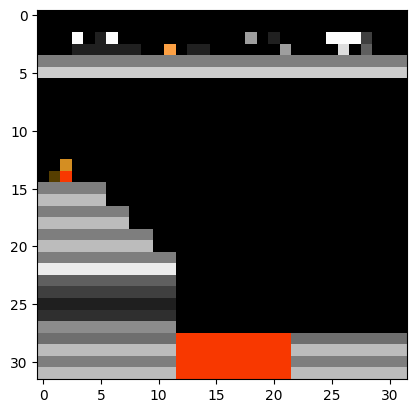

1/1 [==============================] - 0s 23ms/step
Image_980_lvl_8_Stage_4.png es una fotografía del NIVEL 8


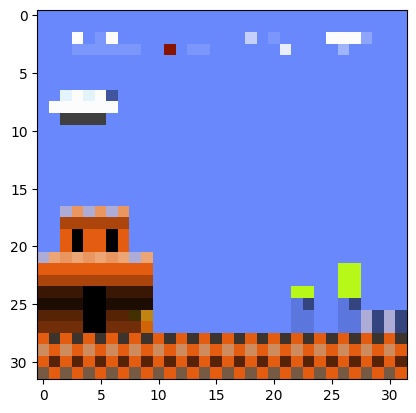

1/1 [==============================] - 0s 23ms/step
Image_520_lvl_8_Stage_3.png es una fotografía del NIVEL 8


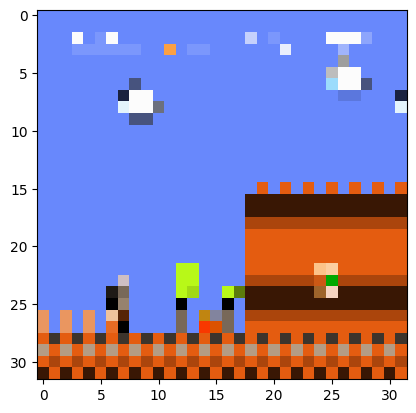

1/1 [==============================] - 0s 26ms/step
Image_1100_lvl_8_Stage_3.png es una fotografía del NIVEL 8


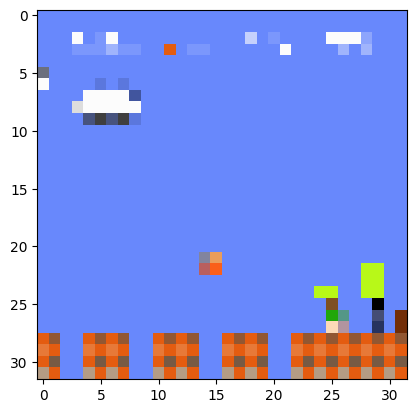

1/1 [==============================] - 0s 22ms/step
Image_760_lvl_8_Stage_1.png es una fotografía del NIVEL 8


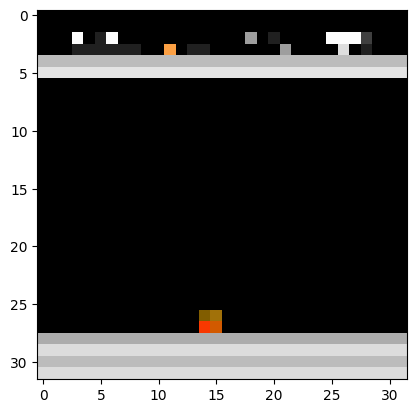

1/1 [==============================] - 0s 26ms/step
Image_1220_lvl_8_Stage_4.png es una fotografía del NIVEL 8


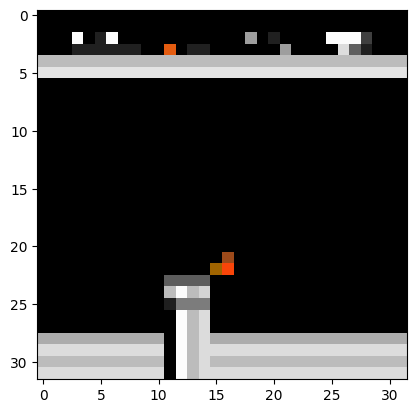

1/1 [==============================] - 0s 25ms/step
Image_600_lvl_8_Stage_4.png es una fotografía del NIVEL 8


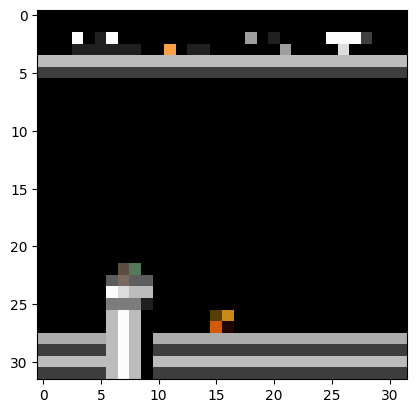

1/1 [==============================] - 0s 24ms/step
Image_640_lvl_8_Stage_4.png es una fotografía del NIVEL 8


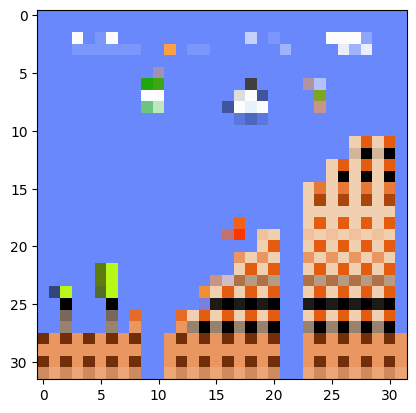

1/1 [==============================] - 0s 20ms/step
Image_540_lvl_8_Stage_2.png es una fotografía del NIVEL 8


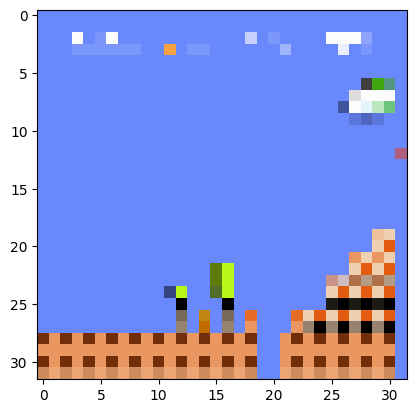

1/1 [==============================] - 0s 19ms/step
Image_400_lvl_8_Stage_2.png es una fotografía del NIVEL 8


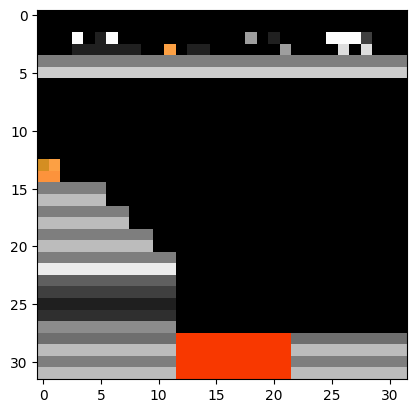

1/1 [==============================] - 0s 28ms/step
Image_1580_lvl_8_Stage_4.png es una fotografía del NIVEL 8


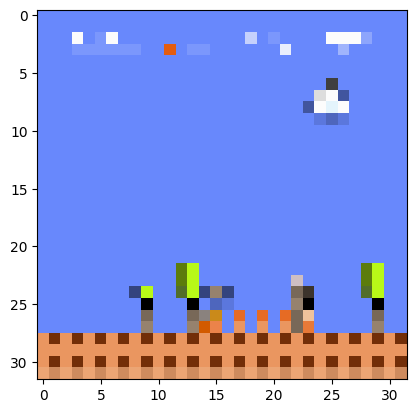

1/1 [==============================] - 0s 23ms/step
Image_280_lvl_8_Stage_3.png es una fotografía del NIVEL 8


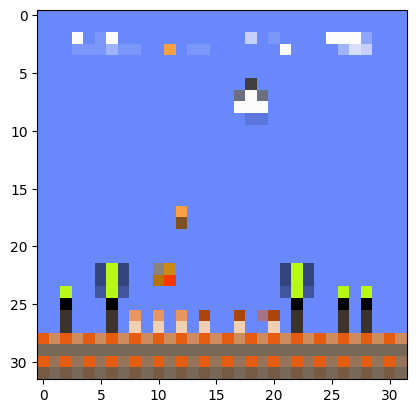

1/1 [==============================] - 0s 18ms/step
Image_920_lvl_8_Stage_1.png es una fotografía del NIVEL 8


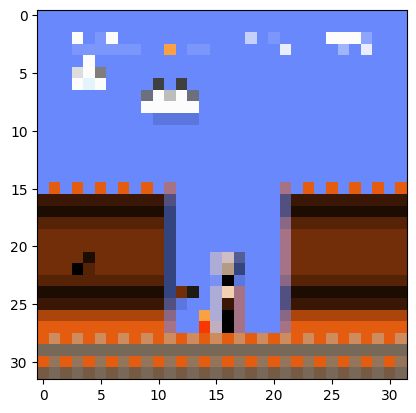

1/1 [==============================] - 0s 24ms/step
Image_1560_lvl_8_Stage_3.png es una fotografía del NIVEL 8


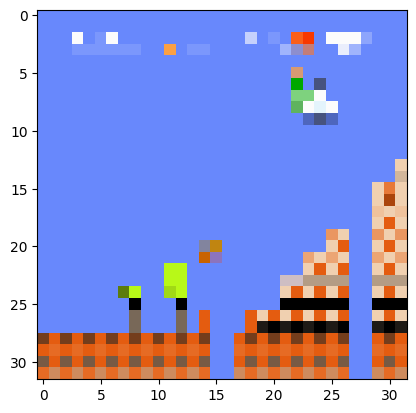

1/1 [==============================] - 0s 19ms/step
Image_480_lvl_8_Stage_2.png es una fotografía del NIVEL 8


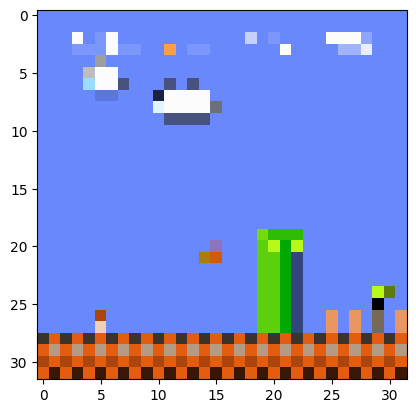

1/1 [==============================] - 0s 23ms/step
Image_540_lvl_8_Stage_1.png es una fotografía del NIVEL 8


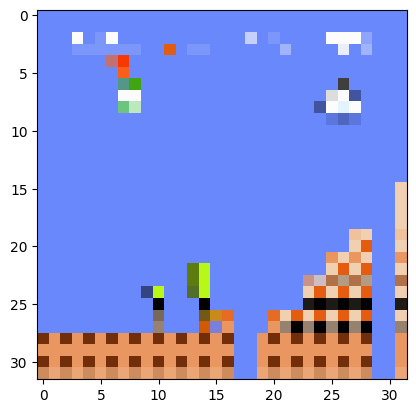

1/1 [==============================] - 0s 26ms/step
Image_1380_lvl_8_Stage_2.png es una fotografía del NIVEL 8


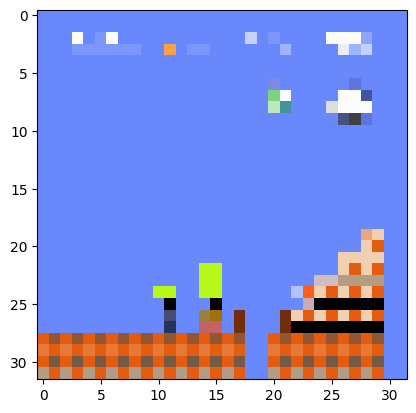

1/1 [==============================] - 0s 25ms/step
Image_1240_lvl_8_Stage_2.png es una fotografía del NIVEL 8


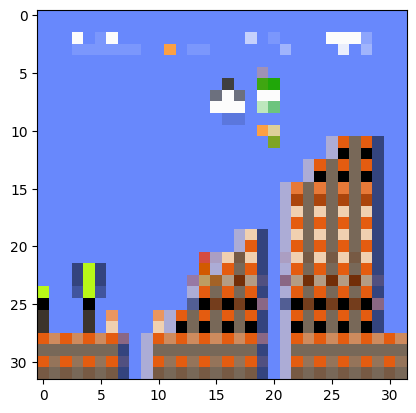

1/1 [==============================] - 0s 23ms/step
Image_1480_lvl_8_Stage_2.png es una fotografía del NIVEL 8


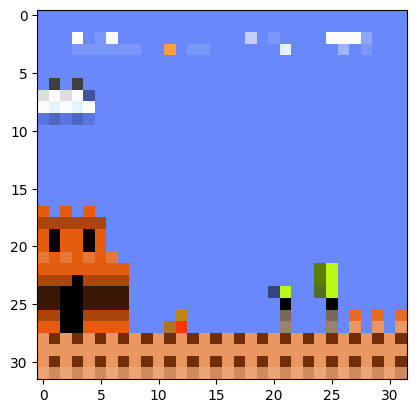

1/1 [==============================] - 0s 22ms/step
Image_200_lvl_8_Stage_3.png es una fotografía del NIVEL 8


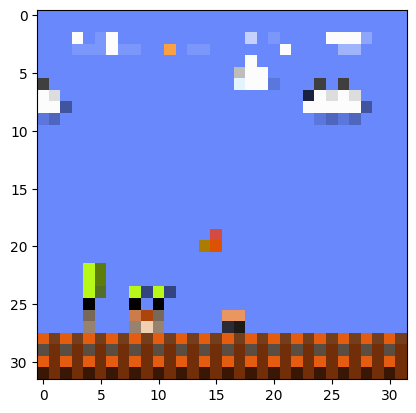

1/1 [==============================] - 0s 23ms/step
Image_440_lvl_8_Stage_1.png es una fotografía del NIVEL 8


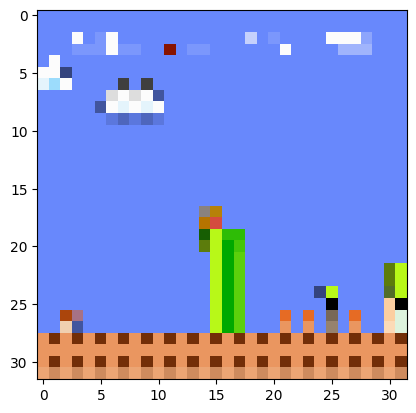

1/1 [==============================] - 0s 25ms/step
Image_560_lvl_8_Stage_1.png es una fotografía del NIVEL 8


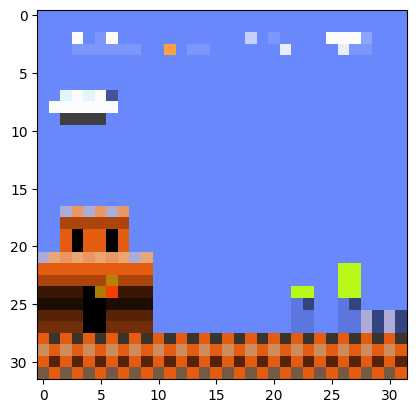

1/1 [==============================] - 0s 25ms/step
Image_1220_lvl_8_Stage_3.png es una fotografía del NIVEL 8


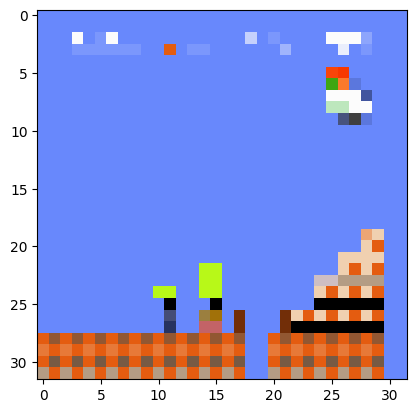

1/1 [==============================] - 0s 24ms/step
Image_1120_lvl_8_Stage_2.png es una fotografía del NIVEL 8


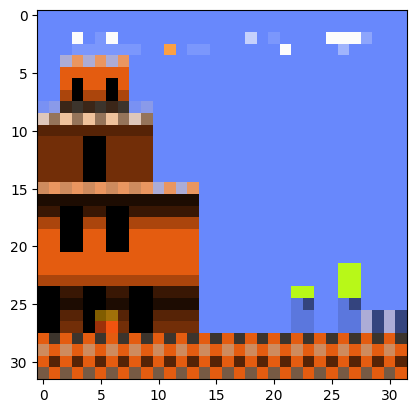

1/1 [==============================] - 0s 21ms/step
Image_20_lvl_8_Stage_1.png es una fotografía del NIVEL 8


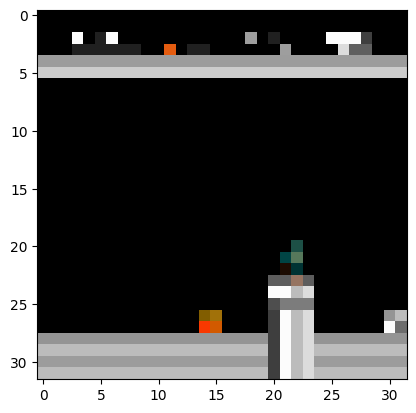

1/1 [==============================] - 0s 21ms/step
Image_1280_lvl_8_Stage_4.png es una fotografía del NIVEL 8


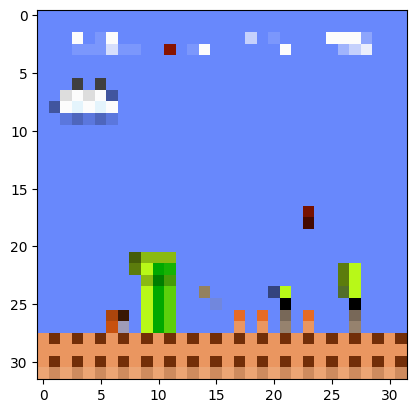

1/1 [==============================] - 0s 21ms/step
Image_1140_lvl_8_Stage_1.png es una fotografía del NIVEL 8


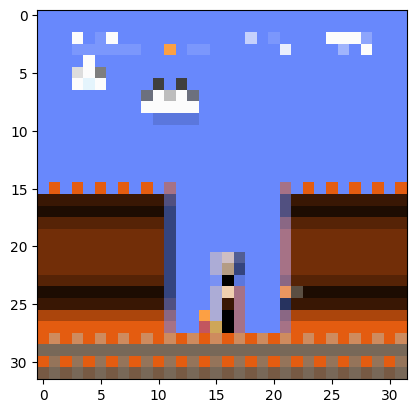

1/1 [==============================] - 0s 29ms/step
Image_1600_lvl_8_Stage_3.png es una fotografía del NIVEL 8


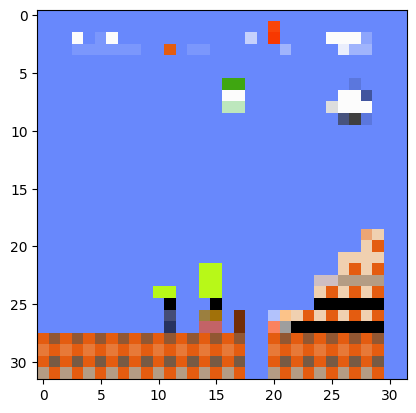

1/1 [==============================] - 0s 32ms/step
Image_1280_lvl_8_Stage_2.png es una fotografía del NIVEL 8


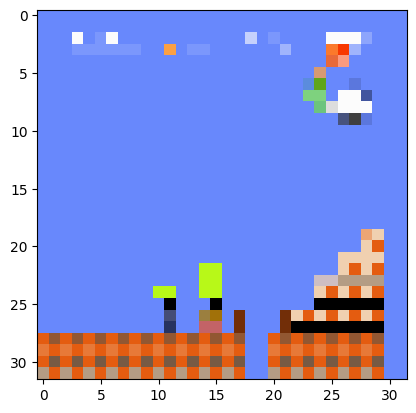

1/1 [==============================] - 0s 37ms/step
Image_1160_lvl_8_Stage_2.png es una fotografía del NIVEL 8


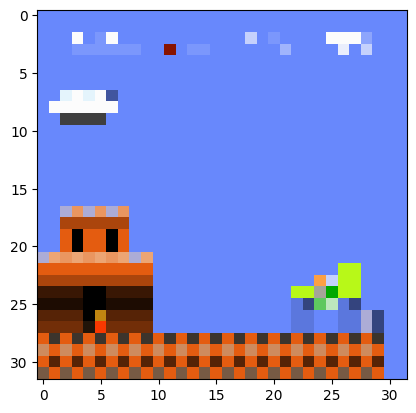

1/1 [==============================] - 0s 33ms/step
Image_840_lvl_8_Stage_2.png es una fotografía del NIVEL 8


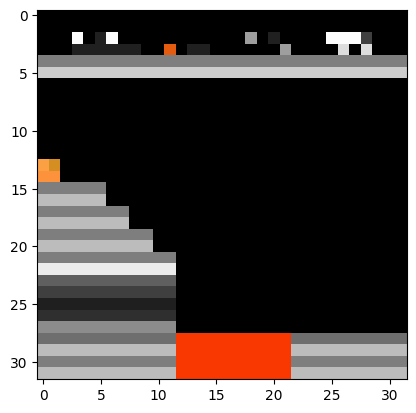

1/1 [==============================] - 0s 28ms/step
Image_960_lvl_8_Stage_4.png es una fotografía del NIVEL 8


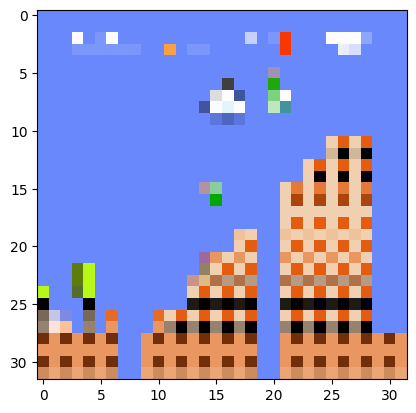

1/1 [==============================] - 0s 29ms/step
Image_1540_lvl_8_Stage_2.png es una fotografía del NIVEL 8


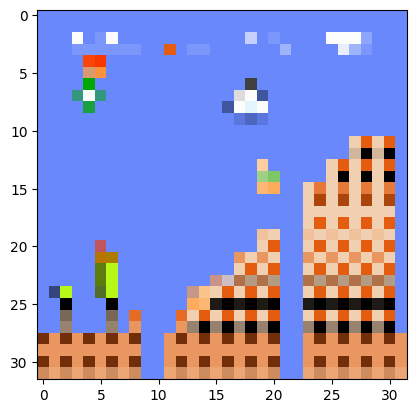

1/1 [==============================] - 0s 29ms/step
Image_600_lvl_8_Stage_2.png es una fotografía del NIVEL 8


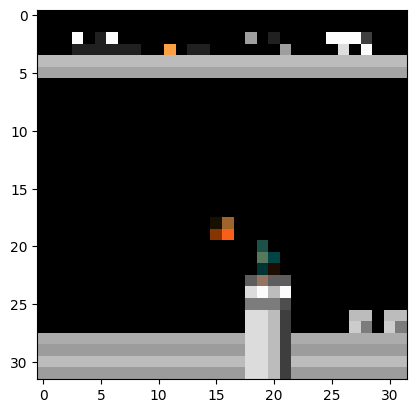

1/1 [==============================] - 0s 25ms/step
Image_780_lvl_8_Stage_4.png es una fotografía del NIVEL 8


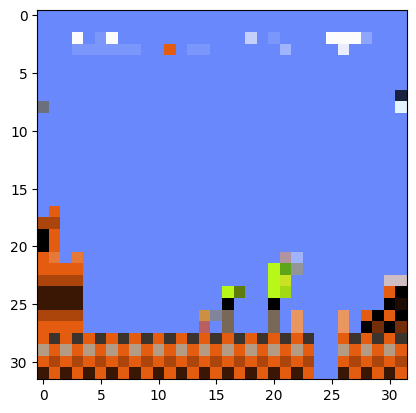

1/1 [==============================] - 0s 26ms/step
Image_1640_lvl_8_Stage_2.png es una fotografía del NIVEL 8


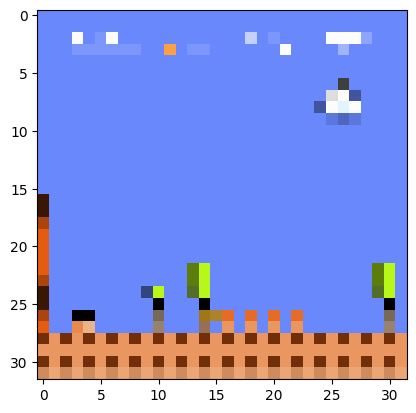

1/1 [==============================] - 0s 37ms/step
Image_260_lvl_8_Stage_1.png es una fotografía del NIVEL 8


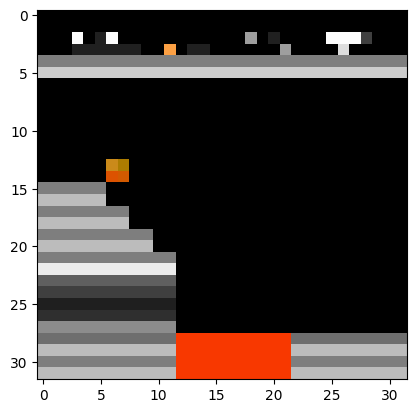

1/1 [==============================] - 0s 31ms/step
Image_840_lvl_8_Stage_4.png es una fotografía del NIVEL 8


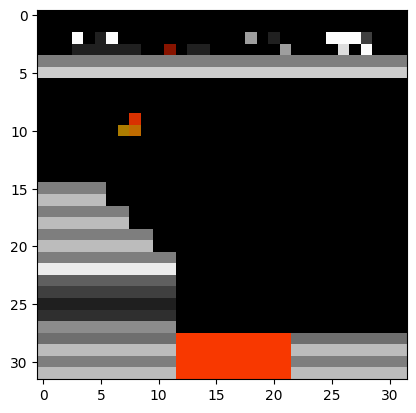

1/1 [==============================] - 0s 25ms/step
Image_1000_lvl_8_Stage_4.png es una fotografía del NIVEL 8


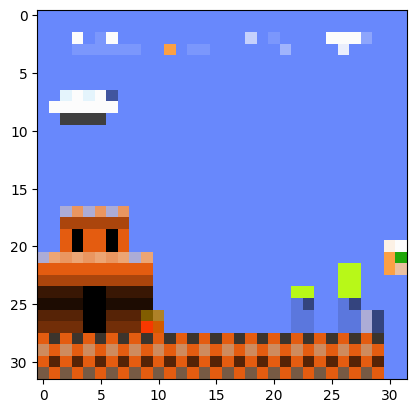

1/1 [==============================] - 0s 25ms/step
Image_1600_lvl_8_Stage_2.png es una fotografía del NIVEL 8


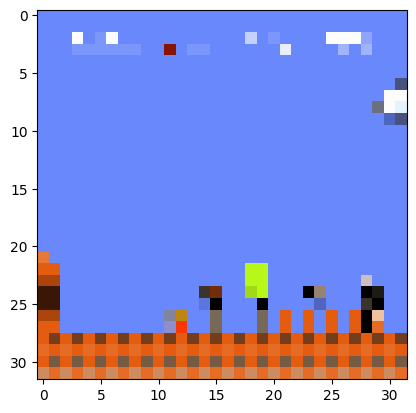

1/1 [==============================] - 0s 37ms/step
Image_660_lvl_8_Stage_3.png es una fotografía del NIVEL 8


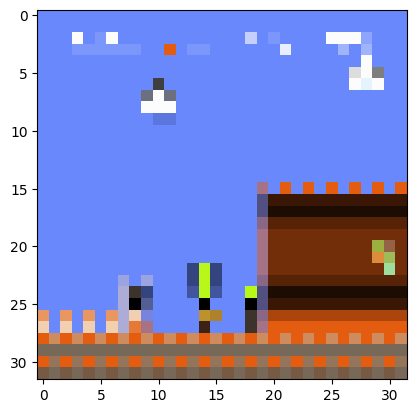

1/1 [==============================] - 0s 24ms/step
Image_380_lvl_8_Stage_3.png es una fotografía del NIVEL 8


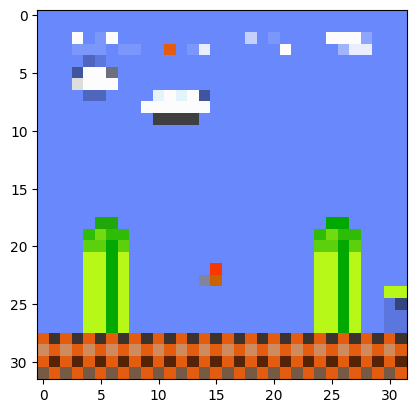

1/1 [==============================] - 0s 27ms/step
Image_1340_lvl_8_Stage_1.png es una fotografía del NIVEL 8


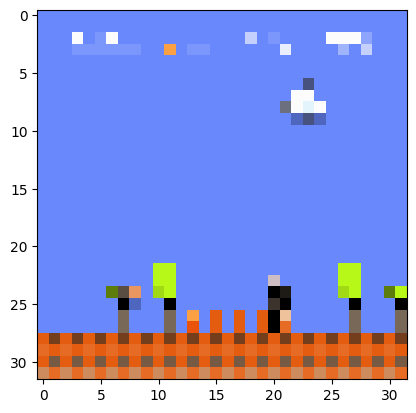

1/1 [==============================] - 0s 28ms/step
Image_820_lvl_8_Stage_3.png es una fotografía del NIVEL 8


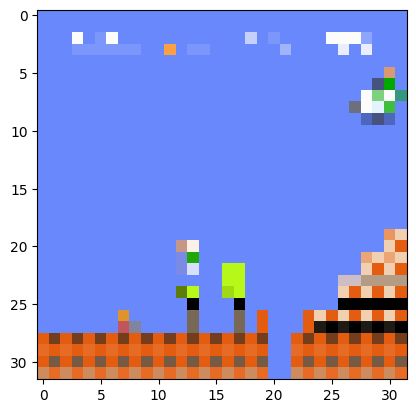

1/1 [==============================] - 0s 24ms/step
Image_1700_lvl_8_Stage_2.png es una fotografía del NIVEL 8


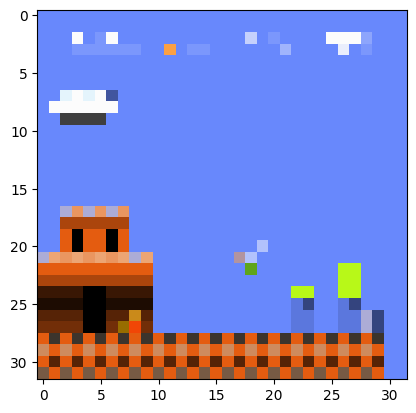

1/1 [==============================] - 0s 22ms/step
Image_920_lvl_8_Stage_2.png es una fotografía del NIVEL 8


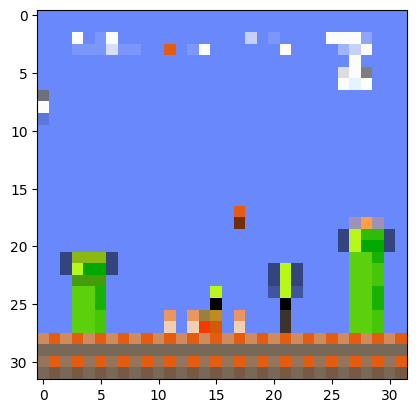

1/1 [==============================] - 0s 33ms/step
Image_1180_lvl_8_Stage_1.png es una fotografía del NIVEL 8


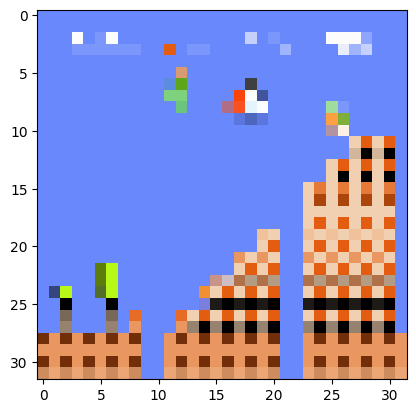

1/1 [==============================] - 0s 30ms/step
Image_520_lvl_8_Stage_2.png es una fotografía del NIVEL 8


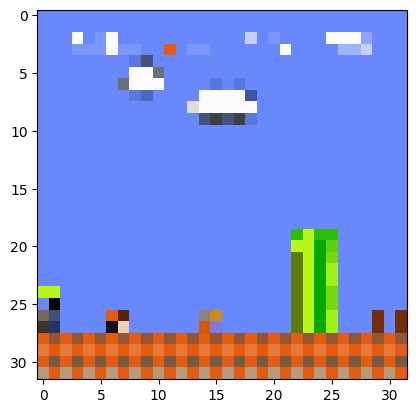

1/1 [==============================] - 0s 26ms/step
Image_520_lvl_8_Stage_1.png es una fotografía del NIVEL 8


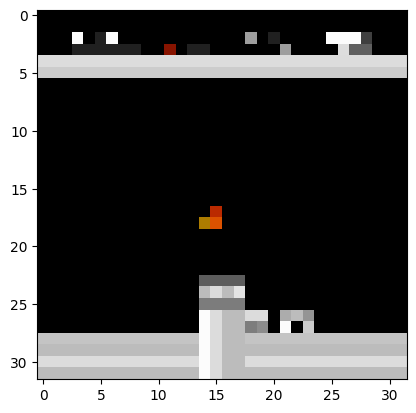

1/1 [==============================] - 0s 27ms/step
Image_1380_lvl_8_Stage_4.png es una fotografía del NIVEL 8


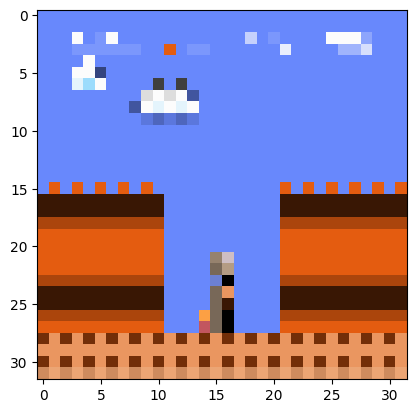

1/1 [==============================] - 0s 27ms/step
Image_1720_lvl_8_Stage_3.png es una fotografía del NIVEL 8


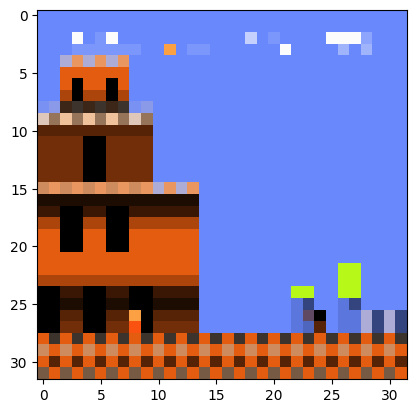

1/1 [==============================] - 0s 26ms/step
Image_160_lvl_8_Stage_1.png es una fotografía del NIVEL 8


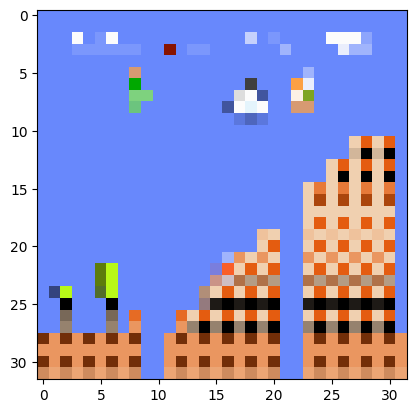

1/1 [==============================] - 0s 26ms/step
Image_560_lvl_8_Stage_2.png es una fotografía del NIVEL 8


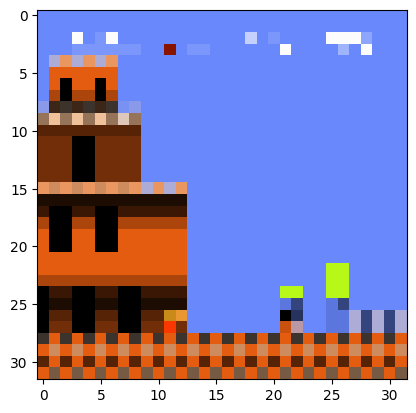

1/1 [==============================] - 0s 28ms/step
Image_180_lvl_8_Stage_1.png es una fotografía del NIVEL 8


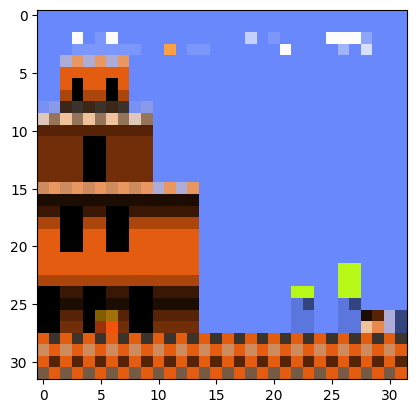

1/1 [==============================] - 0s 33ms/step
Image_100_lvl_8_Stage_1.png es una fotografía del NIVEL 8


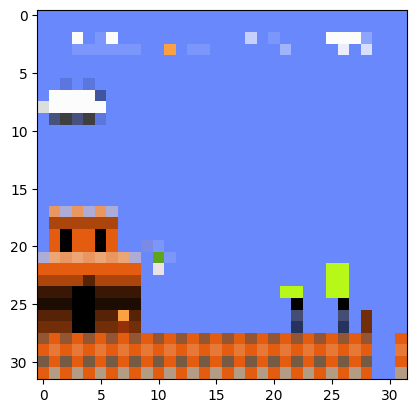

1/1 [==============================] - 0s 26ms/step
Image_300_lvl_8_Stage_2.png es una fotografía del NIVEL 8


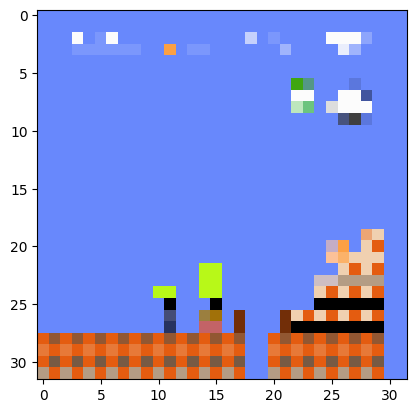

1/1 [==============================] - 0s 24ms/step
Image_1200_lvl_8_Stage_2.png es una fotografía del NIVEL 8


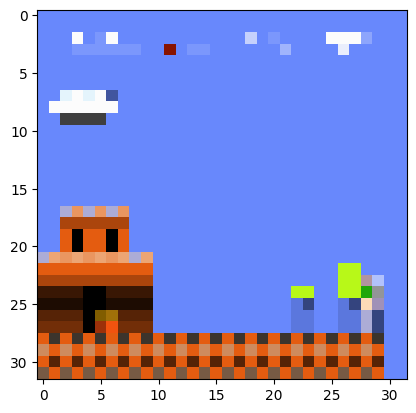

1/1 [==============================] - 0s 25ms/step
Image_80_lvl_8_Stage_2.png es una fotografía del NIVEL 8


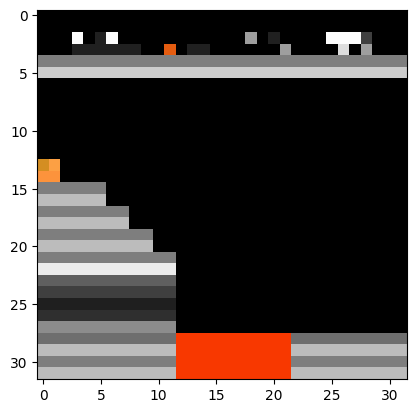

1/1 [==============================] - 0s 25ms/step
Image_1560_lvl_8_Stage_4.png es una fotografía del NIVEL 8


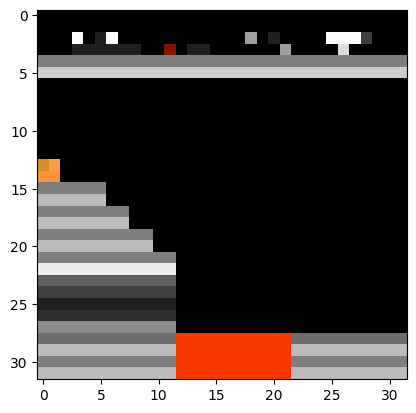

1/1 [==============================] - 0s 29ms/step
Image_1660_lvl_8_Stage_4.png es una fotografía del NIVEL 8


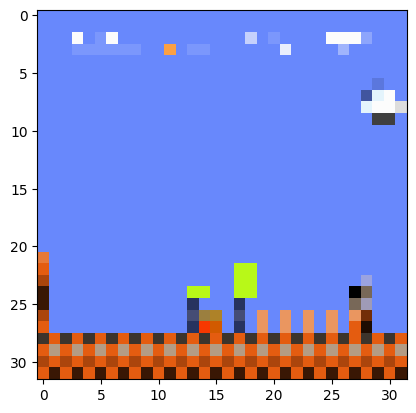

1/1 [==============================] - 0s 24ms/step
Image_940_lvl_8_Stage_3.png es una fotografía del NIVEL 8


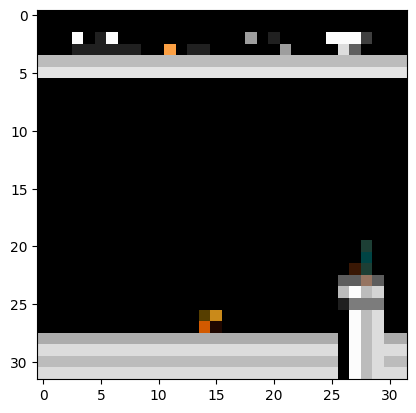

1/1 [==============================] - 0s 27ms/step
Image_1260_lvl_8_Stage_4.png es una fotografía del NIVEL 8


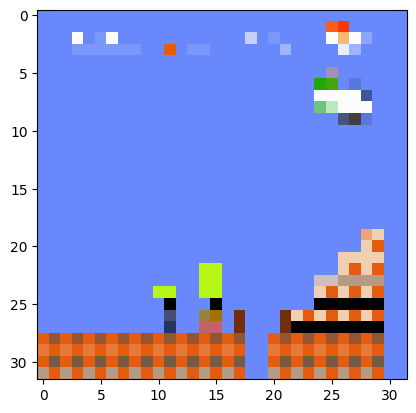

1/1 [==============================] - 0s 25ms/step
Image_1140_lvl_8_Stage_2.png es una fotografía del NIVEL 8


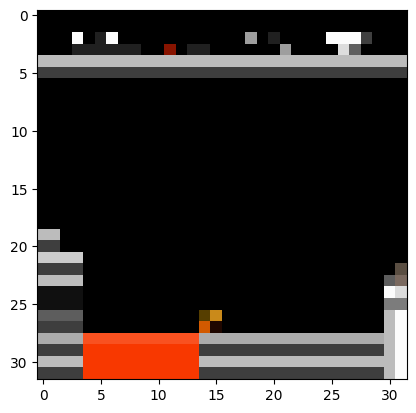

1/1 [==============================] - 0s 24ms/step
Image_420_lvl_8_Stage_4.png es una fotografía del NIVEL 8


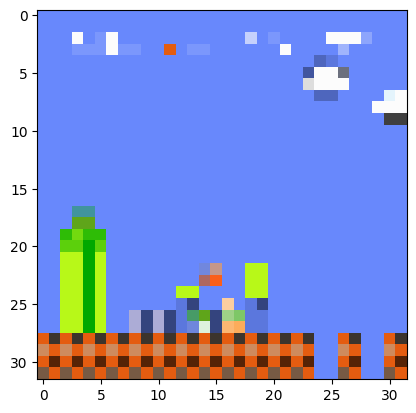

1/1 [==============================] - 0s 27ms/step
Image_620_lvl_8_Stage_1.png es una fotografía del NIVEL 8


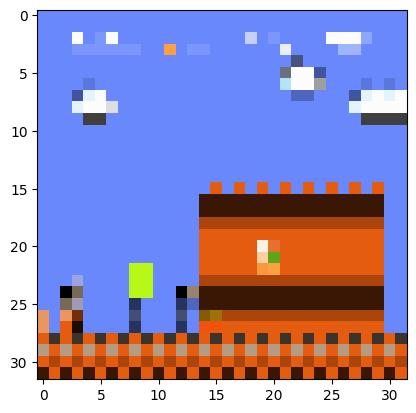

1/1 [==============================] - 0s 33ms/step
Image_440_lvl_8_Stage_3.png es una fotografía del NIVEL 8


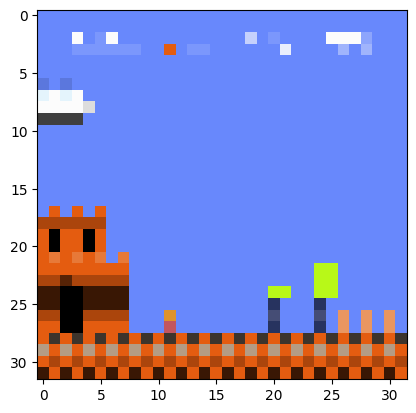

1/1 [==============================] - 0s 27ms/step
Image_560_lvl_8_Stage_3.png es una fotografía del NIVEL 8


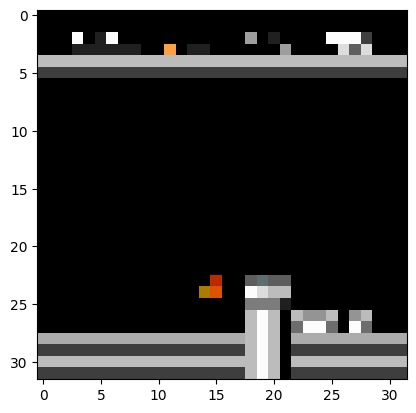

1/1 [==============================] - 0s 25ms/step
Image_1360_lvl_8_Stage_4.png es una fotografía del NIVEL 8


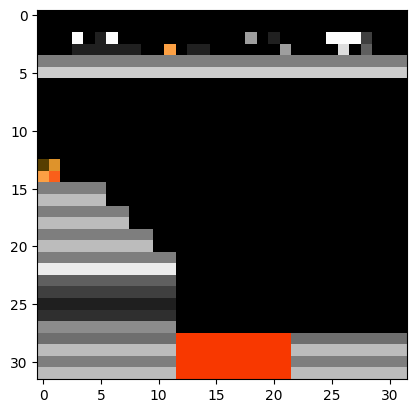

1/1 [==============================] - 0s 27ms/step
Image_260_lvl_8_Stage_4.png es una fotografía del NIVEL 8


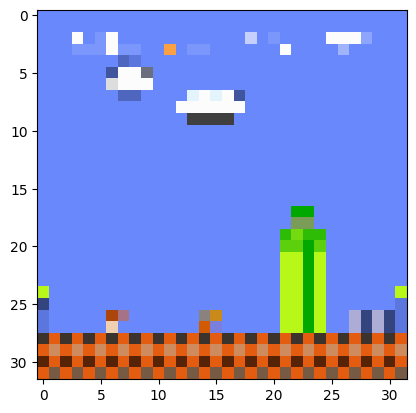

1/1 [==============================] - 0s 29ms/step
Image_1780_lvl_8_Stage_1.png es una fotografía del NIVEL 8


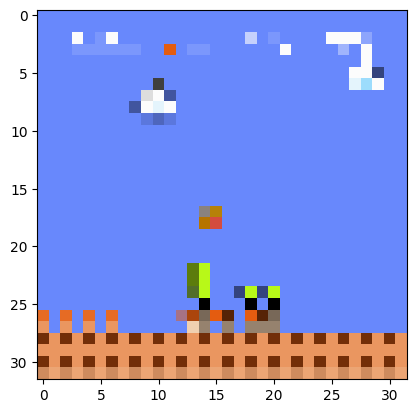

1/1 [==============================] - 0s 27ms/step
Image_1680_lvl_8_Stage_1.png es una fotografía del NIVEL 8


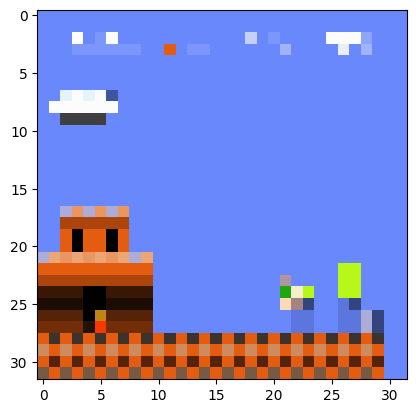

1/1 [==============================] - 0s 25ms/step
Image_880_lvl_8_Stage_2.png es una fotografía del NIVEL 8


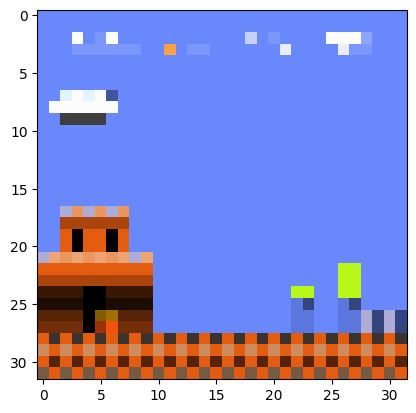

1/1 [==============================] - 0s 29ms/step
Image_0_lvl_8_Stage_3.png es una fotografía del NIVEL 8


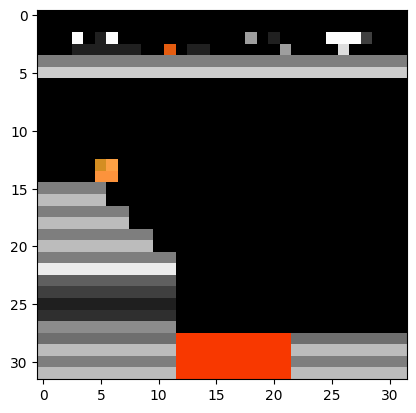

1/1 [==============================] - 0s 28ms/step
Image_40_lvl_8_Stage_4.png es una fotografía del NIVEL 8


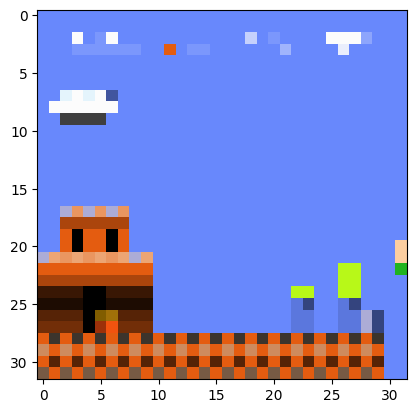

1/1 [==============================] - 0s 40ms/step
Image_40_lvl_8_Stage_2.png es una fotografía del NIVEL 8


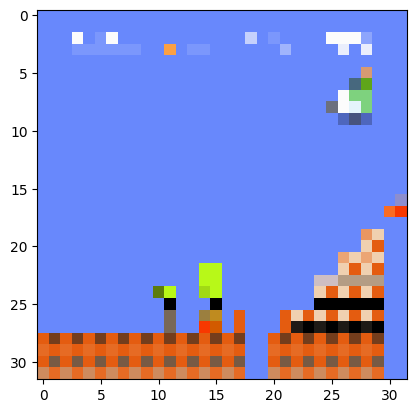

1/1 [==============================] - 0s 34ms/step
Image_1060_lvl_8_Stage_2.png es una fotografía del NIVEL 8


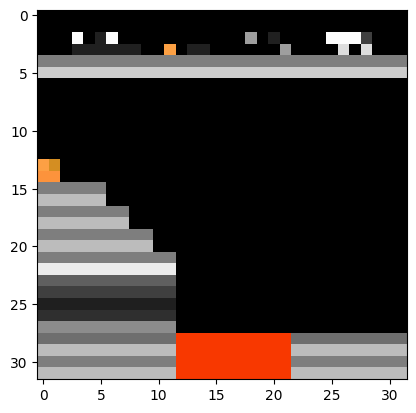

1/1 [==============================] - 0s 38ms/step
Image_340_lvl_8_Stage_4.png es una fotografía del NIVEL 8


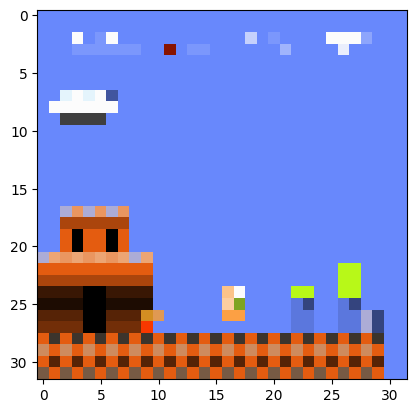

1/1 [==============================] - 0s 26ms/step
Image_940_lvl_8_Stage_2.png es una fotografía del NIVEL 8


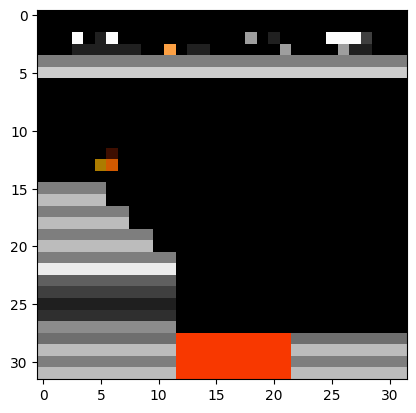

1/1 [==============================] - 0s 26ms/step
Image_820_lvl_8_Stage_4.png es una fotografía del NIVEL 8


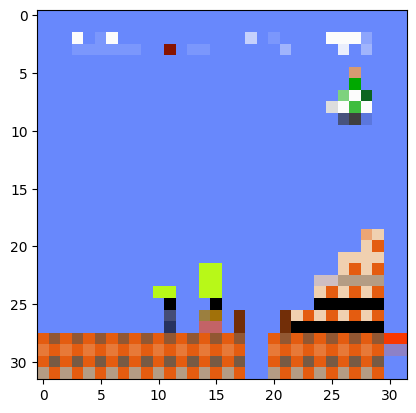

1/1 [==============================] - 0s 55ms/step
Image_1080_lvl_8_Stage_2.png es una fotografía del NIVEL 8


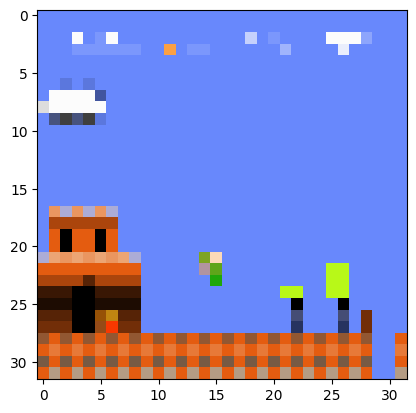

1/1 [==============================] - 0s 26ms/step
Image_240_lvl_8_Stage_2.png es una fotografía del NIVEL 8


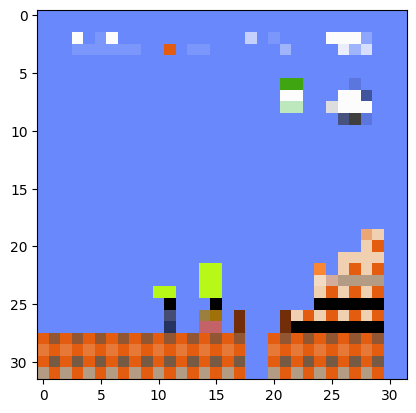

1/1 [==============================] - 0s 26ms/step
Image_1220_lvl_8_Stage_2.png es una fotografía del NIVEL 8


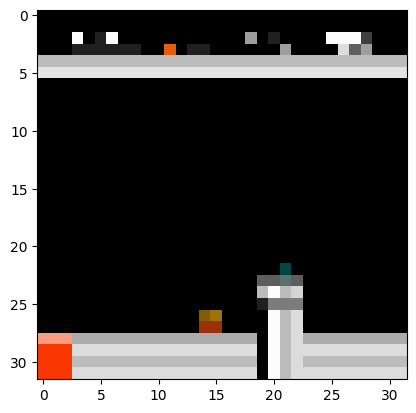

1/1 [==============================] - 0s 42ms/step
Image_520_lvl_8_Stage_4.png es una fotografía del NIVEL 8


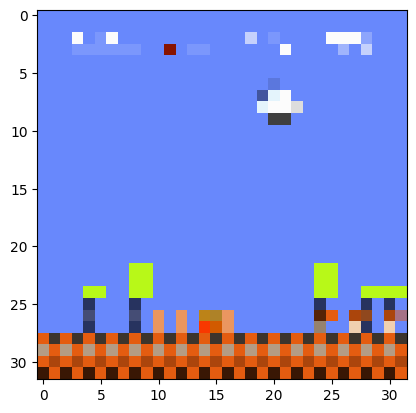

1/1 [==============================] - 0s 56ms/step
Image_320_lvl_8_Stage_1.png es una fotografía del NIVEL 8


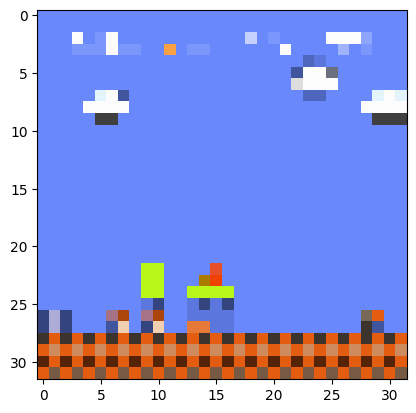

1/1 [==============================] - 0s 25ms/step
Image_1700_lvl_8_Stage_1.png es una fotografía del NIVEL 8


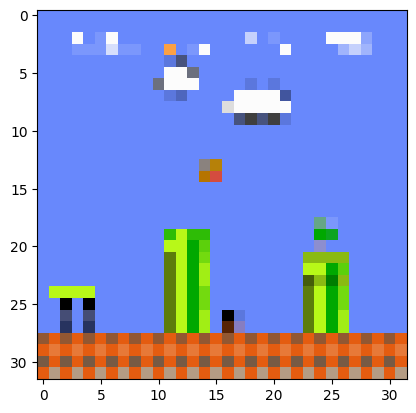

1/1 [==============================] - 0s 24ms/step
Image_1060_lvl_8_Stage_1.png es una fotografía del NIVEL 8


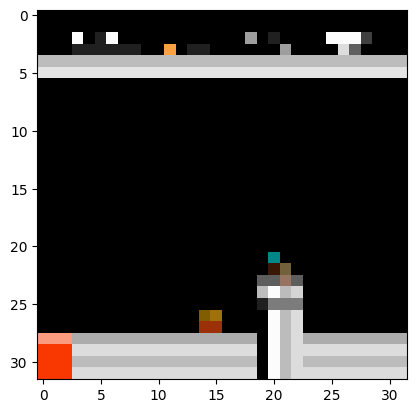

1/1 [==============================] - 0s 29ms/step
Image_480_lvl_8_Stage_4.png es una fotografía del NIVEL 8


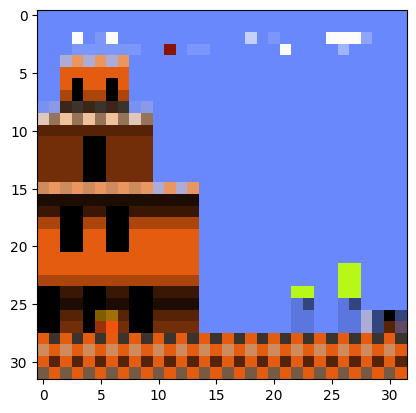

1/1 [==============================] - 0s 29ms/step
Image_80_lvl_8_Stage_1.png es una fotografía del NIVEL 8


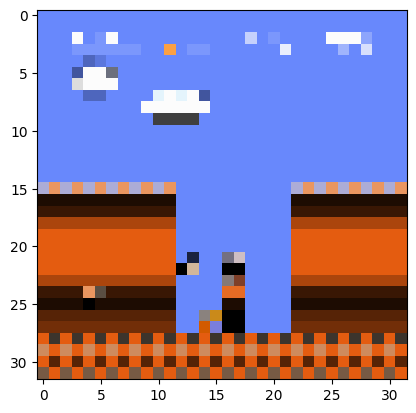

1/1 [==============================] - 0s 24ms/step
Image_1520_lvl_8_Stage_3.png es una fotografía del NIVEL 8


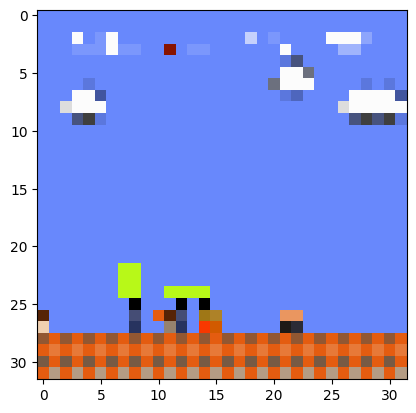

1/1 [==============================] - 0s 25ms/step
Image_420_lvl_8_Stage_1.png es una fotografía del NIVEL 8


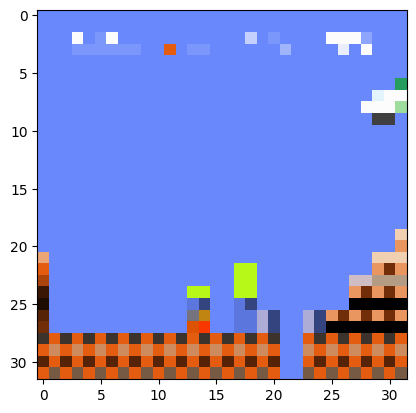

1/1 [==============================] - 0s 36ms/step
Image_380_lvl_8_Stage_2.png es una fotografía del NIVEL 8


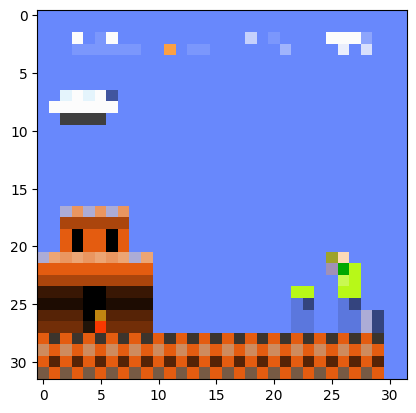

1/1 [==============================] - 0s 34ms/step
Image_820_lvl_8_Stage_2.png es una fotografía del NIVEL 8


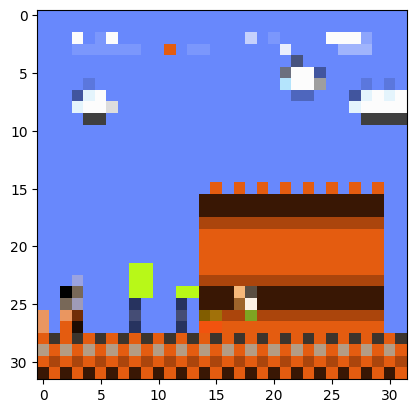

1/1 [==============================] - 0s 26ms/step
Image_460_lvl_8_Stage_3.png es una fotografía del NIVEL 8


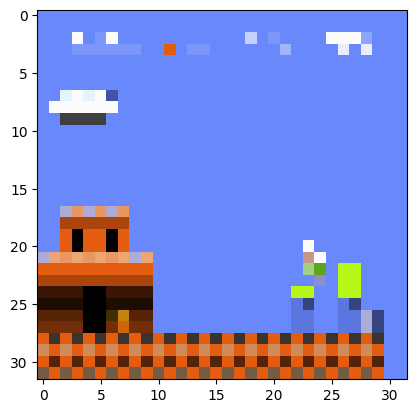

1/1 [==============================] - 0s 27ms/step
Image_140_lvl_8_Stage_2.png es una fotografía del NIVEL 8


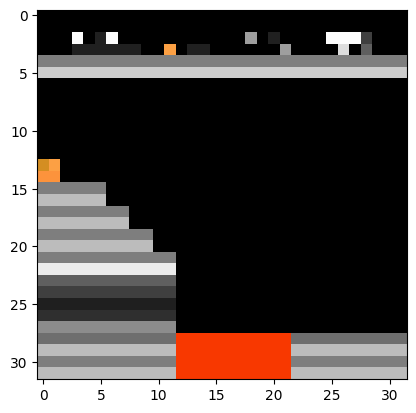

1/1 [==============================] - 0s 22ms/step
Image_1600_lvl_8_Stage_4.png es una fotografía del NIVEL 8


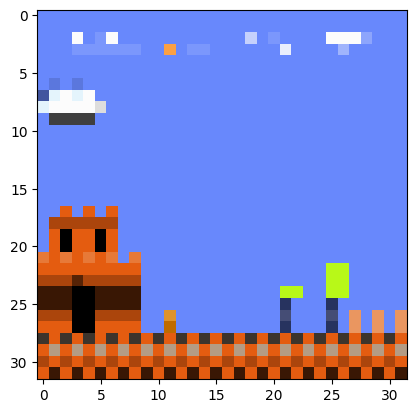

1/1 [==============================] - 0s 29ms/step
Image_540_lvl_8_Stage_3.png es una fotografía del NIVEL 8


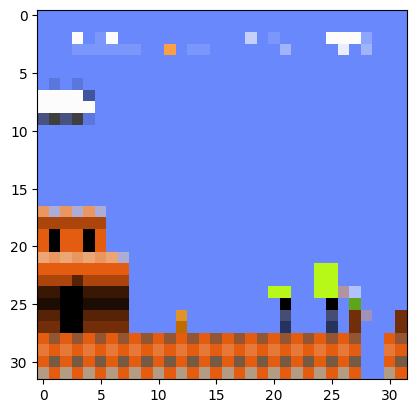

1/1 [==============================] - 0s 25ms/step
Image_1620_lvl_8_Stage_2.png es una fotografía del NIVEL 8


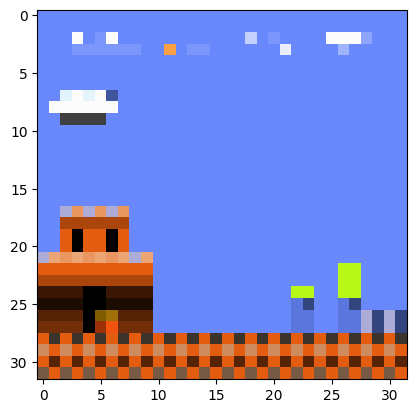

1/1 [==============================] - 0s 34ms/step
Image_20_lvl_8_Stage_3.png es una fotografía del NIVEL 8


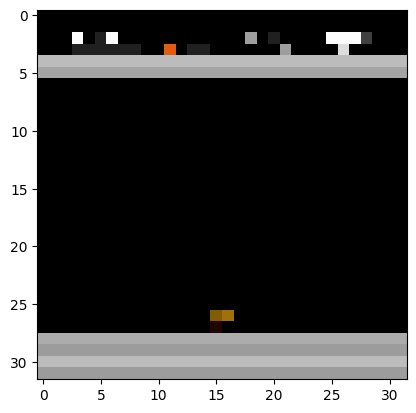

1/1 [==============================] - 0s 27ms/step
Image_700_lvl_8_Stage_4.png es una fotografía del NIVEL 8


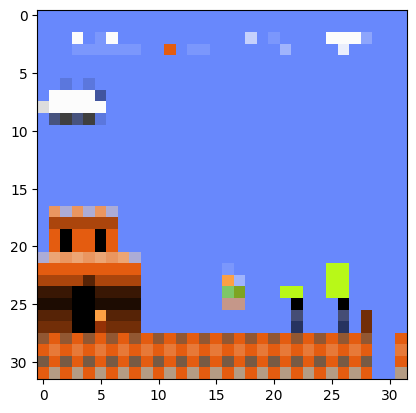

1/1 [==============================] - 0s 39ms/step
Image_220_lvl_8_Stage_2.png es una fotografía del NIVEL 8


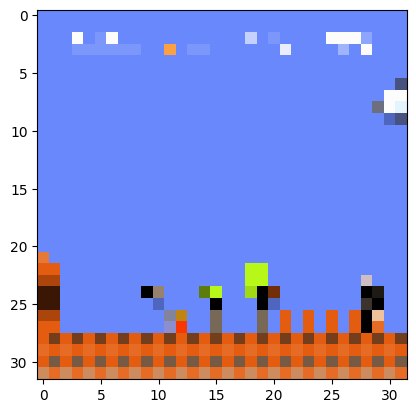

1/1 [==============================] - 0s 29ms/step
Image_680_lvl_8_Stage_3.png es una fotografía del NIVEL 8


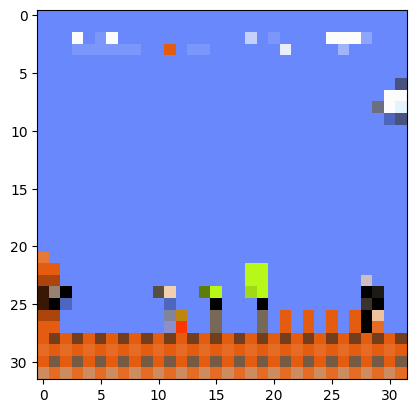

1/1 [==============================] - 0s 27ms/step
Image_720_lvl_8_Stage_3.png es una fotografía del NIVEL 8


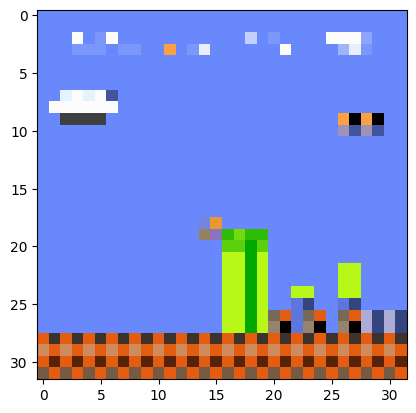

1/1 [==============================] - 0s 29ms/step
Image_1400_lvl_8_Stage_1.png es una fotografía del NIVEL 8


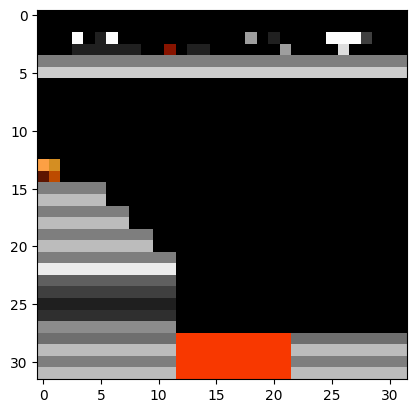

1/1 [==============================] - 0s 34ms/step
Image_1520_lvl_8_Stage_4.png es una fotografía del NIVEL 8


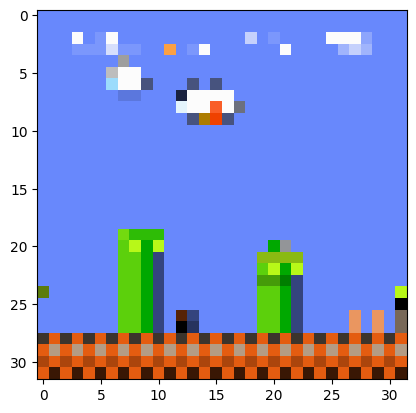

1/1 [==============================] - 0s 30ms/step
Image_1080_lvl_8_Stage_1.png es una fotografía del NIVEL 8


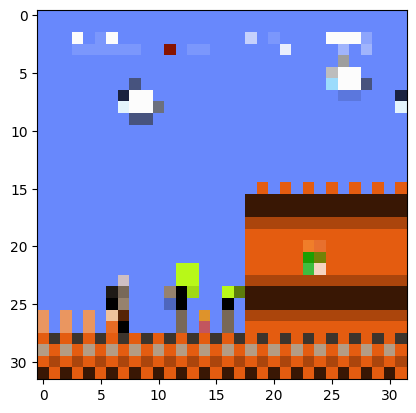

1/1 [==============================] - 0s 26ms/step
Image_1120_lvl_8_Stage_3.png es una fotografía del NIVEL 8


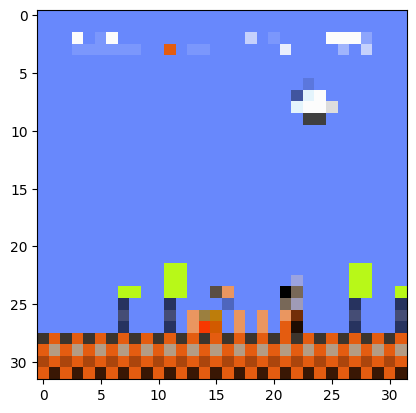

1/1 [==============================] - 0s 26ms/step
Image_980_lvl_8_Stage_3.png es una fotografía del NIVEL 8


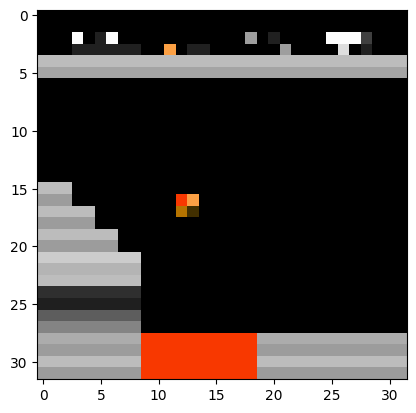

1/1 [==============================] - 0s 26ms/step
Image_400_lvl_8_Stage_4.png es una fotografía del NIVEL 8


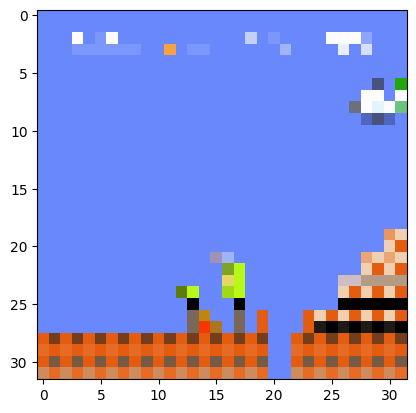

1/1 [==============================] - 0s 29ms/step
Image_1660_lvl_8_Stage_2.png es una fotografía del NIVEL 8


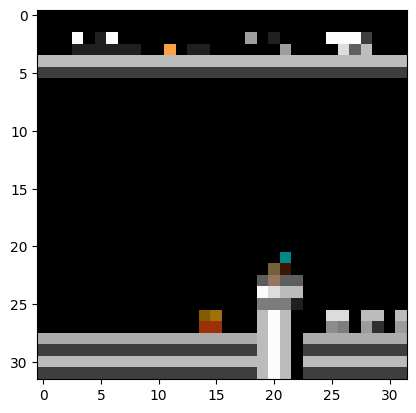

1/1 [==============================] - 0s 30ms/step
Image_1320_lvl_8_Stage_4.png es una fotografía del NIVEL 8


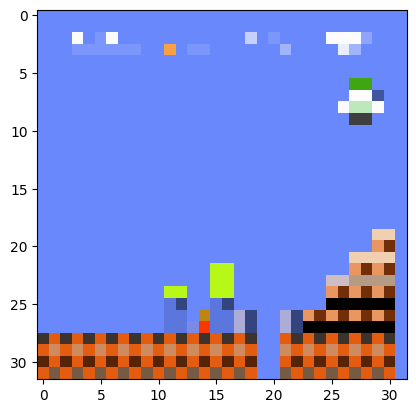

1/1 [==============================] - 0s 28ms/step
Image_440_lvl_8_Stage_2.png es una fotografía del NIVEL 8


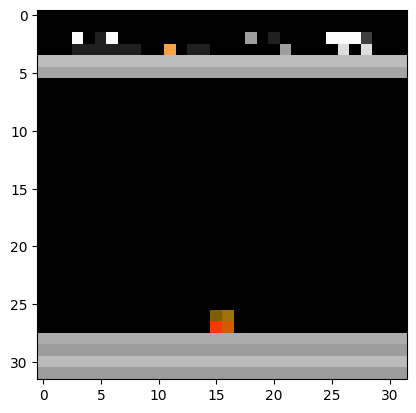

1/1 [==============================] - 0s 26ms/step
Image_740_lvl_8_Stage_4.png es una fotografía del NIVEL 8


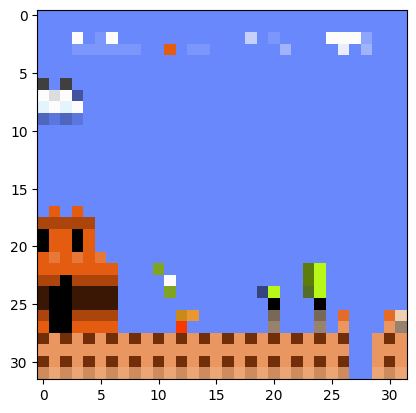

1/1 [==============================] - 0s 28ms/step
Image_980_lvl_8_Stage_2.png es una fotografía del NIVEL 8


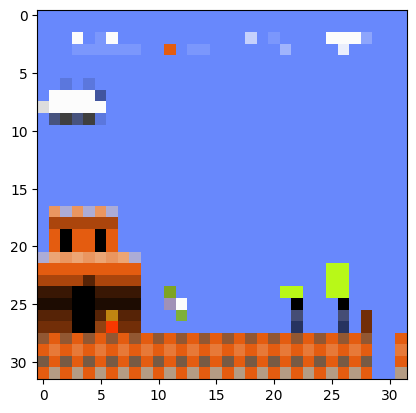

1/1 [==============================] - 0s 27ms/step
Image_280_lvl_8_Stage_2.png es una fotografía del NIVEL 8


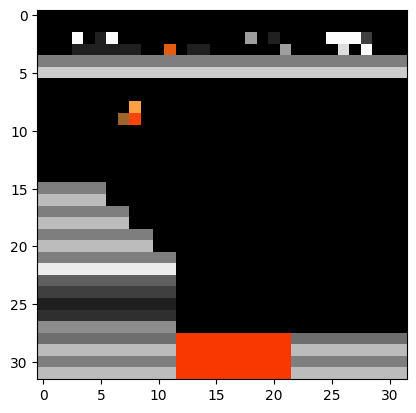

1/1 [==============================] - 0s 26ms/step
Image_380_lvl_8_Stage_4.png es una fotografía del NIVEL 8


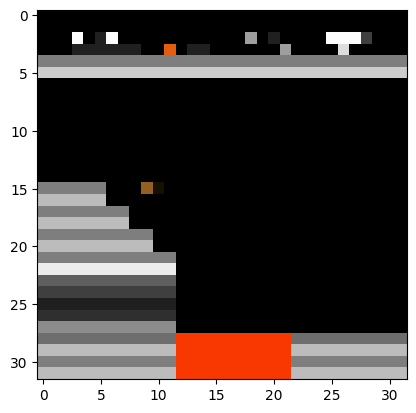

1/1 [==============================] - 0s 22ms/step
Image_1720_lvl_8_Stage_4.png es una fotografía del NIVEL 8


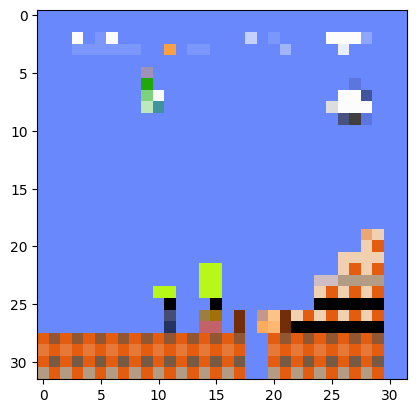

1/1 [==============================] - 0s 25ms/step
Image_1340_lvl_8_Stage_2.png es una fotografía del NIVEL 8


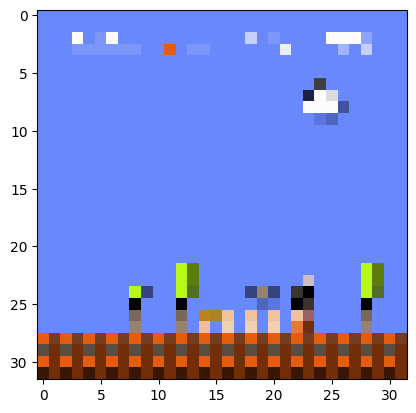

1/1 [==============================] - 0s 29ms/step
Image_1340_lvl_8_Stage_3.png es una fotografía del NIVEL 8


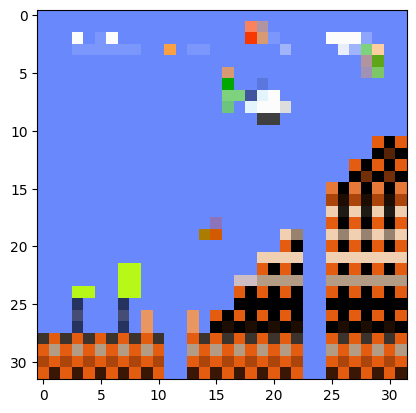

1/1 [==============================] - 0s 33ms/step
Image_500_lvl_8_Stage_2.png es una fotografía del NIVEL 8


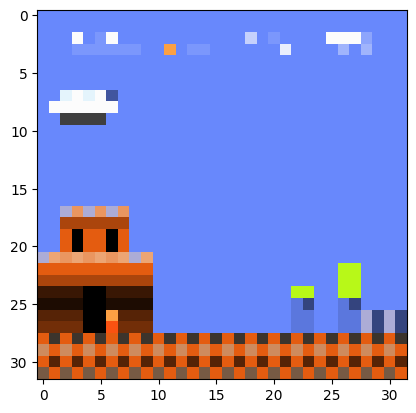

1/1 [==============================] - 0s 30ms/step
Image_160_lvl_8_Stage_3.png es una fotografía del NIVEL 8


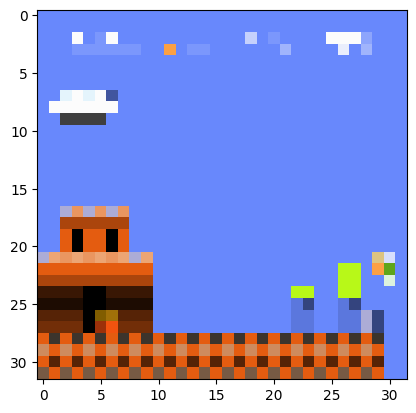

1/1 [==============================] - 0s 36ms/step
Image_60_lvl_8_Stage_2.png es una fotografía del NIVEL 8


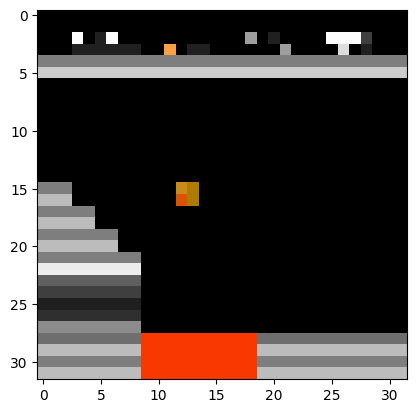

1/1 [==============================] - 0s 40ms/step
Image_1020_lvl_8_Stage_4.png es una fotografía del NIVEL 8


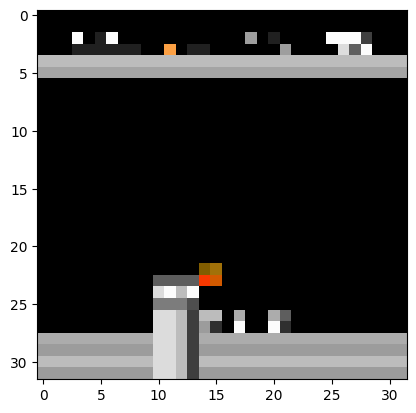

1/1 [==============================] - 0s 28ms/step
Image_1400_lvl_8_Stage_4.png es una fotografía del NIVEL 8


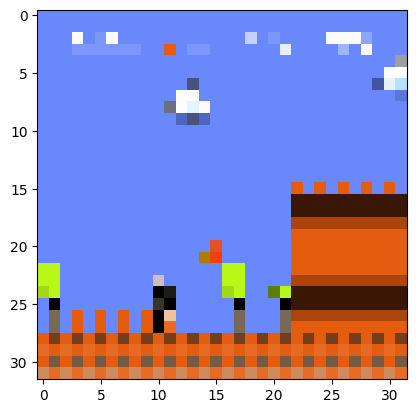

1/1 [==============================] - 0s 37ms/step
Image_1400_lvl_8_Stage_3.png es una fotografía del NIVEL 8


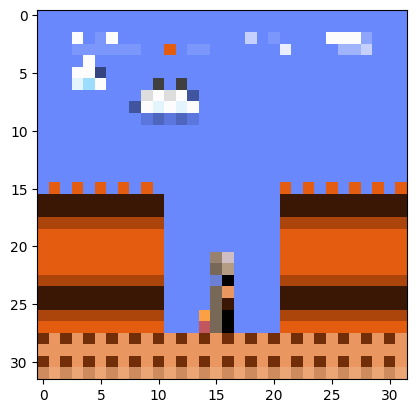

1/1 [==============================] - 0s 36ms/step
Image_1740_lvl_8_Stage_3.png es una fotografía del NIVEL 8


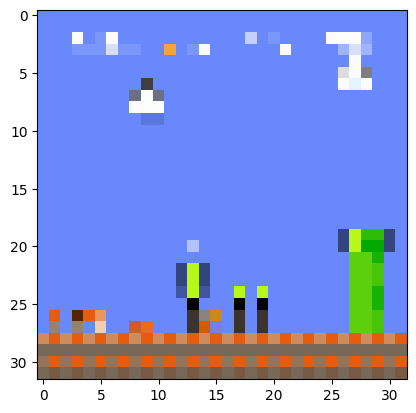

1/1 [==============================] - 0s 28ms/step
Image_980_lvl_8_Stage_1.png es una fotografía del NIVEL 8


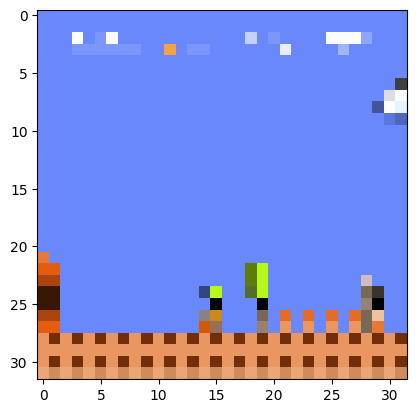

1/1 [==============================] - 0s 32ms/step
Image_240_lvl_8_Stage_3.png es una fotografía del NIVEL 8


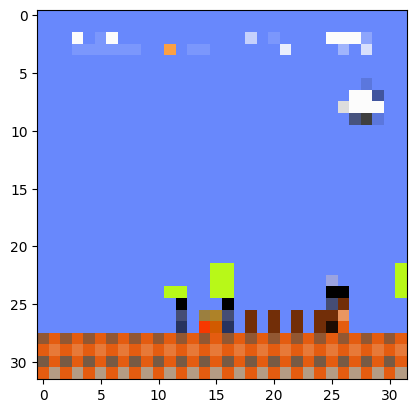

1/1 [==============================] - 0s 53ms/step
Image_1320_lvl_8_Stage_3.png es una fotografía del NIVEL 8


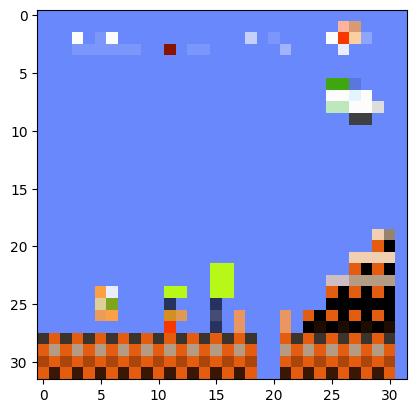

1/1 [==============================] - 0s 50ms/step
Image_1780_lvl_8_Stage_2.png es una fotografía del NIVEL 8


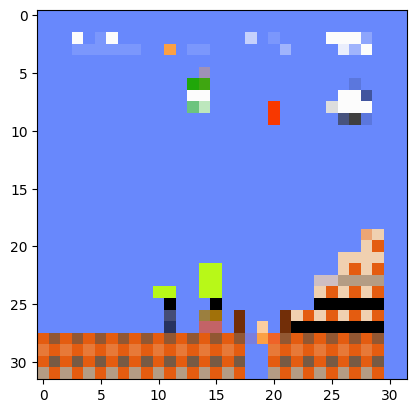

1/1 [==============================] - 0s 25ms/step
Image_1300_lvl_8_Stage_2.png es una fotografía del NIVEL 8


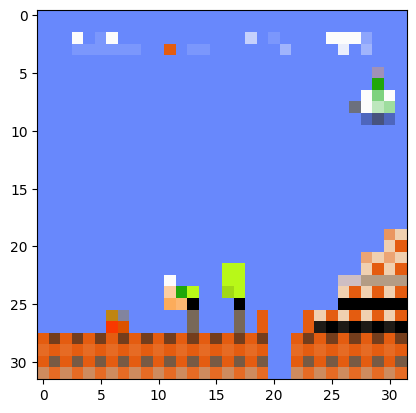

1/1 [==============================] - 0s 25ms/step
Image_1720_lvl_8_Stage_2.png es una fotografía del NIVEL 8


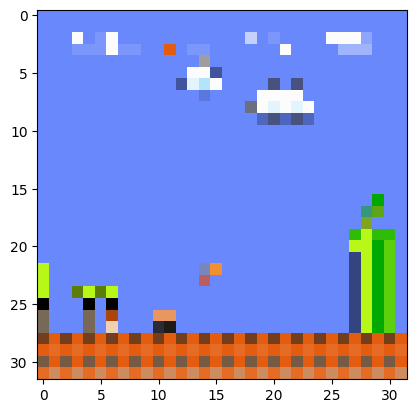

1/1 [==============================] - 0s 27ms/step
Image_460_lvl_8_Stage_1.png es una fotografía del NIVEL 8


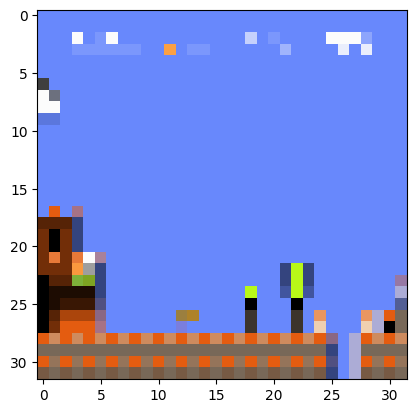

1/1 [==============================] - 0s 26ms/step
Image_340_lvl_8_Stage_2.png es una fotografía del NIVEL 8


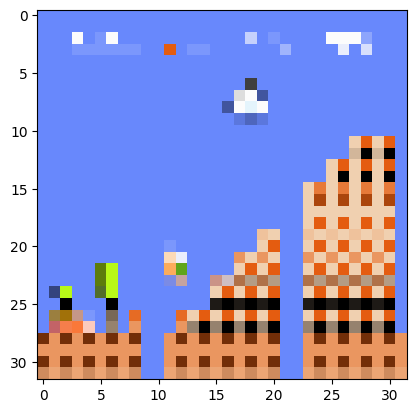

1/1 [==============================] - 0s 30ms/step
Image_700_lvl_8_Stage_2.png es una fotografía del NIVEL 8


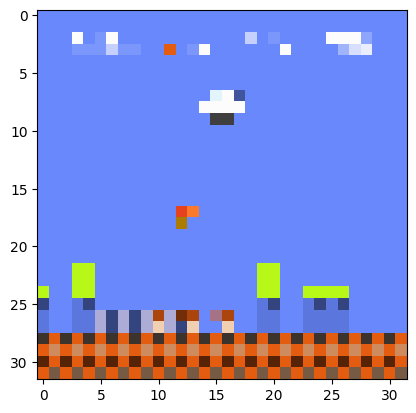

1/1 [==============================] - 0s 26ms/step
Image_940_lvl_8_Stage_1.png es una fotografía del NIVEL 8


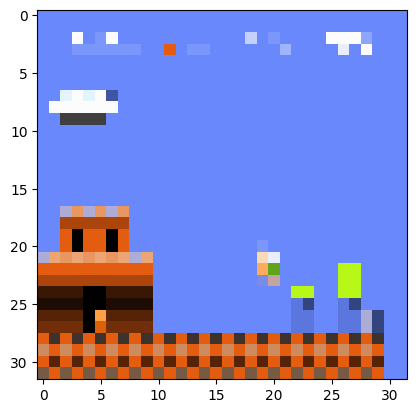

1/1 [==============================] - 0s 25ms/step
Image_900_lvl_8_Stage_2.png es una fotografía del NIVEL 8


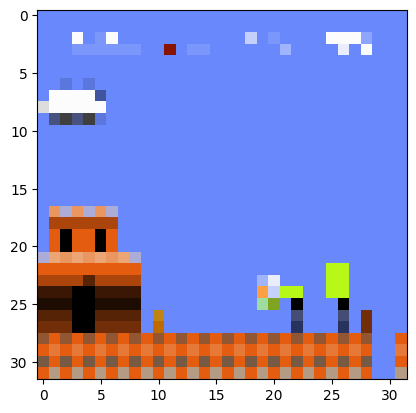

1/1 [==============================] - 0s 25ms/step
Image_180_lvl_8_Stage_2.png es una fotografía del NIVEL 8


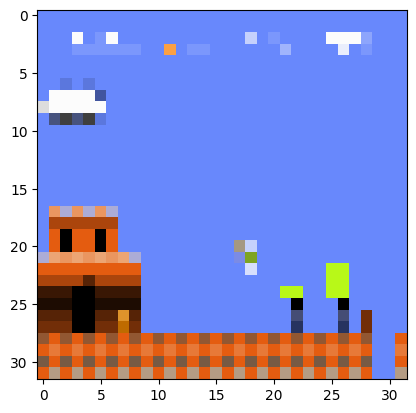

1/1 [==============================] - 0s 22ms/step
Image_200_lvl_8_Stage_2.png es una fotografía del NIVEL 8


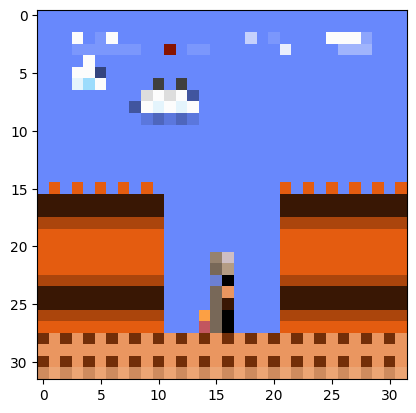

1/1 [==============================] - 0s 24ms/step
Image_1680_lvl_8_Stage_3.png es una fotografía del NIVEL 8


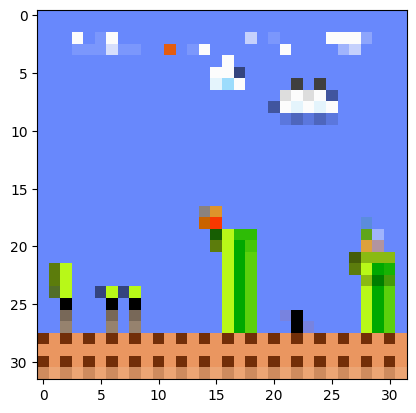

1/1 [==============================] - 0s 26ms/step
Image_1040_lvl_8_Stage_1.png es una fotografía del NIVEL 8


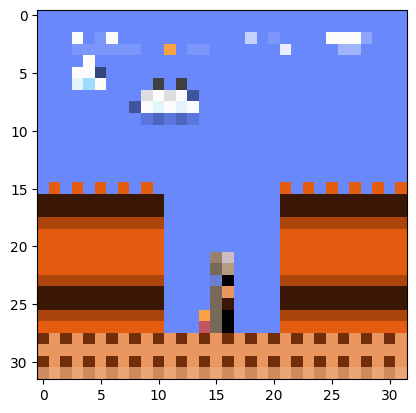

1/1 [==============================] - 0s 31ms/step
Image_1700_lvl_8_Stage_3.png es una fotografía del NIVEL 8


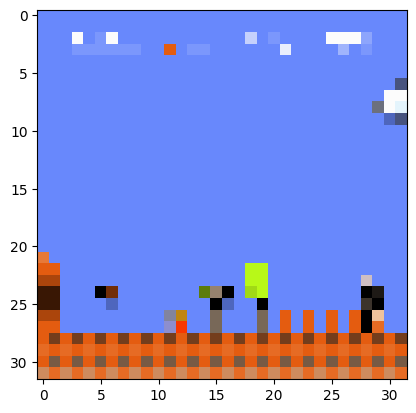

1/1 [==============================] - 0s 28ms/step
Image_700_lvl_8_Stage_3.png es una fotografía del NIVEL 8


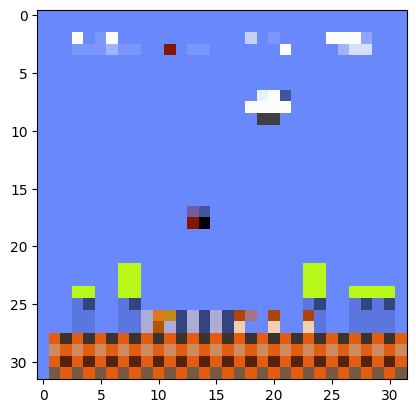

1/1 [==============================] - 0s 28ms/step
Image_900_lvl_8_Stage_1.png es una fotografía del NIVEL 8


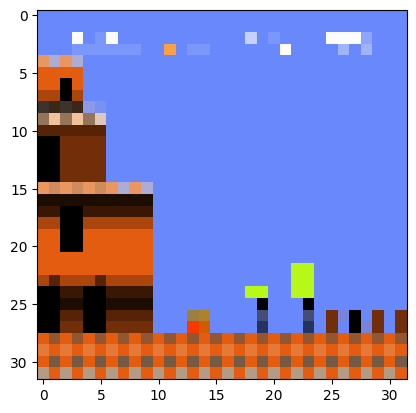

1/1 [==============================] - 0s 29ms/step
Image_1560_lvl_8_Stage_1.png es una fotografía del NIVEL 8


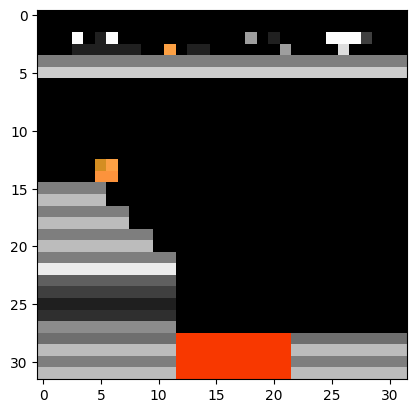

1/1 [==============================] - 0s 31ms/step
Image_20_lvl_8_Stage_4.png es una fotografía del NIVEL 8


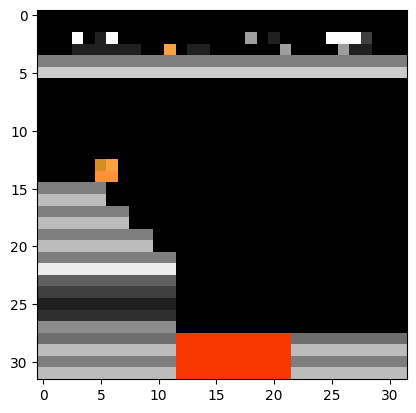

1/1 [==============================] - 0s 25ms/step
Image_1760_lvl_8_Stage_4.png es una fotografía del NIVEL 8


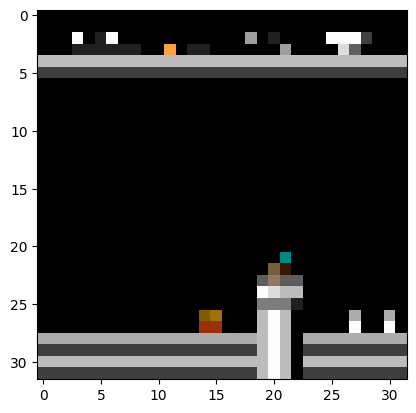

1/1 [==============================] - 0s 24ms/step
Image_1300_lvl_8_Stage_4.png es una fotografía del NIVEL 8


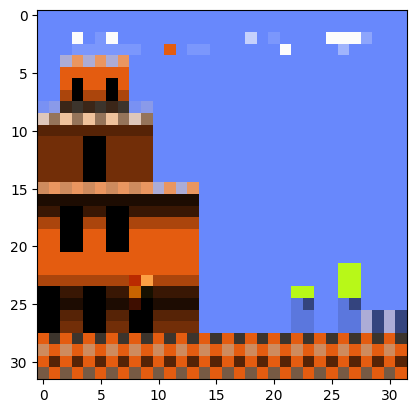

1/1 [==============================] - 0s 26ms/step
Image_1520_lvl_8_Stage_1.png es una fotografía del NIVEL 8


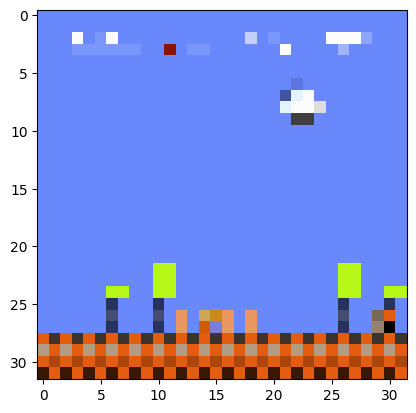

1/1 [==============================] - 0s 33ms/step
Image_280_lvl_8_Stage_1.png es una fotografía del NIVEL 8


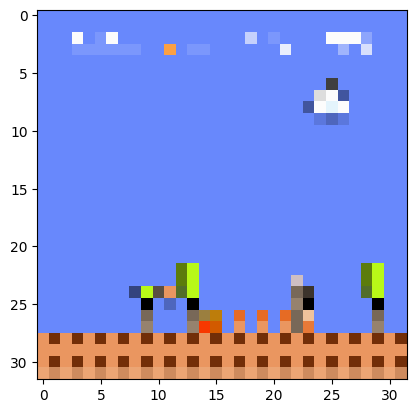

1/1 [==============================] - 0s 20ms/step
Image_300_lvl_8_Stage_3.png es una fotografía del NIVEL 8


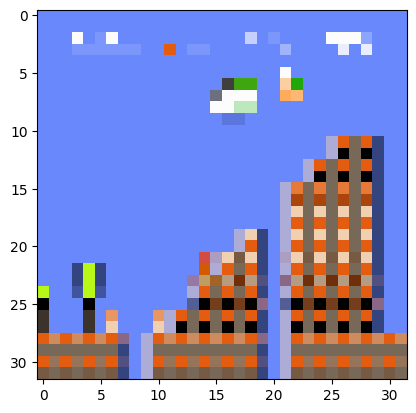

1/1 [==============================] - 0s 24ms/step
Image_1460_lvl_8_Stage_2.png es una fotografía del NIVEL 8


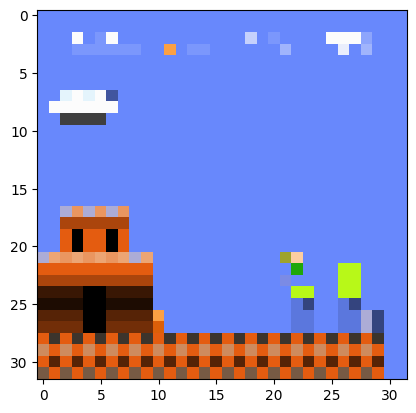

1/1 [==============================] - 0s 27ms/step
Image_160_lvl_8_Stage_2.png es una fotografía del NIVEL 8


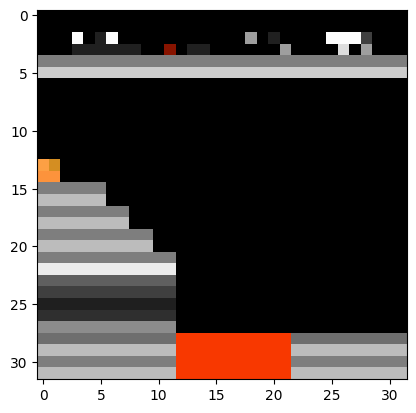

1/1 [==============================] - 0s 20ms/step
Image_320_lvl_8_Stage_4.png es una fotografía del NIVEL 8


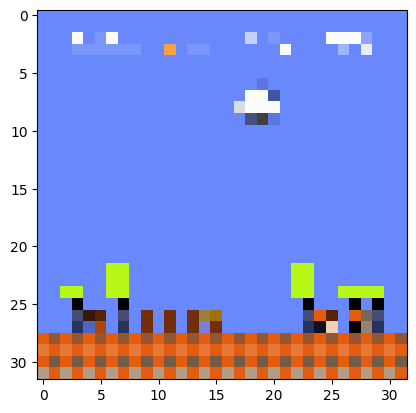

1/1 [==============================] - 0s 29ms/step
Image_1640_lvl_8_Stage_1.png es una fotografía del NIVEL 8


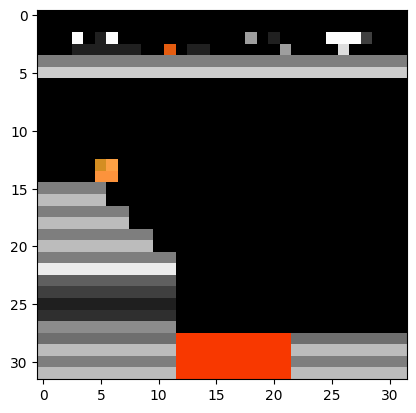

1/1 [==============================] - 0s 29ms/step
Image_1460_lvl_8_Stage_4.png es una fotografía del NIVEL 8


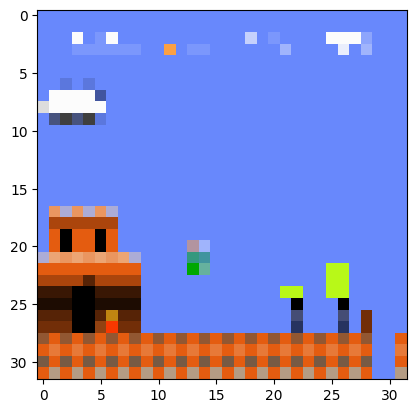

1/1 [==============================] - 0s 21ms/step
Image_260_lvl_8_Stage_2.png es una fotografía del NIVEL 8


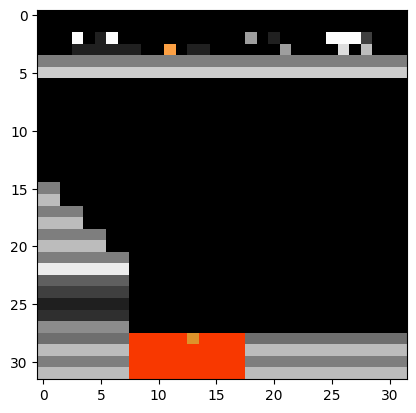

1/1 [==============================] - 0s 27ms/step
Image_1740_lvl_8_Stage_4.png es una fotografía del NIVEL 8


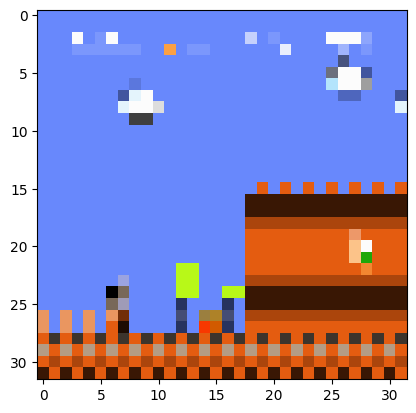

1/1 [==============================] - 0s 27ms/step
Image_1420_lvl_8_Stage_3.png es una fotografía del NIVEL 8


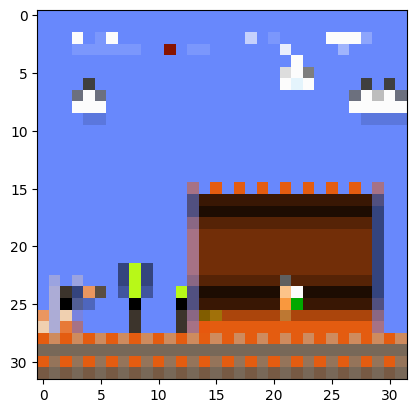

1/1 [==============================] - 0s 24ms/step
Image_1440_lvl_8_Stage_3.png es una fotografía del NIVEL 8


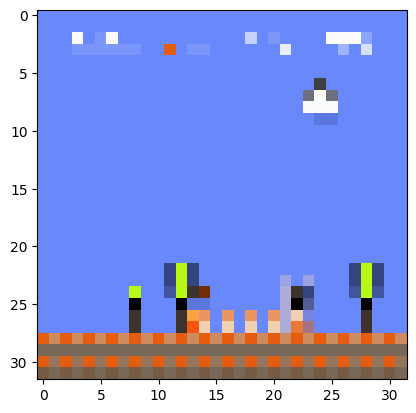

1/1 [==============================] - 0s 27ms/step
Image_800_lvl_8_Stage_3.png es una fotografía del NIVEL 8


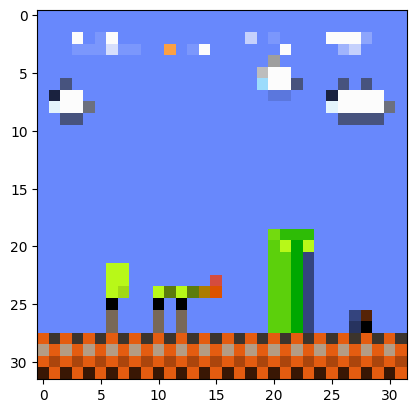

1/1 [==============================] - 0s 28ms/step
Image_1020_lvl_8_Stage_1.png es una fotografía del NIVEL 8


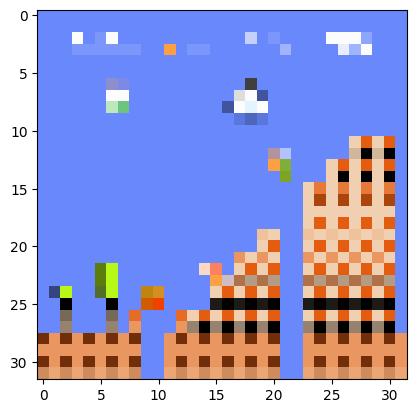

1/1 [==============================] - 0s 34ms/step
Image_580_lvl_8_Stage_2.png es una fotografía del NIVEL 8


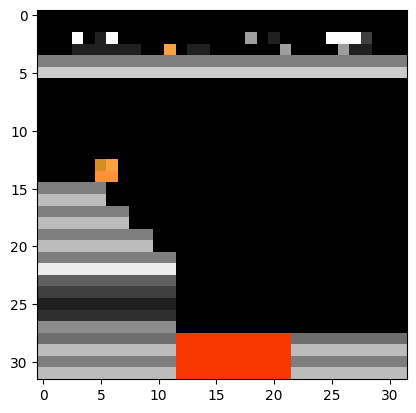

1/1 [==============================] - 0s 37ms/step
Image_1440_lvl_8_Stage_4.png es una fotografía del NIVEL 8


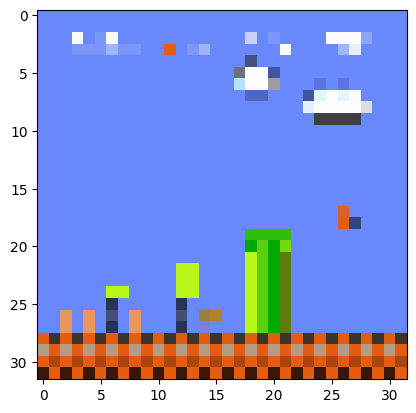

1/1 [==============================] - 0s 26ms/step
Image_1240_lvl_8_Stage_1.png es una fotografía del NIVEL 8


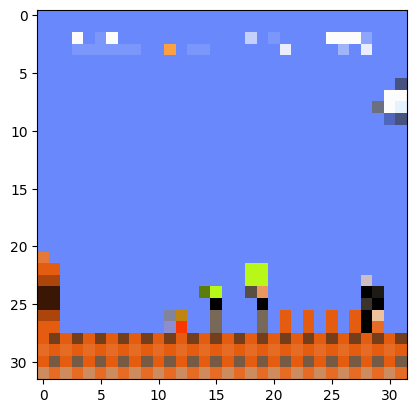

1/1 [==============================] - 0s 26ms/step
Image_640_lvl_8_Stage_3.png es una fotografía del NIVEL 8


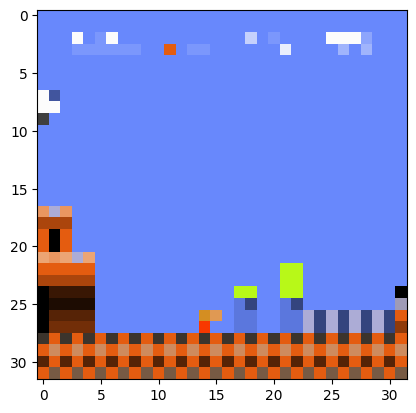

1/1 [==============================] - 0s 30ms/step
Image_920_lvl_8_Stage_3.png es una fotografía del NIVEL 8


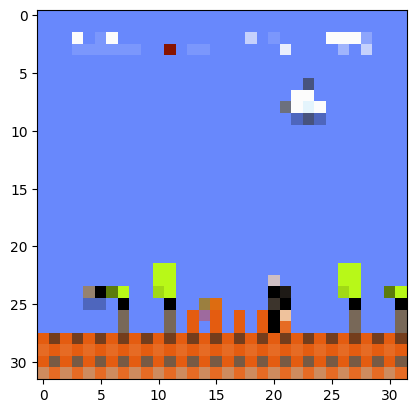

1/1 [==============================] - 0s 33ms/step
Image_320_lvl_8_Stage_3.png es una fotografía del NIVEL 8


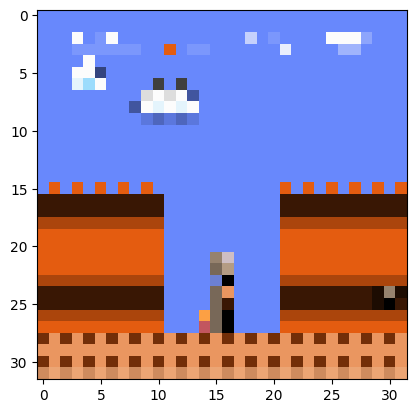

1/1 [==============================] - 0s 31ms/step
Image_1640_lvl_8_Stage_3.png es una fotografía del NIVEL 8


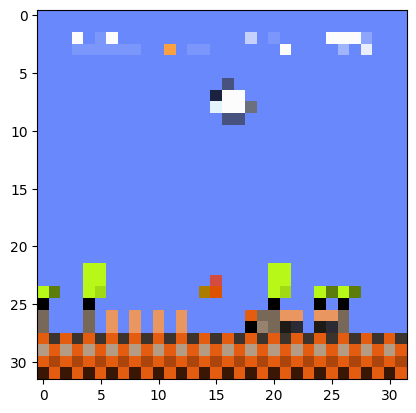

1/1 [==============================] - 0s 31ms/step
Image_340_lvl_8_Stage_1.png es una fotografía del NIVEL 8


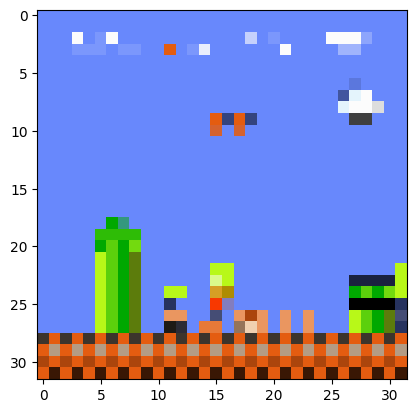

1/1 [==============================] - 0s 32ms/step
Image_1480_lvl_8_Stage_1.png es una fotografía del NIVEL 8


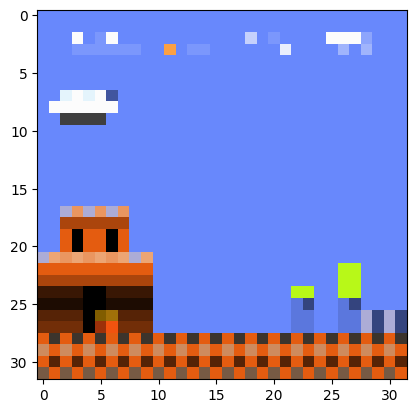

1/1 [==============================] - 0s 44ms/step
Image_60_lvl_8_Stage_3.png es una fotografía del NIVEL 8


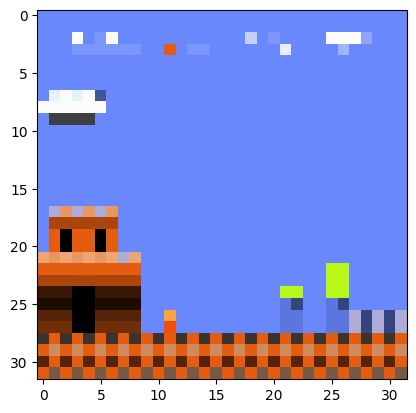

1/1 [==============================] - 0s 28ms/step
Image_1260_lvl_8_Stage_3.png es una fotografía del NIVEL 8


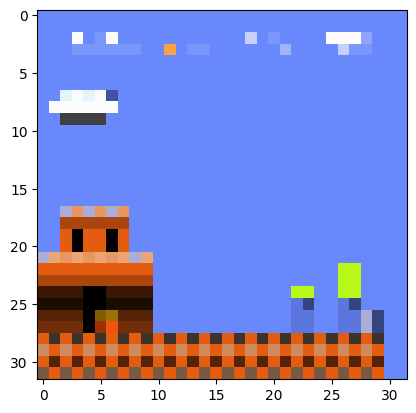

1/1 [==============================] - 0s 26ms/step
Image_0_lvl_8_Stage_2.png es una fotografía del NIVEL 8


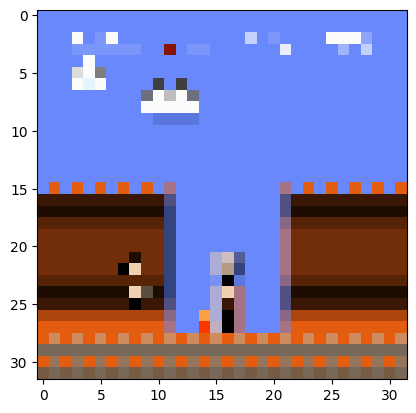

1/1 [==============================] - 0s 27ms/step
Image_1540_lvl_8_Stage_3.png es una fotografía del NIVEL 8


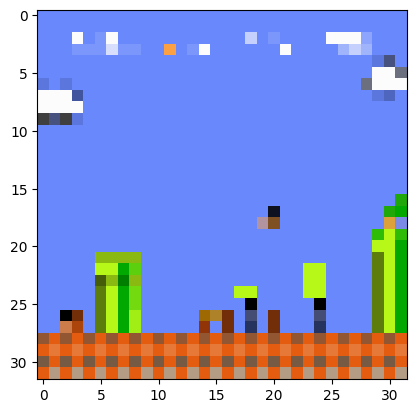

1/1 [==============================] - 0s 42ms/step
Image_1160_lvl_8_Stage_1.png es una fotografía del NIVEL 8


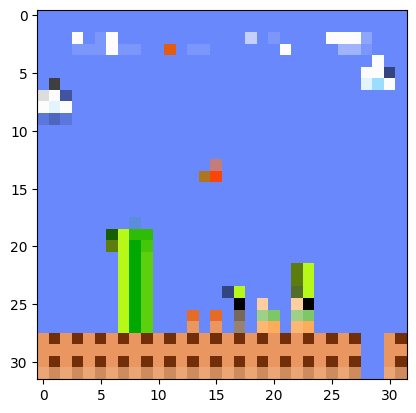

1/1 [==============================] - 0s 25ms/step
Image_600_lvl_8_Stage_1.png es una fotografía del NIVEL 8


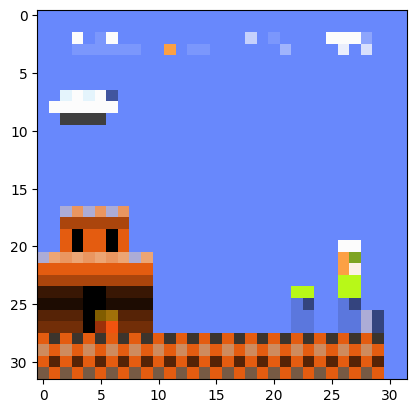

1/1 [==============================] - 0s 29ms/step
Image_100_lvl_8_Stage_2.png es una fotografía del NIVEL 8


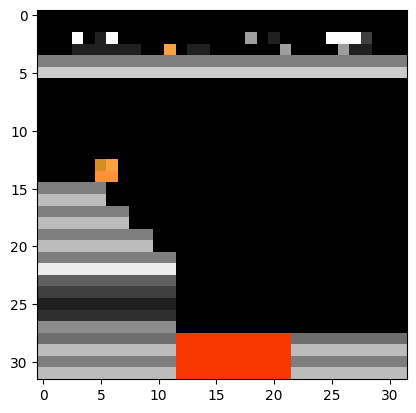

1/1 [==============================] - 0s 25ms/step
Image_0_lvl_8_Stage_4.png es una fotografía del NIVEL 8


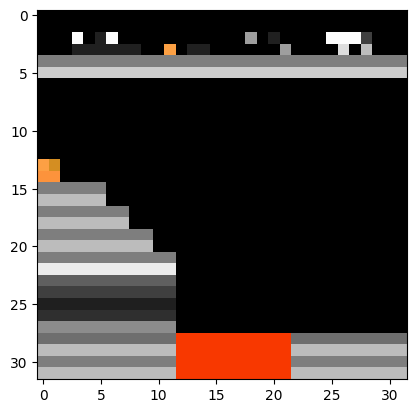

1/1 [==============================] - 0s 27ms/step
Image_1540_lvl_8_Stage_4.png es una fotografía del NIVEL 8


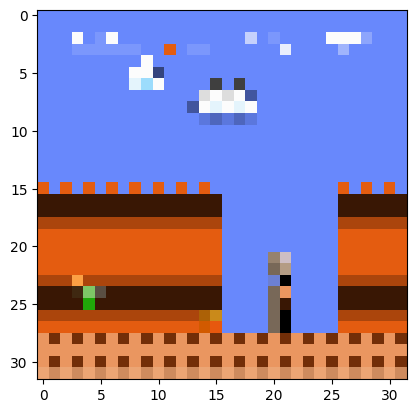

1/1 [==============================] - 0s 30ms/step
Image_1500_lvl_8_Stage_3.png es una fotografía del NIVEL 8


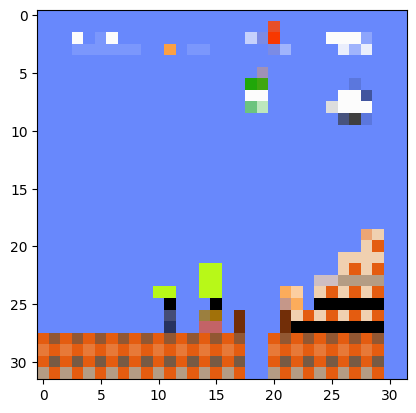

1/1 [==============================] - 0s 25ms/step
Image_1260_lvl_8_Stage_2.png es una fotografía del NIVEL 8


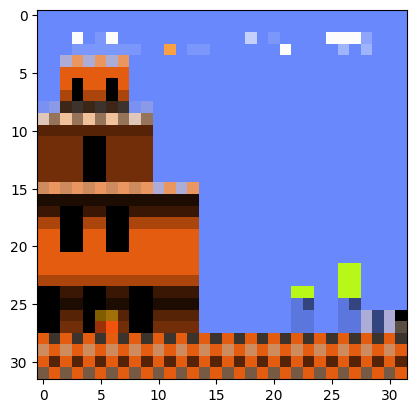

1/1 [==============================] - 0s 33ms/step
Image_60_lvl_8_Stage_1.png es una fotografía del NIVEL 8


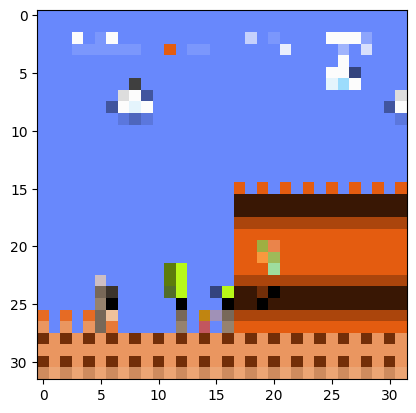

1/1 [==============================] - 0s 34ms/step
Image_1160_lvl_8_Stage_3.png es una fotografía del NIVEL 8


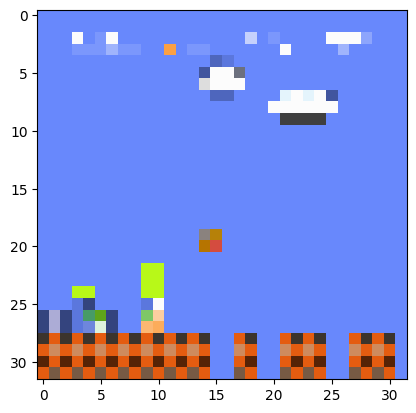

1/1 [==============================] - 0s 29ms/step
Image_680_lvl_8_Stage_1.png es una fotografía del NIVEL 8


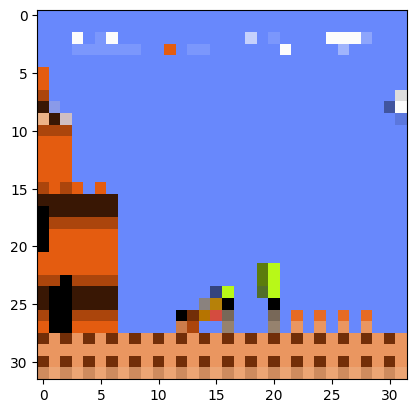

1/1 [==============================] - 0s 25ms/step
Image_220_lvl_8_Stage_1.png es una fotografía del NIVEL 8


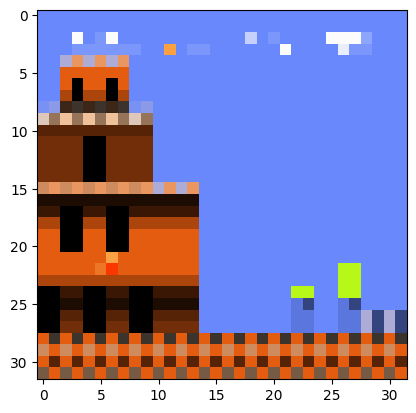

1/1 [==============================] - 0s 31ms/step
Image_1500_lvl_8_Stage_1.png es una fotografía del NIVEL 8


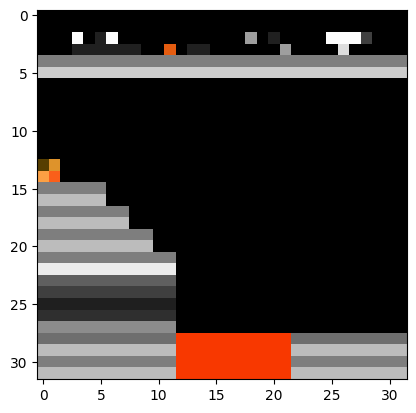

1/1 [==============================] - 0s 26ms/step
Image_280_lvl_8_Stage_4.png es una fotografía del NIVEL 8


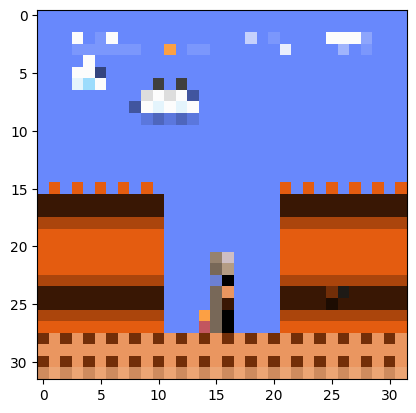

1/1 [==============================] - 0s 32ms/step
Image_1620_lvl_8_Stage_3.png es una fotografía del NIVEL 8


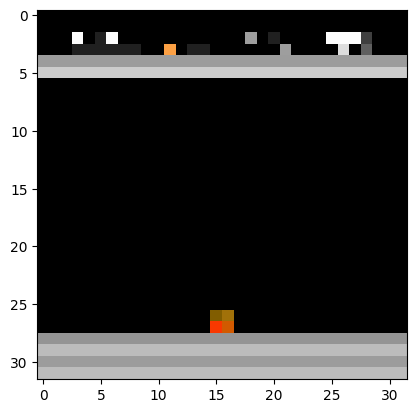

1/1 [==============================] - 0s 28ms/step
Image_680_lvl_8_Stage_4.png es una fotografía del NIVEL 8


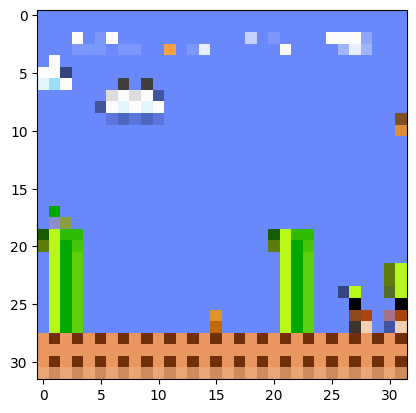

1/1 [==============================] - 0s 29ms/step
Image_1360_lvl_8_Stage_1.png es una fotografía del NIVEL 8


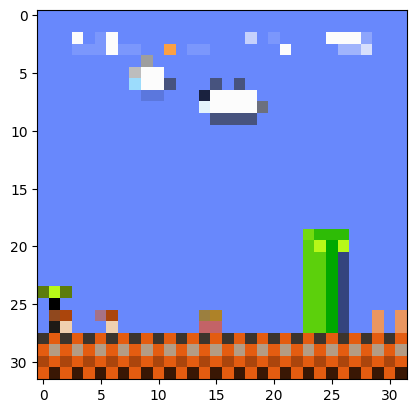

1/1 [==============================] - 0s 27ms/step
Image_500_lvl_8_Stage_1.png es una fotografía del NIVEL 8


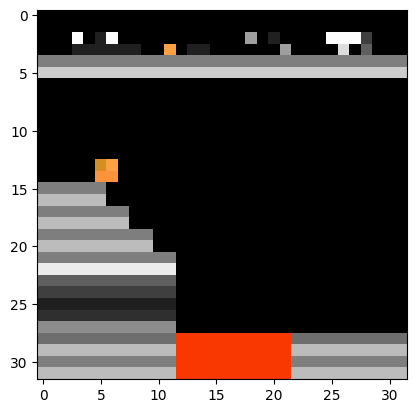

1/1 [==============================] - 0s 32ms/step
Image_60_lvl_8_Stage_4.png es una fotografía del NIVEL 8


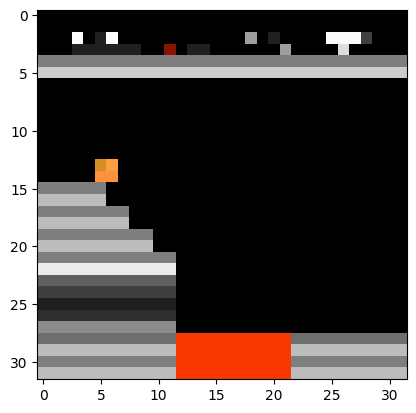

1/1 [==============================] - 0s 27ms/step
Image_80_lvl_8_Stage_4.png es una fotografía del NIVEL 8


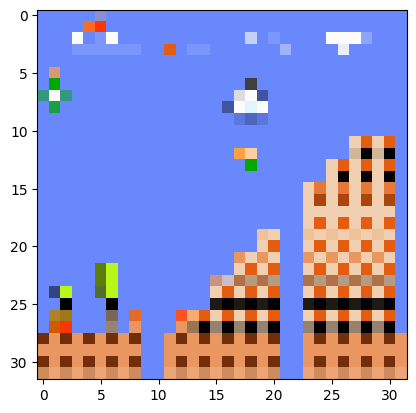

1/1 [==============================] - 0s 26ms/step
Image_620_lvl_8_Stage_2.png es una fotografía del NIVEL 8


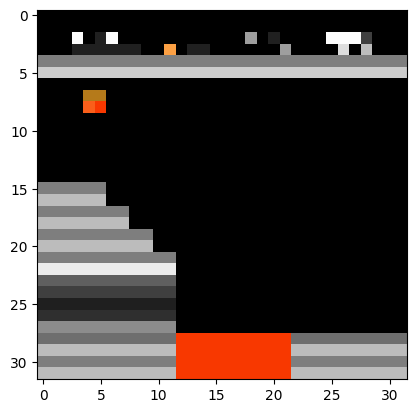

1/1 [==============================] - 0s 30ms/step
Image_920_lvl_8_Stage_4.png es una fotografía del NIVEL 8


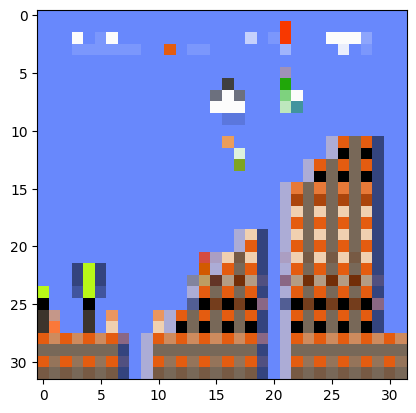

1/1 [==============================] - 0s 26ms/step
Image_1520_lvl_8_Stage_2.png es una fotografía del NIVEL 8


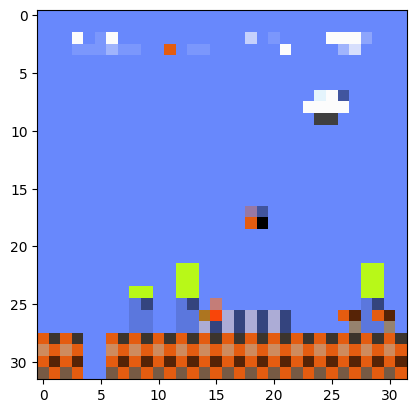

1/1 [==============================] - 0s 43ms/step
Image_840_lvl_8_Stage_1.png es una fotografía del NIVEL 8


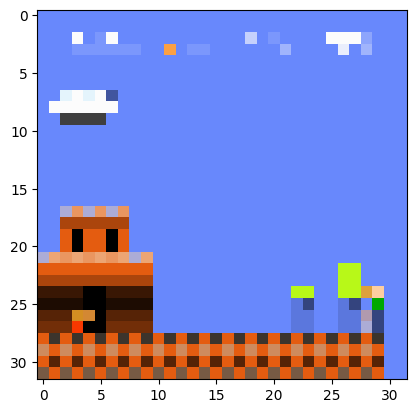

1/1 [==============================] - 0s 26ms/step
Image_780_lvl_8_Stage_2.png es una fotografía del NIVEL 8


In [ ]:
nivel8_dir = "/content/test/nivel8"

resultados_nivel8 = []
for i in os.listdir(nivel8_dir):
  img = image.load_img(nivel8_dir + "//" + i, target_size=(32,32))
  plt.imshow(img)
  plt.show()

  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  images = np.vstack([x])
  valor_predicho = modelo.predict(images)

  if valor_predicho == 0:
    print(i + " es una fotografía del NIVEL 1")
    resultados_nivel8.append(1)
  else:
    print(i + " es una fotografía del NIVEL 8")
    resultados_nivel8.append(8)

Finalmente, se define una función que calcula la estadística de acierto de predicción de cada nivel. Para esto, se toma la cantidad de imágenes predichas por la red para cada caso y se revisa cuántas fueron correctamente pronosticadas como Nivel 1 y Nivel 8.

In [ ]:
# Estadísticas de predicción para el Nivel
def aciertos_nivel(nivel:int, vector_resultados:list):
  imagenes_correctas = 0
  imagenes_totales = len(vector_resultados)
  if nivel == 1:
    imagenes_correctas = vector_resultados.count(1)
  else:
    imagenes_correctas = vector_resultados.count(8)

  porcentaje_acierto_nivel = imagenes_correctas/imagenes_totales
  return str(porcentaje_acierto_nivel)

print("El porcentaje de acierto para el Nivel 1 es " + aciertos_nivel(1,resultados_nivel1))
print("El porcentaje de acierto para el Nivel 8 es " + aciertos_nivel(8,resultados_nivel8))

El porcentaje de acierto para el Nivel 1 es 1.0
El porcentaje de acierto para el Nivel 8 es 0.9972222222222222


### Análisis de resultados

Se obtuvo para los datos del Nivel 1, un porcentaje de acierto de 1.0, es decir, el 100% de las imágenes de prueba que eran del Nivel 1 fueron acertadamente predichas como tal. Por otro lado, para el conjunto de prueba del Nivel 8, el porcentaje de acierto fue de 0.9972222222. Esto indica que, de las 360 imágenes que se le pasaron a la red en este caso, sólo falló en identificar 1.

A partir de los resultados anteriores, se puede concluir que el entrenamiento de la red fue eficiente y satisfactorio. De esta manera, el modelo generado después del entrenamiento es suficientemente efectivo para predecir y distinguir adecuadamente imágenes de diferentes escenas dentro de los Niveles 1 y 8. Adicionalmente, cabe resaltar que el comportamiento es muy bueno dado que el conjunto de prueba tiene un tamaño de 47.6% del conjunto de entrenamiento, que en comparación es bastante grande.

# Punto 2 - Reentrenamiento de YOLOv8

### Descarga y verificación del funcionamiento de YOLOv8

Primero, se prueba utilizando los comandos de YOLOv8 desde el host de Linux soportado por el Notebook de Google Colab. Se comprueba el uso de CPU y se comprueba el entrenamiento por defecto con fotos tomadas de internet.

In [ ]:
!nvidia-smi

Mon Jul  3 07:25:28 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8    12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install ultralytics

from IPython import display
display.clear_output()
!yolo mode=checks

WARNING ⚠️ 'yolo mode=checks' is deprecated. Use 'yolo checks' instead.
Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.2/78.2 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

Se comprueba el funcionamiento del modelo YOLOv8 con una foto aleatoria tomada de internet.

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source="https://blog.mascotaysalud.com/wp-content/uploads/2020/09/tran-mau-tri-tam-7QjU_u2vGDs-unsplash.jpg"

/content
100% 6.23M/6.23M [00:00<00:00, 226MB/s]
Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients

100% 62.1k/62.1k [00:00<00:00, 125kB/s] 
image 1/1 /content/tran-mau-tri-tam-7QjU_u2vGDs-unsplash.jpg: 416x640 1 cat, 2 dogs, 2 couchs, 59.8ms
Speed: 13.4ms preprocess, 59.8ms inference, 17.6ms postprocess per image at shape (1, 3, 416, 640)
Results saved to runs/detect/predict


/content


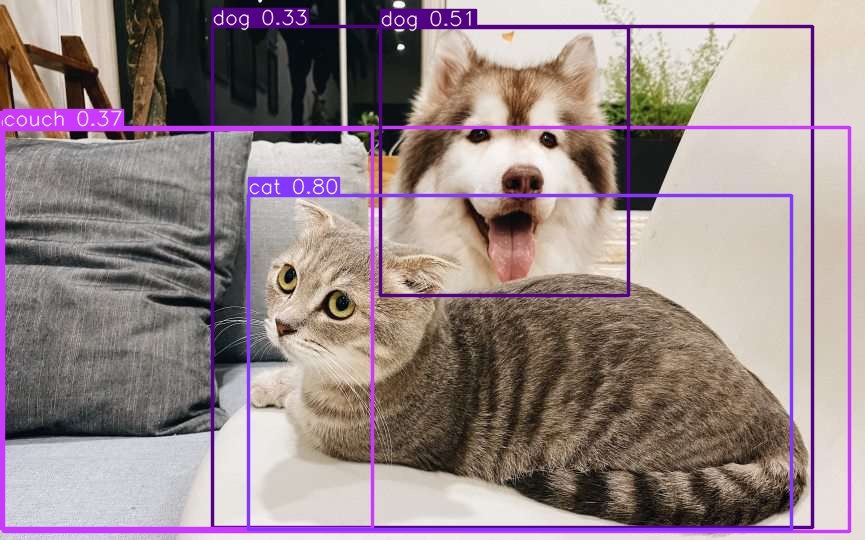

In [ ]:
%cd {HOME}
Image(filename="/content/runs/detect/predict/tran-mau-tri-tam-7QjU_u2vGDs-unsplash.jpg", height=600)

Se puede apreciar que YOLOv8 detecta con un cierto porcentaje de probabilidad la presencia de objetos en una imagen. En este caso, detecta acertadamente la presencia de un gato, un perro y dos sillones/sofás. Sin embargo, comete un error puesto que determina la presencia de dos perros, cuando en realidad solamente hay uno.

### Funcionamiento del servidor Python de YOLOv8

Ahora, se prueba con el servidor de Python. Efectivamente, el resultado es el mismo.

In [ ]:
model = YOLO(f"{HOME}/yolov8n.pt")
results = model.predict(source = "https://media.roboflow.com/notebooks/examples/dog.jpeg", conf=0.25)


100%|██████████| 104k/104k [00:00<00:00, 20.4MB/s]
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 70.2ms
Speed: 2.2ms preprocess, 70.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 384)


### Proceso de reentrenamiento

Para realizar el reentrenamiento, se tomó un conjunto de 90 fotos de cuatro instrumentos del salón de laboratorio: un multímetro, una fuente, un osciloscopio y un generador de señales. Se tomaron aproximadamente 20 fotos de cada instrumento desde diferentes ángulos. Además, en algunas fotos se incluyeron otros instrumentos que se encontraban al lado, de forma que en una foto donde el sujeto principal es la fuente, se puede apreciar en ocasiones un poco del osciloscopio, por ejemplo.

Las fotos tomadas se pueden consultar en el repositorio de Github: https://github.com/n-rincon4/Taller4_LearningModels/tree/main/Punto%202, dentro de la carpeta "Train Data", que contiene 78 de las 90 fotos tomadas.

Se siguió el paso a paso del tutorial de subir las fotos a Roboflow y realizar el proceso de etiquetado con cuatro clases. Después de realizar el proceso de entrenamiento de YOLOv8, se descargó el dataset del proyecto de Roboflow. Posterior a la ejecución en el entorno de Jupyter se elimina la línea de código con la información del API Key por cuestiones de privacidad.

In [ ]:
!pip install roboflow

from roboflow import Roboflow
# Eliminada línea con información del API key
project = rf.workspace("universidad-de-los-andes-5lnz1").project("yolov8-retraining")
dataset = project.version(1).download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics<=8.0.20 is required but found version=8.0.124, to fix: `pip install ultralytics<=8.0.20`


Extracting Dataset Version Zip to YOLOv8-Retraining-1 in yolov8:: 100%|██████████| 238/238 [00:00<00:00, 2128.75it/s]


A continuación, se ejecuta el entrenamiento con el dataset descargado. Se realizan 50 épocas para el modelo. El resultado es un nuevo modelo basado en YOLOv8 que tiene las siguientes métricas:

*  **mAP:** 92.9%
*  **Precisión:** 88.3%
*  **Recall:** 77.7%
*  **Tiempo de Entrenamiento:** 6 minutos

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=50 imgsz=800

/content
Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/YOLOv8-Retraining-1/data.yaml, epochs=50, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False

In [ ]:
!ls {HOME}/runs/detect/train2/

args.yaml					    R_curve.png
confusion_matrix_normalized.png			    results.csv
confusion_matrix.png				    results.png
events.out.tfevents.1688369382.8f93f6a2ac48.2970.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
labels_correlogram.jpg				    train_batch2.jpg
labels.jpg					    val_batch0_labels.jpg
P_curve.png					    val_batch0_pred.jpg
PR_curve.png					    weights


### Resultados del Reentrenamiento

Se extrae de los resultados generados la matriz de confusión del entrenamiento de datos. En esta se puede apreciar la probabilidad de acierto contra predicción del modelo para cada una de las clases planteadas.

De esta manera, se tienen las siguientes probabilidades:
* **Fuente:** 3/9 = 33.3%
* **Generador:** 4/9 = 44.4%
* **Multímetro:** 5/9 = 55.6%
* **Osciloscopio:** 9/9 = 100%
* **Fondos:** 1/9 = 11.1%

Adicionalmente, se tienen las probabilidades de error siguientes:
* **Fuente-Fondo:** 2/9 = 22.2%
* **Generador-Fondo:** 2/9 = 22.2%
* **Osciloscopio-Fondo:** 1/9 = 11.1%
* **Fondo-Generador:** 1/9 = 11.1%
* **Fondo-Osciloscopio:** 1/9 = 11.1%

La implicación de estos resultados es que, en promedio, cuando el modelo prediga que un objeto es una fuente, lo será en el 33.3% de los casos. Lo mismo para las demás probabilidades de acierto. De esta manera, el objeto mejor entrenado (el que más detectará de forma acertada) será el osciloscopio, pues la matriz sugiere que siempre que haya un osciloscopio, este será detectado y correctamente clasificado.

Por otro lado, la implicación de las probabilidades de error consisten en la confusión de objetos entre sí. En este caso, si el modelo predice que hay una fuente, en el 22.2% de los casos, en realidad será un fondo. Lo mismo ocurre para las demás parejas en donde el primer nombre es el predicho por el modelo y el segundo es el real.

/content


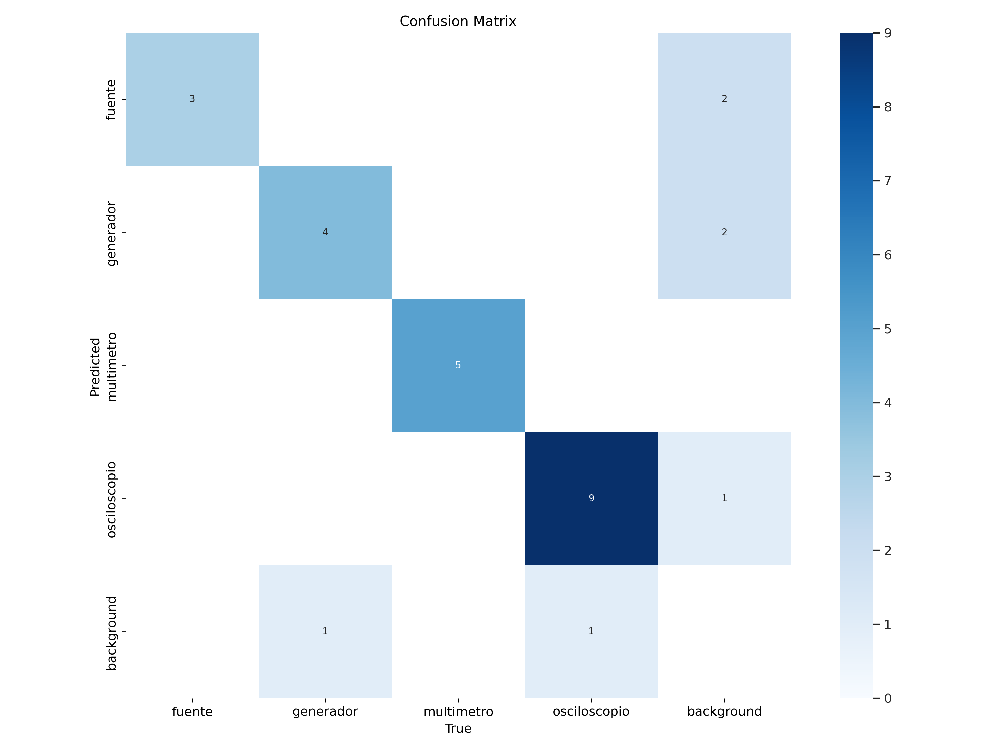

In [ ]:
%cd {HOME}
Image(filename=f"{HOME}/runs/detect/train2/confusion_matrix.png", width=600)

En segundo lugar, se extraen las gráficas de convergencia de las funciones de pérdida y error. Estas son separadas en los resultados para el conjunto de datos de entrenamiento y el conjunto de validación. Esto debido a que el modelo de YOLOv8 en Roboflow automáticamente separa las 78 imágenes en tres conjuntos: Entrenamiento, Prueba y Validación. Las primeras son para generar el modelo, las segundas para probar que sea correcto y las terceras para calcular métricas de desempeño adecuado.

Se puede apreciar que para el conjunto de entrenamiento, las funciones de pérdida tienden asintóticamente a cero y la función de precisión y recall tienden a converger y estabilizarse. Por otro lado, para el conjunto de validación, lo mismo ocurre con la métrica mAP y con las funciones de pérdida. Sin embargo, para este último conjunto, la convergencia no es suave puesto que hay muchos picos y valles en la evolución de las épocas. Sin embargo, los resultados tienden a ser suficientemente buenos como para que las predicciones sean correctas en su mayoría.

/content


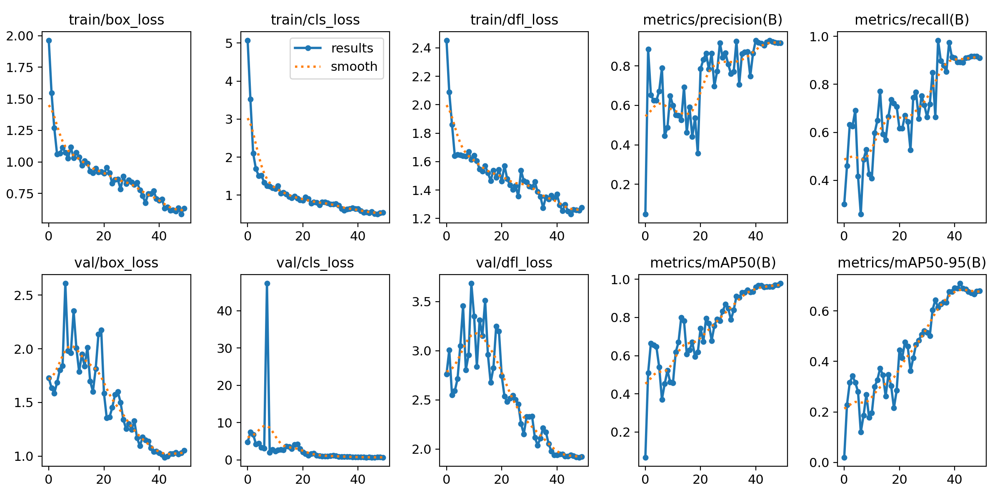

In [ ]:
%cd {HOME}
Image(filename=f"{HOME}/runs/detect/train2/results.png", width=600)

In [ ]:
%cd {HOME}
!yolo task=detect mode=val model={HOME}/runs/detect/train2/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients
val: Scanning /content/YOLOv8-Retraining-1/valid/labels.cache... 15 images, 0 backgrounds, 0 corrupt: 100% 15/15 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  2.24it/s]
                   all         15         23      0.915      0.892      0.967      0.709
                fuente         15          3          1      0.961      0.995       0.63
             generador         15          5      0.776      0.706      0.898      0.607
            multimetro         15          5      0.944          1      0.995      0.825
          osciloscopio         15         10      0.938        0.9      0.978      0.775
Speed: 0.3ms preprocess, 17.7ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/val


A continuación, se usó el modelo para predicción. Se utilizaron los conjuntos de imágenes que el modelo ejecutado generó dentro del entorno de la GPU.

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train2/weights/best.pt conf=0.25 source={dataset.location}/test/images

/content
Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients

image 1/9 /content/YOLOv8-Retraining-1/test/images/Fuente-20-_jpeg.rf.5f82c9b0cf263139261eaa4c7a2f9359.jpg: 800x800 1 fuente, 2 osciloscopios, 25.3ms
image 2/9 /content/YOLOv8-Retraining-1/test/images/Fuente-3-_jpeg.rf.036d4683cc1f9629dfcbd47afb9c8447.jpg: 800x800 1 fuente, 1 osciloscopio, 24.6ms
image 3/9 /content/YOLOv8-Retraining-1/test/images/Fuente-5-_jpeg.rf.3675b870081b413060aa47b7a245e17f.jpg: 800x800 1 fuente, 24.6ms
image 4/9 /content/YOLOv8-Retraining-1/test/images/Generador-7-_jpeg.rf.8a01e82366dd253ffd230c1f97dc56f2.jpg: 800x800 1 generador, 1 osciloscopio, 22.3ms
image 5/9 /content/YOLOv8-Retraining-1/test/images/Multimetro-18-_jpeg.rf.06f11d45481e8b16993636428d199cd8.jpg: 800x800 1 fuente, 1 multimetro, 22.3ms
image 6/9 /content/YOLOv8-Retraining-1/test/images/Multimetro-4-_jpeg.rf.e5d2a2a1cbd27e76361a069dd0

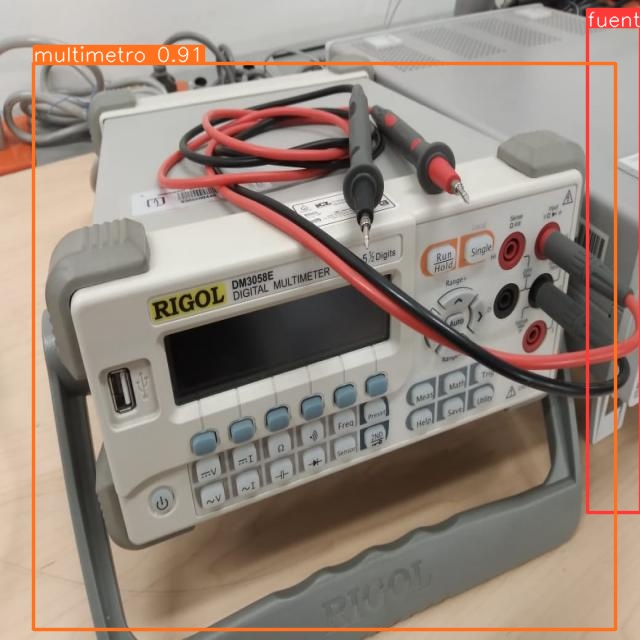

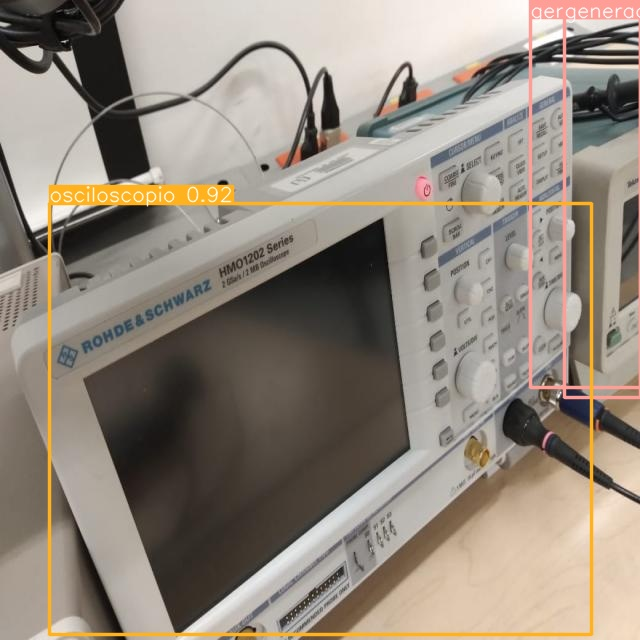

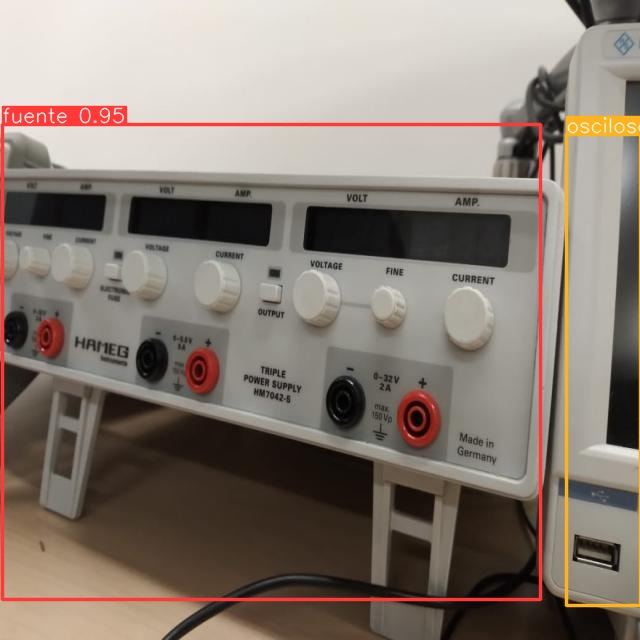

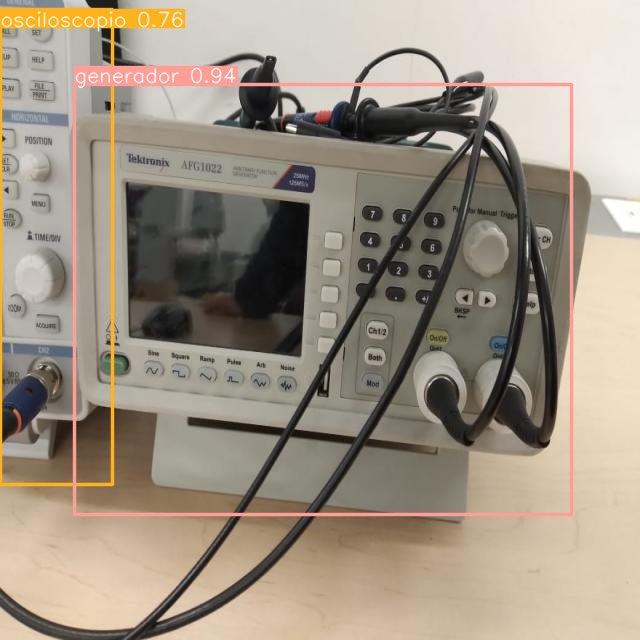

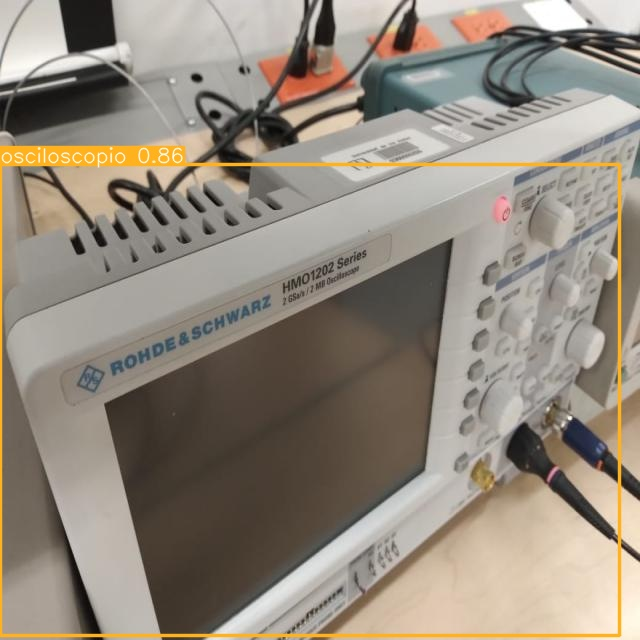

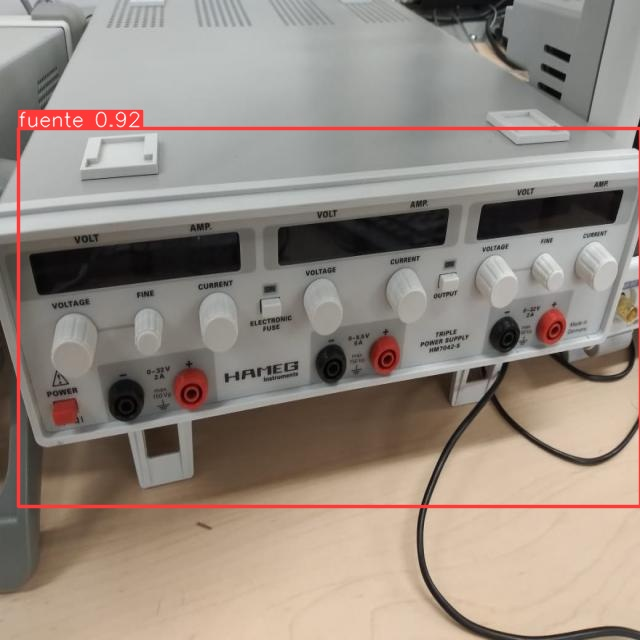

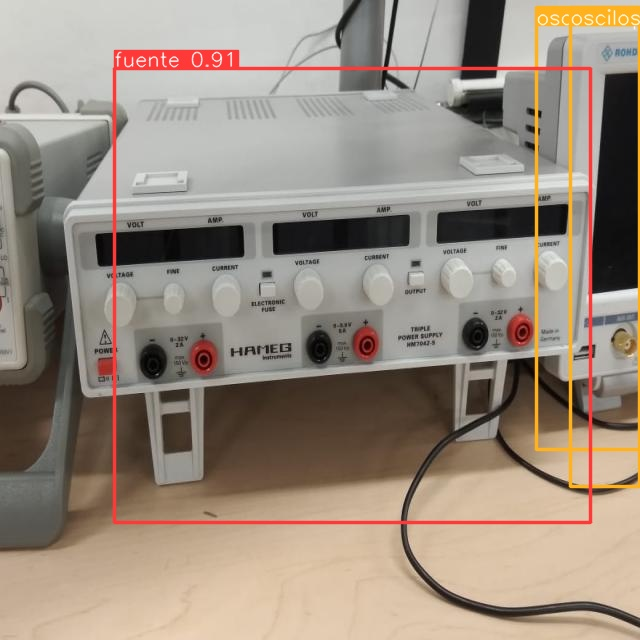

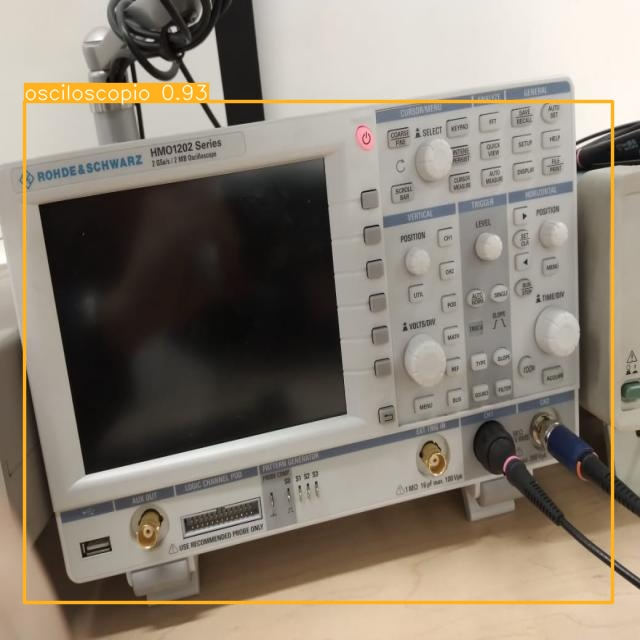

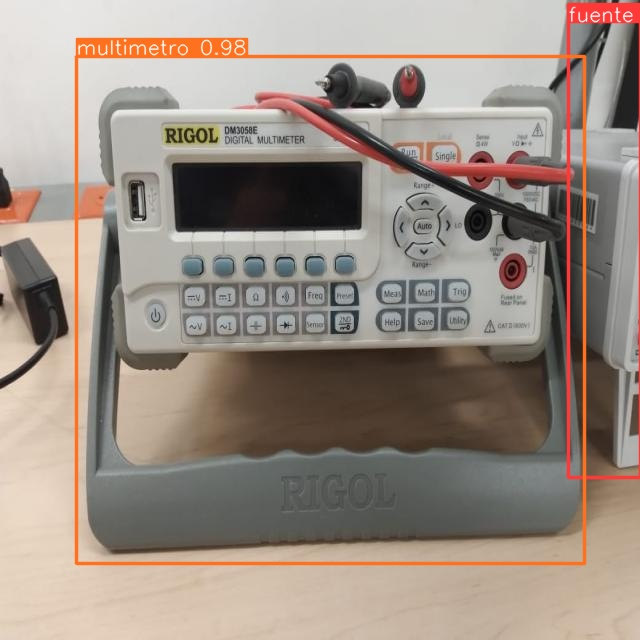

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f"{HOME}/runs/detect/predict2/*.jpg"):
  display(Image(filename=image_path, width=600))
  print("\n")

Se puede apreciar que acierta en la identificación de casi todas las fotos, excepto en dos. En la segunda foto identifica dos generadores en la parte lateral derecha, aunque sólo hay uno. Adicionalmente, en la séptima imagen identifica también dos osciloscopios cuando sólo hay uno. En el siguiente paso, se corre el modelo para los datos de validación.

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train2/weights/best.pt conf=0.25 source={dataset.location}/valid/images

/content
Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients

image 1/15 /content/YOLOv8-Retraining-1/valid/images/Fuente-16-_jpeg.rf.0034244ff2a8f9b3408a8fde8d0e4e87.jpg: 800x800 1 fuente, 1 multimetro, 1 osciloscopio, 31.3ms
image 2/15 /content/YOLOv8-Retraining-1/valid/images/Fuente-19-_jpeg.rf.62d6bf2acf27a85c6aa577eec89e6353.jpg: 800x800 1 fuente, 24.7ms
image 3/15 /content/YOLOv8-Retraining-1/valid/images/Generador-6-_jpeg.rf.bd8b78f5532d52d38b9b27e313c9e294.jpg: 800x800 1 generador, 1 osciloscopio, 24.7ms
image 4/15 /content/YOLOv8-Retraining-1/valid/images/Multimetro-15-_jpeg.rf.e72677781c39ccaf4b5c3a6fa562f50c.jpg: 800x800 1 multimetro, 24.7ms
image 5/15 /content/YOLOv8-Retraining-1/valid/images/Multimetro-17-_jpeg.rf.0aa8d68a7806423d0c845b8e2f04cc3e.jpg: 800x800 1 generador, 1 multimetro, 24.7ms
image 6/15 /content/YOLOv8-Retraining-1/valid/images/Multimetro-3-_jpeg.rf.62d8

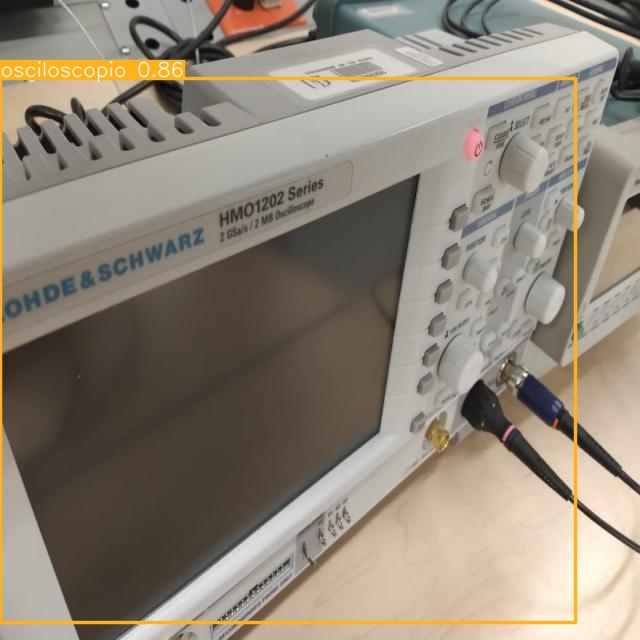

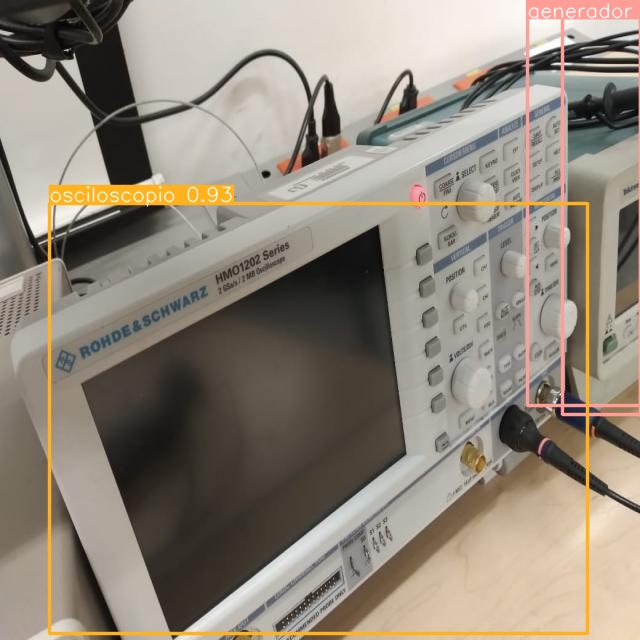

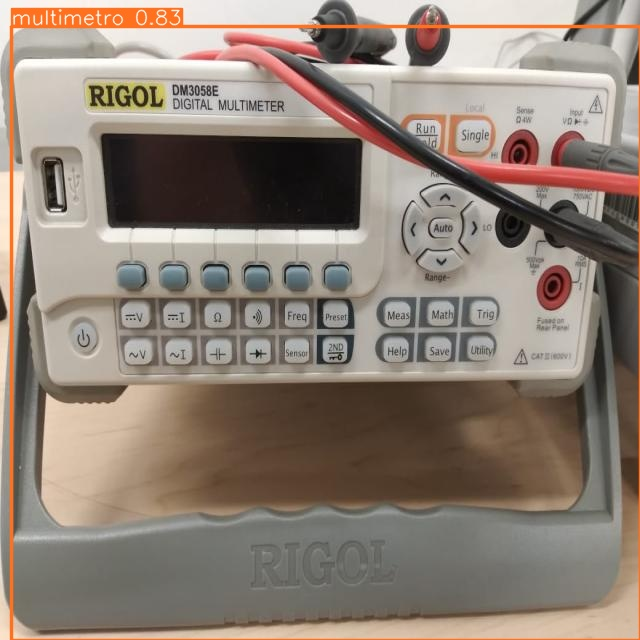

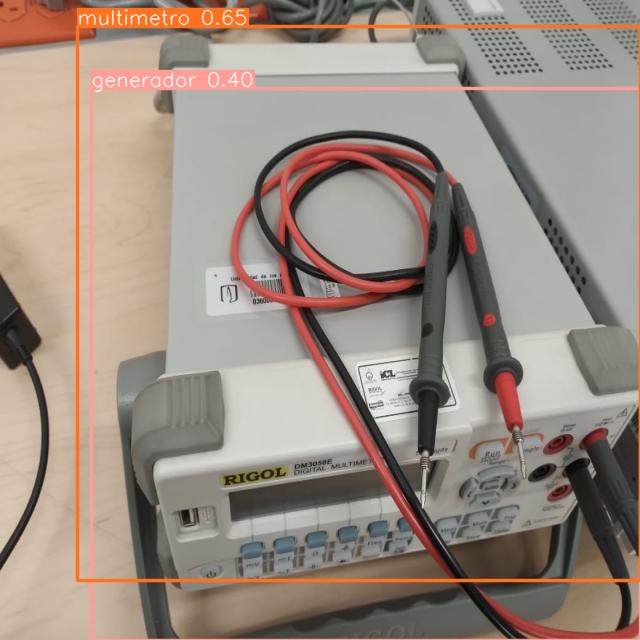

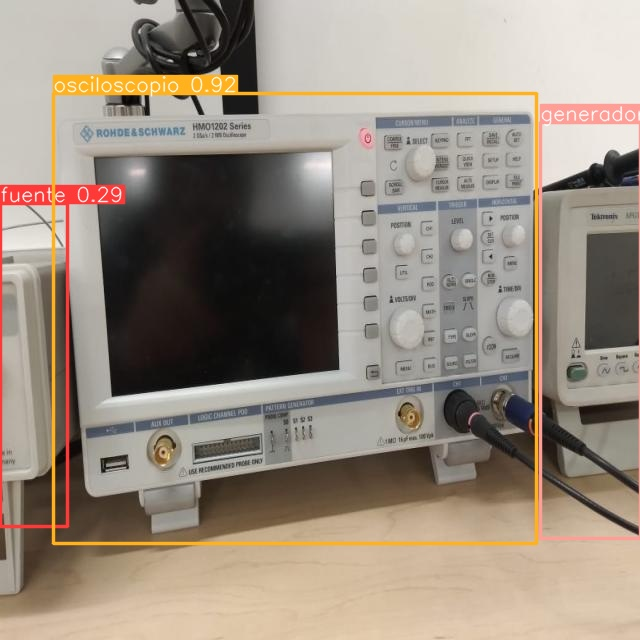

...

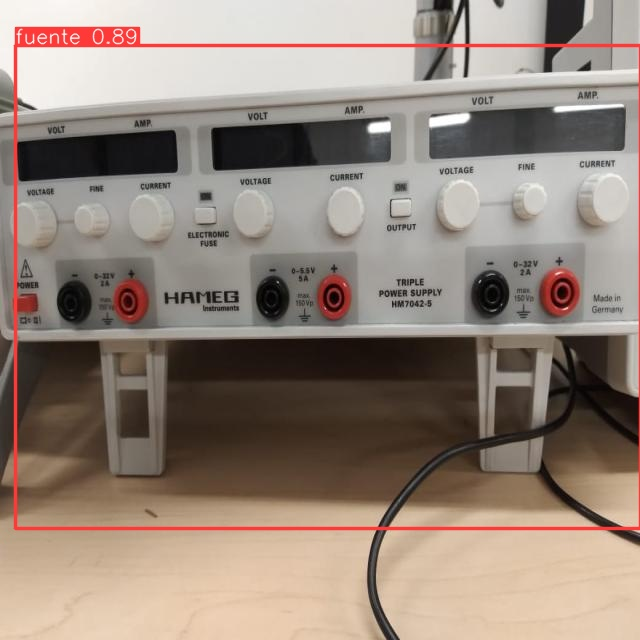

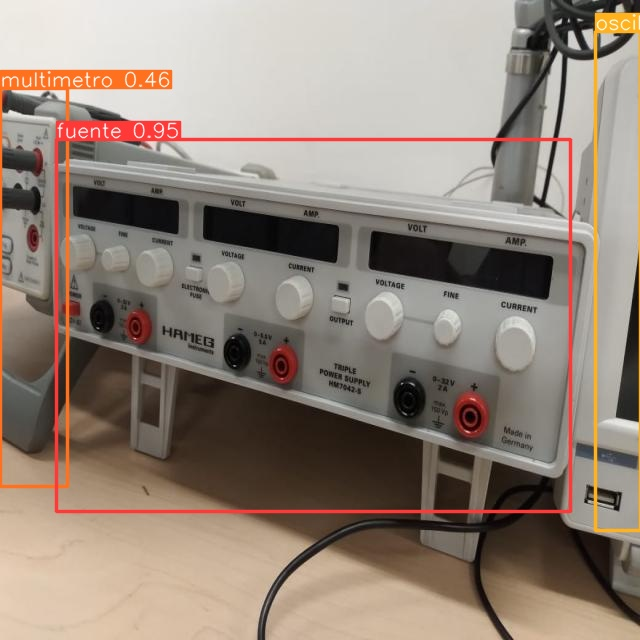

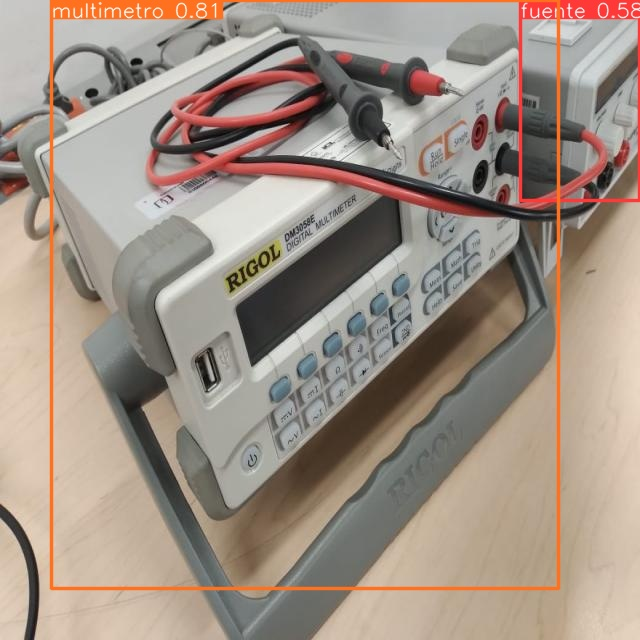

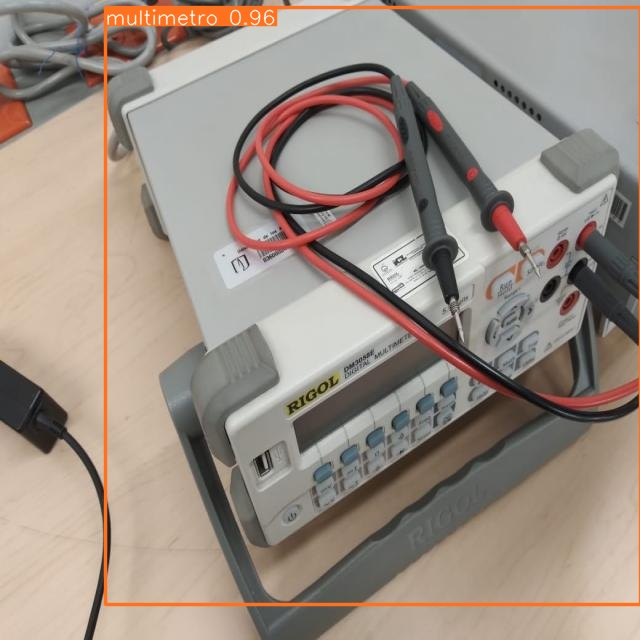

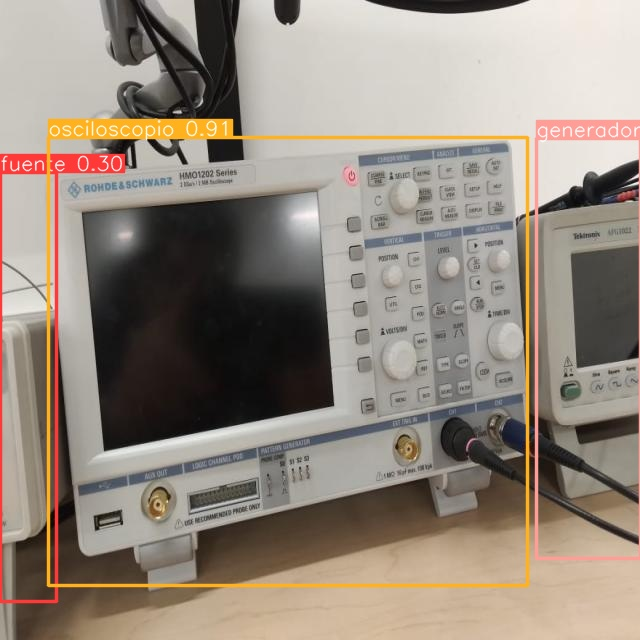

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f"{HOME}/runs/detect/predict3/*.jpg"):
  display(Image(filename=image_path, width=600))
  print("\n")

Los resultados son satisfactorios igualmente, salvo por la segunda y cuarta imagen. En la segunda, identifica dos generadores aunque sólo hay uno. En la cuarta, ocurre algo más interesante y es que a un mismo objeto lo cataloga como Multímetro y como Generador. Esto se debe a que en las fotos tomadas para el entrenamiento, se pueden apreciar los cables puestos encima tanto del multímetro como del generador. En consecuencia, al tener una fotografía mayormente superior del instrumento en cuestión, sólo se aprecian los cables por lo cual el modelo se confunde y falla al realizar la predicción. Cabe resaltar, sin embargo, que el modelo arroja que la probabilidad de que sea un multímetro (lo cual es cierto) es 65%, mientras que la probabilidad de que sea un generador es de sólo 40%.

Finalmente, se probó el modelo reentrenado para imágenes que nunca se subieron al servidor de Roboflow. Estas son las 12 fotos que no fueron subidas al modelo (recúerdese que este se generó con 78/90 imágenes en total).

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train2/weights/best.pt conf=0.25 source={HOME}/new_images

/content
Ultralytics YOLOv8.0.124 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients

image 1/12 /content/new_images/Fuente (11).jpeg: 608x800 1 fuente, 1 osciloscopio, 64.3ms
image 2/12 /content/new_images/Fuente (14).jpeg: 608x800 1 fuente, 3 osciloscopios, 18.4ms
image 3/12 /content/new_images/Fuente (4).jpeg: 608x800 1 fuente, 1 osciloscopio, 18.4ms
image 4/12 /content/new_images/Generador (10).jpeg: 608x800 1 generador, 1 osciloscopio, 18.4ms
image 5/12 /content/new_images/Generador (18).jpeg: 608x800 1 generador, 1 osciloscopio, 18.4ms
image 6/12 /content/new_images/Generador (21).jpeg: 608x800 1 generador, 18.4ms
image 7/12 /content/new_images/Multimetro (12).jpeg: 608x800 1 fuente, 1 multimetro, 18.4ms
image 8/12 /content/new_images/Multimetro (2).jpeg: 608x800 1 fuente, 1 multimetro, 18.4ms
image 9/12 /content/new_images/Multimetro (8).jpeg: 608x800 1 multimetro, 18.4ms
image 10/12 /content/new_ima

Se visualizan las imágenes resultado con los identificadores de clases. Como se puede apreciar, todos los resultados son correctos con excepción de uno, en el cual se identifican 3 osciloscopios cuando sólo hay uno. En particular, en este caso, identifica un fondo como un osciloscopio y confunde el multímetro (que se ve de forma muy limitada en el marco de la foto) con otro osciloscopio.

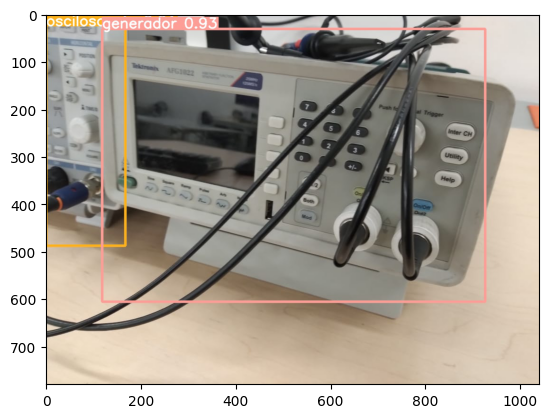

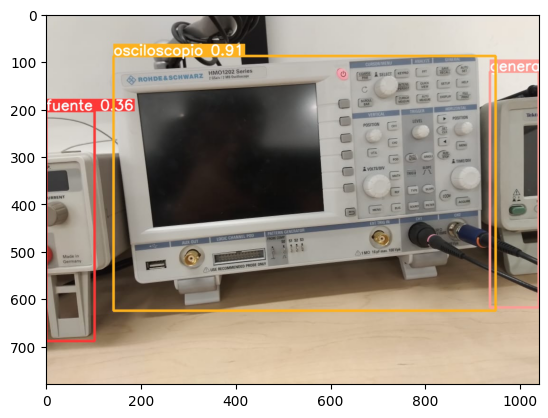

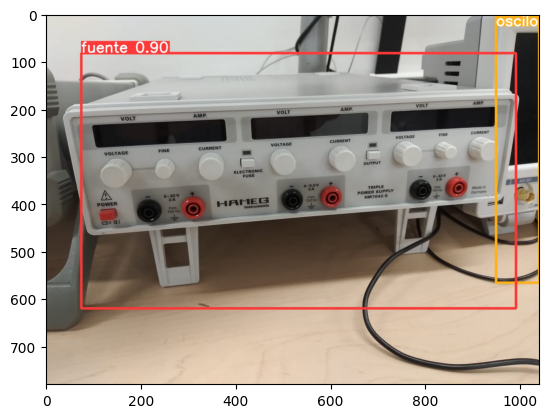

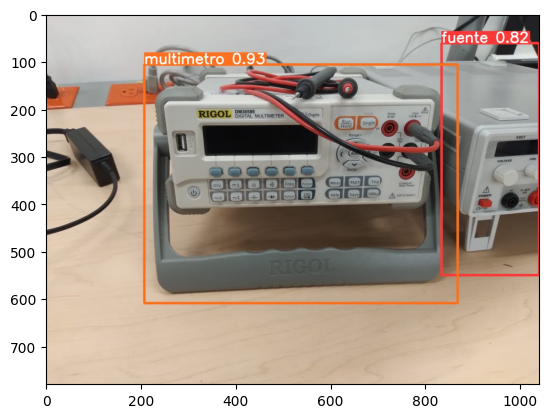

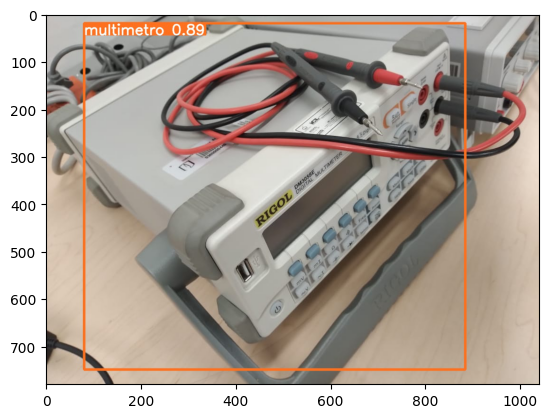

...

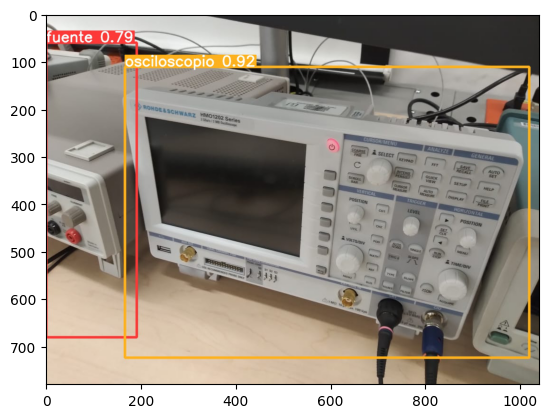

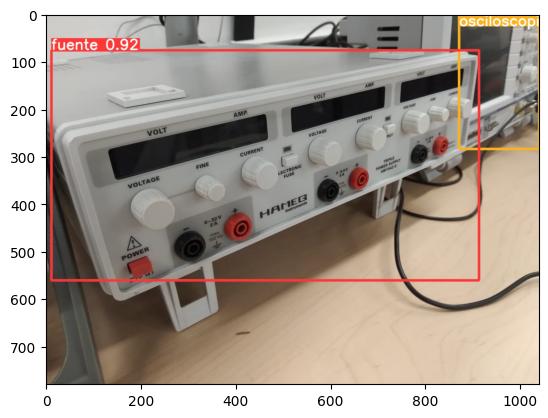

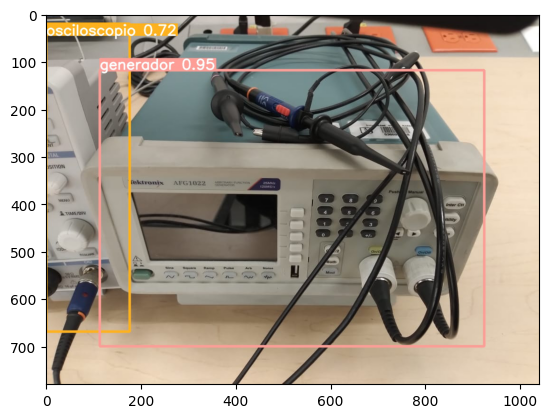

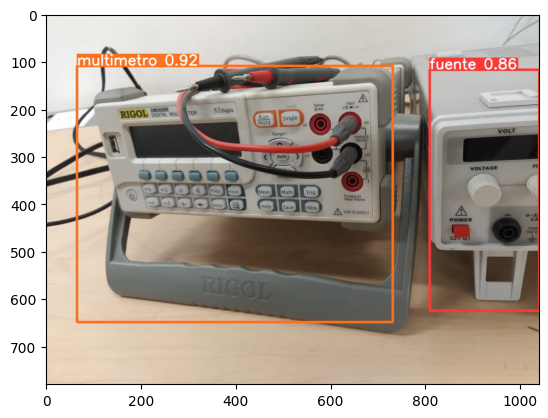

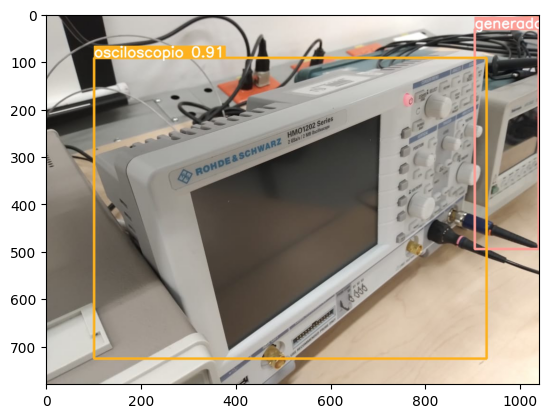

In [ ]:
new_images_dir = "/content/runs/detect/predict8"

for i in os.listdir(new_images_dir):
  img = image.load_img(new_images_dir + "//" + i)
  plt.imshow(img)
  plt.show()

A partir de los tres resultados obtenidos anteriormente, se puede establecer que el reentrenamiento de YOLOv8 fue satisfactorio. De esta manera, es capaz de identificar correctamente una mayoría de las imágenes que ingresan por parámetro. Si bien comete algunos errores como identificar más instrumentos de los que hay o confundir dos que se ven semejantemente desde arriba, en todos los casos probados, menos uno, identifica adecuadamente los instrumentos presentes y correctamente (y con alta probabilidad) el instrumento principal de la foto.

# Punto 3 - OpenPose

### Descarga e instalación de OpenPose

Inicialmente, se intentó realizar la instalación de OpenPose en colab para la realización de este punto, siguiendo los pasos descritos en el tutorial propuesto, disponible en https://blog.etereo.io/detecting-poses-with-openpose-in-google-colab-d591dc8d8609. Sin embargo, no fue posible correr la librería por diferentes errores durante la prueba.

*   Check failed: error == cudaSuccess (2 vs. 0)  out of memory
*   openpose.avi: No such file or directory

Como alternativa se optó por instalar y correr el programa a través de VisualStudio en Windows, como indican los documentos de instalación en el repositorio de OpenPose, disponible en https://github.com/CMU-Perceptual-Computing-Lab/openpose/blob/master/doc/installation/0_index.md.

Cabe aclarar que, para lograr correr el programa, se instaló Visual Studio Enterprise 2019, CMake 3.27.0, Cuda 11.7.0 y cuDNN 8.5.0. Además, durante la configuración Cmake, se añadió un parámetro que especifica la arquitectura y la capacidad computacional de acuerdo al GPU del computador (En este caso, NVIDIA GEFORCE 940mx) , para que la compilación con NVCC fuera correcta.


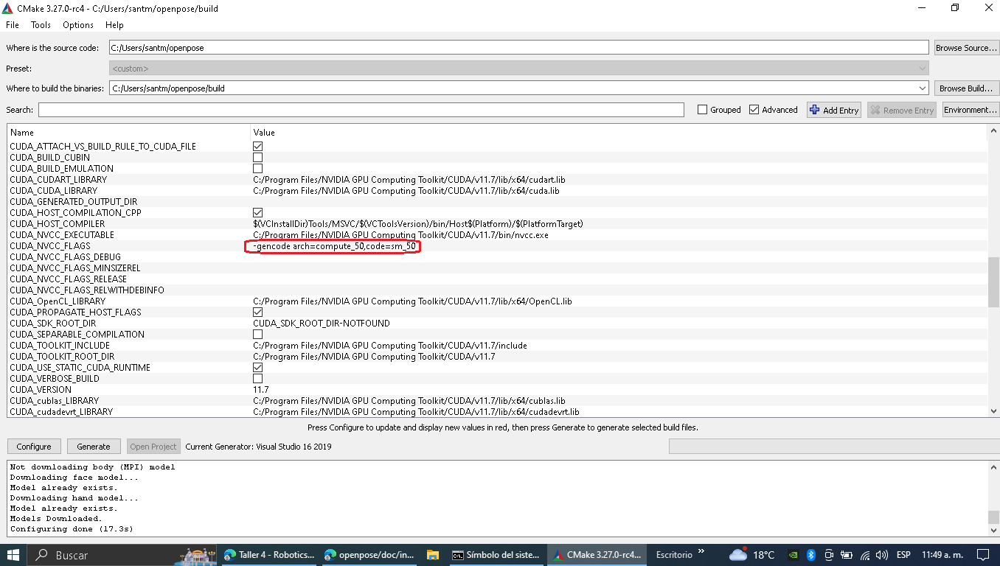



Al terminar la configuración y la generación con CMake, se procede a abrir el proyecto con VisualStudio, se compila en dicho entorno y se procede a correr el demo de OpenPose, que utiliza la cámara web del computador.

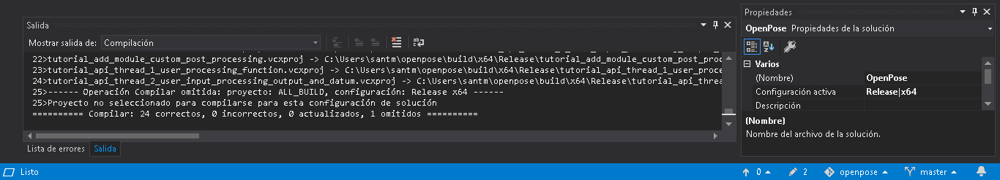



### Resultados de ejecución

Al correr el framework, se obtuvieron las siguientes imágenes:

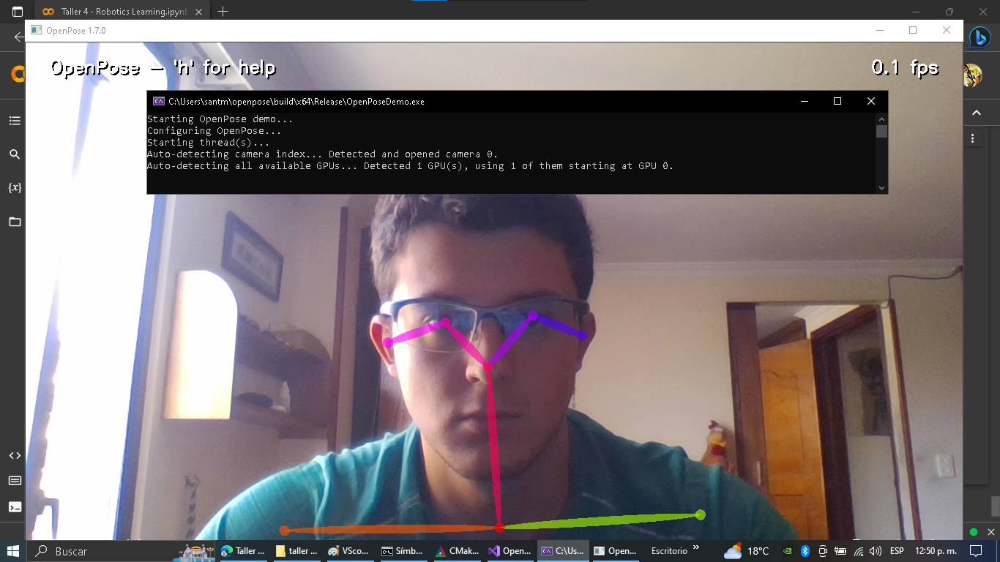

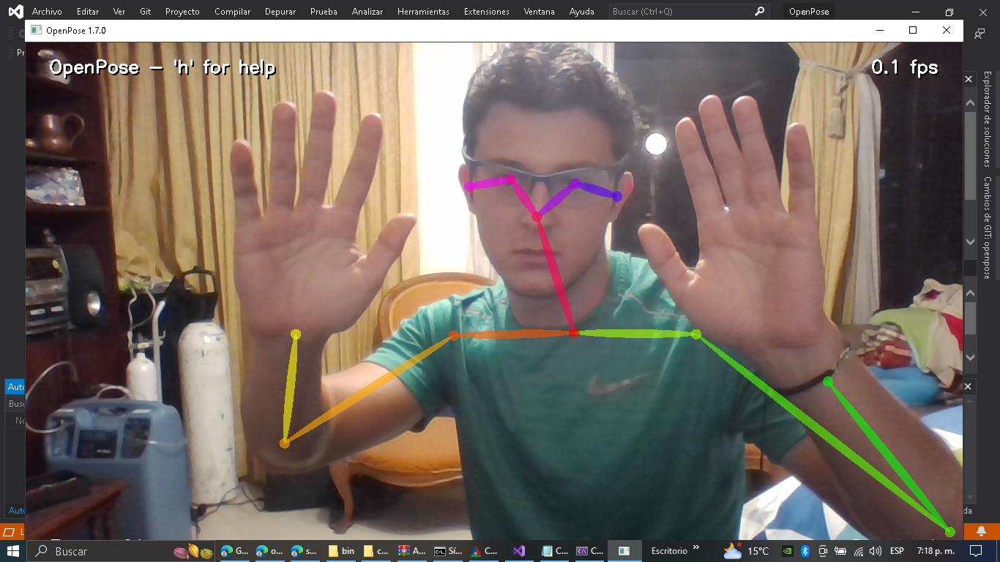

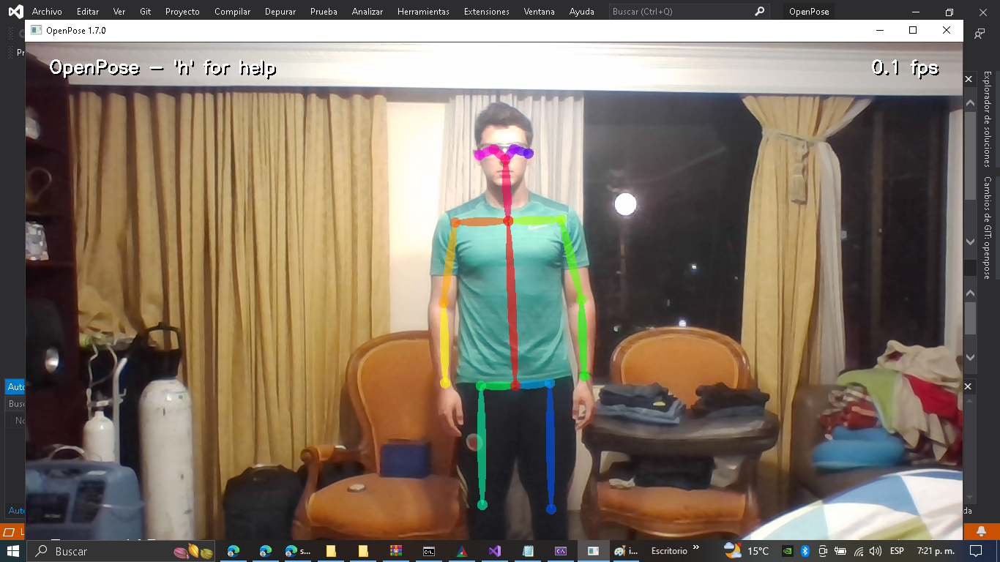

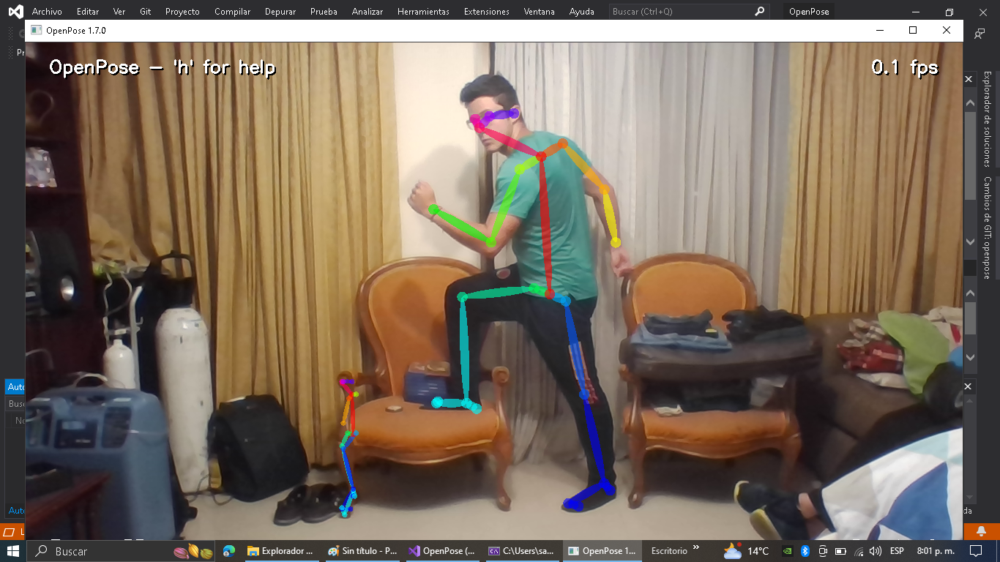

Como se puede apreciar, OpenPose utiliza la cámara web del computador y la GPU para generar un modelo de lo que identifica como partes del cuerpo humano. De esta manera, es capaz de generar sobre la imagen que recibe como parámetro un diagrama de manos, cara y pies. De esta manera, incluso cuando se hacen diferentes poses con manos o cuando el cuerpo se encuentra inclinado lateralmente, dicho modelo es correcto. Un detalle notable es que, al ser un modelo de aprendizaje, no es perfecto y esto se evidencia en la última fotografía en la cual genera un modelo para la pata de una de las sillas que se encuentran de fondo.